# Load dataset

In [ ]:
from covid_tools import *
from BERTs import *

In [ ]:
# load orginal data(COVID-19 TREC-IS 2020 task) from json file.
cv19_dc = pd.read_json('./Pythonbooks/Data/COVID/cv19_dc_test.json',lines=True,orient='records')
cv19_ws = pd.read_json('./Pythonbooks/Data/COVID/cv19_washington_state_test.json',lines=True,orient='records')
cv19_ny = pd.read_json('./Pythonbooks/Data/COVID/cv19_nyc_test.json',lines=True,orient='records')

In [ ]:
cv19_dc.head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,metadata,source,in_reply_to_status_id,...,favorite_count,favorited,retweeted,possibly_sensitive,lang,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status,withheld_in_countries
0,2020-03-20 00:00:48+00:00,1240790357245386753,1240790357245386752,"Coronavirus closures: Kohl's, TJ Maxx to close...",False,"[0, 105]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://www.einnews.com"" rel=""nofollow...",NaN,...,0,False,False,0.0,en,NaN,NaN,NaN,NaN,NaN
1,2020-03-30 14:10:04+00:00,1244627958788165634,1244627958788165632,.#IPChatChannel lets you stay informed about r...,False,"[0, 279]","{'hashtags': [{'text': 'IPChatChannel', 'indic...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://sproutsocial.com"" rel=""nofoll...",NaN,...,2,False,False,0.0,en,"{'media': [{'id': 1244627948658884609, 'id_str...",NaN,NaN,NaN,NaN
2,2020-03-21 18:05:52+00:00,1241425811174981635,1241425811174981632,Funny how some US senators knew enough about #...,False,"[0, 171]","{'hashtags': [{'text': 'coronavirus', 'indices...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,1,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN
3,2020-03-20 17:41:48+00:00,1241057365744594944,1241057365744594944,MMA orgs ignoring public health entreaties cla...,False,"[0, 278]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,...,6,False,False,NaN,en,NaN,NaN,NaN,NaN,NaN
4,2020-03-24 16:25:03+00:00,1242487604219711488,1242487604219711488,A rapid and broad response will be key to alle...,False,"[0, 240]","{'hashtags': [{'text': 'COVID19', 'indices': [...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://www.hootsuite.com"" rel=""nofol...",NaN,...,1,False,False,0.0,en,NaN,NaN,NaN,NaN,NaN


#### Build training set

In [ ]:
# Read lablled tweets from json file which contains all labels based on union of labels from all human assessors.
all_labels  = read_union_labels_from_file()

In [ ]:
# Merge original dataset with lablled dataset based on id of tweets
cv19_dc_labeled = pd.merge(cv19_dc,all_labels,on=['id'])
cv19_dc_labeled

,created_at,id,id_str,full_text,truncated,display_text_range,entities,metadata,source,in_reply_to_status_id,...,possibly_sensitive,lang,extended_entities,quoted_status_id,quoted_status_id_str,quoted_status,withheld_in_countries,Unnamed: 0,priority,categories
0,2020-03-27 09:51:04+00:00,1243475616948781058,1243475616948781056,EPA suspends enforcement of environmental laws...,False,"[0, 87]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://www.socialflow.com"" rel=""nofol...",NaN,...,0.0,en,"{'media': [{'id': 1243475615455592448, 'id_str...",NaN,NaN,NaN,NaN,11281,[Low],[Irrelevant]
1,2020-03-28 18:06:59+00:00,1243962805159591936,1243962805159591936,Tremendous hardships inflicted on families by ...,False,"[0, 105]","{'hashtags': [{'text': 'coronavirus', 'indices...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",1.243962e+18,...,0.0,en,"{'media': [{'id': 1243962534354444293, 'id_str...",NaN,NaN,NaN,NaN,10560,[Low],[Irrelevant]
2,2020-03-24 01:29:09+00:00,1242262141895200769,1242262141895200768,Social Media and Emergency Preparedness for th...,False,"[0, 126]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,...,0.0,en,NaN,NaN,NaN,NaN,NaN,6649,[Low],[Irrelevant]
3,2020-03-31 15:22:48+00:00,1245008652076974081,1245008652076974080,"March 30, 2020 | https://t.co/mv08Y8vIWT\n\nUS...",False,"[0, 280]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,...,0.0,en,"{'media': [{'id': 1245007924319137793, 'id_str...",NaN,NaN,NaN,NaN,12148,[Low],[Irrelevant]
4,2020-03-29 17:29:20+00:00,1244315720617426944,1244315720617426944,Arlington Health District Reports First Two De...,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,...,0.0,en,NaN,NaN,NaN,NaN,NaN,10702,[Low],[Irrelevant]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2499,2020-03-23 14:00:23+00:00,1242088810529382401,1242088810529382400,As the spread of COVID-19 causes high schools ...,False,"[0, 242]","{'hashtags': [{'text': 'TFAS', 'indices': [87,...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://www.hootsuite.com"" rel=""nofol...",NaN,...,0.0,en,NaN,NaN,NaN,NaN,NaN,7365,[Low],[Irrelevant]
2500,2020-03-23 09:22:33+00:00,1242018889115951104,1242018889115951104,Attackers Launch DDoS Attack on Food Delivery ...,False,"[0, 275]","{'hashtags': [{'text': 'Coronavirus', 'indices...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://dlvrit.com/"" rel=""nofollow"">d...",NaN,...,0.0,en,"{'media': [{'id': 1242018887379513344, 'id_str...",NaN,NaN,NaN,NaN,7270,[Low],[Irrelevant]
2501,2020-03-20 13:13:27+00:00,1240989832215703554,1240989832215703552,Coronavirus lockdown in the USA https://t.co/r...,False,"[0, 55]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://publicize.wp.com/"" rel=""nofoll...",NaN,...,0.0,en,"{'media': [{'id': 1240989830374461441, 'id_str...",NaN,NaN,NaN,NaN,6999,[Low],[Irrelevant]
2502,2020-03-24 13:41:12+00:00,1242446367575982083,1242446367575982080,Ford plans to use F-150 parts to start making ...,False,"[0, 182]","{'hashtags': [{'text': 'coronavirus', 'indices...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,0.0,en,NaN,NaN,NaN,NaN,NaN,6602,[Low],[Irrelevant]


In [ ]:
cv19_ws_labeled = pd.merge(cv19_ws,all_labels,on=['id'])
cv19_ws_labeled

,created_at,id,id_str,full_text,truncated,display_text_range,entities,metadata,source,in_reply_to_status_id,...,favorite_count,favorited,retweeted,possibly_sensitive,lang,extended_entities,withheld_in_countries,Unnamed: 0,priority,categories
0,2020-03-03 21:27:01+00:00,1234953449948626944,1234953449948626944,I see lots of people panicking about coronavir...,False,"[0, 273]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,1,False,False,NaN,en,NaN,NaN,650,[Low],"[Sentiment, Irrelevant]"
1,2020-03-07 07:00:28+00:00,1236184926665322497,1236184926665322496,One additional #HCoV19 genome from the Seattle...,False,"[0, 205]","{'hashtags': [{'text': 'HCoV19', 'indices': [1...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",NaN,...,1022,False,False,0.0,en,NaN,NaN,1026,[Low],"[News, ContextualInformation]"
2,2020-03-11 03:52:55+00:00,1237587281315160064,1237587281315160064,@thelastpinkcar @ByMikeBaker @sherifink Trump ...,False,"[40, 319]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",1.237564e+18,...,0,False,False,NaN,en,NaN,NaN,563,[Low],"[Discussion, Irrelevant]"
3,2020-03-12 21:23:53+00:00,1238214150620356608,1238214150620356608,How Seattle Flu Study defied federal governmen...,False,"[0, 115]","{'hashtags': [{'text': 'COVID_19', 'indices': ...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",NaN,...,1,False,False,0.0,en,NaN,NaN,1224,"[Low, Medium]","[News, Discussion, ContextualInformation]"
4,2020-02-29 22:26:03+00:00,1233881144514535430,1233881144514535424,.@EvergreenHosp in Kirkland confirms a patient...,False,"[0, 275]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://me.liveuamap.com/twilogin"" re...",NaN,...,1,False,False,0.0,en,"{'media': [{'id': 1233881142203494400, 'id_str...",NaN,2371,"[High, Low, Medium]","[News, Official, Location, EmergingThreats, Th..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2572,2020-03-20 00:03:53+00:00,1240791134479060992,1240791134479060992,Seattle institute gets multi-million-dollar fu...,False,"[0, 256]","{'hashtags': [{'text': 'Coronavirus', 'indices...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",NaN,...,46,False,False,0.0,en,NaN,NaN,789,"[Low, Medium]","[News, ContextualInformation, Hashtags]"
2573,2020-03-04 02:20:12+00:00,1235027232768192513,1235027232768192512,Amazon employee in Seattle tests positive for ...,False,"[0, 81]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://ifttt.com"" rel=""nofollow"">IFT...",NaN,...,0,False,False,0.0,en,NaN,NaN,465,"[Low, Medium]","[News, ContextualInformation]"
2574,2020-03-21 07:08:22+00:00,1241260346586755072,1241260346586755072,"@strangeharbors The hospitals, clinics, skille...",False,"[16, 299]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",1.241058e+18,...,0,False,False,NaN,en,NaN,NaN,116,[Low],"[News, Donations, ContextualInformation, Volun..."
2575,2020-03-21 05:53:40+00:00,1241241545413541888,1241241545413541888,"@luke_dawgfan I'm hopeful, but I might be over...",False,"[14, 208]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",1.241213e+18,...,1,False,False,NaN,en,NaN,NaN,2192,[Low],[Irrelevant]


In [ ]:
cv19_ny_labeled = pd.merge(cv19_ny,all_labels,on=['id'])
cv19_ny_labeled

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,metadata,source,...,retweeted,possibly_sensitive,lang,quoted_status_id,quoted_status_id_str,quoted_status,withheld_in_countries,Unnamed: 0,priority,categories
0,2020-05-03 14:57:57+00:00,1256961196525314048,1256961196525314048,"Reopening states will cause 233,000 more peopl...",False,"[0, 278]","{'hashtags': [{'text': 'NYC', 'indices': [212,...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",...,False,0.0,en,NaN,NaN,NaN,NaN,9758,[Low],[Irrelevant]
1,2020-03-27 01:39:25+00:00,1243351890508701697,1243351890508701696,@samiglee @flash__delirium @michaelbd @mtracey...,False,"[47, 322]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/android"" ...",...,False,NaN,en,NaN,NaN,NaN,NaN,2807,[Low],"[News, ThirdPartyObservation, Sentiment, Conte..."
2,2020-03-28 18:42:47+00:00,1243971816131104768,1243971816131104768,"We Met Up with Whalebone on Bleecker, and then...",False,"[0, 95]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",...,False,0.0,en,NaN,NaN,NaN,NaN,3369,[Low],[Irrelevant]
3,2020-03-28 15:43:43+00:00,1243926751073513473,1243926751073513472,‘White-Collar Quarantine’ Over Virus Spotlight...,False,"[0, 123]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/download/iphone"" r...",...,False,1.0,en,NaN,NaN,NaN,NaN,2870,[Low],[Irrelevant]
4,2020-03-29 03:17:45+00:00,1244101411899453441,1244101411899453440,The Lost Month: How a Failure to Test Blinded ...,False,"[0, 111]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",...,False,0.0,en,NaN,NaN,NaN,NaN,8537,[Low],[Irrelevant]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2497,2020-03-27 10:26:56+00:00,1243484645267779585,1243484645267779584,Trump keeps touting an unproven coronavirus tr...,False,"[0, 140]","{'hashtags': [{'text': 'chloroquine', 'indices...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com"" rel=""nofollow"">Tw...",...,False,0.0,en,NaN,NaN,NaN,NaN,3074,[Low],"[News, Sentiment, ContextualInformation, Advic..."
2498,2020-03-27 09:38:35+00:00,1243472477784858625,1243472477784858624,Despicable human being\nhttps://t.co/WVBvDmmsmm,False,"[0, 46]","{'hashtags': [], 'symbols': [], 'user_mentions...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://mobile.twitter.com"" rel=""nofo...",...,False,0.0,en,NaN,NaN,NaN,NaN,3197,"[Low, Medium]","[News, Official, Sentiment, ContextualInformat..."
2499,2020-03-27 06:38:57+00:00,1243427271551016962,1243427271551016960,"#ThisDay 1841 - ""First US steam fire engine te...",False,"[0, 63]","{'hashtags': [{'text': 'ThisDay', 'indices': [...",NaN,"{'iso_language_code': 'en', 'result_type': 're...","<a href=""http://twitter.com/#!/download/ipad"" ...",...,False,NaN,en,NaN,NaN,NaN,NaN,3031,[Low],[Irrelevant]
2500,2020-03-26 21:00:00+00:00,1243281571957723136,1243281571957723136,New York City hospitals are already strained t...,False,"[0, 279]","{'hashtags': [], 'symbols': [], 'user_mentions...","{'media': [{'id': 1243251435518787594, 'id_str...","{'iso_language_code': 'en', 'result_type': 're...","<a href=""https://studio.twitter.com"" rel=""nofo...",...,False,0.0,en,NaN,NaN,NaN,NaN,3082,"[Low, Medium]","[News, EmergingThreats, Sentiment, ContextualI..."


## Analysis the dataset

#### labels statistic

In [ ]:
# As for priorization task, we use majority vote of labels instead of union.
'''More specifically, if one tweet is assessed by more than two assessors,
 we use the most common label as the priority label. And if one tweet is assessed by less than two assessors, 
 we randomly choose one label as the true label. 
 '''
cv19_dc_labeled = extract_majority_vote_label(cv19_dc_labeled)
cv19_ny_labeled = extract_majority_vote_label(cv19_ny_labeled)
cv19_ws_labeled = extract_majority_vote_label(cv19_ws_labeled)

In [ ]:
cv19_dc_labeled.priority.value_counts()

Low       2396
Medium      74
High        34
Name: priority, dtype: int64

In [ ]:
cv19_ws_labeled.priority.value_counts()

Low       2511
High        54
Medium      12
Name: priority, dtype: int64

In [ ]:
cv19_ny_labeled.priority.value_counts()

Low         2119
High         280
Medium        79
Critical      24
Name: priority, dtype: int64

In [ ]:
cv19_ny_labeled.categories.value_counts()

[Irrelevant]                                                                                                         1355
[News, ContextualInformation, Irrelevant, Sentiment]                                                                   49
[Location, EmergingThreats, ThirdPartyObservation, Factoid, NewSubEvent]                                               31
[News, ContextualInformation, MultimediaShare, Irrelevant]                                                             29
[Sentiment, ContextualInformation, Irrelevant]                                                                         29
                                                                                                                     ... 
[Official, MultimediaShare, ContextualInformation]                                                                      1
[Discussion, ThirdPartyObservation, Factoid]                                                                            1
[Sentiment, ContextualIn

In [ ]:
cv19_ws_labeled.categories.value_counts()

[Irrelevant]                                                                                                                                       740
[News, ContextualInformation]                                                                                                                      185
[Discussion, Irrelevant]                                                                                                                           111
[Sentiment, Irrelevant]                                                                                                                             85
[News, ContextualInformation, Sentiment]                                                                                                            84
                                                                                                                                                  ... 
[Location, FirstPartyObservation, Sentiment, ContextualInformation, Irrelevant]               

In [ ]:
cv19_dc.iloc[1].entities['hashtags'][:]

[{'text': 'IPChatChannel', 'indices': [1, 15]},
 {'text': 'CLE', 'indices': [82, 86]},
 {'text': 'webinars', 'indices': [189, 198]},
 {'text': 'coronavirus', 'indices': [216, 228]},
 {'text': 'covid19', 'indices': [229, 237]},
 {'text': 'intellectualproperty', 'indices': [238, 259]},
 {'text': 'IP', 'indices': [260, 263]},
 {'text': 'wfh', 'indices': [264, 268]},
 {'text': 'elearning', 'indices': [269, 279]}]

In [ ]:
cv19_dc.favorite_count.value_counts()

0      30266
1       6970
2       3106
3       1740
4       1097
       ...  
619        1
555        1
427        1
299        1
799        1
Name: favorite_count, Length: 371, dtype: int64

Text(0, 0.5, 'The number of tweets')

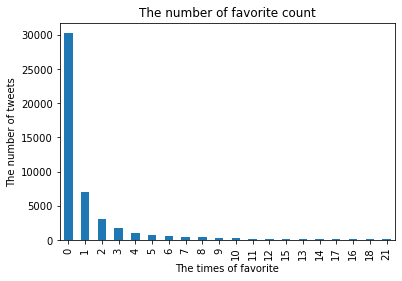

In [ ]:
cv19_dc.favorite_count.value_counts().nlargest(20).plot(kind='bar')
plt.title('The number of favorite count')
plt.xlabel('The times of favorite')
plt.ylabel('The number of tweets')

In [ ]:
data = cv19_ws_labeled

In [ ]:
index = -1
for category in cv19_ws_labeled.categories.values:
  index += 1
  # print(len(category))
  if len(category) == 12:
    print(index)
    print(category)
    print(cv19_ws_labeled.iloc[index].id)
    print(cv19_ws_labeled.iloc[index].full_text)

163
['News', 'Official', 'Location', 'EmergingThreats', 'ThirdPartyObservation', 'FirstPartyObservation', 'Sentiment', 'Factoid', 'Advice', 'NewSubEvent', 'MultimediaShare', 'Irrelevant']
1234608087589363712
Can we address the fact these were all the nursing home patients that had been exposed previosly at the hospital &amp; was a perfect storm where these elderly with other health  issues had been expected ?
Nah let's just report it.

https://t.co/nsQXMMO3Pz
1168
['News', 'Location', 'Official', 'EmergingThreats', 'ThirdPartyObservation', 'Sentiment', 'ServiceAvailable', 'Factoid', 'Discussion', 'NewSubEvent', 'MultimediaShare', 'Irrelevant']
1233928263287869441
@rscollin @EliseStefanik @danstec https://t.co/K7PuBmWQjI. Stefanik intentionally mislead and lied to keep a President in power whose actions (or lack thereof) has put all our lives in danger. Now we are facing a pandemic and all he cares about is the stock market and revenge. WTG. #Coronavid19 #Corona #NY21
1277
['News', 'Loc

Showing statistics for types classification: 
DC:
[Irrelevant]                                                                                  2182
[News, Irrelevant]                                                                              23
[Official, Irrelevant]                                                                          19
[News, Location, Official, EmergingThreats, NewSubEvent]                                        14
[ContextualInformation, Irrelevant]                                                             12
                                                                                              ... 
[News, Location, Official, EmergingThreats, Irrelevant]                                          1
[News, Location, Official, EmergingThreats, NewSubEvent, OriginalEvent]                          1
[Official, Location, ServiceAvailable, ContextualInformation, Volunteer, Donations]              1
[Location, FirstPartyObservation, Sentiment, ContextualInfo

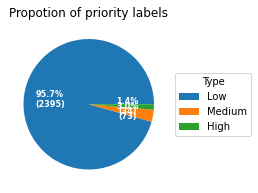

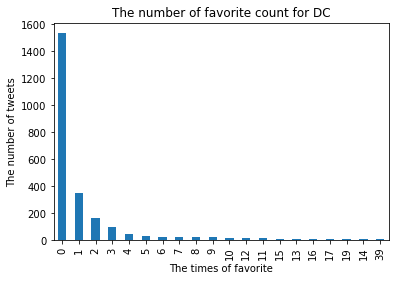

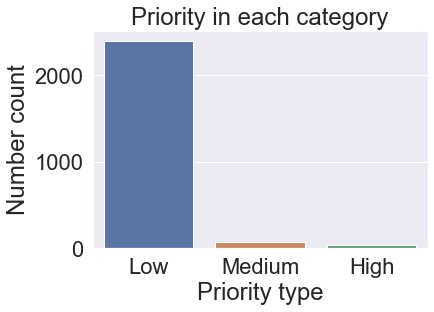

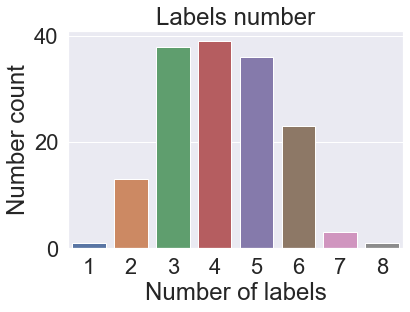

All labeled types:  {'FirstPartyObservation', 'OriginalEvent', 'Irrelevant', 'Donations', 'Hashtags', 'Official', 'Factoid', 'InformationWanted', 'MultimediaShare', 'Discussion', 'News', 'ContextualInformation', 'NewSubEvent', 'Sentiment', 'ThirdPartyObservation', 'Location', 'EmergingThreats', 'Volunteer', 'ServiceAvailable', 'Advice'}


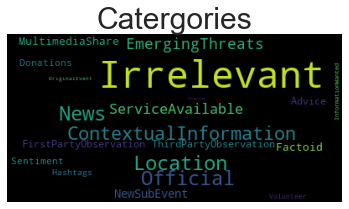

In [ ]:
types_statistics(cv19_dc_labeled,'DC')

Showing statistics for types classification: 
WS:
[Irrelevant]                                                                                                                                       740
[News, ContextualInformation]                                                                                                                      185
[Discussion, Irrelevant]                                                                                                                           111
[Sentiment, Irrelevant]                                                                                                                             85
[News, ContextualInformation, Sentiment]                                                                                                            84
                                                                                                                                                  ... 
[Location, FirstPartyObservation, Sentiment,

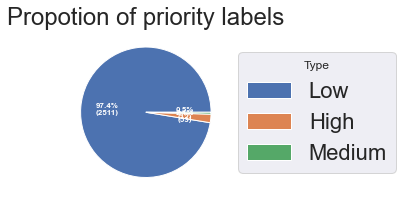

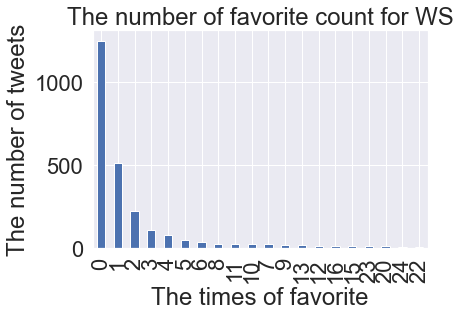

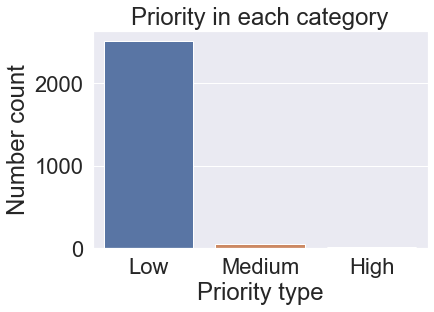

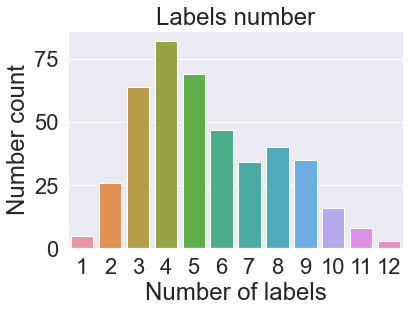

All labeled types:  {'FirstPartyObservation', 'OriginalEvent', 'Irrelevant', 'Hashtags', 'Donations', 'Official', 'Factoid', 'InformationWanted', 'MultimediaShare', 'Discussion', 'News', 'ContextualInformation', 'CleanUp', 'NewSubEvent', 'Sentiment', 'ThirdPartyObservation', 'Location', 'EmergingThreats', 'GoodsServices', 'Volunteer', 'ServiceAvailable', 'Advice'}


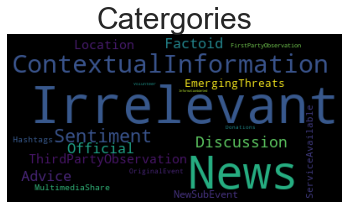

In [ ]:
types_statistics(cv19_ws_labeled,'WS')

Showing statistics for types classification: 
NY:
[Irrelevant]                                                                                                         1355
[News, ContextualInformation, Irrelevant, Sentiment]                                                                   49
[Location, EmergingThreats, ThirdPartyObservation, Factoid, NewSubEvent]                                               31
[News, ContextualInformation, MultimediaShare, Irrelevant]                                                             29
[Sentiment, ContextualInformation, Irrelevant]                                                                         29
                                                                                                                     ... 
[Official, MultimediaShare, ContextualInformation]                                                                      1
[Discussion, ThirdPartyObservation, Factoid]                                                    

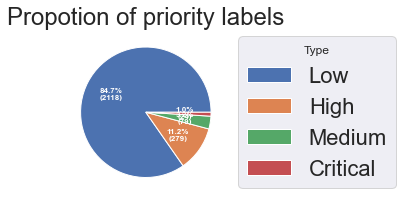

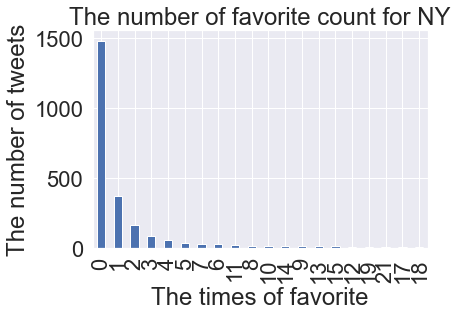

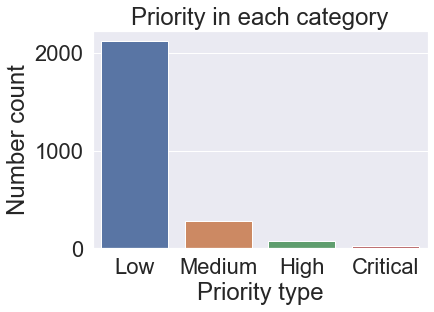

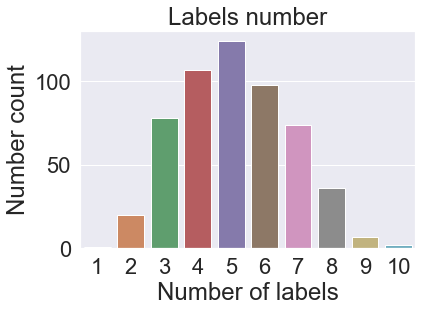

All labeled types:  {'FirstPartyObservation', 'OriginalEvent', 'Irrelevant', 'Hashtags', 'Donations', 'Official', 'Factoid', 'InformationWanted', 'MultimediaShare', 'Discussion', 'News', 'ContextualInformation', 'CleanUp', 'NewSubEvent', 'Sentiment', 'ThirdPartyObservation', 'Location', 'EmergingThreats', 'GoodsServices', 'Volunteer', 'ServiceAvailable', 'Advice'}


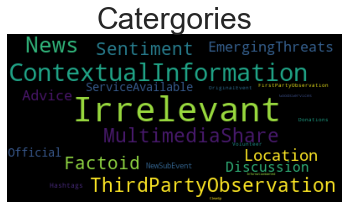

In [ ]:
types_statistics(cv19_ny_labeled,'NY')

# Classification on Information feed


# Work on WS

#### Type categories

In this task you will process a stream of tweets about the COVID-19 outbreak in different affected regions and you need to assign one or more of a reduced set of 9 information type labels and one priority label (Critical, High, Medium or Low) for each tweet. The information type categories are:

* Request-GoodsServices
* Request-InformationWanted
* CallToAction-Volunteer
* CallToAction-MovePeople
* Report-EmergingThreats
* Report-NewSubEvent
* Report-ServiceAvailable
* Other-Advice
* Other-Any

#### Define the tokenizer and normalizer. 


In [ ]:
#preprossesing
# from nltk.corpus import stopwords
# nltk.download('stopwords')
# from nltk.tokenize import word_tokenize

# Use Spacy as nlp tool
nlp = spacy.load('en_core_web_sm', disable=[])
all_stopwords = nlp.Defaults.stop_words
# Do not remove 'not' as stopword
all_stopwords.remove('not')

# Speed up the processing of Spacy
disable=['ner']
nlp.remove_pipe('tagger')
nlp.remove_pipe('parser')

('parser', <spacy.pipeline.pipes.DependencyParser at 0x20bb69eee20>)

#### Tokenization and vectorize data

In [ ]:
# These three functions are learnt from course named Text as data
def spacy_tokenize(string):
  tokens = list()
  doc = nlp(string)
  for token in doc:
    tokens.append(token)
  return tokens

#@Normalize
def normalize(tokens):
  normalized_tokens = list()
  for token in tokens:
    normalized = token.text.lower().strip()
    if (not token.is_stop):
        if ((token.is_alpha or token.is_digit or token.like_url)):
            normalized_tokens.append(normalized)
  return normalized_tokens

#@Tokenize and normalize
def tokenize_normalize(string):
  return normalize(spacy_tokenize(string))

count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=25000,ngram_range=(1,2),sublinear_tf=(1,2))
    

#### Extract faetures and store to csv

In [ ]:
location = 'WS'
if not os.path.exists('cache/'+location):
  store_train_test_split_to_csv(cv19_ws_labeled,location='WS',target='categories') 
location = 'DC'
if not os.path.exists('cache/'+location):
  store_train_test_split_to_csv(cv19_dc_labeled,location='DC',target='categories') 
location = 'NY'
if not os.path.exists('cache/'+location):  
  store_train_test_split_to_csv(cv19_ny_labeled,location='NY',target='categories') 

#### Identify the dataset to train

In [ ]:
# Choose one dataset to use in this section
Tweets = cv19_ws_labeled
trainSet, testSet = generateTrainingSetCV(Tweets)

#### Build labels for multi-label multi-class classification

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']


In [ ]:

# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['categories']
trainL_temp = EF(trainSet,labelList)['categories']
testL_temp = EF(testSet,labelList)['categories']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)
trainL = extractLabels_legacy(trainF,trainL_temp)
testL = extractLabels_legacy(testF,testL_temp)

Streaming output truncated to the last 5000 lines.
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
match
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
[0, 0, 0, 0, 0, 0, 1, 0, 1]
['News', 'Official', 'ContextualInformation', 'Advice']
News
News
News
News
News
News
News
News
News
Official
Official
Official
Official
Official
Official
Official
Official
Official
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
Advice
Advice
Advice
Advice
Advice
Advice
Advice
Advice
match
[0, 0, 0, 0, 0, 0, 0, 1, 1]
['News', 'Official', 'Sentiment', 'ContextualInformation', 'Advice']
News
News
News
News
News
News
News
News
News
Official
Offic

#### Feature union

In [ ]:
from sklearn.pipeline import FeatureUnion

fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
    ])),
    ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
        ('cv',count_vect),
    ])),
    ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
    ])),
    ],n_jobs=-1)


fu.fit(trainF)
train_features_union = fu.transform(trainF)
test_features_union = fu.transform(testF)

In [ ]:
# Set data strcture to store later result of models
precision_all = {}
recall_all = {}
f1_all = {}
# One function to record all result
def record_result(name,precision,recall,f1):
    precision_all[name] = precision
    recall_all[name] = recall
    f1_all[name]= f1

#### Dummmy Classifier

In [ ]:
runningSet = [train_features_union,trainL, test_features_union,testL]
DummyResult(runningSet)

Evaluate dummy classifier with strategy of most_frequent
Cross validation: Average training set result: test_accuracy=0.757071 test_precision_macro=0.111111 test_f1_macro=0.111111 test_recall_macro=0.111111 .

Cross validation: Average validation set result: train_accuracy=0.757072 train_precision_macro=0.111111 train_f1_macro=0.111111 train_recall_macro=0.111111 .

Evaluate dummy classifier with strategy of stratified
Cross validation: Average training set result: test_accuracy=0.556305 test_precision_macro=0.153275 test_f1_macro=0.152280 test_recall_macro=0.152808 .

Cross validation: Average validation set result: train_accuracy=0.550334 train_precision_macro=0.144528 train_f1_macro=0.144298 train_recall_macro=0.144148 .



### Decision tree

In [ ]:
import warnings
warnings.filterwarnings("ignore")

#### DC with feature union

Cross validation: Average training set result: test_accuracy=0.722705 test_precision_macro=0.339608 test_f1_macro=0.288857 test_recall_macro=0.264236 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=0.888889 train_f1_macro=0.888889 train_recall_macro=0.888889 .

Test result: {'accuracy': 0.6692506459948321, 'precision': 0.30736599368985223, 'f1': 0.30806228689523885, 'recall': 0.3369061650160975}
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         1
           1     0.0000    0.0000    0.0000         6
           2     0.3333    0.7500    0.4615         4
           3     0.0000    0.0000    0.0000         0
           4     0.4783    0.3235    0.3860        68
           5     0.3529    0.1967    0.2526        61
           6     0.3396    0.4286    0.3789        42
           7     0.2621    0.3333    0.2935        81
           8     1.0000    1.0000    1.0000       774

   micro 

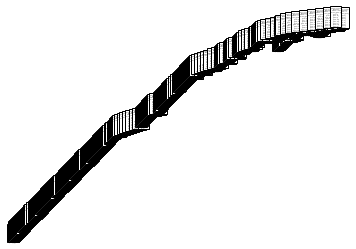

In [ ]:
runningSet = [train_features_union,trainL, test_features_union,testL]
DecisionTreeCf(runningSet)

#### DC without feature union

In [ ]:
cv_train = count_vect.fit_transform(trainF['full_text'])
cv_test = count_vect.transform(testF['full_text'])

Cross validation: Average training set result: test_accuracy=0.739314 test_precision_macro=0.342241 test_f1_macro=0.272196 test_recall_macro=0.239253 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=0.888889 train_f1_macro=0.888889 train_recall_macro=0.888889 .

Test result: {'accuracy': 0.7235142118863049, 'precision': 0.2650426012508885, 'f1': 0.29337602544353597, 'recall': 0.3427798859740784}
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         0
           1     0.0000    0.0000    0.0000         0
           2     0.2222    0.5000    0.3077         4
           3     0.0000    0.0000    0.0000         0
           4     0.3261    0.3947    0.3571        38
           5     0.2941    0.3448    0.3175        29
           6     0.3585    0.5000    0.4176        38
           7     0.1845    0.3455    0.2405        55
           8     1.0000    1.0000    1.0000       774

   micro a

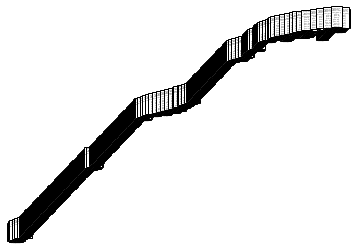

In [ ]:
runningSet = [cv_train,trainL, cv_test,testL]
DecisionTreeCf(runningSet)

#### Grid Search on decision tree

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin


fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
    ])),
    ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
        ('cv',count_vect),
    ])),
    ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
    ])),
    ])


In [ ]:
trainF_tmp = []
for i in range(4845):
  trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                     'favorite_count':trainF['favorite_count'][i]})


In [ ]:

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV



pipe = Pipeline([
#     ('selector', ItemSelector(key='reviewText')),
    # Note: This keeps count weights, not one-hot; we'll tune this parameter next.
    ('fu', fu),
    ('dt', DecisionTreeClassifier())
])

# pipe.fit(trainF, trainL)

# predictions = pipe.predict(valSetF_extract)

# evaluation_summary("Decision Tree TF-IDF", predictions, valL)                   

params = {
    # Fill in the parameter
    
    'fu__full_text__tf_idf__ngram_range':[(1,2),(1,3)],
    'fu__full_text__tf_idf__sublinear_tf': (True, False),
    'fu__full_text__tf_idf__max_features': np.linspace(10000,50000,5,dtype=int),
    'dt__max_depth': (100,200,300,400,500),
    'dt__class_weight': ['balanced','None'],
   
}

# Pass in your pipeline, params (to tune), scoring, and split parameters here!
grid_search = GridSearchCV(pipe,params,verbose=10,cv=5, scoring='f1_samples', n_jobs=-1,pre_dispatch='2*n_jobs')
print("Performing grid search...")
print("pipeline:", [name for name, _ in pipe.steps])
print("parameters:")
print(params)
#n_jobs=-1,pre_dispatch='2*n_jobs'
# FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
grid_search.fit(trainF_tmp, trainL)



print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param_name in sorted(params.keys()):
  print("\t%s: %r" % (param_name, best_parameters[param_name]))

In [ ]:
grid_search.best_score_

In [ ]:
grid_search.cv_results_

### build labels for each category

In [ ]:
data = cv19_ws_labeled
trainSet, testSet = generateTrainingSetCV(data)
# Extract training set and test set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = extract_features(trainSet,featureList)
testF = extract_features(testSet,featureList)

labelList = ['categories']
trainL_temp = extract_features(trainSet,labelList)['categories']
testL_temp = extract_features(testSet,labelList)['categories']

trainF = extract_hashtags(trainF)
testF = extract_hashtags(testF)

trainL = extractLabels_legacy(trainF,trainL_temp)
testL = extractLabels_legacy(testF,testL_temp)

Streaming output truncated to the last 5000 lines.
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
ServiceAvailable
match
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
[0, 0, 0, 0, 0, 0, 1, 0, 1]
['News', 'Official', 'ContextualInformation', 'Advice']
News
News
News
News
News
News
News
News
News
Official
Official
Official
Official
Official
Official
Official
Official
Official
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
Advice
Advice
Advice
Advice
Advice
Advice
Advice
Advice
match
[0, 0, 0, 0, 0, 0, 0, 1, 1]
['News', 'Official', 'Sentiment', 'ContextualInformation', 'Advice']
News
News
News
News
News
News
News
News
News
Official
Offic

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']
# A dict Contains labels for all categories e.g. trainL_single[category]
trainL_single = {}
testL_single = {}
for i in range(9):
  print('Currrent is processing on categorie %s'%(categories[i]))
  print()
  # if i == 3:
  #   continue
  trainL_one = []
  testL_one = []
  
  for j in range(len(trainL)):
    trainL_one.append(trainL[j][i])

    
  for j in range(len(testL)):
    testL_one.append(testL[j][i])
    
  trainL_single[i] = trainL_one
  testL_single[i] = testL_one

Currrent is processing on categorie GoodsServices

Currrent is processing on categorie InformationWanted

Currrent is processing on categorie Volunteer

Currrent is processing on categorie MovePeople

Currrent is processing on categorie EmergingThreats

Currrent is processing on categorie NewSubEvent

Currrent is processing on categorie ServiceAvailable

Currrent is processing on categorie Advice

Currrent is processing on categorie Any



In [ ]:
for i in range(9):
  print(np.sum(np.array(trainL_single[i])==1) )

3
9
11
0
148
122
81
224
1803


In [ ]:
for i in range(9):
  print(np.sum(np.array(testL_single[i])==1))

1
3
9
0
46
34
53
103
774


#### Manually add more positive class into test set

In [ ]:
import copy
# build special test set for type ' GoodService'
idxs_tmp = np.where(np.array(trainL_single[0])==1)

for key in testF.keys():
  testF[key].append(trainF[key][idxs_tmp[0][-1]])
  trainF[key].pop(idxs_tmp[0][-1])
for i in range(9):
  if i ==0:
    testL_single[i].append(1)
    trainL_single[i].pop(idxs_tmp[0][-1])
  else:
    testL_single[i].append(trainL_single[i][idxs_tmp[0][-1]])
    trainL_single[i].pop(idxs_tmp[0][-1])


In [ ]:
np.where(np.array(testL_single[0])==1)

In [ ]:
text = testF['full_text'][-1]
count = 0
for doc in trainF['full_text']:
  count += 1
  if doc == text:
    print('Match',count)

#### build up-sample files

In [ ]:
location = 'WS'
for increaseTime in range(150):
  for category in range(9):
    build_upsample_set(trainF,trainL_single,location,category,increaseTime)

In [ ]:
location = 'NY'
for increaseTime in range(150):
  for category in range(9):
    build_upsample_set(trainF,trainL_single,location,category,increaseTime)

In [ ]:
location = 'DC'
for increaseTime in range(150):
  for category in range(9):
    build_upsample_set(trainF,trainL_single,location,category,increaseTime)

#### Plot up-sample figures

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import fbeta_score
# build dict to store metrics
train_record = {}
val_record = {}
test_record = {}
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']

for category in categories:
    train_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    val_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    test_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}





In [ ]:
location = 'WS'
for increaseTime in range(0, 100):  
  print('Current increase %d times' %(increaseTime))
  # up-sample the label

  # Run logistic regression on up-sample
  for category in range(9):
    print('Currrent is classifying categorie %s'%(categories[category]))
    print()

    if category == 4 and increaseTime >= 6:
      continue

    if category == 5 and increaseTime >= 5:
      continue

    if category == 6 and increaseTime >= 6:
      continue

    if category == 7 and increaseTime >= 4:
      continue

    if category == 3 or category == 8:
      continue

    train_features_upsample, train_label_upsample, testL_union_tmp = up_sample(location, category,increaseTime, testF)
    # print('Before up-sample: %d %f After: %d %f' %(trainL_single[category].count(1), trainL_single[category].count(1)/len(trainL_single[category]),
    #                            train_features_upsample.count(1), train_label_upsample[category].count(1)/len(train_label_upsample[category])))
        
    runningSet = [train_features_upsample,train_label_upsample,testL_union_tmp, testL_single]
    lr_Binary(runningSet,category) 


In [ ]:
def plot_metrics_Upsample(records,category,phase):
  plt.figure()
  plt.title('%s result for %s .'%(phase, category))
  length = len(records[category]['accuracy'])
  plt.plot(range(length),records[category]['accuracy'],label='accuracy')
  plt.plot(range(length),records[category]['f1'],label='f1')
  plt.plot(range(length),records[category]['recall'],label='recall')
  plt.plot(range(length),records[category]['precision'],label='precision')
  plt.xlabel('Increase Times')
  plt.ylabel('Values')
  # xticks = np.arange(16)
  # plt.xticks(xticks)
  plt.legend()
  plt.savefig(str(category)+'_'+phase+'.png',dpi=300,bbox_inches='tight')
  plt.show()

In [ ]:
phases = ['Training','Validation','Test']
for category in categories:
  if category == 'MovePeople' or category == 'Any':
    continue
  for phase in phases:
    if phase == 'Training':
      plot_metrics_Upsample(train_record,category,phase)
    elif phase == 'Validation':
      plot_metrics_Upsample(val_record,category,phase)
    else:
      plot_metrics_Upsample(test_record,category,phase)

#### Search best LR

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']


In [ ]:
location = 'WS'

In [ ]:
# search the best over-sample factor of lr model of each category
metrics_all, best_parameters_all, cv_score_all = search_best_lR(30,location)

Performing grid search on IncreaseTime 4
Performing grid search on category GoodsServices
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_ran

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total=  45.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total=  46.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total=  43.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total=  43.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  30.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  30.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  17.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  17.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  17.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  18.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  17.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  17.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total=  18.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total=  18.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=  36.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total=  18.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  17.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  17.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  17.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  26.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.4min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  26.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  25.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  27.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  27.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  27.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  17.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  26.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  17.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  18.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  26.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484, total=  18.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484, total=  17.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total=  45.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484, total=  18.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  31.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=libl

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  50.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  48.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  18.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  18.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  48.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  18.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  56.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  32.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  32.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  29.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737, total=  26.7s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  30.0s
[CV] lr__solver=new

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 12.6min finished


type
<class 'int'>
Best score: 0.816
Performing grid search on category InformationWanted
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  36.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  36.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  14.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  18.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  18.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  25.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  13.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  14.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  23.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  28.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  26.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  32.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.0min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  27.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  28.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total=  57.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595, total=  53.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  14.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  13.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  14.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575, total=  14.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575, total=  14.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575, total=  14.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  21.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total=  14.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  22.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total=  14.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total=  14.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  23.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  23.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  26.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total=  32.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total=  32.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  34.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total=  45.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  30.2s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  31.3s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  29.8s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 18.7min finished


type
<class 'int'>
Best score: 0.892
Performing grid search on category Volunteer
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_i

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  26.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  26.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  26.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  26.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  30.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  30.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  16.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  23.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  14.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total=  27.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=libl

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  2.9min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  21.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  21.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  25.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  29.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  30.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=newton-cg, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total=  30.3s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total=  33.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  28.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total=  26.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total=  26.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  31.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  32.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  31.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  26.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  15.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  26.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  14.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  14.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  14.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  14.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  14.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  14.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  14.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  31.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=sag, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  24.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total=  32.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  19.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  14.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  14.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  14.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  15.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  37.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  34.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  34.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total=  51.4s
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total=  50.2s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=  49.8s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=  50

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=  36.0s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 11.8min finished


type
<class 'int'>
Best score: 0.849
Performing grid search on category EmergingThreats
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total=17.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727, total=17.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 4.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 4.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=lbfgs

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 4.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737, total=10.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737, total=11.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total= 4.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=saga, lr__p

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 63.9min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  50.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  50.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  44.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  44.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  46.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  53.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  34.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  19.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total=11.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 4.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=li

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  51.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252, total=  27.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252, total=  28.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  39.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252, total=  28.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total= 2.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 3.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 3.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__ma

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_m

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  46.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  46.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=n

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  30.6s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  31.2s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  29.8s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 95.3min finished


type
<class 'int'>
Best score: 0.842
Performing grid search on category NewSubEvent
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total= 4.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total=14.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=lbfgs, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total= 4.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total= 3.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=lbfgs, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total=  38.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total=  38.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  41.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  40.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  38.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__pe

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 23.1min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=newton-cg, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  53.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  26.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  17.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  17.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  43.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  42.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  18.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  49.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total= 2.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total= 2.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total= 5.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total= 8.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 5.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total= 8.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 4.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=10.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 3.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total= 9.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 1.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 1.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total=  38.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total=  38.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  48.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total=  17.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total=  36.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  51.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  36.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=  45.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 4.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606, total= 1.5min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606, total= 1.5min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 1.8min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_featu

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 57.9min finished


type
<class 'int'>
Best score: 0.815
Performing grid search on category ServiceAvailable
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  47.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  47.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 4.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 2.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 2.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total=11.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=lbfgs, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777, total=  15.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777, total=  16.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777, total=  15.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  30.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  30.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  31.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 14.1min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total=  34.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  35.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 3.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 3.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 3.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 4.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=13.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=13.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 3.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 2.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  15.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  15.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  16.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total=  46.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  16.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  16.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  28.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_ite

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  15.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  58.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  15.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  15.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  30.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  30.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  15.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  31.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 3.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total= 8.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  16.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  15.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total=  42.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  15.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total=  28.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solve

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 62.1min finished


type
<class 'int'>
Best score: 0.810
Performing grid search on category Advice
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__ma

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  36.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  36.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total=  28.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total=  28.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  17.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total=  26.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  17.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  17.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  35.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 7.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total= 2.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total= 6.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total= 6.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=12.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total= 6.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=13.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total= 5.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=lbfgs

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 22.7min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  31.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total=  53.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  45.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  43.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  58.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total= 2.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total= 3.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total= 3.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total= 4.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 4.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total= 3.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total= 3.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total= 4.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total= 4.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  37.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total=  35.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total= 1.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=19.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total= 4.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=11.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=saga, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  55.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  35.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  28.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  46.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  57.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 4.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 4.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 4.5min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total=11.4min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 8.6min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 8.2min
[C

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 118.0min finished


type
<class 'int'>
Best score: 0.816
Performing grid search on category Any
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_t

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  14.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  15.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total=  33.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total=  33.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  22.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  22.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=sag, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  24.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  40.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  40.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=newton-cg, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  21.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  33.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  34.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  15.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  34.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  14.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  22.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  22.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  22.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  21.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  25.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.0min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  25.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  25.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=saga, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 1.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 3.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 1.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  26.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  27.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total=  27.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  14.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  14.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  14.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total=  24.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  45.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  34.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  34.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  45.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  28.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total=  39.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 25.7min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 5
Performing grid search on category GoodsServices
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1,

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  27.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  27.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__cla

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  16.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  16.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  16.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  23.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  14.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  31.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  14.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  28.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  14.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  34.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  59.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.6min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  57.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  25.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  29.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  34.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777, total=  26.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total=  35.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total=  34.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  31.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  25.5s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  24.3s
[CV] lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  23.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  22.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total=  45.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total=  47.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  28.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  35.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=libl

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  14.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  25.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  25.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  26.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  25.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  14.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  14.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  13.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  22.1s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  25.1s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  24.9s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  24.7s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 12.3min finished


type
<class 'int'>
Best score: 0.804
Performing grid search on category InformationWanted
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454, total=  33.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454, total=  34.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  28.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  35.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=n

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  28.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  27.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  28.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  25.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  24.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  32.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total=  32.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=newton-

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.0min


[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 4.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total= 5.0min
[CV] lr__solver=saga, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  22.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  23.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  44.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  45.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  32.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  32.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  29.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=saga, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  24.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  23.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  33.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  34.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  29.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  32.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  32.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 1.5min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 1.5min
[CV]  

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 21.0min finished


type
<class 'int'>
Best score: 0.903
Performing grid search on category Volunteer
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  15.1s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  15.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  15.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  27.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  48.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  24.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  25.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 
[CV]  lr_

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.6min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  36.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  36.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=sag, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=  39.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=  24.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  29.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  28.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=newton-c

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  14.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  22.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  15.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  15.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  14.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  14.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  35.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  15.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  33.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  14.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  14.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  14.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  28.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  28.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  32.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  31.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  26.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  26.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  25.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  25.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  32.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  55.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  55.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  55.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  48.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  36.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  35.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  34.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  30.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  31.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__sol

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 12.3min finished


type
<class 'int'>
Best score: 0.864
Performing grid search on category EmergingThreats
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), f

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  31.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  32.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  51.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  51.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total=  35.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total=  57.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total=  50.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total= 4.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 24.0min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  55.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  31.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  31.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  30.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  20.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  43.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  43.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  19.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  42.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  19.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  31.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  48.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  38.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  38.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=saga, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=newton-c

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 5.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 5.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lbfgs, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=10.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 3.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=11.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  36.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total=  37.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total=  38.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total= 4.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total= 4.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=10.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=10.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total= 4.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 7.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total= 4.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total= 4.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 8.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=lbfgs, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 1.7min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total= 1.8min
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total= 1.1min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  49.0s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 64.5min finished


type
<class 'int'>
Best score: 0.839
Performing grid search on category NewSubEvent
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total= 1.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919 
[CV

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total= 6.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total= 6.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total= 6.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919, total= 2.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 5.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 5.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 5.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=23.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total= 4.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total= 4.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total= 5.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total= 4.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=21.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  52.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total= 3.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  17.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  18.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 7.4min


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 48.9min


[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=26.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=27.2min
[CV] lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 1.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  54.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  49.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  18.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  18.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  35.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  18.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  26.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  27.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  27.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  36.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  44.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 6.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 6.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 6.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=13.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 5.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 5.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 4.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total= 5.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total=  40.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=saga

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  31.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  31.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total=  36.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total= 1.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  43.3s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  30.4s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  32.2s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  30.4s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  30.9s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 124.9min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


type
<class 'int'>
Best score: 0.813
Performing grid search on category ServiceAvailable
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), 

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  16.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  16.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  16.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303, total=  45.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303, total=  46.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total= 3.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total= 3.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total= 7.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total= 1.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  35.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  37.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  29.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  29.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total=  27.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total=  50.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__so

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 16.5min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565, total= 6.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total= 2.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 4.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 4.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 3.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 3.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=newto

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total= 6.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total= 4.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total= 5.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 2.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total= 3.1min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 2.1min
[CV]

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  25.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  28.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=lbfgs, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  39.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  45.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=saga, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595, total=  31.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595, total=  31.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303, total= 4.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total= 5.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total= 5.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=lbfgs, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3969, total=  28.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303, total=  33.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total=  25.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total=  25.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total=  25.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 43.2min finished


type
<class 'int'>
Best score: 0.799
Performing grid search on category Advice
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV] lr__solv

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  33.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  33.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total=  29.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  32.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=sag, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727, total=  31.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727, total=  31.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39606, total=  34.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727, total=  52.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  48.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  48.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=s

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.9min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  40.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  47.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  28.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=liblinear, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  30.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  29.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  44.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  28.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 4.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 4.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=11.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 4.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 4.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 4.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=15.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=16.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 3.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  29.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  31.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  55.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  56.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  54.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  56.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total=  48.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=libl

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    htt

[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 3.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=lbfgs, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  31.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  30.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  22.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  22.3s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  22.3s
[CV] lr__solver=libline

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444, total=  21.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444, total=  21.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  38.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  38.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  24.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.2min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  24.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  24.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total= 1.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 2.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 2.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 4.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  34.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total= 3.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 3.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=lbfgs, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  25.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  22.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  24.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total= 2.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 2.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total=  36.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  23.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  22.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  21.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  21.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total=  35.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  14.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  14.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  26.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  24.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  26.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  41.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  50.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=newton-c

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 28.2min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 6
Performing grid search on category GoodsServices
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868, total=  24.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868, total=  25.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868, total=  28.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total=  26.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  31.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total=  36.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  55.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total= 1.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  42.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  49.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=newto

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.1min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303, total=  36.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303, total=  36.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total=  14.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total=  15.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  33.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=sag, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total=  15.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  22.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  22.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  22.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  21.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  26.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  27.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=liblinear, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  31.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  27.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  26.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  23.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  15.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  14.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  15.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  15.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  14.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  14.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  15.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  24.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  24.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  15.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  27.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  24.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=saga, lr__penalty=l2, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  15.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  15.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  49.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  35.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  35.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  31.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  32.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=sag, 

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 12.0min finished


type
<class 'int'>
Best score: 0.883
Performing grid search on category InformationWanted
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), f

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  20.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  20.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  21.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  31.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  20.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  23.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  21.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  34.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  21.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  22.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  20.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total=  46.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total=  47.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  57.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total= 2.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  7.3min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total= 2.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total= 4.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929, total= 3.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=lbfgs, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total=  38.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  28.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  31.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  19.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  20.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  19.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  37.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  31.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  30.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=saga, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  45.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  47.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  58.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  57.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  44.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  29.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  29.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  20.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  20.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  33.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  20.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  34.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  19.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 3.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total= 3.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 3.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 3.0min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 3.0min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  12.7s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  12.8s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  12.9s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 29.0min finished


type
<class 'int'>
Best score: 0.911
Performing grid search on category Volunteer
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__ful

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474, total=  26.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  26.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  22.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  23.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=lbfgs

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=lbfgs, lr__pe

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.4min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  50.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  56.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  15.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  14.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  22.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__m

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  14.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  24.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  24.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  24.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  27.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=saga, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total=  38.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total=  41.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  49.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  49.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=saga

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total=  53.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total=  53.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  34.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  30.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  37.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  41.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total=  26.4s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total=  24.9s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total=  25.0s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 16.8min finished


type
<class 'int'>
Best score: 0.860
Performing grid search on category EmergingThreats
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_tex

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  33.2s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  34.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  43.1s
[CV] lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  31.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  39.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  38.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  38.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    htt

[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total= 1.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=saga, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estim

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  21.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  21.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total=  46.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=sag, lr__penalty=l2, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  21.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total= 4.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=newton-cg, lr__pen

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 16.3min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  49.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=libline

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 9.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474, total= 3.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total=  35.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total= 2.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total=  54.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total=  36.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=  44.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=lbfgs, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  46.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  47.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  35.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  44.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total= 1.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total= 4.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total= 5.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total= 5.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=lbfgs, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total= 5.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=22.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=15.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total= 3.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 4.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 5.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 4.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=13.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=13.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 3.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 2.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 3.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 6.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total= 2.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.9min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 9.0min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.5min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.1min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 9.5min


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 87.4min finished


type
<class 'int'>
Best score: 0.835
Performing grid search on category NewSubEvent
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__f

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  19.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  19.4s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  19.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  30.3s
[CV] lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total= 1.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  30.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=  58.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  31.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=13.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total=16.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=16.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total= 1.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 5.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total= 2.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total=  21.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total=  22.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total= 3.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=saga, lr__pe

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 26.4min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total=10.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total= 6.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 2.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 2.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=11.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=11.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=lbfgs, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  32.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  33.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 5.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 5.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=libl

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=11.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 5.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 5.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=20.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 6.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 4.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=21.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  37.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  37.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 4.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 4.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 5.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 5.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  50.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  59.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=saga, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  33.1s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  32.8s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 92.1min finished


type
<class 'int'>
Best score: 0.817
Performing grid search on category ServiceAvailable
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__m

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total=  41.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total=  42.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  53.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  51.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  40.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total=  53.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  31.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  54.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=11.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=lbfgs, lr__p

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 24.5min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909, total= 3.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total=22.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total= 2.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total= 3.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total= 2.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total= 2.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total=16.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  55.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  59.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=liblinear

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 3.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 3.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total= 4.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total= 3.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total= 8.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total= 9.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  16.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  15.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  18.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 3.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=newton-cg,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total= 6.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  54.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  25.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total=  40.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total=  40.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  33.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  33.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  33.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  42.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total= 3.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 5.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 5.9min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total= 3.3min
[CV]  lr__solver=lbfgs, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  37.4s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  26.3s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 69.4min finished


type
<class 'int'>
Best score: 0.798
Performing grid search on category Advice
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  38.8s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  39.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  40.0s
[CV] lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  39.1s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  39.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total= 6.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total= 6.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=11.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total=11.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 1.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  43.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  44.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  55.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__s

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 17.1min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  45.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  45.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  40.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=liblin

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 5.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 2.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=13.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 2.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959, total= 4.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 1.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total=  45.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  47.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  57.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  19.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  20.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total= 4.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total= 4.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total= 2.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total= 5.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=11.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=12.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 1.7min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 2.4min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total= 5.4min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total= 6.9min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total= 6.

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 63.9min finished


type
<class 'int'>
Best score: 0.797
Performing grid search on category Any
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), 

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  14.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  15.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444, total=  21.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=liblinear, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  15.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  38.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=lbfgs, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  25.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  32.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  6.0min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  23.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  53.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  21.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  22.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  21.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  21.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=saga, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  22.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  23.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total=  23.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total=  23.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total=  24.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total=  39.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  26.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=  23.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  46.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  32.4s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=  14.6s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  22.2s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=  13.0s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=  12.6s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 27.5min finished


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 7
Performing grid search on category GoodsServices
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_tex

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total=  24.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total=  24.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727, total=  27.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727, total=  28.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  45.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  30.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  14.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  14.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  13.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  29.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=ne

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total=  34.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656, total=  25.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solve

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.1min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393, total=  35.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  30.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=  55.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=  54.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  35.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  43.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  19.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  31.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  22.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  22.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  33.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  19.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919, total=  28.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  14.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919, total=  23.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_ite

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  14.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total=  25.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[C

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  51.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  22.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  23.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  30.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  31.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=s

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 11.9min finished


type
<class 'int'>
Best score: 0.770
Performing grid search on category InformationWanted
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__fu

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  34.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  34.6s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  34.7s
[CV] lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  58.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total=  28.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total=  28.6s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  42.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  42.8s
[CV] lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  16.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  16.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  15.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  25.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  28.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=saga, lr__

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.9min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=  30.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=  29.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=liblinear, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  41.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total=  23.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  39.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total=  24.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  15.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  15.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  14.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  14.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  14.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  30.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total= 1.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  54.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171, total=  15.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171, total=  15.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171, total=  15.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  14.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  14.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  26.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  27.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  26.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  15.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=  34.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  42.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  42.4s
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  22.2s
[CV]  lr__solver=sa

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 18.4min finished


type
<class 'int'>
Best score: 0.918
Performing grid search on category Volunteer
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  16.1s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  16.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total=  29.7s
[CV] lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  20.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solve

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.1min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total=  40.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total=  27.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  21.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  16.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  16.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  29.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  38.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  41.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  27.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  25.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=saga, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  14.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total=  26.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  14.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  24.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  14.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  24.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  14.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total=  34.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=libl

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  36.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  36.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  37.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  24.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  28.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  29.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  28.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  24.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  25.6s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  23.5s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  27.4s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  26.7s
[CV]

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 14.0min finished


type
<class 'int'>
Best score: 0.872
Performing grid search on category EmergingThreats
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_ra

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  37.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total=  40.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total=  36.6s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total=  36.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  39.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  56.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  56.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=sag, lr__penalty=l2, lr__m

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total=  33.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  58.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=sag, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  54.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__sol

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.3min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total= 1.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  40.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  57.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  48.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  47.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  47.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  46.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  47.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737, total= 1.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737, total= 1.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  43.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  42.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  41.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  48.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total=  41.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 2.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 2.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total= 3.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  46.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  45.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  45.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  56.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  45.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  40.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  39.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  40.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  51.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 2.1min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 3.3min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total=11.0min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total=16.1min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total=16.2m

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 46.3min finished


type
<class 'int'>
Best score: 0.817
Performing grid search on category NewSubEvent
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_ran

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  54.8s
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  54.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total= 4.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 4.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=11.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=11.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 2.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=newton-cg, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 4.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total= 6.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 4.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=10.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 6.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=12.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 6.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 5.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 36.3min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=12.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total= 3.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=lbfgs, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  34.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total=  29.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total=  41.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  18.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  19.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total=  29.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  19.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total=  28.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  19.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  19.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total=  19.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  29.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  19.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  20.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  28.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  20.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=sag, lr__penalty=l2, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  41.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  41.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=sag, lr__penalty=l2, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  19.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  49.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  19.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  20.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  51.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 4.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 5.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 4.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606, total=14.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606, total=13.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 5.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=lbfgs, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 3.5min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total=  35.5s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  58.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total=  35.2s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total=  34.2s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 60.3min finished


type
<class 'int'>
Best score: 0.810
Performing grid search on category ServiceAvailable
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4),

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  17.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  17.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  18.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  55.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  43.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  45.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  25.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estim

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  16.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  16.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  41.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  16.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 2.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 2.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total= 8.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solve

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 16.5min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=n

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  41.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  42.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  16.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 2.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 3.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 4.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total= 7.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=lbfgs, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 4.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total= 8.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  31.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  30.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 3.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 4.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total=13.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 3.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 2.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total=10.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  31.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  33.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=liblinear, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  36.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  36.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total=  36.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  44.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  32.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  27.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  40.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  27.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  26.0s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  36.6s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  35.3s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  36.1s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 72.4min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


type
<class 'int'>
Best score: 0.804
Performing grid search on category Advice
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total=  32.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total=  32.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  48.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  52.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total= 1.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 2.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 2.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 2.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total= 9.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total=  44.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total=  46.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total=  44.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  36.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  37.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total= 4.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=newton-cg, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total= 5.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 30.6min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total= 5.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total= 6.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total= 6.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total= 5.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 9.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 9.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total= 3.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 2.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 2.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 3.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total= 3.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=32.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total= 3.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total= 2.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=33.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  37.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=sag, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  26.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  26.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=newton-cg, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  38.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  46.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total= 2.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total= 4.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total= 4.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total= 4.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171, total= 5.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  25.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  27.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  26.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=saga, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total=  43.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total=  43.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8793,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161, total=  37.7s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  39.1s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  38.7s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  34.8s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 116.5min finished


type
<class 'int'>
Best score: 0.795
Performing grid search on category Any
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total= 1.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=lbfgs, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  16.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  17.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total=  36.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  19.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total=  43.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total=  38.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  13.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  14.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  15.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  23.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=newton-cg,

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  7.0min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total= 3.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39606, total= 3.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total=  25.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  24.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  32.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  26.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  26.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  30.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  29.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  30.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  29.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  42.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  57.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total= 1.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total= 2.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 3.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 3.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 1.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  14.7s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929, total=  21.3s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7929, total=  20.8s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  13.7s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  13.7s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 23.6min finished


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 8
Performing grid search on category GoodsServices
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__n

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total=  14.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total=  15.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  29.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total=  15.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  31.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  21.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  21.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  23.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total=  23.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l2, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  22.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  23.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total=  26.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total=  38.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313, total=  24.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total=  29.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  16.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313, total=  23.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  17.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  16.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  36.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.0min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  36.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  36.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535, total=  43.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535, total=  43.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  32.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  34.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  16.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  41.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  15.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  34.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=sag, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  14.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  25.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  31.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  20.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  20.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  34.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  20.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  39.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272, total=  32.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  44.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  44.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323 
[CV]

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  15.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total=  30.9s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  14.9s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total=  36.5s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total=  34.7s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  12.5s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 11.1min finished


type
<class 'int'>
Best score: 0.765
Performing grid search on category InformationWanted
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  25.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total=  25.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  15.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  15.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  14.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total=  33.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  15.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total=  38.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 2.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total= 1.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  24.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  29.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  35.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total=  56.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  17.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  18.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.8min
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/loc

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  19.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  26.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=newton-cg, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  28.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  28.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  36.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total=  15.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total=  43.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  26.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total=  27.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total=  33.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total=  31.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  21.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  22.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  24.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  24.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  24.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  24.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=  25.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total=  22.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  15.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total=  31.8s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  16.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total=  31.2s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  14.6s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total=  31.7s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 15.1min finished


type
<class 'int'>
Best score: 0.767
Performing grid search on category Volunteer
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__fu

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total=  49.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727, total=  49.2s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727, total=  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  18.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  26.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=  27.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  15.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  15.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  26.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  30.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2,

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.8min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 1.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total= 2.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=lbfgs, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  19.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  39.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total=  43.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  15.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  15.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  16.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  15.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  16.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=  35.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868, total=  29.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868, total=  30.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  16.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  23.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  15.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  15.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  23.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=libl

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  26.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  26.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  26.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393, total=  26.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393, total=  25.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  25.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  29.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  27.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  34.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  36.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=sa

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 13.5min finished


type
<class 'int'>
Best score: 0.874
Performing grid search on category EmergingThreats
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total= 4.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total= 4.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=newton-cg, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total= 2.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total= 2.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total= 2.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777, total= 4.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777, total= 5.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=lbfgs, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total= 7.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777, total= 2.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total= 1.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total=  52.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  23.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  23.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total=  52.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total=  23.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total=  52.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  24.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  23.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total=  55.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total=  55.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 22.7min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total=  54.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  23.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 2.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 3.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total= 8.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total= 6.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=16.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=13.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656, total= 3.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total= 4.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total= 3.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656, total= 5.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=lbfgs, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total= 1.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  43.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  44.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__c

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  42.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  42.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  41.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  43.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weigh

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total= 1.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total= 1.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=n

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total= 4.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total= 4.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total= 5.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total= 6.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=lbfgs, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total= 1.3min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  49.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  44.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  44.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  23.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  24.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656, total=  49.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  23.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232, total= 2.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total= 2.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  47.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total=  43.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total=  43.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=s

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 71.8min finished


type
<class 'int'>
Best score: 0.826
Performing grid search on category NewSubEvent
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=newto

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3969, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3969, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252, total= 5.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252, total= 5.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 5.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 5.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=lbfgs, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 4.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=11.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=10.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total= 3.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total= 1.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  34.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__so

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 27.8min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  46.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  46.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  53.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  51.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43565, total=  49.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  54.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=liblinear

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total= 3.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total= 4.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total= 5.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lbfgs, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total= 3.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total= 3.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=15.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49505, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=18.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=15.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  19.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total=  20.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  20.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  20.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313, total= 4.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313, total= 4.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=lbfgs, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19313, total= 5.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=12.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=17.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=15.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total= 4.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=saga

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  57.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272, total=  59.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total= 1.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=sag, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=16.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=16.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total= 6.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 1.7min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 1.1min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 1.2min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, to

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 105.6min finished


type
<class 'int'>
Best score: 0.815
Performing grid search on category ServiceAvailable
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_tex

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total= 2.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total= 2.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total= 9.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total=12.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total=12.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 2.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 2.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 2.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total=15.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 3.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 4.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total= 9.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 4.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23767, total= 5.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 5.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=sag, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  17.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 41.0min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total=  40.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total=  31.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total=  31.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  17.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  17.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  40.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 1.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 2.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=14.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  49.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  32.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  44.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  51.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  52.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  25.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  25.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  42.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  45.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  33.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  40.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  46.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  45.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  41.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  37.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  36.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  34.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959, total=  32.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959, total=  32.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959, total=  33.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=saga, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  16.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  16.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  29.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  16.9s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total=  15.5s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total=  15.3s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total=  16.2s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 63.7min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


type
<class 'int'>
Best score: 0.797
Performing grid search on category Advice
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_te

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  23.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  24.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  25.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=17.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total= 6.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total=27.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total= 5.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total=13.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total= 3.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  21.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  21.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  21.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  38.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232, total= 2.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=newton-cg,

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 35.6min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total= 2.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total=  50.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  52.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=saga, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  43.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  53.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  20.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  21.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  42.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  21.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  43.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  20.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  21.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  21.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total= 2.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total= 2.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total= 6.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total= 6.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total= 3.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535, total=14.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535, total=15.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535, total=15.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=newton-cg, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total= 5.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 4.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 4.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=11.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 7.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 7.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total=  58.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total=  58.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  37.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  37.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternativ

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  47.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  47.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  45.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050, total=  45.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  26.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  55.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  22.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  21.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  50.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  51.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  51.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  54.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total=  55.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31686, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 2.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 3.0min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686, total= 3.1min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total= 7.5min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total= 7.4min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total= 

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 87.8min finished


type
<class 'int'>
Best score: 0.791
Performing grid search on category Any
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  14.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  15.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  22.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  14.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  38.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  37.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  38.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total=  39.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total=  24.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444, total=  24.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444, total=  24.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total=  23.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total=  23.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total=  27.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total=  29.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=sag, lr

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.8min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total=  57.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=  49.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  38.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  39.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total=  15.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  29.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total=  14.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total=  14.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total=  32.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=liblinea

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  22.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total=  35.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total=  35.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  22.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  22.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total=  42.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total=  42.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  40.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  36.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  36.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=lbfgs

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total= 2.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total= 2.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total=  50.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  42.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=  30.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  31.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  21.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  27.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total= 1.6min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 1.9min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 2.2min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 2.2min


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 20.7min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 9
Performing grid search on category GoodsServices
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  33.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  33.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  49.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  50.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  23.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  26.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 
[C

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  24.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.5min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  30.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  20.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total=  16.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total=  21.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total=  20.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total=  28.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  27.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  29.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  24.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  27.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=sag, lr__penalty=l2, lr__ma

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  20.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  20.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  29.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  31.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=sag, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  13.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  14.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  24.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  23.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  13.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  23.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  13.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  25.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=liblinear, lr__pen

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 11.4min finished


type
<class 'int'>
Best score: 0.760
Performing grid search on category InformationWanted
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_t

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total=  35.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total=  30.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  21.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  21.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr_

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  7.5min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  35.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  31.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=newton-cg,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  27.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  28.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  24.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  23.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929, total=  24.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  23.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  26.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  30.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  33.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=newton-cg, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  35.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  27.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  28.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  29.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  29.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  28.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  30.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  24.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  25.3s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total=  24.9s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total=  26.8s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total=  27.4s
[CV]  lr

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 15.7min finished


type
<class 'int'>
Best score: 0.768
Performing grid search on category Volunteer
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  14.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  14.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total=  25.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  15.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total=  21.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total=  25.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total=  25.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  26.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  26.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=  31.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  20.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  25.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  31.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  38.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=saga, lr_

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.4min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  43.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  38.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  35.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090, total=  50.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  54.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  17.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  30.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  17.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515, total=  17.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total=  34.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  33.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  33.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=saga, lr__penalty=l2, 

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 13.7min finished


type
<class 'int'>
Best score: 0.874
Performing grid search on category EmergingThreats
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total= 2.0min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total= 2.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454, total=  47.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  30.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  30.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  31.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total= 1.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total= 2.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=lbf

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 31.9min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total= 4.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total= 3.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 4.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 5.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 6.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 6.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 6.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 2.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 2.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  57.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=liblinear, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  57.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848, total=  55.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total=  51.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total=  46.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total=  47.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estim

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total=  29.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total=  58.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total=  31.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37626, total=  30.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 3.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 4.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=lbfgs, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42575, total=  53.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  50.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  41.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  60.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  54.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  40.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  40.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232, total=  51.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232, total=  47.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total= 1.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  38.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  54.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total=  54.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  24.3s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  24.1s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  38.8s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  38.3s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  38.5s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 64.1min finished


type
<class 'int'>
Best score: 0.828
Performing grid search on category NewSubEvent
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 3.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total= 4.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total= 4.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total= 6.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=12.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=17.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=17.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total=17.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 3.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=saga, 

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 37.8min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  59.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  56.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  51.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total= 1.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total= 1.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  45.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total=  52.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total=  51.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 2.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 4.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total= 4.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total= 6.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total= 6.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=10.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  56.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  56.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  56.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  58.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  59.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=sag, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  42.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total=  55.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  39.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  38.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=newton-cg, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  40.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  39.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  32.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  40.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  43.4s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total= 1.1min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total= 1.1min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total= 1.1min

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 72.4min finished


type
<class 'int'>
Best score: 0.803
Performing grid search on category ServiceAvailable
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  26.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  27.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=lbfgs, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16343, total=  28.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  29.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=sag, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  42.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total=  38.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  47.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  46.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  48.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  16.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  24.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  16.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  16.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=  24.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total=  55.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total= 2.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 3.8min


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  7.7min


[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 4.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total= 3.9min
[CV] lr__solver=liblinear, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total= 2.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=10.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total=  16.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  26.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  26.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  25.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  28.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  29.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  34.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  38.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  45.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  57.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 3.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 3.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total= 5.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  26.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  26.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  21.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  30.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  50.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  36.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  37.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total=  46.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  41.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  41.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  28.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  51.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total=  49.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV] 

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 38.1min finished


type
<class 'int'>
Best score: 0.800
Performing grid search on category Advice
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_i

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total= 2.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  55.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total= 2.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  30.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  31.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  52.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=libline

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total=  53.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total=  54.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=lbfgs, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 3.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_m

[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 3.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 2.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=lbfgs, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total= 3.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 1.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 26.7min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26737, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=liblinear, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 1.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total= 2.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=sag, lr__penalty=l2, lr__m

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total= 5.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20303, total= 6.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  27.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total=  38.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  21.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  21.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total=  48.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total=  49.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total=  49.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  45.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=sag,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  39.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  45.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  54.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  55.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  22.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  22.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  22.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  58.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total=  39.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  47.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 1.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 1.1min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  43.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  36.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  50.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  54.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  37.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  38.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  40.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total=  48.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=newton-cg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    htt

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total= 1.5min
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total= 1.6min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=  39.3s
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, tota

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=  39.0s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 45.2min finished


type
<class 'int'>
Best score: 0.792
Performing grid search on category Any
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: Conv

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  21.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  21.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=sag, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  21.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  23.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=sag, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  21.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  17.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  30.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  17.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  33.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  27.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  27.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  34.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newton-cg, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  18.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total=  27.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=lb

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.4min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  32.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  28.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total=  30.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  52.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  17.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  17.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30696, total=  29.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=  17.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  29.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656, total=  25.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total=  26.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total= 1.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total= 1.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  13.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  13.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total=  13.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  21.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total= 2.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total= 3.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total= 2.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  32.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total=  23.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  13.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  14.0s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38616, total=  13.8s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total=  34.4s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total=  29.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, to

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 20.8min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 11
Performing grid search on category GoodsServices
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total=  45.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total=  45.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  23.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6444, total=  24.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total=  31.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total=  31.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  19.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  20.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total=  31.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=newto

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  20.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  23.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.3min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  20.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  22.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=sag, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  20.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444, total=  20.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total=  26.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total=  34.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total=  16.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343, total=  18.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=  29.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  50.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  35.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  22.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  14.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  14.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  15.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total=  32.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total=  24.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total=  33.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  29.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  21.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  21.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  26.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  28.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595, total=  20.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7434, total=  27.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595, total=  13.5s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40595, total=  13.8s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  25.2s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  27.7s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  27.7s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 11.1min finished


type
<class 'int'>
Best score: 0.773
Performing grid search on category InformationWanted
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), f

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  24.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  24.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  33.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  34.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total= 2.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 2.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 2.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total= 1.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  21.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  21.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  14.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474, total=  21.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565, total=  14.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total=  14.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  21.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.6min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  21.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  21.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  24.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  24.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  24.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  21.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total=  26.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total=  26.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total=  26.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  25.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  30.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total=  26.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=liblinea

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  19.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  14.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  14.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33171, total=  38.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  48.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  24.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585, total=  37.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total=  28.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=sag, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  14.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  14.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  31.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total=  14.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777, total=  31.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=lbf

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  14.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  14.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  21.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  14.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total=  29.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total=  29.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  31.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  31.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total=  23.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  24.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  25.7s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  26.8s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  28.6s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  27.3s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  27.0s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 13.3min finished


type
<class 'int'>
Best score: 0.775
Performing grid search on category Volunteer
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__f

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  55.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  55.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=lbfgs, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total=  41.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total=  42.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  56.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lbfgs

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.3min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  50.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total=  49.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total=  33.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total=  37.5s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=16838, total=  38.1s
[CV] lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  13.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  14.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  24.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  14.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  26.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  31.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  47.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  32.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total=  22.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total=  32.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  26.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  26.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=  25.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=  27.5s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total=  28.1s
[CV] lr__solver=lbf

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282, total=  47.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858, total=  46.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858, total=  54.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979, total=  21.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  22.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  19.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  19.5s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  19.2s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 13.0min finished


type
<class 'int'>
Best score: 0.875
Performing grid search on category EmergingThreats
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4)

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161, total= 2.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[C

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  29.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  30.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  30.3s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total= 2.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total= 2.2min
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total= 2.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  59.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total=  52.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  41.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 5.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 5.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total=  36.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  42.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  43.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  22.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  22.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  41.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  22.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  45.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=liblinear,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total= 5.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 6.7min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total= 5.4min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404, total= 6.8min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10404,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total= 2.0min


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 48.1min finished


type
<class 'int'>
Best score: 0.757
Performing grid search on category ServiceAvailable
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  17.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  17.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estim

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  17.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  37.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  34.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  35.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total= 5.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total= 9.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13868, total= 9.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 2.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 7.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 1.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 15.6min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total=  34.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27727, total=  35.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total=  38.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total=  38.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=lbfgs, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  30.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  31.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total=  30.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  31.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  26.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total=  30.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total=  36.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  29.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  35.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  34.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total=  42.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  33.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  34.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  34.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  43.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 6.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 3.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 9.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 9.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  17.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  18.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  38.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  17.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  36.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  50.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  50.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  39.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  35.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total= 6.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total= 6.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=lbfgs, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total= 3.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total= 2.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=saga, lr__penalt

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 41.9min finished


type
<class 'int'>
Best score: 0.802
Performing grid search on category Advice
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_feat

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver opti

[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  37.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  37.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10404, total=  51.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23272, total=  51.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=liblinear, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  37.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  38.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total= 1.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=  51.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=liblinear, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=sag, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  51.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  52.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  42.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  6.5min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  58.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  58.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  25.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estim

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  25.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  58.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=  24.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total=  50.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717 
[CV]

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=  45.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  51.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646, total=  51.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  40.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  50.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 3.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 3.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total=11.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 3.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total= 6.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  25.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  55.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  24.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  24.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  24.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  44.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  24.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  44.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  24.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  43.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  44.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  46.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total=  52.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total=  52.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total=  52.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, 

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 56.6min finished


type
<class 'int'>
Best score: 0.785
Performing grid search on category Any
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__t

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  40.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  40.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=newton-cg, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  30.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total=  31.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  21.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  21.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  8.3min
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/loc

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  21.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  29.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  21.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  21.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total=  32.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total=  36.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total=  21.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  20.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  22.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total=  21.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  27.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  14.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  13.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  26.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=sag, lr__penalty=l2, lr__ma

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  13.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  24.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  20.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  23.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total= 2.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total= 2.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total= 2.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=  22.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=  22.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17828, total=  23.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  24.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  25.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  24.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=sag, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total=  14.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total=  13.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191, total=  25.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=33666, total=  14.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  27.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  28.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total= 1.8min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total= 1.6min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total= 1.0min


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 23.1min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 14
Performing grid search on category GoodsServices
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_id

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total=  30.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454, total=  30.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  15.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  17.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  18.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total=  32.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  25.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=13373, total=  26.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18323, total=  54.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=  54.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=lbf

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  30.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  31.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37626, total=  34.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  3.9min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  35.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  35.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=liblinear

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  23.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  27.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  26.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=newton-cg, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  23.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  29.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  16.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  32.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  13.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  29.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  13.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=  42.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  13.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  14.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total=  30.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total=  14.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total=  34.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total=  36.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total=  32.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total=  26.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=31191, total=  35.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total=  33.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=n

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  32.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  38.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  29.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  28.8s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  29.3s
[CV]  lr__solver=lbfgs

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 11.1min finished


type
<class 'int'>
Best score: 0.779
Performing grid search on category InformationWanted
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1,

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 1.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  14.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  14.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  26.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  14.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  14.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=  34.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=  34.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28717, total=  14.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  31.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  41.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total=  36.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.9min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47525, total=  41.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total=  38.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  34.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  34.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total=  26.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  14.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  14.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  14.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total=  26.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  29.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  44.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  34.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  51.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=  52.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  30.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=newton-cg, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 3.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 3.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=sag, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  44.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  23.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  23.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total=  26.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total=  43.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  53.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-c

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  36.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=50000, total=  35.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[C

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 40.7min finished


type
<class 'int'>
Best score: 0.780
Performing grid search on category Volunteer
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=  50.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=  50.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  27.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  28.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=newton-cg, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=  40.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total=  34.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total=  38.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=sag, lr__penalty=l2

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  6.5min


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  38.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total=  36.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41090, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  47.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  39.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=saga, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  36.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  40.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  33.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  39.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=saga, lr__penalty=l2, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total=  43.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total=  35.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1859, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total=  38.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12383, total=  56.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  19.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  19.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  21.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  32.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434 
[CV]  lr__solver=newton-cg, 

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 22.8min finished


type
<class 'int'>
Best score: 0.770
Performing grid search on category EmergingThreats
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 
Fitting 3 folds for each of 35 candidates, totalling 105 fits
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_t

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=sag, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  43.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total= 1.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  43.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1494, total=  41.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4959, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__clas

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total= 4.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total= 7.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45050, total= 7.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38616, total= 9.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total=34.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=sag, lr__p

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 38.9min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total= 4.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total= 2.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total= 2.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=newton-cg, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=None, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total= 7.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total= 8.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=15.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=17.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total= 7.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=liblinear,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28717, total=17.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total= 6.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total= 3.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total= 2.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total= 2.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=liblinear, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total= 9.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total= 9.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=newton-cg, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=36.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total= 8.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total= 7.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total= 8.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total= 5.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total= 5.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=42.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=sag, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 9.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 9.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 8.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total= 9.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=23.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total= 8.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total= 7.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total= 3.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1989, total= 3.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=lbfgs, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  42.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  45.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  44.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  37.4s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  30.4s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=6939, total=  30.2s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 146.8min finished


type
<class 'int'>
Best score: 0.835
Performing grid search on category NewSubEvent
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474, total= 2.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3474, total= 2.2min
[C

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=10898, total= 3.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060, total= 3.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=10.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=10.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 6.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 5.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 5.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total=34.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 4.8min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888, total=35.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total= 3.8min
[CV] lr__s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total= 2.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=newton-cg, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  34.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total= 2.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total= 2.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  34.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 41.9min


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=4464, total=  33.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 2.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 2.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  33.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  34.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total=  33.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32181, total= 2.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 2.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 7.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 8.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 8.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 9.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total= 3.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 9.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total= 3.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46040, total=27.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454, total=  43.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10898, total= 2.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total= 2.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total= 2.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total= 2.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 6.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 8.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 7.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=lbfgs, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total= 3.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total= 3.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20797, total=17.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total= 3.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=31.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total= 6.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total= 6.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total= 6.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=newton-cg, lr

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 146.2min finished


type
<class 'int'>
Best score: 0.763
Performing grid search on category ServiceAvailable
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total= 3.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total= 3.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9909, total= 5.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total=18.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total= 5.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total= 7.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777, total=  58.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  33.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  33.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22777, total=  56.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  33.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  51.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  35.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46040, total=  35.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total=  38.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total=  39.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total=  39.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  36.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30202, total=  36.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  28.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=sa

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 29.6min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total=  39.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  41.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  27.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  25.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total=  22.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484, total=  18.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484, total=  18.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2484, total=  18.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848, total=  27.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  36.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989, total=  29.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48020, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 2.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 7.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total= 7.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 3.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  58.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  58.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  31.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  31.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2484, total=  31.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  29.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=balanced, lr__C=909.0909091818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  30.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  30.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  57.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total=  58.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=n

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  18.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  46.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  18.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=  47.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  18.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  27.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  28.6s
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total=  28.3s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  30.9s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  30.3s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  27.9s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 48.7min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


type
<class 'int'>
Best score: 0.799
Performing grid search on category Advice
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  52.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  52.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total= 3.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 4.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total= 6.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total= 6.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=lbfgs, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 3.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 4.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 4.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=31.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 8.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=29.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 8.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 7.7min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7185, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=30.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  26.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  26.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 77.8min
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/loc

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  27.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  43.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  43.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total= 1.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total= 2.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 3.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 3.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total= 3.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=46535, total=35.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr__penalt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total= 7.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total=31.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total= 6.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total= 6.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total=32.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total= 2.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total=  51.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=sag, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34656, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  50.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=  26.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=  27.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  50.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  49.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24757, total=  27.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707 
[CV

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 6.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 7.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 7.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585, total= 6.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=41585 
[CV]  lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 5.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total=33.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 5.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 5.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141, total= 7.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.1min
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 1.0min
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  41.3s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  41.8s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  38.2s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 208.2min finished


type
<class 'int'>
Best score: 0.753
Performing grid search on category Any
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_i

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  51.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  52.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=newton-cg, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total=  22.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464, total=  22.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=lbfgs, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  33.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total=  48.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31686, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 2.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total= 4.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 1.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total= 4.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=lbfgs

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  13.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  14.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  34.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  38.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  13.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  21.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  7.5min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  21.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8424, total=  21.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  21.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  14.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  13.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  13.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=38121, total=  28.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  22.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  22.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  36.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=  51.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solver=newton-cg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total=  52.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  56.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  13.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  14.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  41.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  14.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  25.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 1.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 1.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total= 3.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252 
[

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48515, total= 7.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25252, total= 1.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total=  38.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total=  22.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656, total= 2.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=919.1919192727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 6.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 4.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 4.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525, total= 4.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 5.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total= 2.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV] 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total= 5.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=balanced, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total= 2.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total=  24.9s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  21.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21787, total=  21.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total=  24.8s
[CV]  lr

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 38.1min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 15
Performing grid search on category GoodsServices
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  21.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929, total=  22.7s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919, total=  22.7s
[CV

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  27.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  33.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909, total=  23.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909, total=  23.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909, total=  23.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  30.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  42.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 1.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  40.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010, total=  13.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858, total=  47.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  4.7min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49010, total=  56.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  55.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  32.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total=  49.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  14.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=30202, total=  14.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=sag, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15848, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44555, total= 1.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=lbfgs, lr__penalty=l2

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the 

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total=  22.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total=  22.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  13.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  13.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total=  25.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  13.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total=  29.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total=  28.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9909, total=  22.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total=  27.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21292, total=  35.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  30.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total=  31.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total=  27.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total=  26.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total=  28.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total=  30.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total=  20.8s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444, total=  20.9s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=  27.2s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=  25.6s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=  26.3s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 14.0min finished


type
<class 'int'>
Best score: 0.775
Performing grid search on category InformationWanted
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22777 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_featur

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total=  38.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595, total=  38.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 
[

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total=  15.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estim

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total=  14.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33171, total=  30.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total=  15.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  51.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=balanced, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=lbfgs, lr__pen

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  8.7min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 2.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total= 5.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  14.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  14.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  30.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=  31.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25747, total=  15.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total=  41.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  58.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  57.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  24.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  37.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  38.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total=  15.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  26.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  34.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=saga, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858, total=  42.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12878, total=  45.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14858, total=  42.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  48.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  27.6s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total=  27.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=saga, lr__penalty=l2, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 3.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total= 4.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total= 4.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=saga, lr__penalty=l2, l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total=  48.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total=  43.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46535, total=  17.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total=  58.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17333, total= 1.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727, total= 2.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 3.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27727, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  50.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4959, total=  22.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  26.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  25.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  22.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=saga, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  22.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  21.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  27.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  27.5s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=19808, total=  26.8s
[CV]  

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 24.5min finished


type
<class 'int'>
Best score: 0.780
Performing grid search on category Volunteer
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(*

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  14.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  15.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total=  15.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total=  34.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=sag,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total=  31.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7286, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total=  33.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=saga, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16838, total=  42.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total= 1.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=lbfgs,

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  8.4min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47030, total= 2.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3969, total= 1.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  33.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  34.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25252, total=  42.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919, total=  14.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total=  30.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=liblinea

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  15.2s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  15.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=None, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  14.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  25.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  25.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  26.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9698, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=47525 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47525, total=  37.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2763, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total=  28.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total=  40.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  23.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2484, total=  36.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  40.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=26242, total=  40.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  14.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  15.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  26.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  15.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9414, total=  22.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total= 1.1min
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total= 1.0min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  39.9s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, to

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 19.1min finished


type
<class 'int'>
Best score: 0.883
Performing grid search on category EmergingThreats
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 4.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 4.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=7434, total= 3.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=25252, total= 4.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 2.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29212, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total= 2.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=363.63636427272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=3969, total= 1.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 2.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=2979, total= 7.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 7.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=saga, lr__penalty=l2

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 43.6min


[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=47030, total=18.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total= 5.5min
[CV] lr__solver=lbfgs, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total= 2.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454, total= 2.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=saga, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total= 7.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 8.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 8.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=None, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total=14.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total= 8.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total= 6.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=lbfgs,

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  30.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  30.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total=  31.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=47030, total=  53.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=  52.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=  52.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29707, total=  51.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 6.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 7.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 7.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35151, total= 8.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=22.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=24.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 5.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494 
[CV]  lr__solver=saga, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  46.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  47.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=None, lr__C=797.9797981818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373 
[CV]  lr__solver=saga, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  30.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  31.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13373, total=  31.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=5949, total=  47.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total=  46.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7929 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35646, total=  46.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  58.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  59.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  28.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41090, total= 1.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  29.9s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2160, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total=  29.3s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  52.8s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  49.8s
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1000, total=  50.8s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 93.6min finished


type
<class 'int'>
Best score: 0.831
Performing grid search on category NewSubEvent
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), 

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  38.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1494, total=  38.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total=  57.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total=  58.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=35151, total= 5.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=11.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=11.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6984, lr__class_weight=None, lr__C=242.42424318181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42080, total=22.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=12.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101, total= 6.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 5.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=18.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 4.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1557, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total= 2.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total= 2.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total= 2.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40595 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total= 3.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=808.0808082727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total= 3.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=newton-cg, lr__pe

[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 48.9min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38121, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=31191, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15353, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6482, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  34.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  39.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=2979 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=753, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=3474, total=  39.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4773, lr__class_weight=None, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  56.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total= 1.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171 
[CV]  lr__solver=sag, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7487, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 2.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 1.9min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33171, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 2.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 3.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 3.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=10898, total=11.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 7.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 7.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5678, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 7.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total= 6.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 3.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21292, total= 3.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19313, total= 9.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total= 9.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total= 9.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=lbfgs, lr__penalty=l2, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total= 5.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total= 5.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  46.1s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  46.7s
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 1.1min
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 1.1min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45545, total=  45.8s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 113.5min finished


type
<class 'int'>
Best score: 0.765
Performing grid search on category ServiceAvailable
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343 
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=balanced, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=818.1818183636364, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16343, total= 2.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747, total= 6.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48020, total=  25.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 4.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 4.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=42080, total= 5.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=lbfgs, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 1.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total=  37.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8894, lr__class_weight=None, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=8919 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 32.3min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total=  38.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total=  37.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=saga, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  35.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464, total=  35.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  28.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  28.0s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    htt

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=balanced, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total=  30.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  28.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 
[CV]  lr__solver=lbfgs, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=6939, total=  30.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total=  38.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  30.8s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total=  29.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total=  18.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total=  18.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6582, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total=  18.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727, total= 3.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=353.53535418181815, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=27727 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=13.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=13.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5979, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=48020, total= 5.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=131.31313218181816, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=16343 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 9.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=653, lr__class_weight=balanced, lr__C=626.2626266363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 9.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595, total= 4.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total= 2.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=43070, total= 2.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=22.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=lbfgs, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 2.3min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total= 4.1min
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32181, total= 4.3min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 2.4min


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 1.8min
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2864, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=21787, total=18.9min


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 105.9min finished


type
<class 'int'>
Best score: 0.797
Performing grid search on category Advice
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total= 2.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=None, lr__C=868.6868688181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=4464 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total= 2.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3768, lr__class_weight=balanced, lr__C=535.3535358181817, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 3.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total= 3.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=newt

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total=  34.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total=  56.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24262, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total=  59.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7587, lr__class_weight=None, lr__C=343.43434409090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total=  37.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 2.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 2.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 13.7min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 2.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=31191, total=  34.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181, total= 4.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32181 
[CV]

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353, total= 5.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15353 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=848.4848486363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28717, total=13.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=18.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=33.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=16.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 5.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=777.777778, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=23767, total=39.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 4.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total= 9.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39606, total= 2.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42575, total= 2.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=lbfgs, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total= 2.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=43070, total= 2.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total= 2.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total= 1.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total= 1.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=1989, total= 2.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total= 1.2min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total= 1.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total= 1.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  33.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  34.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636, total= 1.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=None, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total= 1.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=balanced, lr__C=656.5656569090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8919, total=  51.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=653, lr__class_weight=None, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12878, total=  53.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141 
[CV]  lr__solver=s

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  35.1s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  33.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36141, total=  33.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6783, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total= 1.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total= 1.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=939.3939394545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=11393, total=  58.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 1.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 1.3min
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  59.9s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=balanced, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total= 1.4min
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 82.7min finished
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


type
<class 'int'>
Best score: 0.768
Performing grid search on category Any
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  55.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8919 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39111, total=  56.0s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  16.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  16.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=414.1414147272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44555, total=  17.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  30.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  48.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  50.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  51.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=585.8585862727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  44.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  43.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__pe

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=36636, total=  39.4s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=None, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37626, total= 1.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=sag, lr__penalty=l2, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39606, total= 3.7min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212, total= 3.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454, total=  30.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  8.5min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total= 1.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=balanced, lr__C=383.83838445454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43070, total=  44.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=150, lr__class_weight=None, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  17.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  17.5s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=351, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total=  17.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  49.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 2.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 3.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total= 5.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=37131, total= 5.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=33666, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total=  44.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=None, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=49505, total=  43.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  27.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  33.3s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=111.11111199999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=38121, total=  33.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=150, lr__class_weight=balanced, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=32676, total=  45.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=balanced, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656, total= 1.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868 
[CV]  l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=  43.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  47.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11888 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total=  47.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penal

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 4.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 4.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__ma

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  18.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=854, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=9414, total=  38.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  18.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=None, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=12383, total=  17.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  38.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  26.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  25.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323 
[CV]  lr__solver

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  16.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  17.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8693, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total=  25.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18323, total=  17.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  27.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  47.3s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=43565, total=  51.7s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  52.8s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=None, lr__C=888.888889, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total=  57.3s
[CV]

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 32.3min finished


type
<class 'int'>
Best score: 0.996
Performing grid search on IncreaseTime 16
Performing grid search on category GoodsServices
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1989 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__t

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  31.7s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  32.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747 
[CV

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=313.1313138181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=12383, total=  35.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111, total=  36.1s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=39111 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  42.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5778, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29707, total= 1.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=saga, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  47.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=39111, total=  47.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4974, lr__class_weight=None, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total=  32.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  30.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.9min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total=  29.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34656, total= 1.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1658, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=41585 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  28.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9195, lr__class_weight=balanced, lr__C=737.3737376363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282, total=  29.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=9909 
[CV]  lr__solver=sag, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  43.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total=  41.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303 
[CV]  lr__solver=sag, lr__pen

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6381, lr__class_weight=balanced, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  27.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  28.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  27.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=20303, total=  28.5s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=sag, lr__penalty=l2, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  29.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757, total=  33.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=26242, total=  28.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9095, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=balanced, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=24757, total=  33.2s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6080, lr__class_weight=balanced, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=15353, total=  32.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  28.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2361, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1494, total=  28.4s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9899, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  38.7s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4271, lr__class_weight=balanced, lr__C=474.74747527272723, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=7889, lr__class_weight=balanced, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14363, total=  36.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  44.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=50, lr__class_weight=balanced, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total=  44.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=101.0101019090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=29212 
[CV]  lr__solver=lib

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 18.1min finished


type
<class 'int'>
Best score: 0.786
Performing grid search on category InformationWanted
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1959, lr__class_weight=None, lr__C=303.0303037272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=44060 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text_

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: Conv

[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  31.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  31.4s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=saga, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  18.5s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  18.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  18.5s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=balanced, lr__C=121.21212209090908, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=10404, total=  39.9s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total= 3.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=12878, total= 3.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=lbfgs, lr__pena

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=6683, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40101, total= 2.2min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total= 2.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 14.2min


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total= 4.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=525.2525257272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=45545, total= 3.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4371, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total= 1.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2663, lr__class_weight=balanced, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=37131, total=  38.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=liblinear

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  48.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  42.2s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=212.1212129090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=28222, total=  32.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  28.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959 
[CV]  lr__solver=saga, lr__penalty=l2, lr__m

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959, total=  25.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35646, total=  33.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=4070, lr__class_weight=balanced, lr__C=666.666667, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=4959, total=  25.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  48.6s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=373.7373743636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=39606, total=  51.8s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=sag, lr__p

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total=  31.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=50000, total=  43.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=34161 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total=  29.9s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=202.02020281818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total=  30.7s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5276, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5454, total=  44.9s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30696, total=  44.3s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=newton-cg, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=None, lr__C=555.555556, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232, total= 1.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1356, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=23767, total=  36.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=None, lr__C=616.1616165454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=15848 
[CV]  lr__solver=sag, lr__penalty

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 2.0min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total= 5.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total= 6.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=34161, total= 1.4min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36141, total= 5.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 2.0min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total= 4.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=None, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=18818, total= 2.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3366, lr__class_weight=None, lr__C=464.64646518181814, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=9414 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=24262, total= 4.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  33.2s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=30696, total=  42.0s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  21.6s


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=29212, total=  13.1s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 37.4min finished


type
<class 'int'>
Best score: 0.783
Performing grid search on category Volunteer
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  43.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=646.4646468181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11393, total=  43.6s
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  15.9s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  16.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6444 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=5949, total=  18.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=balanced, lr__C=575.7575761818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  26.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9798, lr__class_weight=None, lr__C=828.2828284545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=lbfg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=11888, total=  28.6s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  27.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed:  5.4min


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  29.3s


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=954, lr__class_weight=balanced, lr__C=434.3434349090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=32676, total=  26.3s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  37.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=balanced, lr__C=787.8787880909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=27232 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=None, lr__C=1000.0, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  47.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7085, lr__class_weight=None, lr__C=989.8989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=40595 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_ite

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7788, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=29707, total=  42.3s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  46.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  42.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=None, lr__C=595.9595963636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17333, total=  46.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555 
[CV]  lr__solver=newton-cg

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44555, total= 1.5min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__solver=saga, l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=balanced, lr__C=767.6767679090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18818, total=  48.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=None, lr__C=494.94949545454546, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total= 2.0min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 1.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=4572, lr__class_weight=balanced, lr__C=171.71717254545453, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26242, total=  36.3s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3266, lr__class_weight=balanced, lr__C=898.989899090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=14858, total=  39.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=35646 
[CV]  lr__solv

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=858.5858587272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=25747, total=  30.9s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  30.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  28.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=251, lr__class_weight=balanced, lr__C=30.30303127272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=18323, total=  23.0s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  22.4s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  22.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=452, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=13373, total=  23.1s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total=  22.8s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total=  27.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total=  32.7s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6884, lr__class_weight=balanced, lr__C=717.1717174545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=19808, total= 1.1min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total= 1.1min


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total=  59.0s
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=747.4747477272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=1000, total=  44.7s


[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 18.6min finished


type
<class 'int'>
Best score: 0.885
Performing grid search on category EmergingThreats
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939 
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__fu

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  48.5s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  48.5s
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8793, lr__class_weight=None, lr__C=505.05050554545454, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=6939, total=  48.6s
[CV] l

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 1.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4874, lr__class_weight=balanced, lr__C=60.60606154545454, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=45545 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8391, lr__class_weight=balanced, lr__C=676.767677090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24262, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=None, lr__C=424.2424248181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=42575 
[CV]  lr__solver=newto

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 7.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=lbfgs, lr__

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=2261, lr__class_weight=None, lr__C=191.91919272727273, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=50000, total= 7.4min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total= 7.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2964, lr__class_weight=balanced, lr__C=636.3636367272727, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total=21.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=151.51515236363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total= 6.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total= 7.8min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=20.202021181818182, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=44060, total= 6.9min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total= 5.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 66.0min


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=4673, lr__class_weight=None, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=46535, total= 5.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222, total= 3.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 2.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  49.0s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  47.4s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5175, lr__class_weight=None, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 2.1min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, 

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=None, lr__C=282.82828354545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=40101, total=  47.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3869, lr__class_weight=None, lr__C=262.6262633636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=22282, total= 2.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=None, lr__C=333.333334, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=newton-cg, 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 2.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8994, lr__class_weight=balanced, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19808, total= 2.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313 
[CV]  lr__solver=sa

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinea

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total=  37.8s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total=  38.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=10000, lr__class_weight=None, lr__C=696.9696972727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total=  39.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7688, lr__class_weight=balanced, lr__C=515.1515156363636, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=18818, total= 1.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__sol

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total= 2.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=454.54545509090906, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797, total= 3.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676 
[CV]  lr__

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total= 1.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total= 1.5min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8492, lr__class_weight=None, lr__C=90.9090918181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=32676, total= 1.5min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3467, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=36636, total= 2.6min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=newton-

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=49505, total= 1.1min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=4170, lr__class_weight=None, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5454 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3567, lr__class_weight=None, lr__C=565.6565660909091, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14363, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5879, lr__class_weight=balanced, lr__C=292.92929363636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=lbfgs, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1457, lr__class_weight=None, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=28222, total= 7.1min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 7.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 6.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5075, lr__class_weight=balanced, lr__C=272.72727345454547, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=13868, total=24.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=21787, total= 3.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 2.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=38616, total= 1.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=1155, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=3474, total= 1.0min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=9497, lr__class_weight=None, lr__C=444.444445, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=25747 
[CV]  lr__solver=sag, lr__penalty=l2,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 7.2min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 7.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3668, lr__class_weight=None, lr__C=252.52525327272727, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=17333, total= 6.4min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=5376, lr__class_weight=balanced, lr__C=929.2929293636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=44060, total= 7.9min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=28222 
[CV]  lr__solver=ne

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 142.2min finished


type
<class 'int'>
Best score: 0.851
Performing grid search on category NewSubEvent
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000 
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features

[Parallel(n_jobs=-1)]: Using backend MultiprocessingBackend with 5 concurrent workers.


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  49.1s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=7386, lr__class_weight=balanced, lr__C=1e-06, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=1000, total=  49.2s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=newton-cg, lr__penalty=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total= 1.2min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total= 1.3min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=40.40404136363636, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=23272, total= 5.2min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 5.4min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total= 6.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total= 8.0min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=753, lr__class_weight=None, lr__C=232.32323309090907, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=14363, total= 7.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 3.1min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1055, lr__class_weight=balanced, lr__C=393.93939454545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=26737, total= 2.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=saga,

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/li

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  30.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  50.2s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  31.8s
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=161.61616245454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=20797, total=  51.1s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=1256, lr__class_weight=None, lr__C=606.0606064545455, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=8424, total=  31.0s
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=2462, lr__class_weight=balanced, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=17828, total= 2.6min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=9296, lr__class_weight=balanced, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=40101 
[CV]  lr__solve

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8592, lr__class_weight=balanced, lr__C=141.41414227272728, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=19313, total= 1.9min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total= 1.8min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total= 1.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=None, lr__C=10.10101109090909, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=7434, total= 1.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  50.7s
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3969, lr__class_weight=balanced, lr__C=50.50505145454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=11393 


[Parallel(n_jobs=-1)]: Done  31 tasks      | elapsed: 15.6min
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  49.2s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=351, lr__class_weight=balanced, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=46040, total=  48.6s
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total= 7.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=lbfgs, lr_

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total= 6.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=4472, lr__class_weight=None, lr__C=484.8484853636363, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=45050, total= 7.5min
[CV] lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=3065, lr__class_weight=balanced, lr__C=181.81818263636362, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=35151, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total= 1.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=6281, lr__class_weight=balanced, lr__C=323.2323239090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=1758, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total= 1.8min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=8291, lr__class_weight=None, lr__C=707.0707073636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=22282 
[CV]  lr__solver=sag, lr

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=balanced, lr__C=969.6969697272726, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=5949, total= 4.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 8.4min
[CV] lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 7.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=8190, lr__class_weight=None, lr__C=979.7979798181818, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=33666, total= 8.6min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131 
[CV]  lr__solver=libline

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 3.3min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=9597, lr__class_weight=balanced, lr__C=686.8686871818181, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=48515, total= 5.4min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV]  lr__so

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 2.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=5577, lr__class_weight=balanced, lr__C=80.80808172727272, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=14858 
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=8090, lr__class_weight=None, lr__C=757.5757578181818, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=37131, total= 1.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424, total= 3.7min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=6180, lr__class_weight=balanced, lr__C=838.3838385454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=8424 
[CV]  lr_

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total= 3.5min
[CV] lr__solver=liblinear, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total= 3.6min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/pipeline.py", line 335, in fit
    self._final_estimator.fit(Xt, y, **fit_params_last_step)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py", line 1360, in fit
    sample_weight=sample_weight)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/svm/_base.py", line 931, in _fit_liblinear
    y=y)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py", line 73, in inner_f
    return f(**kwargs)
  File "/usr/local/lib/python3.6/dist-packages/sklearn/utils/class_weight.py",

[CV]  lr__solver=liblinear, lr__penalty=l2, lr__max_iter=954, lr__class_weight=None, lr__C=545.4545459090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=42080, total= 3.7min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=22.3min
[CV] lr__solver=newton-cg, lr__penalty=l2, lr__max_iter=552, lr__class_weight=None, lr__C=404.04040463636363, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=20797 
[CV]  lr__solver=new

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 6.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=3165, lr__class_weight=None, lr__C=949.4949495454545, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=24757, total=20.7min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 5.6min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838 
[CV]  lr__solver=sag, lr__penalty=l2, lr__max_iter=2562, lr__class_weight=balanced, lr__C=222.22222299999999, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 3), fu__full_text__tf_idf__max_features=30202, total= 4.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 7.3min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 7.9min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010 


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)


[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=5477, lr__class_weight=balanced, lr__C=959.5959596363635, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 2), fu__full_text__tf_idf__max_features=21292, total= 7.8min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total=19.1min
[CV] lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010 
[CV]  lr__solver=lb

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_sag.py:330: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:764: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


[CV]  lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=2060, lr__class_weight=balanced, lr__C=727.2727275454545, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=16838, total=18.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=saga, lr__penalty=l2, lr__max_iter=9396, lr__class_weight=balanced, lr__C=70.70707163636364, fu__full_text__tf_idf__sublinear_tf=True, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=49010, total=10.8min
[CV] lr__solver=lbfgs, lr__penalty=l2, lr__max_iter=7989, lr__class_weight=None, lr__C=878.7878789090909, fu__full_text__tf_idf__sublinear_tf=False, fu__full_text__tf_idf__ngram_range=(1, 4), fu__full_text__tf_idf__max_features=34161 
[CV]  lr__solver=saga, l

[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed: 153.8min finished


## Error analysis

In [ ]:
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)
    
fu = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                # ])),
                ],n_jobs=-1)

trainF_union  = fu.fit_transform(trainF)
testF_union = fu.transform(testF)

### For 'GoodsServices'

In [ ]:

# build the training set for feature union and gridSerachCV
# trainF_tmp_GS = []
# for i in range(len(trainF['full_text'])):
#   trainF_tmp_GS.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
#                           'favorite_count':trainF['favorite_count'][i]})
location = 'WS'
from sklearn.linear_model import LogisticRegression
count_vect_GS = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_GS = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=45050,ngram_range=(1,2),sublinear_tf=True)
best_lr_GS = LogisticRegression(C=989.8989,class_weight='balanced',max_iter=3065,penalty='l2',solver='newton-cg')

category_GS = 0
increaseTime_GS = 24

best_lr_GS, pipe_GS, fu_GS, testF_union_GS, errors_idxs_GS, all_errors_GS = build_best_lr(location,best_lr_GS,count_vect_GS,Tfidf_vect_GS, category_GS,increaseTime_GS, trainF,trainL_single,testF,testL_single)



Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.998338 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.998336 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9987080103359173, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9987    0.9994       774
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9987       774
   macro avg     0.5000    0.4994    0.4997       774
weighted avg     1.0000    0.9987    0.9994       774

Display result with up-sampleing: 
Number1
3
Cross validation: Average training set result: test_accuracy=0.999467 test_precision=0.987500 test_f1=0.993548 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_

In [ ]:
default_lr_GS, default_pipe_GS, default_fu_GS, default_errors_idxs_GS, default_all_errors_GS = build_default_lr(location, category_GS,increaseTime_GS, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.998338 test_precision_macro=0.699169 test_f1_macro=0.699584 test_recall_macro=0.700000 .

Cross validation: Average validation set result: train_accuracy=0.998336 train_precision_macro=0.499168 train_f1_macro=0.499584 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.999 P=0.500 R=0.499 F1=0.500
              precision    recall  f1-score   support

           0      1.000     0.999     0.999      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.999      1442
   macro avg      0.500     0.499     0.500      1442
weighted avg      1.000     0.999     0.999      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\model_selection\_split.py:670: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(("The least populated class in y has only %d"
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in 

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.999 P=0.500 R=0.499 F1=0.500
              precision    recall  f1-score   support

           0      1.000     0.999     0.999      1443
           1      0.000     0.000     0.000         0

    accuracy                          0.999      1443
   macro avg      0.500     0.499     0.500      1443
weighted avg      1.000     0.999     0.999      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.997 P=0.500 R=0.499 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.997     0.999       360
           1      0.000     0.000     0.000         0

    accuracy                          0.997       360
   macro avg      0.500

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p


Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1426
           1      1.000     1.000     1.000        74

    accuracy                          1.000      1500
   macro avg      1.000     1.000     1.000      1500
weighted avg      1.000     1.000     1.000      1500

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       374
           1      1.000     1.000     1.000         1

    accuracy                          1.000       375
   macro avg      1.000     1.000     1.000       375
weighted avg      1.000     1.000     1.000       375

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to c

In [ ]:
errors_idxs_GS

[15, 114]

In [ ]:
all_errors_GS

,index,True label,Prediction,full_text,hashtags,favorite_count
0,15,0,1,Coronavirus vaccine ready for clinical trials ...,,1
1,114,1,0,@realDonaldTrump Major coronavirus high risk c...,Seattle Amazon Boeing Microsoft walmart,0


In [ ]:
import eli5
from eli5.lime import TextExplainer
eli5.show_weights(best_lr_GS, feature_names=fu_GS.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+9.593,full_text__https://t.co/7wi3vbi8bd
+9.593,full_text__seattle https://t.co/7wi3vbi8bd
+7.711,full_text__covid
+5.252,full_text__clinical trials
+5.252,full_text__ready clinical
+5.188,full_text__vaccine ready
+5.017,full_text__trials seattle
+4.944,full_text__trials
+4.929,full_text__seattle https://t.co/jntbswem5p
+4.929,full_text__organizing


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_GS[0])
eli5.show_prediction(best_lr_GS,testF_union_GS[errors_idxs_GS[0]], feature_names=fu_GS.get_feature_names(), top=50)

full_text Coronavirus vaccine ready for clinical trials in Seattle | https://t.co/YUevV6qsMD https://t.co/JnoeVsFUfg
entities {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/YUevV6qsMD', 'expanded_url': 'http://kgw.com', 'display_url': 'kgw.com', 'indices': [59, 82]}, {'url': 'https://t.co/JnoeVsFUfg', 'expanded_url': 'https://www.kgw.com/article/news/health/coronavirus/coronavirus-vaccine-clinical-trial-recruitment/281-a33490a2-e3e4-4911-94fc-60473c2d4fe7', 'display_url': 'kgw.com/article/news/h…', 'indices': [83, 106]}]}
favorite_count 1
hashtags  
TfidfVectorizer
CountVectorizer


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_GS[1])
eli5.show_prediction(best_lr_GS,testF_union_GS[errors_idxs_GS[1]], feature_names=fu_GS.get_feature_names(), top=50)

full_text @realDonaldTrump Major coronavirus high risk cities 4 #Seattle.  companies, need employees relief #Amazon #Boeing #Microsoft #walmart
entities {'hashtags': [{'text': 'Seattle', 'indices': [54, 62]}, {'text': 'Amazon', 'indices': [98, 105]}, {'text': 'Boeing', 'indices': [106, 113]}, {'text': 'Microsoft', 'indices': [114, 124]}, {'text': 'walmart', 'indices': [125, 133]}], 'symbols': [], 'user_mentions': [{'screen_name': 'realDonaldTrump', 'name': 'Donald J. Trump', 'id': 25073877, 'id_str': '25073877', 'indices': [0, 16]}], 'urls': []}
favorite_count 0
hashtags  Seattle Amazon Boeing Microsoft walmart 
TfidfVectorizer
CountVectorizer


### For 'InformationWanted'

In [ ]:

from sklearn.linear_model import LogisticRegression
count_vect_IW = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_IW = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=22777,ngram_range=(1,4),sublinear_tf=True)
best_lr_IW = LogisticRegression(C=10.101,class_weight='balanced',max_iter=3668,penalty='l2',solver='newton-cg')

category_IW = 1
increaseTime_IW = 44

best_lr_IW, pipe_IW, fu_IW, testF_union_IW, errors_idxs_IW, all_errors_IW = build_best_lr(location,best_lr_IW,count_vect_IW,Tfidf_vect_IW, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)


Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.995009 test_precision_macro=0.497505 test_f1_macro=0.498749 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=1.000000 train_f1_macro=1.000000 train_recall_macro=1.000000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1435
           1      1.000     1.000     1.000         7

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no tr

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1436
           1      1.000     1.000     1.000         6

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.992 P=0.500 R=0.496 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.992     0.996       361
           1      0.000     0.000     0.000         0

    accuracy                          0.992       361
   macro avg      0.500

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein

Cross validation: Average training set result: test_accuracy=0.979545 test_precision=1.000000 test_f1=0.923077 test_recall=0.888889 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 train_f1=1.000000 train_recall=1.000000 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1356
           1      1.000     1.000     1.000       403

    accuracy                          1.000      1759
   macro avg      1.000     1.000     1.000      1759
weighted avg      1.000     1.000     1.000      1759

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1358
           1      1.000     1.000     1.000       401

    accuracy                          1.000      1759
   macro avg      1.000     1.000     1.000      1759
weighted avg      1.000     1.000     1.000      1759

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       436
           1      1.000     1.000     1.000         4

    accuracy                          1.000       440
   macro avg      1.000     1.000     1.000       440
weighted avg      1.000     1.000     1.000       440

Evaluation for: LogisticRegressionresult o

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "



Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1752
           1      1.000     1.000     1.000         8

    accuracy                          1.000      1760
   macro avg      1.000     1.000     1.000      1760
weighted avg      1.000     1.000     1.000      1760

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.897 P=0.943 R=0.741 F1=0.796
              precision    recall  f1-score   support

           0      1.000     0.483     0.651        87
           1      0.887     1.000     0.940       352

    accuracy                          0.897       439
   macro avg      0.943     0.741     0.796       439
weighted avg      0.909     0.897     0.883       439

Test result: {'accuracy': 0.9961240310077519, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
default_lr_IW, default_pipe_IW, default_fu_IW, default_errors_idxs_IW, default_all_errors_IW = build_default_lr(location, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.995009 test_precision_macro=0.497505 test_f1_macro=0.498749 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.995008 train_precision_macro=0.497504 train_f1_macro=0.498749 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.995 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.995     0.998      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.995      1442
   macro avg      0.500     0.498     0.499      1442
weighted avg      1.000     0.995     0.998      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.995 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.995     0.998      1443
           1      0.000     0.000     0.000         0

    accuracy                          0.995      1443
   macro avg      0.500     0.498     0.499      1443
weighted avg      1.000     0.995     0.998      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.994 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.994     0.997       360
           1      0.000     0.000     0.000         0

    accuracy                          0.994       360
   macro avg      0.50

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein



Cross validation: Average validation set result: train_accuracy=0.999545 train_precision=1.000000 train_f1=0.998764 train_recall=0.997531 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1356
           1      1.000     1.000     1.000       403

    accuracy                          1.000      1759
   macro avg      1.000     1.000     1.000      1759
weighted avg      1.000     1.000     1.000      1759

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       438
           1      1.000     1.000     1.000         2

    accuracy                  

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to c

In [ ]:
all_errors_IW

,index,True label,Prediction,full_text,hashtags,favorite_count
0,66,1,0,Please complete this Economic Impact Survey by...,,1
1,257,1,0,@ColeMillerTV What’s the difference between “2...,,0
2,385,1,0,@RealRBHJr @b0yle re: your geekwire stories: w...,,1


In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr_IW, feature_names=fu_IW.get_feature_names(), top=(30,30))

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.411,full_text__run tests
+4.411,full_text__run tests kirkland
+4.382,full_text__tests kirkland
+4.207,full_text__run
+3.463,hashtags__evergreenhospital
+3.357,full_text__kirkland
+2.817,full_text__tests
+2.519,hashtags__fakenews
+2.519,hashtags__jaketapper
+2.309,hashtags__trump


In [ ]:
cf,testF_transformed_IW = build_best_lr_without_featureunion(location,best_lr_IW,Tfidf_vect_IW, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)

In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[0])
eli5.show_prediction(cf, testF_transformed_IW[errors_idxs_IW[0]], feature_names=Tfidf_vect_IW.get_feature_names(), top=(50,20))

full_text Please complete this Economic Impact Survey by March 31 to help our region recover from the economic effects of COVID-19. The survey also provides the opportunity for respondents to reach out for help and get “back to business” as quickly as possible. 

https://t.co/XjZ5zLJZUp
entities {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/XjZ5zLJZUp', 'expanded_url': 'http://www.greater-seattle.com/economic-impact-survey', 'display_url': 'greater-seattle.com/economic-impac…', 'indices': [254, 277]}]}
favorite_count 1
hashtags  


In [ ]:
eli5.explain_prediction

In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[1])
eli5.show_prediction(best_lr_IW,testF_union_IW[errors_idxs_IW[1]], feature_names=fu_IW.get_feature_names(), top=(50,20))

full_text @ColeMillerTV What’s the difference between “2 new cases at this Kirkland care facility” vs “50+ sick with “respiratory symptoms”? Is it that the 2 new cases were confirmed through lab testing and the 50 weren’t?
entities {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'ColeMillerTV', 'name': 'Cole Miller', 'id': 2361749558, 'id_str': '2361749558', 'indices': [0, 13]}], 'urls': []}
favorite_count 0
hashtags  
TfidfVectorizer
CountVectorizer


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[2])
eli5.show_prediction(best_lr_IW,testF_union_IW[errors_idxs_IW[2]], feature_names=fu_IW.get_feature_names(), top=(50,20))

full_text @RealRBHJr @b0yle re: your geekwire stories: where if anywhere will UW Virology Covid-19 results be posted?  Would be useful for the public here in Seattle
entities {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'RealRBHJr', 'name': 'Roland B. Hedley Jr.', 'id': 809043928276238336, 'id_str': '809043928276238336', 'indices': [0, 10]}, {'screen_name': 'b0yle', 'name': 'Alan Boyle', 'id': 13691782, 'id_str': '13691782', 'indices': [11, 17]}], 'urls': []}
favorite_count 1
hashtags  
TfidfVectorizer
CountVectorizer


### For 'Volunteer'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_V = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_V = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=9909,ngram_range=(1,4),sublinear_tf=True)
best_lr_V = LogisticRegression(C=555.555556,class_weight='balanced',max_iter=3869,penalty='l2',solver='newton-cg')

category_V = 2
increaseTime_V = 7

best_lr_V, pipe_V, fu_V, trainF_up_one_union_V, errors_idxs_V, all_errors_V = build_best_lr(best_lr_V,count_vect_V,Tfidf_vect_V, category_V,increaseTime_V, trainF,trainL_single,testF,testL_single)


Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass

Cross validation: Average training set result: test_accuracy=0.995009 test_precision_macro=0.697502 test_f1_macro=0.615415 test_recall_macro=0.583333 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=1.000000 train_f1_macro=1.000000 train_recall_macro=1.000000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1433
           1      1.000     1.000     1.000         9

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to c

Cross validation: Average training set result: test_accuracy=1.000000 test_precision=1.000000 test_f1=1.000000 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 train_f1=1.000000 train_recall=1.000000 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1418
           1      1.000     1.000     1.000        86

    accuracy                          1.000      1504
   macro avg      1.000     1.000     1.000      1504
weighted avg      1.000     1.000     1.000      1504

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1418
           1      1.000     1.000     1.000        86

    accuracy                          1.000      1504
   macro avg      1.000     1.000     1.000      1504
weighted avg      1.000     1.000     1.000      1504

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       374
           1      1.000     1.000     1.000         2

    accuracy                          1.000       376
   macro avg      1.000     1.000     1.000       376
weighted avg      1.000     1.000     1.000       376

Evaluation for: LogisticRegressionresult o

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
default_lr_V, default_pipe_V, default_fu_V, default_trainF_up_one_union_V, default_errors_idxs_V, default_all_errors_V = build_default_lr(location, category_V,increaseTime_V, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.993900 test_precision_macro=0.496950 test_f1_macro=0.498470 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.993899 train_precision_macro=0.496950 train_f1_macro=0.498470 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.994 P=0.500 R=0.497 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.994     0.997      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.994      1442
   macro avg      0.500     0.497     0.498      1442
weighted avg      1.000     0.994     0.997      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM


Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.994 P=0.500 R=0.497 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.994     0.997      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.994      1442
   macro avg      0.500     0.497     0.498      1442
weighted avg      1.000     0.994     0.997      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.994 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.994     0.997       361
           1      0.000     0.000     0.000         0

    accuracy                          0.994       361
   macro avg      0.500     0.497     0.499       361
weighted avg      1.000     0.994     0.997       361

Ev

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein

Cross validation: Average training set result: test_accuracy=0.961170 test_precision=0.800000 test_f1=0.263885 test_recall=0.173203 .

Cross validation: Average validation set result: train_accuracy=0.991622 train_precision=1.000000 train_f1=0.900057 train_recall=0.821288 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.872 R=0.992 F1=0.923
              precision    recall  f1-score   support

           0      1.000     0.985     0.992      1440
           1      0.744     1.000     0.853        64

    accuracy                          0.985      1504
   macro avg      0.872     0.992     0.923      1504
weighted avg      0.989     0.985     0.986      1504

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.995 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p

In [ ]:
errors_idxs_V

[78, 127, 229, 291, 397, 771, 773]

In [ ]:
all_errors_V

,index,True label,Prediction,full_text,hashtags,favorite_count
0,78,1,0,Participate in a #COVID19 study \nhttps://t.co...,COVID19,0
1,127,1,0,Sign up! I can’t.. https://t.co/UMmzcgmGWc,,0
2,229,1,0,The world's first covid-19 vaccine trial is st...,,0
3,291,1,0,2/ I know there are a LOT of you who I haven't...,coronacrisis,103
4,397,1,0,"""The world needs us ALL."" Ciara and Seattle Se...",,81
5,771,1,0,"@strangeharbors The hospitals, clinics, skille...",,0
6,773,1,0,@politicalmath @jessesingal Would like to add ...,,0


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union_V,trainL_up_one_V,testF_union_V,testL_single[category]]
total_evaluation(best_lr_V,model_name,runningSet)

Cross validation training set result: test_accuracy=0.952872 test_f1_macro=0.757805 test_recall_macro=0.719700 .

Cross validation validation set result: test_accuracy=0.952872 test_f1_macro=0.757805 test_recall_macro=0.719700 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.998 P=0.999 R=0.988 F1=0.993
              precision    recall  f1-score   support

           0      0.998     1.000     0.999      4815
           1      1.000     0.975     0.988       448

    accuracy                          0.998      5263
   macro avg      0.999     0.988     0.993      5263
weighted avg      0.998     0.998     0.998      5263

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.995 P=0.666 R=0.748 F1=0.699
              precision    recall  f1-score   support

           0      0.998 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.999', '0.988', '0.993', '0.666', '0.748', '0.699')

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr_V, feature_names=fu_V.get_feature_names(), top=70)

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


TfidfVectorizer
CountVectorizer


Weight?,Feature
+8.202,hashtags__clinicaltrials
+7.078,full_text__volunteers
+5.179,full_text__sew
+4.623,full_text__clinical
+4.328,full_text__clinical trials seattle
+4.328,full_text__ready clinical
+4.328,full_text__clinical trials
+4.328,full_text__coronavirus vaccine ready
+4.328,full_text__coronavirus vaccine ready clinical
+4.328,full_text__vaccine ready clinical


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[errors_idxs_V[0]], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[1], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[2], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'EmergingThreats'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_ET = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_ET = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=6444,ngram_range=(1,3),sublinear_tf=True)
best_lr_ET = LogisticRegression(C=80.808,class_weight='balanced',max_iter=9296,penalty='l2',solver='newton-cg')

category_ET = 4
increaseTime_ET = 4

best_lr_ET, pipe_ET, fu_ET, trainF_up_one_union_ET, errors_idxs_ET, all_errors_ET = build_best_lr(best_lr_ET,count_vect_ET,Tfidf_vect_ET, category_ET,increaseTime_ET, trainF,trainL_single,testF,testL_single)


Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.926231 test_precision_macro=0.800851 test_f1_macro=0.639565 test_recall_macro=0.599764 .

Cross validation: Average validation set result: train_accuracy=0.999445 train_precision_macro=0.996646 train_f1_macro=0.998165 train_recall_macro=0.999698 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.999 P=1.000 R=0.996 F1=0.998
              precision    recall  f1-score   support

           0      0.999     1.000     1.000      1330
           1      1.000     0.991     0.996       112

    accuracy                          0.999      1442
   macro avg      1.000     0.996     0.998      1442
weighted avg      0.999     0.999     0.999      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1321
           1      1.000     1.000     1.000       122

    accuracy                          1.000      1443
   macro avg      1.000     1.000     1.000      1443
weighted avg      1.000     1.000     1.000      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.939 P=0.630 R=0.823 F1=0.678
              precision    recall  f1-score   support

           0      0.991     0.946     0.968       350
           1      0.269     0.700     0.389        10

    accuracy                          0.939       360
   macro avg      0.630

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Cross validation: Average training set result: test_accuracy=0.969011 test_precision=0.986340 test_f1=0.957489 test_recall=0.939241 .

Cross validation: Average validation set result: train_accuracy=0.999648 train_precision=0.999156 train_f1=0.999578 train_recall=1.000000 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      0.999     1.000     1.000      1132
           1      1.000     0.999     1.000      1139

    accuracy                          1.000      2271
   macro avg      1.000     1.000     1.000      2271
weighted avg      1.000     1.000     1.000      2271

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.995 P=0.997 R=0.969 F1=0.983
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "



Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.986 P=0.992 R=0.933 F1=0.960
              precision    recall  f1-score   support

           0      0.984     1.000     0.992       508
           1      1.000     0.867     0.929        60

    accuracy                          0.986       568
   macro avg      0.992     0.933     0.960       568
weighted avg      0.986     0.986     0.985       568

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=0.999 F1=0.999
              precision    recall  f1-score   support

           0      0.999     1.000     1.000      1556
           1      1.000     0.999     0.999       715

    accuracy                          1.000      2271
   macro avg      1.000     0.999     0.999      2271
weighted avg      1.000     1.000     1.000      2271

Evaluation for: LogisticRegressionresult 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
default_lr_ET, default_pipe_ET, default_fu_ET, default_trainF_up_one_union_ET, default_errors_idxs_ET, default_all_errors_ET = build_default_lr(location, category_ET,increaseTime_ET, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.921801 test_precision_macro=0.910990 test_f1_macro=0.529610 test_recall_macro=0.526939 .

Cross validation: Average validation set result: train_accuracy=0.934554 train_precision_macro=0.966724 train_f1_macro=0.651172 train_recall_macro=0.601360 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.936 P=0.581 R=0.967 F1=0.623
              precision    recall  f1-score   support

           0      1.000     0.935     0.966      1424
           1      0.162     1.000     0.279        18

    accuracy                          0.936      1442
   macro avg      0.581     0.967     0.623      1442
weighted avg      0.990     0.936     0.958      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Cross validation: Average training set result: test_accuracy=0.877244 test_precision=0.953335 test_f1=0.752890 test_recall=0.632432 .

Cross validation: Average validation set result: train_accuracy=0.980480 train_precision=0.982888 train_f1=0.967851 train_recall=0.953378 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.991 R=0.988 F1=0.989
              precision    recall  f1-score   support

           0      0.988     0.996     0.992      1207
           1      0.993     0.980     0.987       709

    accuracy                          0.990      1916
   macro avg      0.991     0.988     0.989      1916
weighted avg      0.990     0.990     0.990      1916

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.979 P=0.989 R=0.900 F1=0.939
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.975 R=0.981 F1=0.978
              precision    recall  f1-score   support

           0      0.991     0.982     0.986      1332
           1      0.960     0.979     0.969       584

    accuracy                          0.981      1916
   macro avg      0.975     0.981     0.978      1916
weighted avg      0.981     0.981     0.981      1916

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.830 R=0.905 F1=0.856
              precision    recall  f1-score   support

           0      0.979     0.877     0.925       374
           1      0.681     0.933     0.787       105

    accuracy                          0.889       479
   macro avg      0.830     0.905     0.856       479
weighted avg      0.914     0.889     0.895       479

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. Fro

In [ ]:
all_errors_ET

,index,True label,Prediction,full_text,hashtags,favorite_count
0,15,0,1,Coronavirus vaccine ready for clinical trials ...,,1
1,114,1,0,@realDonaldTrump Major coronavirus high risk c...,Seattle Amazon Boeing Microsoft walmart,0


In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[idx], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer


In [ ]:
count = 1
for idx in errors_idxs:
  if count == 0:
    break
  count -= 1
  eli5.show_prediction(best_lr,trainF_up_one_union[idx], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer


### For 'NewSubEvent'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_NS = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_NS = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=19808,ngram_range=(1,4),sublinear_tf=True)
best_lr_NS = LogisticRegression(C=545,class_weight='balanced',max_iter=8994,penalty='l2',solver='liblinear')

category_NS = 5
increaseTime_NS = 4

best_lr_NS, pipe_NS, fu_NS, trainF_up_one_union_NS, errors_idxs_NS, all_errors_NS = build_best_lr(best_lr_NS,count_vect_NS,Tfidf_vect_NS, category_NS,increaseTime_NS, trainF,trainL_single,testF,testL_single)


Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.937327 test_precision_macro=0.801221 test_f1_macro=0.613218 test_recall_macro=0.578560 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=1.000000 train_f1_macro=1.000000 train_recall_macro=1.000000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1347
           1      1.000     1.000     1.000        95

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1347
           1      1.000     1.000     1.000        95

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.934 P=0.590 R=0.826 F1=0.630
              precision    recall  f1-score   support

           0      0.994     0.938     0.965       354
           1      0.185     0.714     0.294         7

    accuracy                          0.934       361
   macro avg      0.590

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1192
           1      1.000     1.000     1.000       934

    accuracy                          1.000      2126
   macro avg      1.000     1.000     1.000      2126
weighted avg      1.000     1.000     1.000      2126

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.992 P=0.996 R=0.957 F1=0.975
              precision    recall  f1-score   support

           0      0.992     1.000     0.996       485
           1      1.000     0.913     0.955        46

    accuracy                          0.992       531
   macro avg      0.996     0.957     0.975       531
weighted avg      0.993     0.992     0.992       531

Evaluation for: LogisticRegressionresult o

In [ ]:
default_lr_NS, default_pipe_NS, default_fu_NS, default_trainF_up_one_union_NS, default_errors_idxs_NS, default_all_errors_NS = build_default_lr(location, category_NS,increaseTime_NS, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined 

Cross validation: Average training set result: test_accuracy=0.932893 test_precision_macro=0.666910 test_f1_macro=0.505995 test_recall_macro=0.511905 .

Cross validation: Average validation set result: train_accuracy=0.941625 train_precision_macro=0.955690 train_f1_macro=0.608011 train_recall_macro=0.570575 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.940 P=0.547 R=0.920 F1=0.570
              precision    recall  f1-score   support

           0      0.999     0.940     0.969      1432
           1      0.095     0.900     0.171        10

    accuracy                          0.940      1442
   macro avg      0.547     0.920     0.570      1442
weighted avg      0.993     0.940     0.963      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein


Display result with up-sampleing: 
Number1
3

Cross validation: Average training set result: test_accuracy=0.885169 test_precision=0.938421 test_f1=0.727846 test_recall=0.606557 .

Cross validation: Average validation set result: train_accuracy=0.976210 train_precision=0.979206 train_f1=0.953979 train_recall=0.930328 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.992 R=0.989 F1=0.991
              precision    recall  f1-score   support

           0      0.991     0.997     0.994      1245
           1      0.993     0.981     0.987       587

    accuracy                          0.992      1832
   macro avg      0.992     0.989     0.991      1832
weighted avg      0.992     0.992     0.992      1832

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.976 P=0.972 R=0.871 F1=0.914
              

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


              precision    recall  f1-score   support

           0      0.977     0.965     0.971       404
           1      0.763     0.833     0.796        54

    accuracy                          0.950       458
   macro avg      0.870     0.899     0.884       458
weighted avg      0.952     0.950     0.951       458

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.946 P=0.677 R=0.963 F1=0.747
              precision    recall  f1-score   support

           0      0.999     0.945     0.971      1778
           1      0.355     0.982     0.522        55

    accuracy                          0.946      1833
   macro avg      0.677     0.963     0.747      1833
weighted avg      0.980     0.946     0.958      1833

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.188 P=0.094 R=0.500 F1=0.158
              precision    recall  f1-sco

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

Cross validation training set result: test_accuracy=0.970575 test_f1_macro=0.492534 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.970575 test_f1_macro=0.492534 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.971 P=0.500 R=0.485 F1=0.493
              precision    recall  f1-score   support

           0      1.000     0.971     0.985      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.971      4588
   macro avg      0.500     0.485     0.493      4588
weighted avg      1.000     0.971     0.985      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.981 P=0.500 R=0.490 F1=0.495
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.784639 test_f1_macro=0.743874 test_recall_macro=0.732088 .

Cross validation validation set result: test_accuracy=0.784639 test_f1_macro=0.743874 test_recall_macro=0.732088 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.944 P=0.955 R=0.934 F1=0.941
              precision    recall  f1-score   support

           0      0.911     1.000     0.953      4171
           1      1.000     0.867     0.929      3068

    accuracy                          0.944      7239
   macro avg      0.955     0.934     0.941      7239
weighted avg      0.949     0.944     0.943      7239

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.959 P=0.667 R=0.591 F1=0.616
              precision    recall  f1-score   support

           0      0.971 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.955', '0.934', '0.941', '0.667', '0.591', '0.616')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

141

In [ ]:
import eli5
from eli5.lime import TextExplainer

eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.002,full_text__state
+3.656,full_text__https://t.co/w0vcimhmjf
+3.560,full_text__kirkland
+3.530,full_text__6
+3.434,full_text__usps
+3.387,full_text__second
+3.373,full_text__2
+3.027,full_text__https://t.co/2cee1gnpup
+3.012,full_text__dead
+2.798,full_text__https://t.co/k50vkkeyaa


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4171
1                 3068



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'ServiceAvailable'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_SA = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_SA = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=41585,ngram_range=(1,4),sublinear_tf=True)
best_lr_SA = LogisticRegression(C=989.8989,class_weight='balanced',max_iter=653,penalty='l2',solver='lbfgs')

category_SA = 6
increaseTime_SA = 4

best_lr_SA, pipe_SA, fu_SA, trainF_up_one_union_SA, errors_idxs_SA, all_errors_SA = build_best_lr(best_lr_SA,count_vect_SA,Tfidf_vect_SA, category_SA,increaseTime_SA, trainF,trainL_single,testF,testL_single)


Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.961728 test_precision_macro=0.914850 test_f1_macro=0.636985 test_recall_macro=0.591041 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=1.000000 train_f1_macro=1.000000 train_recall_macro=1.000000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1378
           1      1.000     1.000     1.000        64

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1378
           1      1.000     1.000     1.000        64

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.964 P=0.618 R=0.982 F1=0.681
              precision    recall  f1-score   support

           0      1.000     0.964     0.981       357
           1      0.235     1.000     0.381         4

    accuracy                          0.964       361
   macro avg      0.618

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1378
           1      1.000     1.000     1.000        64

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.961 P=0.616 R=0.882 F1=0.672
              precision    recall  f1-score   support

           0      0.997     0.963     0.980       356
           1      0.235     0.800     0.364         5

    accuracy                          0.961       361
   macro avg      0.616

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1379
           1      1.000     1.000     1.000        64

    accuracy                          1.000      1443
   macro avg      1.000     1.000     1.000      1443
weighted avg      1.000     1.000     1.000      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.958 P=0.559 R=0.979 F1=0.595
              precision    recall  f1-score   support

           0      1.000     0.958     0.979       358
           1      0.118     1.000     0.211         2

    accuracy                          0.958       360
   macro avg      0.559

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1375
           1      1.000     1.000     1.000        68

    accuracy                          1.000      1443
   macro avg      1.000     1.000     1.000      1443
weighted avg      1.000     1.000     1.000      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.967 P=0.575 R=0.818 F1=0.616
              precision    recall  f1-score   support

           0      0.997     0.969     0.983       357
           1      0.154     0.667     0.250         3

    accuracy                          0.967       360
   macro avg      0.575

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Cross validation: Average training set result: test_accuracy=0.981013 test_precision=0.991682 test_f1=0.959492 test_recall=0.937984 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 train_f1=1.000000 train_recall=1.000000 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1271
           1      1.000     1.000     1.000       625

    accuracy                          1.000      1896
   macro avg      1.000     1.000     1.000      1896
weighted avg      1.000     1.000     1.000      1896

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.998 P=0.999 R=0.979 F1=0.989
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1271
           1      1.000     1.000     1.000       625

    accuracy                          1.000      1896
   macro avg      1.000     1.000     1.000      1896
weighted avg      1.000     1.000     1.000      1896

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.996 P=0.998 R=0.960 F1=0.978
              precision    recall  f1-score   support

           0      0.996     1.000     0.998       449
           1      1.000     0.920     0.958        25

    accuracy                          0.996       474
   macro avg      0.998     0.960     0.978       474
weighted avg      0.996     0.996     0.996       474



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1270
           1      1.000     1.000     1.000       626

    accuracy                          1.000      1896
   macro avg      1.000     1.000     1.000      1896
weighted avg      1.000     1.000     1.000      1896

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.998 P=0.999 R=0.978 F1=0.988
              precision    recall  f1-score   support

           0      0.998     1.000     0.999       451
           1      1.000     0.957     0.978        23

    accuracy                          0.998       474
   macro avg      0.999     0.978     0.988       474
weighted avg      0.998     0.998     0.998       474



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1354
           1      1.000     1.000     1.000       542

    accuracy                          1.000      1896
   macro avg      1.000     1.000     1.000      1896
weighted avg      1.000     1.000     1.000      1896

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.998 P=0.999 R=0.995 F1=0.997
              precision    recall  f1-score   support

           0      0.997     1.000     0.999       367
           1      1.000     0.991     0.995       107

    accuracy                          0.998       474
   macro avg      0.999     0.995     0.997       474
weighted avg      0.998     0.998     0.998       474



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1722
           1      1.000     1.000     1.000       174

    accuracy                          1.000      1896
   macro avg      1.000     1.000     1.000      1896
weighted avg      1.000     1.000     1.000      1896

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           1      1.000     1.000     1.000       474

    accuracy                          1.000       474
   macro avg      1.000     1.000     1.000       474
weighted avg      1.000     1.000     1.000       474



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


categroy
6
Number
53
Test result: {'accuracy': 0.9534883720930233, 'precision': 0.3584905660377358, 'f1': 0.5135135135135135, 'recall': 0.9047619047619048}


c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
default_lr_SA, default_pipe_SA, default_fu_SA, default_trainF_up_one_union_SA, default_errors_idxs_SA, default_all_errors_SA = build_default_lr(location, category_SA,increaseTime_SA, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.955075 test_precision_macro=0.477538 test_f1_macro=0.488511 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.956739 train_precision_macro=0.978334 train_f1_macro=0.524275 train_recall_macro=0.518486 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.958 P=0.523 R=0.979 F1=0.534
              precision    recall  f1-score   support

           0      1.000     0.958     0.978      1439
           1      0.047     1.000     0.090         3

    accuracy                          0.958      1442
   macro avg      0.523     0.979     0.534      1442
weighted avg      0.998     0.958     0.976      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p

Cross validation: Average training set result: test_accuracy=0.880558 test_precision=1.000000 test_f1=0.510624 test_recall=0.372840 .

Cross validation: Average validation set result: train_accuracy=0.976373 train_precision=1.000000 train_f1=0.933003 train_recall=0.875926 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.979 R=0.994 F1=0.986
              precision    recall  f1-score   support

           0      1.000     0.988     0.994      1332
           1      0.958     1.000     0.979       369

    accuracy                          0.991      1701
   macro avg      0.979     0.994     0.986      1701
weighted avg      0.991     0.991     0.991      1701

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.991 P=0.900 R=0.995 F1=0.942
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.972 R=0.992 F1=0.981
              precision    recall  f1-score   support

           0      1.000     0.984     0.992      1335
           1      0.943     1.000     0.971       367

    accuracy                          0.987      1702
   macro avg      0.972     0.992     0.981      1702
weighted avg      0.988     0.987     0.987      1702

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.993 P=0.906 R=0.996 F1=0.946
              precision    recall  f1-score   support

           0      1.000     0.993     0.996       412
           1      0.812     1.000     0.897        13

    accuracy                          0.993       425
   macro avg      0.906     0.996     0.946       425
weighted avg      0.994     0.993     0.993       425

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

Cross validation training set result: test_accuracy=0.976461 test_f1_macro=0.494045 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.976461 test_f1_macro=0.494045 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.976 P=0.500 R=0.488 F1=0.494
              precision    recall  f1-score   support

           0      1.000     0.976     0.988      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.976      4588
   macro avg      0.500     0.488     0.494      4588
weighted avg      1.000     0.976     0.988      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.967 P=0.500 R=0.483 F1=0.492
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.841716 test_f1_macro=0.708687 test_recall_macro=0.674861 .

Cross validation validation set result: test_accuracy=0.841716 test_f1_macro=0.708687 test_recall_macro=0.674861 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.977 P=0.985 R=0.955 F1=0.969
              precision    recall  f1-score   support

           0      0.971     1.000     0.985      4598
           1      1.000     0.910     0.953      1543

    accuracy                          0.977      6141
   macro avg      0.985     0.955     0.969      6141
weighted avg      0.978     0.977     0.977      6141

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.963 P=0.702 R=0.712 F1=0.707
              precision    recall  f1-score   support

           0      0.982 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.985', '0.955', '0.969', '0.702', '0.712', '0.707')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

93

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.462,full_text__motel
+3.530,full_text__testing
+3.482,full_text__https://t.co/wyxhbetin9
+3.460,full_text__https://t.co/ibxaxnn9lm
+3.444,full_text__https://t.co/2l9rpzdp6a
+3.280,full_text__drive
+3.234,full_text__million
+2.908,full_text__gates
+2.649,full_text__kits
+2.539,full_text__buy


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4598
1                 1543



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'Advice'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_A = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_A = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=49010,ngram_range=(1,4),sublinear_tf=True)
best_lr_A = LogisticRegression(C=343.434,class_weight='balanced',max_iter=7185,penalty='l2',solver='lbfgs')

category_A = 7
increaseTime_A = 1

best_lr_A, pipe_A, fu_A, trainF_up_one_union_A, errors_idxs_A, all_errors_A = build_best_lr(best_lr_A,count_vect_A,Tfidf_vect_A, category_A,increaseTime_A, trainF,trainL_single,testF,testL_single)


Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.877433 test_precision_macro=0.688660 test_f1_macro=0.568444 test_recall_macro=0.556666 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=1.000000 train_f1_macro=1.000000 train_recall_macro=1.000000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1260
           1      1.000     1.000     1.000       182

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1271
           1      1.000     1.000     1.000       171

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.861 P=0.567 R=0.743 F1=0.583
              precision    recall  f1-score   support

           0      0.984     0.871     0.924       348
           1      0.151     0.615     0.242        13

    accuracy                          0.861       361
   macro avg      0.567

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1256
           1      1.000     1.000     1.000       186

    accuracy                          1.000      1442
   macro avg      1.000     1.000     1.000      1442
weighted avg      1.000     1.000     1.000      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.886 P=0.507 R=0.548 F1=0.493
              precision    recall  f1-score   support

           0      0.988     0.896     0.940       356
           1      0.026     0.200     0.047         5

    accuracy                          0.886       361
   macro avg      0.507

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1261
           1      1.000     1.000     1.000       182

    accuracy                          1.000      1443
   macro avg      1.000     1.000     1.000      1443
weighted avg      1.000     1.000     1.000      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.892 P=0.598 R=0.752 F1=0.628
              precision    recall  f1-score   support

           0      0.981     0.904     0.941       345
           1      0.214     0.600     0.316        15

    accuracy                          0.892       360
   macro avg      0.598

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1268
           1      1.000     1.000     1.000       175

    accuracy                          1.000      1443
   macro avg      1.000     1.000     1.000      1443
weighted avg      1.000     1.000     1.000      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.872 P=0.565 R=0.758 F1=0.582
              precision    recall  f1-score   support

           0      0.987     0.880     0.930       349
           1      0.143     0.636     0.233        11

    accuracy                          0.872       360
   macro avg      0.565

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Cross validation: Average training set result: test_accuracy=0.947841 test_precision=0.979658 test_f1=0.941126 test_recall=0.919777 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 train_f1=1.000000 train_recall=1.000000 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       997
           1      1.000     1.000     1.000      1699

    accuracy                          1.000      2696
   macro avg      1.000     1.000     1.000      2696
weighted avg      1.000     1.000     1.000      2696

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.970 P=0.983 R=0.912 F1=0.943
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       968
           1      1.000     1.000     1.000      1729

    accuracy                          1.000      2697
   macro avg      1.000     1.000     1.000      2697
weighted avg      1.000     1.000     1.000      2697

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.978 P=0.988 R=0.904 F1=0.941
              precision    recall  f1-score   support

           0      0.975     1.000     0.988       596
           1      1.000     0.808     0.894        78

    accuracy                          0.978       674
   macro avg      0.988     0.904     0.941       674
weighted avg      0.978     0.978     0.977       674



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1193
           1      1.000     1.000     1.000      1504

    accuracy                          1.000      2697
   macro avg      1.000     1.000     1.000      2697
weighted avg      1.000     1.000     1.000      2697

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.990 P=0.991 R=0.988 F1=0.989
              precision    recall  f1-score   support

           0      0.982     1.000     0.991       379
           1      1.000     0.976     0.988       295

    accuracy                          0.990       674
   macro avg      0.991     0.988     0.989       674
weighted avg      0.990     0.990     0.990       674



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1579
           1      1.000     1.000     1.000      1118

    accuracy                          1.000      2697
   macro avg      1.000     1.000     1.000      2697
weighted avg      1.000     1.000     1.000      2697

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           1      1.000     1.000     1.000       674

    accuracy                          1.000       674
   macro avg      1.000     1.000     1.000       674
weighted avg      1.000     1.000     1.000       674



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1579
           1      1.000     1.000     1.000      1118

    accuracy                          1.000      2697
   macro avg      1.000     1.000     1.000      2697
weighted avg      1.000     1.000     1.000      2697

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           1      1.000     1.000     1.000       674

    accuracy                          1.000       674
   macro avg      1.000     1.000     1.000       674
weighted avg      1.000     1.000     1.000       674



c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


categroy
7
Number
103
Test result: {'accuracy': 0.875968992248062, 'precision': 0.1650485436893204, 'f1': 0.26153846153846155, 'recall': 0.6296296296296297}


c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
default_lr_A, default_pipe_A, default_fu_A, default_trainF_up_one_union_A, default_errors_idxs_A, default_all_errors_A = build_default_lr(location, category_A,increaseTime_A, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.875763 test_precision_macro=0.437882 test_f1_macro=0.466884 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.881864 train_precision_macro=0.940571 train_f1_macro=0.515000 train_recall_macro=0.524550 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.881 P=0.530 R=0.940 F1=0.525
              precision    recall  f1-score   support

           0      1.000     0.881     0.936      1431
           1      0.060     1.000     0.114        11

    accuracy                          0.881      1442
   macro avg      0.530     0.940     0.525      1442
weighted avg      0.993     0.881     0.930      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p


Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.880 P=0.525 R=0.940 F1=0.515
              precision    recall  f1-score   support

           0      1.000     0.879     0.936      1434
           1      0.049     1.000     0.094         9

    accuracy                          0.880      1443
   macro avg      0.525     0.940     0.515      1443
weighted avg      0.994     0.880     0.931      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.883 P=0.500 R=0.442 F1=0.469
              precision    recall  f1-score   support

           0      1.000     0.883     0.938       360
           1      0.000     0.000     0.000         0

    accuracy                          0.883       360
   macro avg      0.500     0.442     0.469       360
weighted avg      1.000     0.883     0.938       360

Ev

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross validation: Average training set result: test_accuracy=0.815491 test_precision=0.943137 test_f1=0.295819 test_recall=0.176404 .

Cross validation: Average validation set result: train_accuracy=0.853354 train_precision=1.000000 train_f1=0.503369 train_recall=0.336479 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.853 P=0.701 R=0.918 F1=0.742
              precision    recall  f1-score   support

           0      1.000     0.836     0.911      1460
           1      0.403     1.000     0.574       161

    accuracy                          0.853      1621
   macro avg      0.701     0.918     0.742      1621
weighted avg      0.941     0.853     0.877      1621

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.904 P=0.594 R=0.951 F1=0.632
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.853 P=0.699 R=0.918 F1=0.740
              precision    recall  f1-score   support

           0      1.000     0.837     0.911      1464
           1      0.398     1.000     0.569       158

    accuracy                          0.853      1622
   macro avg      0.699     0.918     0.740      1622
weighted avg      0.941     0.853     0.878      1622

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.904 P=0.618 R=0.950 F1=0.664
              precision    recall  f1-score   support

           0      1.000     0.901     0.948       393
           1      0.235     1.000     0.381        12

    accuracy                          0.904       405
   macro avg      0.618     0.950     0.664       405
weighted avg      0.977     0.904     0.931       405

Evaluation for: LogisticRegressionresult o

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

NameError: ignored

In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.777178 test_f1_macro=0.688633 test_recall_macro=0.678187 .

Cross validation validation set result: test_accuracy=0.777178 test_f1_macro=0.688633 test_recall_macro=0.678187 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.949 P=0.953 R=0.935 F1=0.943
              precision    recall  f1-score   support

           0      0.942     0.982     0.962      4354
           1      0.964     0.888     0.925      2333

    accuracy                          0.949      6687
   macro avg      0.953     0.935     0.943      6687
weighted avg      0.950     0.949     0.949      6687

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.913 P=0.600 R=0.636 F1=0.615
              precision    recall  f1-score   support

           0      0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.953', '0.935', '0.943', '0.600', '0.636', '0.615')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

244

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+3.224,full_text__survivor
+3.121,full_text__stay
+2.956,full_text__woman
+2.625,full_text__social
+2.455,full_text__avoid
+2.412,full_text__recovered
+2.389,full_text__https://t.co/ckgygq2zo6
+2.371,full_text__help
+2.247,full_text__panic
+2.217,full_text__novel


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4354
1                 2333



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


# Work on NY

#### Vectorize data

In [ ]:


count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=25000,ngram_range=(1,2),sublinear_tf=(1,2))
    

#### Identify the data set

In [ ]:
# Choose one dataset to use in this section
Tweets = cv19_ny_labeled
trainSet, testSet = generateTrainingSetCV(Tweets)

#### Build labels for multi-label multi-class classification

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']


In [ ]:

# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['categories']
trainL_temp = EF(trainSet,labelList)['categories']
testL_temp = EF(testSet,labelList)['categories']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)
trainL = extractLabels_legacy(trainF,trainL_temp)
testL = extractLabels_legacy(testF,testL_temp)

Streaming output truncated to the last 5000 lines.
Discussion
Discussion
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['News', 'EmergingThreats', 'ThirdPartyObservation', 'Sentiment', 'ContextualInformation', 'Factoid', 'MultimediaShare']
News
News
News
News
News
News
News
News
News
EmergingThreats
EmergingThreats
EmergingThreats
Emerg

#### Feature union

In [ ]:
from sklearn.pipeline import FeatureUnion

fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
    ])),
    ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
        ('cv',count_vect),
    ])),
    ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
    ])),
    ],n_jobs=-1)


fu.fit(trainF)
train_features_union = fu.transform(trainF)
test_features_union = fu.transform(testF)

#### Dummmy Classifier

In [ ]:
runningSet = [train_features_union,trainL, test_features_union,testL]
DummyResult(runningSet)

Evaluate dummy classifier with strategy of most_frequent
Cross validation: Average training set result: test_accuracy=0.761862 test_precision_macro=0.111111 test_f1_macro=0.111111 test_recall_macro=0.111111 .

Cross validation: Average validation set result: train_accuracy=0.761851 train_precision_macro=0.111111 train_f1_macro=0.111111 train_recall_macro=0.111111 .

Evaluate dummy classifier with strategy of stratified
Cross validation: Average training set result: test_accuracy=0.575670 test_precision_macro=0.141937 test_f1_macro=0.139487 test_recall_macro=0.139006 .

Cross validation: Average validation set result: train_accuracy=0.575386 train_precision_macro=0.141509 train_f1_macro=0.141561 train_recall_macro=0.141733 .



### Decision tree

In [ ]:
import warnings
warnings.filterwarnings("ignore")

#### DC with feature union

Cross validation: Average training set result: test_accuracy=0.738445 test_precision_macro=0.334434 test_f1_macro=0.283590 test_recall_macro=0.259957 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=0.888889 train_f1_macro=0.888889 train_recall_macro=0.888889 .

Test result: {'accuracy': 0.6790945406125166, 'precision': 0.32195061613666265, 'f1': 0.33593427645151785, 'recall': 0.36091023309154924}
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         2
           1     0.0000    0.0000    0.0000         0
           2     0.2500    0.5000    0.3333         2
           3     0.0000    0.0000    0.0000         0
           4     0.4359    0.4146    0.4250        82
           5     0.8000    0.8571    0.8276        14
           6     0.2558    0.2500    0.2529        44
           7     0.1558    0.2264    0.1846        53
           8     1.0000    1.0000    1.0000       751

   micro

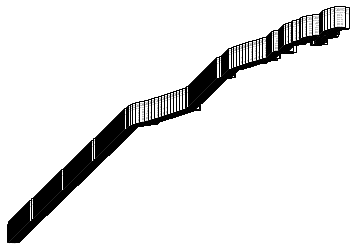

In [ ]:
runningSet = [train_features_union,trainL, test_features_union,testL]
DecisionTreeCf(runningSet)

#### DC without feature union

In [ ]:
cv_train = count_vect.fit_transform(trainF['full_text'])
cv_test = count_vect.transform(testF['full_text'])

Cross validation: Average training set result: test_accuracy=0.740739 test_precision_macro=0.326545 test_f1_macro=0.272833 test_recall_macro=0.247563 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=0.888889 train_f1_macro=0.888889 train_recall_macro=0.888889 .

Test result: {'accuracy': 0.7430093209054593, 'precision': 0.2916882428510335, 'f1': 0.3146845408009908, 'recall': 0.35183346065699006}
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         2
           1     0.0000    0.0000    0.0000         0
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.3205    0.5682    0.4098        44
           5     0.8000    0.8571    0.8276        14
           6     0.3488    0.4412    0.3896        34
           7     0.1558    0.3000    0.2051        40
           8     1.0000    1.0000    1.0000       751

   micro a

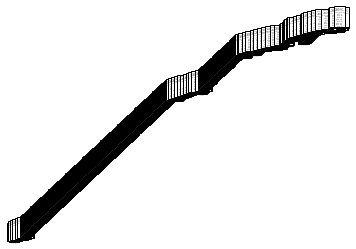

In [ ]:
runningSet = [cv_train,trainL, cv_test,testL]
DecisionTreeCf(runningSet)

#### Grid Search on decision tree

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin


fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
    ])),
    ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
        ('cv',count_vect),
    ])),
    ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
    ])),
    ])


In [ ]:
trainF_tmp = []
for i in range(4845):
  trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                     'favorite_count':trainF['favorite_count'][i]})


In [ ]:

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV



pipe = Pipeline([
#     ('selector', ItemSelector(key='reviewText')),
    # Note: This keeps count weights, not one-hot; we'll tune this parameter next.
    ('fu', fu),
    ('dt', DecisionTreeClassifier())
])

# pipe.fit(trainF, trainL)

# predictions = pipe.predict(valSetF_extract)

# evaluation_summary("Decision Tree TF-IDF", predictions, valL)                   

params = {
    # Fill in the parameter
    
    'fu__full_text__tf_idf__ngram_range':[(1,2),(1,3)],
    'fu__full_text__tf_idf__sublinear_tf': (True, False),
    'fu__full_text__tf_idf__max_features': np.linspace(10000,50000,5,dtype=int),
    'dt__max_depth': (100,200,300,400,500),
    'dt__class_weight': ['balanced','None'],
   
}

# Pass in your pipeline, params (to tune), scoring, and split parameters here!
grid_search = GridSearchCV(pipe,params,verbose=10,cv=5, scoring='f1_samples', n_jobs=-1,pre_dispatch='2*n_jobs')
print("Performing grid search...")
print("pipeline:", [name for name, _ in pipe.steps])
print("parameters:")
print(params)
#n_jobs=-1,pre_dispatch='2*n_jobs'
# FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
grid_search.fit(trainF_tmp, trainL)



print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param_name in sorted(params.keys()):
  print("\t%s: %r" % (param_name, best_parameters[param_name]))

In [ ]:
grid_search.best_score_

In [ ]:
grid_search.cv_results_

### build labels for each category

In [ ]:
data = cv19_ny_labeled
trainSet, testSet = generateTrainingSetCV(data)
# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['categories']
trainL_temp = EF(trainSet,labelList)['categories']
testL_temp = EF(testSet,labelList)['categories']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)

trainL = extractLabels_legacy(trainF,trainL_temp)
testL = extractLabels_legacy(testF,testL_temp)

Streaming output truncated to the last 5000 lines.
Discussion
Discussion
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ContextualInformation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
ThirdPartyObservation
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['News', 'EmergingThreats', 'ThirdPartyObservation', 'Sentiment', 'ContextualInformation', 'Factoid', 'MultimediaShare']
News
News
News
News
News
News
News
News
News
EmergingThreats
EmergingThreats
EmergingThreats
Emerg

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']
# A dict Contains labels for all categories e.g. trainL_single[category]
trainL_single = {}
testL_single = {}
for i in range(9):
  print('Currrent is processing on categorie %s'%(categories[i]))
  print()
  # if i == 3:
  #   continue
  trainL_one = []
  testL_one = []
  
  for j in range(len(trainL)):
    trainL_one.append(trainL[j][i])

    
  for j in range(len(testL)):
    testL_one.append(testL[j][i])
    
  trainL_single[i] = trainL_one
  testL_single[i] = testL_one

Currrent is processing on categorie GoodsServices

Currrent is processing on categorie InformationWanted

Currrent is processing on categorie Volunteer

Currrent is processing on categorie MovePeople

Currrent is processing on categorie EmergingThreats

Currrent is processing on categorie NewSubEvent

Currrent is processing on categorie ServiceAvailable

Currrent is processing on categorie Advice

Currrent is processing on categorie Any



In [ ]:
location = 'NY'
for increaseTime in range(150):
  for category in range(9):
    build_upsample_set(trainF,trainL_single,location,category,increaseTime)

Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 4 times
Current increase 4 times
Current increase 4 times
Current increase 4 times


#### Manually add positive class into test set

In [ ]:
import copy
# build special test set for type ' GoodService'
idxs_tmp = np.where(np.array(trainL_single[0])==1)

for key in testF.keys():
  testF[key].append(trainF[key][idxs_tmp[0][-1]])
  trainF[key].pop(idxs_tmp[0][-1])
for i in range(9):
  if i ==0:
    testL_single[i].append(1)
    trainL_single[i].pop(idxs_tmp[0][-1])
  else:
    testL_single[i].append(trainL_single[i][idxs_tmp[0][-1]])
    trainL_single[i].pop(idxs_tmp[0][-1])


In [ ]:
np.where(np.array(testL_single[0])==1)

In [ ]:
text = testF['full_text'][-1]
count = 0
for doc in trainF['full_text']:
  count += 1
  if doc == text:
    print('Match',count)

#### Plot up-sample figures

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import fbeta_score
train_record = {}
val_record = {}
test_record = {}
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']

for category in categories:
    train_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    val_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    test_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}





In [ ]:
location = 'NY'


for increaseTime in range(0, 100):  
  print('Current increase %d times' %(increaseTime))
  # up-sample the label

  # Run logistic regression on up-sample
  for category in range(9):
    print('Currrent is classifying categorie %s'%(categories[category]))
    print()

    if category == 4 and increaseTime >= 6:
      continue

    if category == 5 and increaseTime >= 5:
      continue

    if category == 6 and increaseTime >= 6:
      continue

    if category == 7 and increaseTime >= 4:
      continue

    if category == 3 or category == 8:
      continue

    train_features_upsample, train_label_upsample, testL_union_tmp = up_sample(location, category,increaseTime, testF)
    # print('Before up-sample: %d %f After: %d %f' %(trainL_single[category].count(1), trainL_single[category].count(1)/len(trainL_single[category]),
    #                            train_features_upsample.count(1), train_label_upsample[category].count(1)/len(train_label_upsample[category])))
        
    runningSet = [train_features_upsample,train_label_upsample,testL_union_tmp, testL_single]
    lr_Binary(runningSet,category) 


In [ ]:
def plot_metrics_Upsample(records,category,phase):
  plt.figure()
  plt.title('%s result for %s .'%(phase, category))
  length = len(records[category]['accuracy'])
  plt.plot(range(length),records[category]['accuracy'],label='accuracy')
  plt.plot(range(length),records[category]['f1'],label='f1')
  plt.plot(range(length),records[category]['recall'],label='recall')
  plt.plot(range(length),records[category]['precision'],label='precision')
  plt.xlabel('Increase Times')
  plt.ylabel('Values')
  # xticks = np.arange(16)
  # plt.xticks(xticks)
  plt.legend()
  plt.savefig(str(category)+'_'+phase+'.png',dpi=300,bbox_inches='tight')
  plt.show()

In [ ]:
phases = ['Training','Validation','Test']
for category in categories:
  if category == 'MovePeople' or category == 'Any':
    continue
  for phase in phases:
    if phase == 'Training':
      plot_metrics_Upsample(train_record,category,phase)
    elif phase == 'Validation':
      plot_metrics_Upsample(val_record,category,phase)
    else:
      plot_metrics_Upsample(test_record,category,phase)

#### Search best LR

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import FeatureUnion
from collections import defaultdict
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import fbeta_score
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)
    

def search_best_lR(increaseTimes,location):
  
  
  # iterate over a range of increaseTime and all category

  # store the best parameter for each increaseTime
  metrics_all = {'f1_best_all': defaultdict(),'best_paras': defaultdict()}
  best_parameters_all = defaultdict()
  cv_score_all = defaultdict()
  test_scores_all = defaultdict()
  for increaseTime in range(0,increaseTimes):
    metrics_one_run = {'f1_best_each_cate': defaultdict()}
    best_parameters_one_run = defaultdict()
    cv_score_one_run = defaultdict()
    print("Performing grid search on IncreaseTime %d" %(increaseTime))
    for category in range(9):
      if category == 0: # and increaseTime != 24:
        continue
      if category == 1 and increaseTime != 44:
        continue
      if category == 2: # and increaseTime != 7:
        continue
      if category == 4: #and increaseTime != 3:
        continue
      if category == 5: # and increaseTime != 3:
        continue
      if category == 6: #and increaseTime != 4:
        continue
      if category == 7 :  #and increaseTime != 1:
        continue
      if category == 3 or category == 8:
        continue

      print("Performing grid search on category %s" %(categories[category]))
      df_tmp = pd.read_csv('cache/'+location+'/upsampleData_'+str(category)+'_'+str(increaseTime)+'.csv')
      trainF = {'full_text':df_tmp['full_text'], 'hashtags': df_tmp['hashtags'], 'favorite_count': df_tmp['favorite_count']}
      trainL = list(df_tmp['target'])

      # build the training set for feature union and gridSerachCV
      trainF_tmp = []
      testF_tmp = []
      for i in range(len(trainF['full_text'])):
        trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                          'favorite_count':trainF['favorite_count'][i]})
      for i in range(len(testF['full_text'])):
        testF_tmp.append({'full_text':testF['full_text'][i],'hashtags':testF['hashtags'][i],
                          'favorite_count':testF['favorite_count'][i]})
      
      fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ])
      
      fullpipe = Pipeline([

                  ('fu', fu),
                  ('lr', LogisticRegression())
                 ])
            
      params = {
          # Fill in the parameter
          
          'fu__full_text__tf_idf__ngram_range':[(1,2),(1,3),(1,4)],
          'fu__full_text__tf_idf__sublinear_tf': (True, False),
          'fu__full_text__tf_idf__max_features': np.linspace(1000,50000,100,dtype=int),
          'lr__penalty': ['l2'],
          'lr__C': np.linspace(0.000001,1000,100,dtype=float),
          'lr__class_weight': ['balanced'],
          'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
          'lr__max_iter': np.linspace(50,10000,100,dtype=int),
      }

      # Pass in your pipeline, params (to tune), scoring, and split parameters here!
      grid_search = RandomizedSearchCV(fullpipe,params,verbose=1,cv=3,n_iter=350, scoring='f1', n_jobs=-1,pre_dispatch='2*n_jobs',)
      
      # print("pipeline:", [name for name, _ in pipe.steps])
      # print("parameters:")
      # print(params)
      #n_jobs=-1,pre_dispatch='2*n_jobs'
      # FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
      grid_search.fit(trainF_tmp, trainL)

      # evaluate the test result
      # testF_union_tmp = grid_search.transform(testF)

      predictions = grid_search.predict(testF_tmp)
      precision = precision_score(predictions, testL_single[category])
      recall = recall_score(predictions, testL_single[category])
      accuracy = accuracy_score(predictions, testL_single[category])
      f1 = fbeta_score(predictions, testL_single[category],  1,)

      test_scores = {'accuracy': accuracy,'precision': precision,'f1':f1,'recall': recall}
      print("Test result:", test_scores)

      print('type')
      print(type(trainL[0]))
      print("Best score: %0.3f" % grid_search.best_score_)
      # print("Best parameters set:")
      best_parameters = grid_search.best_estimator_.get_params()
      parameters_dict = {}
      for param_name in sorted(params.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))
        parameters_dict[param_name] = best_parameters[param_name]


      metrics_one_run['f1_best_each_cate'][category] = grid_search.best_score_
      cv_score_one_run[category] = grid_search.cv_results_
      best_parameters_one_run[category] = parameters_dict
      print(best_parameters_one_run[category])
      test_scores_all[increaseTime] = {category: test_scores}

    best_parameters_all[increaseTime] = best_parameters_one_run
    metrics_all['f1_best_all'][increaseTime] = metrics_one_run
    cv_score_all[increaseTime] = best_parameters_one_run
  return metrics_all, best_parameters_all, cv_score_all
    



In [ ]:
location = 'NY'
metrics_all, best_parameters_all, cv_score_all = search_best_lR(45,location)

In [ ]:
metrics_all

In [ ]:
best_parameters_all

## Error analysis

In [ ]:
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)
    
fu = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                # ])),
                ],n_jobs=-1)

trainF_union  = fu.fit_transform(trainF)
testF_union = fu.transform(testF)

In [ ]:
def build_best_lr(location,cf, vect_count, vect_tfidf, category, increaseTime, trainF, trainL_single, testF, testL_single):
    df_tmp = pd.read_csv('cache/' + location + '/upsampleData_' + str(category) + '_' + str(increaseTime) + '.csv')
    trainF_up_one = {'full_text': df_tmp['full_text'], 'hashtags': df_tmp['hashtags'],
                     'favorite_count': df_tmp['favorite_count']}
    trainL_up_one = list(df_tmp['target'])

    fu_best = FeatureUnion(
        [('full_text', myPipeline([('selector', ItemSelector(key='full_text')), ('tf_idf', vect_tfidf),
                                   ])),
         ('hashtags', myPipeline([('selector', ItemSelector(key='hashtags')),
                                  ('cv', vect_count),
                                  ])),
         # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
         # ])),
         ], n_jobs=-1)
    fu_best.fit(trainF_up_one)
    trainF_up_one_union = fu_best.transform(trainF_up_one)
    trainF_union = fu_best.transform(trainF)
    testF_union = fu_best.transform(testF)

    pipe = Pipeline([('fu', fu_best), ('lr', cf)
                     ])
    pipe.fit(trainF_up_one, trainL_up_one)



    print("Display result without up-sampleing: ")
    runningSet = [trainF_union, trainL_single[category], testF_union, testL_single[category]]
    lr_priority(runningSet,cf)

    print("Display result with up-sampleing: ")
    model_name = "The best LR result with featureUnion"
    # print(trainF_up_one_union.shape)
    # print(len(trainL_up_one))

    runningSet = [trainF_up_one_union, trainL_up_one, testF_union, testL_single[category]]
    evaluate_one_lr(cf, runningSet, category)

    predictions = cf.predict(testF_union)
    errors_idxs = get_errors_indexs(testL_single[category], predictions, testF)
    all_errors = get_errors(testL_single[category], predictions, testF)

    return cf, pipe, fu_best, testF_union, errors_idxs, all_errors

def build_default_lr(location, category, increaseTime, trainF, trainL_single, testF, testL_single):
    vect_count = CountVectorizer(tokenizer=tokenize_normalize, )
    vect_tfidf = TfidfVectorizer(tokenizer=tokenize_normalize, )
    cf = LogisticRegression()

    df_tmp = pd.read_csv('cache/' + location + '/upsampleData_' + str(category) + '_' + str(increaseTime) + '.csv')
    trainF_up_one = {'full_text': df_tmp['full_text'], 'hashtags': df_tmp['hashtags'],
                     'favorite_count': df_tmp['favorite_count']}
    trainL_up_one = list(df_tmp['target'])

    fu_best = FeatureUnion(
        [('full_text', myPipeline([('selector', ItemSelector(key='full_text')), ('tf_idf', vect_tfidf),
                                   ])),
         ('hashtags', myPipeline([('selector', ItemSelector(key='hashtags')),
                                  ('cv', vect_count),
                                  ])),
         # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
         # ])),
         ], n_jobs=-1)
    fu_best.fit(trainF_up_one)
    trainF_up_one_union = fu_best.transform(trainF_up_one)
    trainF_union = fu_best.transform(trainF)
    testF_union = fu_best.transform(testF)

    pipe = Pipeline([('fu', fu_best), ('lr', cf)
                     ])
    pipe.fit(trainF_up_one, trainL_up_one)



    print("Display result without up-sampleing: ")
    runningSet = [trainF_union, trainL_single[category], testF_union, testL_single[category]]
    display_result_without_upsample(cf, category, runningSet)

    print("Display result with up-sampleing: ")
    model_name = "The best LR result with featureUnion"

    runningSet = [trainF_up_one_union, trainL_up_one, testF_union, testL_single]
    evaluate_one_lr(cf, runningSet, category)

    predictions = cf.predict(testF_union)
    errors_idxs = get_errors_indexs(testL_single[category], predictions, testF)
    all_errors = get_errors(testL_single[category], predictions, testF)

    return cf, pipe, fu_best,  errors_idxs, all_errors

def print_all_featrues_of_one_sample(sample,idx):
    for key in sample.keys():
        print(key,sample[key][idx])

def build_best_lr_without_featureunion(location,cf, vect_tfidf, category, increaseTime, trainF, trainL_single, testF, testL_single):
    df_tmp = pd.read_csv('cache/' + location + '/upsampleData_' + str(category) + '_' + str(increaseTime) + '.csv')
    trainF_up_one = df_tmp['full_text']
    trainL_up_one = list(df_tmp['target'])

    trainF_up_one= vect_tfidf.transform(trainF_up_one)
    testF_transformed = vect_tfidf.transform(testF['full_text'])

    cf.fit(trainF_up_one, trainL_up_one)

    return cf,testF_transformed 

### For 'GoodsServices'

In [ ]:

# build the training set for feature union and gridSerachCV
# trainF_tmp_GS = []
# for i in range(len(trainF['full_text'])):
#   trainF_tmp_GS.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
#                           'favorite_count':trainF['favorite_count'][i]})
location = 'NY'
from sklearn.linear_model import LogisticRegression
count_vect_GS = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_GS = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=45050,ngram_range=(1,2),sublinear_tf=True)
best_lr_GS = LogisticRegression(C=989.8989,class_weight='balanced',max_iter=3065,penalty='l2',solver='newton-cg')

category_GS = 0
increaseTime_GS = 24

best_lr_GS, pipe_GS, fu_GS, testF_union_GS, errors_idxs_GS, all_errors_GS = build_best_lr(location,best_lr_GS,count_vect_GS,Tfidf_vect_GS, category_GS,increaseTime_GS, trainF,trainL_single,testF,testL_single)



Number2
1
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.993719 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.994289 train_precision=0.800000 train_f1=0.164444 train_recall=0.091667 .

Test result: {'accuracy': 0.996005326231691, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9960    0.9980       751
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9960       751
   macro avg     0.5000    0.4980    0.4990       751
weighted avg     1.0000    0.9960    0.9980       751

Display result with up-sampleing: 
Number1
1
Cross validation: Average training set result: test_accuracy=0.987593 test_precision=1.000000 test_f1=0.941176 test_recall=0.909091 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_p

In [ ]:
default_lr_GS, default_pipe_GS, default_fu_GS, default_errors_idxs_GS, default_all_errors_GS = build_default_lr(location, category_GS,increaseTime_GS, trainF,trainL_single,testF,testL_single)

In [ ]:
errors_idxs_GS

[15, 114]

In [ ]:
all_errors_GS

,index,True label,Prediction,full_text,hashtags,favorite_count
0,15,0,1,Coronavirus vaccine ready for clinical trials ...,,1
1,114,1,0,@realDonaldTrump Major coronavirus high risk c...,Seattle Amazon Boeing Microsoft walmart,0


In [ ]:
import eli5
from eli5.lime import TextExplainer
eli5.show_weights(best_lr_GS, feature_names=fu_GS.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+9.593,full_text__https://t.co/7wi3vbi8bd
+9.593,full_text__seattle https://t.co/7wi3vbi8bd
+7.711,full_text__covid
+5.252,full_text__clinical trials
+5.252,full_text__ready clinical
+5.188,full_text__vaccine ready
+5.017,full_text__trials seattle
+4.944,full_text__trials
+4.929,full_text__seattle https://t.co/jntbswem5p
+4.929,full_text__organizing


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_GS[0])
eli5.show_prediction(best_lr_GS,testF_union_GS[errors_idxs_GS[0]], feature_names=fu_GS.get_feature_names(), top=50)

full_text Coronavirus vaccine ready for clinical trials in Seattle | https://t.co/YUevV6qsMD https://t.co/JnoeVsFUfg
entities {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/YUevV6qsMD', 'expanded_url': 'http://kgw.com', 'display_url': 'kgw.com', 'indices': [59, 82]}, {'url': 'https://t.co/JnoeVsFUfg', 'expanded_url': 'https://www.kgw.com/article/news/health/coronavirus/coronavirus-vaccine-clinical-trial-recruitment/281-a33490a2-e3e4-4911-94fc-60473c2d4fe7', 'display_url': 'kgw.com/article/news/h…', 'indices': [83, 106]}]}
favorite_count 1
hashtags  
TfidfVectorizer
CountVectorizer


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_GS[1])
eli5.show_prediction(best_lr_GS,testF_union_GS[errors_idxs_GS[1]], feature_names=fu_GS.get_feature_names(), top=50)

full_text @realDonaldTrump Major coronavirus high risk cities 4 #Seattle.  companies, need employees relief #Amazon #Boeing #Microsoft #walmart
entities {'hashtags': [{'text': 'Seattle', 'indices': [54, 62]}, {'text': 'Amazon', 'indices': [98, 105]}, {'text': 'Boeing', 'indices': [106, 113]}, {'text': 'Microsoft', 'indices': [114, 124]}, {'text': 'walmart', 'indices': [125, 133]}], 'symbols': [], 'user_mentions': [{'screen_name': 'realDonaldTrump', 'name': 'Donald J. Trump', 'id': 25073877, 'id_str': '25073877', 'indices': [0, 16]}], 'urls': []}
favorite_count 0
hashtags  Seattle Amazon Boeing Microsoft walmart 
TfidfVectorizer
CountVectorizer


### For 'InformationWanted'

In [ ]:

from sklearn.linear_model import LogisticRegression
count_vect_IW = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_IW = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=22777,ngram_range=(1,4),sublinear_tf=True)
best_lr_IW = LogisticRegression(C=10.101,class_weight='balanced',max_iter=3668,penalty='l2',solver='newton-cg')

category_IW = 1
increaseTime_IW = 44

best_lr_IW, pipe_IW, fu_IW, testF_union_IW, errors_idxs_IW, all_errors_IW = build_best_lr(location,best_lr_IW,count_vect_IW,Tfidf_vect_IW, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.997716 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.997716 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9986684420772304, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9987    0.9993       751
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9987       751
   macro avg     0.5000    0.4993    0.4997       751
weighted avg     1.0000    0.9987    0.9993       751

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=1.000000 test_precision=1.000000 test_f1=1.000000 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_IW, default_pipe_IW, default_fu_IW, default_errors_idxs_IW, default_all_errors_IW = build_default_lr(location, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.995009 test_precision_macro=0.497505 test_f1_macro=0.498749 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.995008 train_precision_macro=0.497504 train_f1_macro=0.498749 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.995 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.995     0.998      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.995      1442
   macro avg      0.500     0.498     0.499      1442
weighted avg      1.000     0.995     0.998      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.995 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.995     0.998      1443
           1      0.000     0.000     0.000         0

    accuracy                          0.995      1443
   macro avg      0.500     0.498     0.499      1443
weighted avg      1.000     0.995     0.998      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.994 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.994     0.997       360
           1      0.000     0.000     0.000         0

    accuracy                          0.994       360
   macro avg      0.50

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein



Cross validation: Average validation set result: train_accuracy=0.999545 train_precision=1.000000 train_f1=0.998764 train_recall=0.997531 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1356
           1      1.000     1.000     1.000       403

    accuracy                          1.000      1759
   macro avg      1.000     1.000     1.000      1759
weighted avg      1.000     1.000     1.000      1759

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       438
           1      1.000     1.000     1.000         2

    accuracy                  

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to c

In [ ]:
all_errors_IW

,index,True label,Prediction,full_text,hashtags,favorite_count
0,66,1,0,Please complete this Economic Impact Survey by...,,1
1,257,1,0,@ColeMillerTV What’s the difference between “2...,,0
2,385,1,0,@RealRBHJr @b0yle re: your geekwire stories: w...,,1


In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr_IW, feature_names=fu_IW.get_feature_names(), top=(30,30))

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.411,full_text__run tests
+4.411,full_text__run tests kirkland
+4.382,full_text__tests kirkland
+4.207,full_text__run
+3.463,hashtags__evergreenhospital
+3.357,full_text__kirkland
+2.817,full_text__tests
+2.519,hashtags__fakenews
+2.519,hashtags__jaketapper
+2.309,hashtags__trump


In [ ]:
cf,testF_transformed_IW = build_best_lr_without_featureunion(location,best_lr_IW,Tfidf_vect_IW, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)

In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[0])
eli5.show_prediction(cf, testF_transformed_IW[errors_idxs_IW[0]], feature_names=Tfidf_vect_IW.get_feature_names(), top=(50,20))

full_text Please complete this Economic Impact Survey by March 31 to help our region recover from the economic effects of COVID-19. The survey also provides the opportunity for respondents to reach out for help and get “back to business” as quickly as possible. 

https://t.co/XjZ5zLJZUp
entities {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/XjZ5zLJZUp', 'expanded_url': 'http://www.greater-seattle.com/economic-impact-survey', 'display_url': 'greater-seattle.com/economic-impac…', 'indices': [254, 277]}]}
favorite_count 1
hashtags  


In [ ]:
eli5.explain_prediction

In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[1])
eli5.show_prediction(best_lr_IW,testF_union_IW[errors_idxs_IW[1]], feature_names=fu_IW.get_feature_names(), top=(50,20))

full_text @ColeMillerTV What’s the difference between “2 new cases at this Kirkland care facility” vs “50+ sick with “respiratory symptoms”? Is it that the 2 new cases were confirmed through lab testing and the 50 weren’t?
entities {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'ColeMillerTV', 'name': 'Cole Miller', 'id': 2361749558, 'id_str': '2361749558', 'indices': [0, 13]}], 'urls': []}
favorite_count 0
hashtags  
TfidfVectorizer
CountVectorizer


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[2])
eli5.show_prediction(best_lr_IW,testF_union_IW[errors_idxs_IW[2]], feature_names=fu_IW.get_feature_names(), top=(50,20))

full_text @RealRBHJr @b0yle re: your geekwire stories: where if anywhere will UW Virology Covid-19 results be posted?  Would be useful for the public here in Seattle
entities {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'RealRBHJr', 'name': 'Roland B. Hedley Jr.', 'id': 809043928276238336, 'id_str': '809043928276238336', 'indices': [0, 10]}, {'screen_name': 'b0yle', 'name': 'Alan Boyle', 'id': 13691782, 'id_str': '13691782', 'indices': [11, 17]}], 'urls': []}
favorite_count 1
hashtags  
TfidfVectorizer
CountVectorizer


### For 'Volunteer'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_V = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_V = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=9909,ngram_range=(1,4),sublinear_tf=True)
best_lr_V = LogisticRegression(C=555.555556,class_weight='balanced',max_iter=3869,penalty='l2',solver='newton-cg')

category_V = 2
increaseTime_V = 7

best_lr_V, pipe_V, fu_V, trainF_up_one_union_V, errors_idxs_V, all_errors_V = build_best_lr(location,best_lr_V,count_vect_V,Tfidf_vect_V, category_V,increaseTime_V, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.992576 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.992576 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9946737683089214, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9947    0.9973       751
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9947       751
   macro avg     0.5000    0.4973    0.4987       751
weighted avg     1.0000    0.9947    0.9973       751

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.995664 test_precision=1.000000 test_f1=0.952941 test_recall=0.923810 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_V, default_pipe_V, default_fu_V, default_trainF_up_one_union_V, default_errors_idxs_V, default_all_errors_V = build_default_lr(location, category_V,increaseTime_V, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.993900 test_precision_macro=0.496950 test_f1_macro=0.498470 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.993899 train_precision_macro=0.496950 train_f1_macro=0.498470 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.994 P=0.500 R=0.497 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.994     0.997      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.994      1442
   macro avg      0.500     0.497     0.498      1442
weighted avg      1.000     0.994     0.997      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM


Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.994 P=0.500 R=0.497 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.994     0.997      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.994      1442
   macro avg      0.500     0.497     0.498      1442
weighted avg      1.000     0.994     0.997      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.994 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.994     0.997       361
           1      0.000     0.000     0.000         0

    accuracy                          0.994       361
   macro avg      0.500     0.497     0.499       361
weighted avg      1.000     0.994     0.997       361

Ev

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein

Cross validation: Average training set result: test_accuracy=0.961170 test_precision=0.800000 test_f1=0.263885 test_recall=0.173203 .

Cross validation: Average validation set result: train_accuracy=0.991622 train_precision=1.000000 train_f1=0.900057 train_recall=0.821288 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.872 R=0.992 F1=0.923
              precision    recall  f1-score   support

           0      1.000     0.985     0.992      1440
           1      0.744     1.000     0.853        64

    accuracy                          0.985      1504
   macro avg      0.872     0.992     0.923      1504
weighted avg      0.989     0.985     0.986      1504

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.995 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p

In [ ]:
errors_idxs_V

[78, 127, 229, 291, 397, 771, 773]

In [ ]:
all_errors_V

,index,True label,Prediction,full_text,hashtags,favorite_count
0,78,1,0,Participate in a #COVID19 study \nhttps://t.co...,COVID19,0
1,127,1,0,Sign up! I can’t.. https://t.co/UMmzcgmGWc,,0
2,229,1,0,The world's first covid-19 vaccine trial is st...,,0
3,291,1,0,2/ I know there are a LOT of you who I haven't...,coronacrisis,103
4,397,1,0,"""The world needs us ALL."" Ciara and Seattle Se...",,81
5,771,1,0,"@strangeharbors The hospitals, clinics, skille...",,0
6,773,1,0,@politicalmath @jessesingal Would like to add ...,,0


Cross validation training set result: test_accuracy=0.995859 test_f1_macro=0.498963 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.995859 test_f1_macro=0.498963 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.996 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.996     0.998      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.996      4588
   macro avg      0.500     0.498     0.499      4588
weighted avg      1.000     0.996     0.998      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.995 P=0.500 R=0.497 F1=0.499
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union_V,trainL_up_one_V,testF_union_V,testL_single[category]]
total_evaluation(best_lr_V,model_name,runningSet)

Cross validation training set result: test_accuracy=0.952872 test_f1_macro=0.757805 test_recall_macro=0.719700 .

Cross validation validation set result: test_accuracy=0.952872 test_f1_macro=0.757805 test_recall_macro=0.719700 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.998 P=0.999 R=0.988 F1=0.993
              precision    recall  f1-score   support

           0      0.998     1.000     0.999      4815
           1      1.000     0.975     0.988       448

    accuracy                          0.998      5263
   macro avg      0.999     0.988     0.993      5263
weighted avg      0.998     0.998     0.998      5263

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.995 P=0.666 R=0.748 F1=0.699
              precision    recall  f1-score   support

           0      0.998 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.999', '0.988', '0.993', '0.666', '0.748', '0.699')

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr_V, feature_names=fu_V.get_feature_names(), top=70)

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


TfidfVectorizer
CountVectorizer


Weight?,Feature
+8.202,hashtags__clinicaltrials
+7.078,full_text__volunteers
+5.179,full_text__sew
+4.623,full_text__clinical
+4.328,full_text__clinical trials seattle
+4.328,full_text__ready clinical
+4.328,full_text__clinical trials
+4.328,full_text__coronavirus vaccine ready
+4.328,full_text__coronavirus vaccine ready clinical
+4.328,full_text__vaccine ready clinical


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[errors_idxs_V[0]], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[1], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[2], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'EmergingThreats'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_ET = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_ET = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=6444,ngram_range=(1,3),sublinear_tf=True)
best_lr_ET = LogisticRegression(C=80.808,class_weight='balanced',max_iter=9296,penalty='l2',solver='newton-cg')

category_ET = 4
increaseTime_ET = 4

best_lr_ET, pipe_ET, fu_ET, trainF_up_one_union_ET, errors_idxs_ET, all_errors_ET = build_best_lr(location,best_lr_ET,count_vect_ET,Tfidf_vect_ET, category_ET,increaseTime_ET, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.905197 test_precision=0.600000 test_f1=0.045079 test_recall=0.023529 .

Cross validation: Average validation set result: train_accuracy=0.913335 train_precision=0.970707 train_f1=0.189207 train_recall=0.105076 .

Test result: {'accuracy': 0.9134487350199734, 'precision': 0.1794871794871795, 'f1': 0.3010752688172043, 'recall': 0.9333333333333333}
              precision    recall  f1-score   support

           0     0.9985    0.9130    0.9539       736
           1     0.1795    0.9333    0.3011        15

    accuracy                         0.9134       751
   macro avg     0.5890    0.9232    0.6275       751
weighted avg     0.9822    0.9134    0.9408       751

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.994641 test_precision=0.985003 test_f1=0.992406 test_recall=1.000000 .

Cross validation: Average validation set result: train

In [ ]:
default_lr_ET, default_pipe_ET, default_fu_ET, default_trainF_up_one_union_ET, default_errors_idxs_ET, default_all_errors_ET = build_default_lr(location, category_ET,increaseTime_ET, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.921801 test_precision_macro=0.910990 test_f1_macro=0.529610 test_recall_macro=0.526939 .

Cross validation: Average validation set result: train_accuracy=0.934554 train_precision_macro=0.966724 train_f1_macro=0.651172 train_recall_macro=0.601360 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.936 P=0.581 R=0.967 F1=0.623
              precision    recall  f1-score   support

           0      1.000     0.935     0.966      1424
           1      0.162     1.000     0.279        18

    accuracy                          0.936      1442
   macro avg      0.581     0.967     0.623      1442
weighted avg      0.990     0.936     0.958      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Cross validation: Average training set result: test_accuracy=0.877244 test_precision=0.953335 test_f1=0.752890 test_recall=0.632432 .

Cross validation: Average validation set result: train_accuracy=0.980480 train_precision=0.982888 train_f1=0.967851 train_recall=0.953378 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.991 R=0.988 F1=0.989
              precision    recall  f1-score   support

           0      0.988     0.996     0.992      1207
           1      0.993     0.980     0.987       709

    accuracy                          0.990      1916
   macro avg      0.991     0.988     0.989      1916
weighted avg      0.990     0.990     0.990      1916

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.979 P=0.989 R=0.900 F1=0.939
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.975 R=0.981 F1=0.978
              precision    recall  f1-score   support

           0      0.991     0.982     0.986      1332
           1      0.960     0.979     0.969       584

    accuracy                          0.981      1916
   macro avg      0.975     0.981     0.978      1916
weighted avg      0.981     0.981     0.981      1916

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.830 R=0.905 F1=0.856
              precision    recall  f1-score   support

           0      0.979     0.877     0.925       374
           1      0.681     0.933     0.787       105

    accuracy                          0.889       479
   macro avg      0.830     0.905     0.856       479
weighted avg      0.914     0.889     0.895       479

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. Fro

In [ ]:
all_errors_ET

,index,True label,Prediction,full_text,hashtags,favorite_count
0,15,0,1,Coronavirus vaccine ready for clinical trials ...,,1
1,114,1,0,@realDonaldTrump Major coronavirus high risk c...,Seattle Amazon Boeing Microsoft walmart,0


In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[idx], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer


In [ ]:
count = 1
for idx in errors_idxs:
  if count == 0:
    break
  count -= 1
  eli5.show_prediction(best_lr,trainF_up_one_union[idx], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer


### For 'NewSubEvent'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_NS = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_NS = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=19808,ngram_range=(1,4),sublinear_tf=True)
best_lr_NS = LogisticRegression(C=545,class_weight='balanced',max_iter=8994,penalty='l2',solver='liblinear')

category_NS = 5
increaseTime_NS = 4

best_lr_NS, pipe_NS, fu_NS, trainF_up_one_union_NS, errors_idxs_NS, all_errors_NS = build_best_lr(location,best_lr_NS,count_vect_NS,Tfidf_vect_NS, category_NS,increaseTime_NS, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.980583 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.980868 train_precision=0.400000 train_f1=0.028079 train_recall=0.014550 .

Test result: {'accuracy': 0.9813581890812251, 'precision': 0.06666666666666667, 'f1': 0.125, 'recall': 1.0}
              precision    recall  f1-score   support

           0     1.0000    0.9813    0.9906       750
           1     0.0667    1.0000    0.1250         1

    accuracy                         0.9814       751
   macro avg     0.5333    0.9907    0.5578       751
weighted avg     0.9988    0.9814    0.9894       751

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.999471 test_precision=0.994286 test_f1=0.997101 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_pr

In [ ]:
default_lr_NS, default_pipe_NS, default_fu_NS, default_trainF_up_one_union_NS, default_errors_idxs_NS, default_all_errors_NS = build_default_lr(location, category_NS,increaseTime_NS, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined 

Cross validation: Average training set result: test_accuracy=0.932893 test_precision_macro=0.666910 test_f1_macro=0.505995 test_recall_macro=0.511905 .

Cross validation: Average validation set result: train_accuracy=0.941625 train_precision_macro=0.955690 train_f1_macro=0.608011 train_recall_macro=0.570575 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.940 P=0.547 R=0.920 F1=0.570
              precision    recall  f1-score   support

           0      0.999     0.940     0.969      1432
           1      0.095     0.900     0.171        10

    accuracy                          0.940      1442
   macro avg      0.547     0.920     0.570      1442
weighted avg      0.993     0.940     0.963      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein


Display result with up-sampleing: 
Number1
3

Cross validation: Average training set result: test_accuracy=0.885169 test_precision=0.938421 test_f1=0.727846 test_recall=0.606557 .

Cross validation: Average validation set result: train_accuracy=0.976210 train_precision=0.979206 train_f1=0.953979 train_recall=0.930328 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.992 R=0.989 F1=0.991
              precision    recall  f1-score   support

           0      0.991     0.997     0.994      1245
           1      0.993     0.981     0.987       587

    accuracy                          0.992      1832
   macro avg      0.992     0.989     0.991      1832
weighted avg      0.992     0.992     0.992      1832

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.976 P=0.972 R=0.871 F1=0.914
              

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


              precision    recall  f1-score   support

           0      0.977     0.965     0.971       404
           1      0.763     0.833     0.796        54

    accuracy                          0.950       458
   macro avg      0.870     0.899     0.884       458
weighted avg      0.952     0.950     0.951       458

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.946 P=0.677 R=0.963 F1=0.747
              precision    recall  f1-score   support

           0      0.999     0.945     0.971      1778
           1      0.355     0.982     0.522        55

    accuracy                          0.946      1833
   macro avg      0.677     0.963     0.747      1833
weighted avg      0.980     0.946     0.958      1833

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.188 P=0.094 R=0.500 F1=0.158
              precision    recall  f1-sco

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

Cross validation training set result: test_accuracy=0.970575 test_f1_macro=0.492534 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.970575 test_f1_macro=0.492534 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.971 P=0.500 R=0.485 F1=0.493
              precision    recall  f1-score   support

           0      1.000     0.971     0.985      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.971      4588
   macro avg      0.500     0.485     0.493      4588
weighted avg      1.000     0.971     0.985      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.981 P=0.500 R=0.490 F1=0.495
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.784639 test_f1_macro=0.743874 test_recall_macro=0.732088 .

Cross validation validation set result: test_accuracy=0.784639 test_f1_macro=0.743874 test_recall_macro=0.732088 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.944 P=0.955 R=0.934 F1=0.941
              precision    recall  f1-score   support

           0      0.911     1.000     0.953      4171
           1      1.000     0.867     0.929      3068

    accuracy                          0.944      7239
   macro avg      0.955     0.934     0.941      7239
weighted avg      0.949     0.944     0.943      7239

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.959 P=0.667 R=0.591 F1=0.616
              precision    recall  f1-score   support

           0      0.971 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.955', '0.934', '0.941', '0.667', '0.591', '0.616')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

141

In [ ]:
import eli5
from eli5.lime import TextExplainer

eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.002,full_text__state
+3.656,full_text__https://t.co/w0vcimhmjf
+3.560,full_text__kirkland
+3.530,full_text__6
+3.434,full_text__usps
+3.387,full_text__second
+3.373,full_text__2
+3.027,full_text__https://t.co/2cee1gnpup
+3.012,full_text__dead
+2.798,full_text__https://t.co/k50vkkeyaa


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4171
1                 3068



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'ServiceAvailable'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_SA = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_SA = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=41585,ngram_range=(1,4),sublinear_tf=True)
best_lr_SA = LogisticRegression(C=989.8989,class_weight='balanced',max_iter=653,penalty='l2',solver='lbfgs')

category_SA = 6
increaseTime_SA = 4

best_lr_SA, pipe_SA, fu_SA, trainF_up_one_union_SA, errors_idxs_SA, all_errors_SA = build_best_lr(location,best_lr_SA,count_vect_SA,Tfidf_vect_SA, category_SA,increaseTime_SA, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.932039 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.935037 train_precision=1.000000 train_f1=0.084252 train_recall=0.044123 .

Test result: {'accuracy': 0.9427430093209055, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9427    0.9705       751
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9427       751
   macro avg     0.5000    0.4714    0.4853       751
weighted avg     1.0000    0.9427    0.9705       751

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.997756 test_precision=0.991694 test_f1=0.995823 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_SA, default_pipe_SA, default_fu_SA, default_trainF_up_one_union_SA, default_errors_idxs_SA, default_all_errors_SA = build_default_lr(location, category_SA,increaseTime_SA, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.955075 test_precision_macro=0.477538 test_f1_macro=0.488511 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.956739 train_precision_macro=0.978334 train_f1_macro=0.524275 train_recall_macro=0.518486 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.958 P=0.523 R=0.979 F1=0.534
              precision    recall  f1-score   support

           0      1.000     0.958     0.978      1439
           1      0.047     1.000     0.090         3

    accuracy                          0.958      1442
   macro avg      0.523     0.979     0.534      1442
weighted avg      0.998     0.958     0.976      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p

Cross validation: Average training set result: test_accuracy=0.880558 test_precision=1.000000 test_f1=0.510624 test_recall=0.372840 .

Cross validation: Average validation set result: train_accuracy=0.976373 train_precision=1.000000 train_f1=0.933003 train_recall=0.875926 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.979 R=0.994 F1=0.986
              precision    recall  f1-score   support

           0      1.000     0.988     0.994      1332
           1      0.958     1.000     0.979       369

    accuracy                          0.991      1701
   macro avg      0.979     0.994     0.986      1701
weighted avg      0.991     0.991     0.991      1701

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.991 P=0.900 R=0.995 F1=0.942
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.972 R=0.992 F1=0.981
              precision    recall  f1-score   support

           0      1.000     0.984     0.992      1335
           1      0.943     1.000     0.971       367

    accuracy                          0.987      1702
   macro avg      0.972     0.992     0.981      1702
weighted avg      0.988     0.987     0.987      1702

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.993 P=0.906 R=0.996 F1=0.946
              precision    recall  f1-score   support

           0      1.000     0.993     0.996       412
           1      0.812     1.000     0.897        13

    accuracy                          0.993       425
   macro avg      0.906     0.996     0.946       425
weighted avg      0.994     0.993     0.993       425

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

Cross validation training set result: test_accuracy=0.976461 test_f1_macro=0.494045 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.976461 test_f1_macro=0.494045 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.976 P=0.500 R=0.488 F1=0.494
              precision    recall  f1-score   support

           0      1.000     0.976     0.988      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.976      4588
   macro avg      0.500     0.488     0.494      4588
weighted avg      1.000     0.976     0.988      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.967 P=0.500 R=0.483 F1=0.492
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.841716 test_f1_macro=0.708687 test_recall_macro=0.674861 .

Cross validation validation set result: test_accuracy=0.841716 test_f1_macro=0.708687 test_recall_macro=0.674861 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.977 P=0.985 R=0.955 F1=0.969
              precision    recall  f1-score   support

           0      0.971     1.000     0.985      4598
           1      1.000     0.910     0.953      1543

    accuracy                          0.977      6141
   macro avg      0.985     0.955     0.969      6141
weighted avg      0.978     0.977     0.977      6141

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.963 P=0.702 R=0.712 F1=0.707
              precision    recall  f1-score   support

           0      0.982 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.985', '0.955', '0.969', '0.702', '0.712', '0.707')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

93

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.462,full_text__motel
+3.530,full_text__testing
+3.482,full_text__https://t.co/wyxhbetin9
+3.460,full_text__https://t.co/ibxaxnn9lm
+3.444,full_text__https://t.co/2l9rpzdp6a
+3.280,full_text__drive
+3.234,full_text__million
+2.908,full_text__gates
+2.649,full_text__kits
+2.539,full_text__buy


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4598
1                 1543



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'Advice'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_A = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_A = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=49010,ngram_range=(1,4),sublinear_tf=True)
best_lr_A = LogisticRegression(C=343.434,class_weight='balanced',max_iter=7185,penalty='l2',solver='lbfgs')

category_A = 7
increaseTime_A = 1

best_lr_A, pipe_A, fu_A, trainF_up_one_union_A, errors_idxs_A, all_errors_A = build_best_lr(location,best_lr_A,count_vect_A,Tfidf_vect_A, category_A,increaseTime_A, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.909766 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.914478 train_precision=1.000000 train_f1=0.099142 train_recall=0.052218 .

Test result: {'accuracy': 0.8974700399467377, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.8975    0.9460       751
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.8975       751
   macro avg     0.5000    0.4487    0.4730       751
weighted avg     1.0000    0.8975    0.9460       751

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.987429 test_precision=0.930001 test_f1=0.963582 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_A, default_pipe_A, default_fu_A, default_trainF_up_one_union_A, default_errors_idxs_A, default_all_errors_A = build_default_lr(location, category_A,increaseTime_A, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.875763 test_precision_macro=0.437882 test_f1_macro=0.466884 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.881864 train_precision_macro=0.940571 train_f1_macro=0.515000 train_recall_macro=0.524550 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.881 P=0.530 R=0.940 F1=0.525
              precision    recall  f1-score   support

           0      1.000     0.881     0.936      1431
           1      0.060     1.000     0.114        11

    accuracy                          0.881      1442
   macro avg      0.530     0.940     0.525      1442
weighted avg      0.993     0.881     0.930      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p


Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.880 P=0.525 R=0.940 F1=0.515
              precision    recall  f1-score   support

           0      1.000     0.879     0.936      1434
           1      0.049     1.000     0.094         9

    accuracy                          0.880      1443
   macro avg      0.525     0.940     0.515      1443
weighted avg      0.994     0.880     0.931      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.883 P=0.500 R=0.442 F1=0.469
              precision    recall  f1-score   support

           0      1.000     0.883     0.938       360
           1      0.000     0.000     0.000         0

    accuracy                          0.883       360
   macro avg      0.500     0.442     0.469       360
weighted avg      1.000     0.883     0.938       360

Ev

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross validation: Average training set result: test_accuracy=0.815491 test_precision=0.943137 test_f1=0.295819 test_recall=0.176404 .

Cross validation: Average validation set result: train_accuracy=0.853354 train_precision=1.000000 train_f1=0.503369 train_recall=0.336479 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.853 P=0.701 R=0.918 F1=0.742
              precision    recall  f1-score   support

           0      1.000     0.836     0.911      1460
           1      0.403     1.000     0.574       161

    accuracy                          0.853      1621
   macro avg      0.701     0.918     0.742      1621
weighted avg      0.941     0.853     0.877      1621

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.904 P=0.594 R=0.951 F1=0.632
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.853 P=0.699 R=0.918 F1=0.740
              precision    recall  f1-score   support

           0      1.000     0.837     0.911      1464
           1      0.398     1.000     0.569       158

    accuracy                          0.853      1622
   macro avg      0.699     0.918     0.740      1622
weighted avg      0.941     0.853     0.878      1622

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.904 P=0.618 R=0.950 F1=0.664
              precision    recall  f1-score   support

           0      1.000     0.901     0.948       393
           1      0.235     1.000     0.381        12

    accuracy                          0.904       405
   macro avg      0.618     0.950     0.664       405
weighted avg      0.977     0.904     0.931       405

Evaluation for: LogisticRegressionresult o

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

NameError: ignored

In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.777178 test_f1_macro=0.688633 test_recall_macro=0.678187 .

Cross validation validation set result: test_accuracy=0.777178 test_f1_macro=0.688633 test_recall_macro=0.678187 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.949 P=0.953 R=0.935 F1=0.943
              precision    recall  f1-score   support

           0      0.942     0.982     0.962      4354
           1      0.964     0.888     0.925      2333

    accuracy                          0.949      6687
   macro avg      0.953     0.935     0.943      6687
weighted avg      0.950     0.949     0.949      6687

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.913 P=0.600 R=0.636 F1=0.615
              precision    recall  f1-score   support

           0      0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.953', '0.935', '0.943', '0.600', '0.636', '0.615')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

244

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+3.224,full_text__survivor
+3.121,full_text__stay
+2.956,full_text__woman
+2.625,full_text__social
+2.455,full_text__avoid
+2.412,full_text__recovered
+2.389,full_text__https://t.co/ckgygq2zo6
+2.371,full_text__help
+2.247,full_text__panic
+2.217,full_text__novel


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4354
1                 2333



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


# Work on DC

#### Vectorize data

In [ ]:


count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=25000,ngram_range=(1,2),sublinear_tf=(1,2))
    

#### Identify the data set

In [ ]:
# Choose one dataset to use in this section
Tweets = cv19_dc_labeled
trainSet, testSet = generateTrainingSetCV(Tweets)

#### Build labels for multi-label multi-class classification

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']


In [ ]:

# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['categories']
trainL_temp = EF(trainSet,labelList)['categories']
testL_temp = EF(testSet,labelList)['categories']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)
trainL = extractLabels_legacy(trainF,trainL_temp)
testL = extractLabels_legacy(testF,testL_temp)

Streaming output truncated to the last 5000 lines.
Official
Official
Official
Official
Official
Official
Official
Official
Official
EmergingThreats
EmergingThreats
EmergingThreats
EmergingThreats
EmergingThreats
match
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 1, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 

#### Feature union

In [ ]:
from sklearn.pipeline import FeatureUnion

fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
    ])),
    ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
        ('cv',count_vect),
    ])),
    ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
    ])),
    ],n_jobs=-1)


fu.fit(trainF)
train_features_union = fu.transform(trainF)
test_features_union = fu.transform(testF)

#### Dummmy Classifier

In [ ]:
runningSet = [train_features_union,trainL, test_features_union,testL]
DummyResult(runningSet)

Evaluate dummy classifier with strategy of most_frequent
Cross validation: Average training set result: test_accuracy=0.761862 test_precision_macro=0.111111 test_f1_macro=0.111111 test_recall_macro=0.111111 .

Cross validation: Average validation set result: train_accuracy=0.761851 train_precision_macro=0.111111 train_f1_macro=0.111111 train_recall_macro=0.111111 .

Evaluate dummy classifier with strategy of stratified
Cross validation: Average training set result: test_accuracy=0.575670 test_precision_macro=0.141937 test_f1_macro=0.139487 test_recall_macro=0.139006 .

Cross validation: Average validation set result: train_accuracy=0.575386 train_precision_macro=0.141509 train_f1_macro=0.141561 train_recall_macro=0.141733 .



### Decision tree

In [ ]:
import warnings
warnings.filterwarnings("ignore")

#### DC with feature union

Cross validation: Average training set result: test_accuracy=0.738445 test_precision_macro=0.334434 test_f1_macro=0.283590 test_recall_macro=0.259957 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=0.888889 train_f1_macro=0.888889 train_recall_macro=0.888889 .

Test result: {'accuracy': 0.6790945406125166, 'precision': 0.32195061613666265, 'f1': 0.33593427645151785, 'recall': 0.36091023309154924}
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         2
           1     0.0000    0.0000    0.0000         0
           2     0.2500    0.5000    0.3333         2
           3     0.0000    0.0000    0.0000         0
           4     0.4359    0.4146    0.4250        82
           5     0.8000    0.8571    0.8276        14
           6     0.2558    0.2500    0.2529        44
           7     0.1558    0.2264    0.1846        53
           8     1.0000    1.0000    1.0000       751

   micro

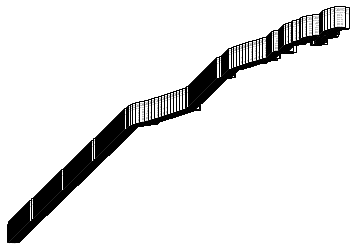

In [ ]:
runningSet = [train_features_union,trainL, test_features_union,testL]
DecisionTreeCf(runningSet)

#### DC without feature union

In [ ]:
cv_train = count_vect.fit_transform(trainF['full_text'])
cv_test = count_vect.transform(testF['full_text'])

Cross validation: Average training set result: test_accuracy=0.740739 test_precision_macro=0.326545 test_f1_macro=0.272833 test_recall_macro=0.247563 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision_macro=0.888889 train_f1_macro=0.888889 train_recall_macro=0.888889 .

Test result: {'accuracy': 0.7430093209054593, 'precision': 0.2916882428510335, 'f1': 0.3146845408009908, 'recall': 0.35183346065699006}
              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         2
           1     0.0000    0.0000    0.0000         0
           2     0.0000    0.0000    0.0000         0
           3     0.0000    0.0000    0.0000         0
           4     0.3205    0.5682    0.4098        44
           5     0.8000    0.8571    0.8276        14
           6     0.3488    0.4412    0.3896        34
           7     0.1558    0.3000    0.2051        40
           8     1.0000    1.0000    1.0000       751

   micro a

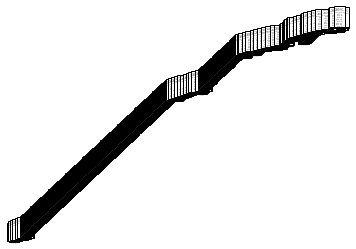

In [ ]:
runningSet = [cv_train,trainL, cv_test,testL]
DecisionTreeCf(runningSet)

#### Grid Search on decision tree

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin


fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
    ])),
    ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
        ('cv',count_vect),
    ])),
    ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
    ])),
    ])


In [ ]:
trainF_tmp = []
for i in range(4845):
  trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                     'favorite_count':trainF['favorite_count'][i]})


In [ ]:

from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV



pipe = Pipeline([
#     ('selector', ItemSelector(key='reviewText')),
    # Note: This keeps count weights, not one-hot; we'll tune this parameter next.
    ('fu', fu),
    ('dt', DecisionTreeClassifier())
])

# pipe.fit(trainF, trainL)

# predictions = pipe.predict(valSetF_extract)

# evaluation_summary("Decision Tree TF-IDF", predictions, valL)                   

params = {
    # Fill in the parameter
    
    'fu__full_text__tf_idf__ngram_range':[(1,2),(1,3)],
    'fu__full_text__tf_idf__sublinear_tf': (True, False),
    'fu__full_text__tf_idf__max_features': np.linspace(10000,50000,5,dtype=int),
    'dt__max_depth': (100,200,300,400,500),
    'dt__class_weight': ['balanced','None'],
   
}

# Pass in your pipeline, params (to tune), scoring, and split parameters here!
grid_search = GridSearchCV(pipe,params,verbose=10,cv=5, scoring='f1_samples', n_jobs=-1,pre_dispatch='2*n_jobs')
print("Performing grid search...")
print("pipeline:", [name for name, _ in pipe.steps])
print("parameters:")
print(params)
#n_jobs=-1,pre_dispatch='2*n_jobs'
# FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
grid_search.fit(trainF_tmp, trainL)



print("Best score: %0.3f" % grid_search.best_score_)
print("Best parameters set:")
best_parameters = grid_search.best_estimator_.get_params()
for param_name in sorted(params.keys()):
  print("\t%s: %r" % (param_name, best_parameters[param_name]))

In [ ]:
grid_search.best_score_

In [ ]:
grid_search.cv_results_

### build labels for each category

In [ ]:
data = cv19_dc_labeled
trainSet, testSet = generateTrainingSetCV(data)
# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['categories']
trainL_temp = EF(trainSet,labelList)['categories']
testL_temp = EF(testSet,labelList)['categories']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)

trainL = extractLabels_legacy(trainF,trainL_temp)
testL = extractLabels_legacy(testF,testL_temp)

Streaming output truncated to the last 5000 lines.
Official
Official
Official
Official
Official
Official
Official
Official
Official
EmergingThreats
EmergingThreats
EmergingThreats
EmergingThreats
EmergingThreats
match
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Sentiment
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 1, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 1]
['Irrelevant']
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
Irrelevant
[0, 0, 0, 0, 0, 0, 0, 0, 

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']
# A dict Contains labels for all categories e.g. trainL_single[category]
trainL_single = {}
testL_single = {}
for i in range(9):
  print('Currrent is processing on categorie %s'%(categories[i]))
  print()
  # if i == 3:
  #   continue
  trainL_one = []
  testL_one = []
  
  for j in range(len(trainL)):
    trainL_one.append(trainL[j][i])

    
  for j in range(len(testL)):
    testL_one.append(testL[j][i])
    
  trainL_single[i] = trainL_one
  testL_single[i] = testL_one

Currrent is processing on categorie GoodsServices

Currrent is processing on categorie InformationWanted

Currrent is processing on categorie Volunteer

Currrent is processing on categorie MovePeople

Currrent is processing on categorie EmergingThreats

Currrent is processing on categorie NewSubEvent

Currrent is processing on categorie ServiceAvailable

Currrent is processing on categorie Advice

Currrent is processing on categorie Any



In [ ]:
location = 'DC'
for increaseTime in range(150):
  for category in range(9):
    build_upsample_set(trainF,trainL_single,location,category,increaseTime)

Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 0 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 1 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 2 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 3 times
Current increase 4 times
Current increase 4 times
Current increase 4 times
Current increase 4 times


#### Manually add positive class into test set

In [ ]:
import copy
# build special test set for type ' GoodService'
idxs_tmp = np.where(np.array(trainL_single[0])==1)

for key in testF.keys():
  testF[key].append(trainF[key][idxs_tmp[0][-1]])
  trainF[key].pop(idxs_tmp[0][-1])
for i in range(9):
  if i ==0:
    testL_single[i].append(1)
    trainL_single[i].pop(idxs_tmp[0][-1])
  else:
    testL_single[i].append(trainL_single[i][idxs_tmp[0][-1]])
    trainL_single[i].pop(idxs_tmp[0][-1])


In [ ]:
np.where(np.array(testL_single[0])==1)

In [ ]:
text = testF['full_text'][-1]
count = 0
for doc in trainF['full_text']:
  count += 1
  if doc == text:
    print('Match',count)

#### Plot up-sample figures

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import fbeta_score
train_record = {}
val_record = {}
test_record = {}
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']

for category in categories:
    train_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    val_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    test_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}





In [ ]:
location = 'NY'


for increaseTime in range(0, 100):  
  print('Current increase %d times' %(increaseTime))
  # up-sample the label

  # Run logistic regression on up-sample
  for category in range(9):
    print('Currrent is classifying categorie %s'%(categories[category]))
    print()

    if category == 4 and increaseTime >= 6:
      continue

    if category == 5 and increaseTime >= 5:
      continue

    if category == 6 and increaseTime >= 6:
      continue

    if category == 7 and increaseTime >= 4:
      continue

    if category == 3 or category == 8:
      continue

    train_features_upsample, train_label_upsample, testL_union_tmp = up_sample(location, category,increaseTime, testF)
    # print('Before up-sample: %d %f After: %d %f' %(trainL_single[category].count(1), trainL_single[category].count(1)/len(trainL_single[category]),
    #                            train_features_upsample.count(1), train_label_upsample[category].count(1)/len(train_label_upsample[category])))
        
    runningSet = [train_features_upsample,train_label_upsample,testL_union_tmp, testL_single]
    lr_Binary(runningSet,category) 


In [ ]:
def plot_metrics_Upsample(records,category,phase):
  plt.figure()
  plt.title('%s result for %s .'%(phase, category))
  length = len(records[category]['accuracy'])
  plt.plot(range(length),records[category]['accuracy'],label='accuracy')
  plt.plot(range(length),records[category]['f1'],label='f1')
  plt.plot(range(length),records[category]['recall'],label='recall')
  plt.plot(range(length),records[category]['precision'],label='precision')
  plt.xlabel('Increase Times')
  plt.ylabel('Values')
  # xticks = np.arange(16)
  # plt.xticks(xticks)
  plt.legend()
  plt.savefig(str(category)+'_'+phase+'.png',dpi=300,bbox_inches='tight')
  plt.show()

In [ ]:
phases = ['Training','Validation','Test']
for category in categories:
  if category == 'MovePeople' or category == 'Any':
    continue
  for phase in phases:
    if phase == 'Training':
      plot_metrics_Upsample(train_record,category,phase)
    elif phase == 'Validation':
      plot_metrics_Upsample(val_record,category,phase)
    else:
      plot_metrics_Upsample(test_record,category,phase)

#### Search best LR

In [ ]:
categories = ['GoodsServices','InformationWanted','Volunteer','MovePeople','EmergingThreats','NewSubEvent','ServiceAvailable','Advice','Any']


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.pipeline import FeatureUnion
from collections import defaultdict
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import fbeta_score
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)
    

def search_best_lR(increaseTimes,location):
  
  
  # iterate over a range of increaseTime and all category

  # store the best parameter for each increaseTime
  metrics_all = {'f1_best_all': defaultdict(),'best_paras': defaultdict()}
  best_parameters_all = defaultdict()
  cv_score_all = defaultdict()
  test_scores_all = defaultdict()
  for increaseTime in range(0,increaseTimes):
    metrics_one_run = {'f1_best_each_cate': defaultdict()}
    best_parameters_one_run = defaultdict()
    cv_score_one_run = defaultdict()
    print("Performing grid search on IncreaseTime %d" %(increaseTime))
    for category in range(9):
      if category == 0: # and increaseTime != 24:
        continue
      if category == 1 and increaseTime != 44:
        continue
      if category == 2: # and increaseTime != 7:
        continue
      if category == 4: #and increaseTime != 3:
        continue
      if category == 5: # and increaseTime != 3:
        continue
      if category == 6: #and increaseTime != 4:
        continue
      if category == 7 :  #and increaseTime != 1:
        continue
      if category == 3 or category == 8:
        continue

      print("Performing grid search on category %s" %(categories[category]))
      df_tmp = pd.read_csv('cache/'+location+'/upsampleData_'+str(category)+'_'+str(increaseTime)+'.csv')
      trainF = {'full_text':df_tmp['full_text'], 'hashtags': df_tmp['hashtags'], 'favorite_count': df_tmp['favorite_count']}
      trainL = list(df_tmp['target'])

      # build the training set for feature union and gridSerachCV
      trainF_tmp = []
      testF_tmp = []
      for i in range(len(trainF['full_text'])):
        trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                          'favorite_count':trainF['favorite_count'][i]})
      for i in range(len(testF['full_text'])):
        testF_tmp.append({'full_text':testF['full_text'][i],'hashtags':testF['hashtags'][i],
                          'favorite_count':testF['favorite_count'][i]})
      
      fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',Pipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',Pipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ])
      
      fullpipe = Pipeline([

                  ('fu', fu),
                  ('lr', LogisticRegression())
                 ])
            
      params = {
          # Fill in the parameter
          
          'fu__full_text__tf_idf__ngram_range':[(1,2),(1,3),(1,4)],
          'fu__full_text__tf_idf__sublinear_tf': (True, False),
          'fu__full_text__tf_idf__max_features': np.linspace(1000,50000,100,dtype=int),
          'lr__penalty': ['l2'],
          'lr__C': np.linspace(0.000001,1000,100,dtype=float),
          'lr__class_weight': ['balanced'],
          'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
          'lr__max_iter': np.linspace(50,10000,100,dtype=int),
      }

      # Pass in your pipeline, params (to tune), scoring, and split parameters here!
      grid_search = RandomizedSearchCV(fullpipe,params,verbose=1,cv=3,n_iter=350, scoring='f1', n_jobs=-1,pre_dispatch='2*n_jobs',)
      
      # print("pipeline:", [name for name, _ in pipe.steps])
      # print("parameters:")
      # print(params)
      #n_jobs=-1,pre_dispatch='2*n_jobs'
      # FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
      grid_search.fit(trainF_tmp, trainL)

      # evaluate the test result
      # testF_union_tmp = grid_search.transform(testF)

      predictions = grid_search.predict(testF_tmp)
      precision = precision_score(predictions, testL_single[category])
      recall = recall_score(predictions, testL_single[category])
      accuracy = accuracy_score(predictions, testL_single[category])
      f1 = fbeta_score(predictions, testL_single[category],  1,)

      test_scores = {'accuracy': accuracy,'precision': precision,'f1':f1,'recall': recall}
      print("Test result:", test_scores)

      print('type')
      print(type(trainL[0]))
      print("Best score: %0.3f" % grid_search.best_score_)
      # print("Best parameters set:")
      best_parameters = grid_search.best_estimator_.get_params()
      parameters_dict = {}
      for param_name in sorted(params.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))
        parameters_dict[param_name] = best_parameters[param_name]


      metrics_one_run['f1_best_each_cate'][category] = grid_search.best_score_
      cv_score_one_run[category] = grid_search.cv_results_
      best_parameters_one_run[category] = parameters_dict
      print(best_parameters_one_run[category])
      test_scores_all[increaseTime] = {category: test_scores}

    best_parameters_all[increaseTime] = best_parameters_one_run
    metrics_all['f1_best_all'][increaseTime] = metrics_one_run
    cv_score_all[increaseTime] = best_parameters_one_run
  return metrics_all, best_parameters_all, cv_score_all
    



In [ ]:
location = 'NY'
metrics_all, best_parameters_all, cv_score_all = search_best_lR(45,location)

In [ ]:
metrics_all

In [ ]:
best_parameters_all

## Error analysis

In [ ]:
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)
    
fu = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                # ])),
                ],n_jobs=-1)

trainF_union  = fu.fit_transform(trainF)
testF_union = fu.transform(testF)

In [ ]:
def build_best_lr(location,cf, vect_count, vect_tfidf, category, increaseTime, trainF, trainL_single, testF, testL_single):
    df_tmp = pd.read_csv('cache/' + location + '/upsampleData_' + str(category) + '_' + str(increaseTime) + '.csv')
    trainF_up_one = {'full_text': df_tmp['full_text'], 'hashtags': df_tmp['hashtags'],
                     'favorite_count': df_tmp['favorite_count']}
    trainL_up_one = list(df_tmp['target'])

    fu_best = FeatureUnion(
        [('full_text', myPipeline([('selector', ItemSelector(key='full_text')), ('tf_idf', vect_tfidf),
                                   ])),
         ('hashtags', myPipeline([('selector', ItemSelector(key='hashtags')),
                                  ('cv', vect_count),
                                  ])),
         # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
         # ])),
         ], n_jobs=-1)
    fu_best.fit(trainF_up_one)
    trainF_up_one_union = fu_best.transform(trainF_up_one)
    trainF_union = fu_best.transform(trainF)
    testF_union = fu_best.transform(testF)

    pipe = Pipeline([('fu', fu_best), ('lr', cf)
                     ])
    pipe.fit(trainF_up_one, trainL_up_one)



    print("Display result without up-sampleing: ")
    runningSet = [trainF_union, trainL_single[category], testF_union, testL_single[category]]
    lr_priority(runningSet,cf)

    print("Display result with up-sampleing: ")
    model_name = "The best LR result with featureUnion"
    # print(trainF_up_one_union.shape)
    # print(len(trainL_up_one))

    runningSet = [trainF_up_one_union, trainL_up_one, testF_union, testL_single[category]]
    evaluate_one_lr(cf, runningSet, category)

    predictions = cf.predict(testF_union)
    errors_idxs = get_errors_indexs(testL_single[category], predictions, testF)
    all_errors = get_errors(testL_single[category], predictions, testF)

    return cf, pipe, fu_best, testF_union, errors_idxs, all_errors

def build_default_lr(location, category, increaseTime, trainF, trainL_single, testF, testL_single):
    vect_count = CountVectorizer(tokenizer=tokenize_normalize, )
    vect_tfidf = TfidfVectorizer(tokenizer=tokenize_normalize, )
    cf = LogisticRegression()

    df_tmp = pd.read_csv('cache/' + location + '/upsampleData_' + str(category) + '_' + str(increaseTime) + '.csv')
    trainF_up_one = {'full_text': df_tmp['full_text'], 'hashtags': df_tmp['hashtags'],
                     'favorite_count': df_tmp['favorite_count']}
    trainL_up_one = list(df_tmp['target'])

    fu_best = FeatureUnion(
        [('full_text', myPipeline([('selector', ItemSelector(key='full_text')), ('tf_idf', vect_tfidf),
                                   ])),
         ('hashtags', myPipeline([('selector', ItemSelector(key='hashtags')),
                                  ('cv', vect_count),
                                  ])),
         # ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
         # ])),
         ], n_jobs=-1)
    fu_best.fit(trainF_up_one)
    trainF_up_one_union = fu_best.transform(trainF_up_one)
    trainF_union = fu_best.transform(trainF)
    testF_union = fu_best.transform(testF)

    pipe = Pipeline([('fu', fu_best), ('lr', cf)
                     ])
    pipe.fit(trainF_up_one, trainL_up_one)



    print("Display result without up-sampleing: ")
    runningSet = [trainF_union, trainL_single[category], testF_union, testL_single[category]]
    display_result_without_upsample(cf, category, runningSet)

    print("Display result with up-sampleing: ")
    model_name = "The best LR result with featureUnion"

    runningSet = [trainF_up_one_union, trainL_up_one, testF_union, testL_single]
    evaluate_one_lr(cf, runningSet, category)

    predictions = cf.predict(testF_union)
    errors_idxs = get_errors_indexs(testL_single[category], predictions, testF)
    all_errors = get_errors(testL_single[category], predictions, testF)

    return cf, pipe, fu_best,  errors_idxs, all_errors

def print_all_featrues_of_one_sample(sample,idx):
    for key in sample.keys():
        print(key,sample[key][idx])

def build_best_lr_without_featureunion(location,cf, vect_tfidf, category, increaseTime, trainF, trainL_single, testF, testL_single):
    df_tmp = pd.read_csv('cache/' + location + '/upsampleData_' + str(category) + '_' + str(increaseTime) + '.csv')
    trainF_up_one = df_tmp['full_text']
    trainL_up_one = list(df_tmp['target'])

    trainF_up_one= vect_tfidf.transform(trainF_up_one)
    testF_transformed = vect_tfidf.transform(testF['full_text'])

    cf.fit(trainF_up_one, trainL_up_one)

    return cf,testF_transformed 

In [ ]:
np.sum(np.array(trainL_single[1])==1)

2

### For 'GoodsServices'

In [ ]:

# build the training set for feature union and gridSerachCV
# trainF_tmp_GS = []
# for i in range(len(trainF['full_text'])):
#   trainF_tmp_GS.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
#                           'favorite_count':trainF['favorite_count'][i]})
location = 'DC'
from sklearn.linear_model import LogisticRegression
count_vect_GS = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_GS = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=45050,ngram_range=(1,2),sublinear_tf=True)
best_lr_GS = LogisticRegression(C=989.8989,class_weight='balanced',max_iter=3065,penalty='l2',solver='newton-cg')

category_GS = 0
increaseTime_GS = 24

best_lr_GS, pipe_GS, fu_GS, testF_union_GS, errors_idxs_GS, all_errors_GS = build_best_lr(location,best_lr_GS,count_vect_GS,Tfidf_vect_GS, category_GS,increaseTime_GS, trainF,trainL_single,testF,testL_single)



In [ ]:
default_lr_GS, default_pipe_GS, default_fu_GS, default_errors_idxs_GS, default_all_errors_GS = build_default_lr(location, category_GS,increaseTime_GS, trainF,trainL_single,testF,testL_single)

In [ ]:
errors_idxs_GS

[15, 114]

In [ ]:
all_errors_GS

,index,True label,Prediction,full_text,hashtags,favorite_count
0,15,0,1,Coronavirus vaccine ready for clinical trials ...,,1
1,114,1,0,@realDonaldTrump Major coronavirus high risk c...,Seattle Amazon Boeing Microsoft walmart,0


In [ ]:
import eli5
from eli5.lime import TextExplainer
eli5.show_weights(best_lr_GS, feature_names=fu_GS.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+9.593,full_text__https://t.co/7wi3vbi8bd
+9.593,full_text__seattle https://t.co/7wi3vbi8bd
+7.711,full_text__covid
+5.252,full_text__clinical trials
+5.252,full_text__ready clinical
+5.188,full_text__vaccine ready
+5.017,full_text__trials seattle
+4.944,full_text__trials
+4.929,full_text__seattle https://t.co/jntbswem5p
+4.929,full_text__organizing


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_GS[0])
eli5.show_prediction(best_lr_GS,testF_union_GS[errors_idxs_GS[0]], feature_names=fu_GS.get_feature_names(), top=50)

full_text Coronavirus vaccine ready for clinical trials in Seattle | https://t.co/YUevV6qsMD https://t.co/JnoeVsFUfg
entities {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/YUevV6qsMD', 'expanded_url': 'http://kgw.com', 'display_url': 'kgw.com', 'indices': [59, 82]}, {'url': 'https://t.co/JnoeVsFUfg', 'expanded_url': 'https://www.kgw.com/article/news/health/coronavirus/coronavirus-vaccine-clinical-trial-recruitment/281-a33490a2-e3e4-4911-94fc-60473c2d4fe7', 'display_url': 'kgw.com/article/news/h…', 'indices': [83, 106]}]}
favorite_count 1
hashtags  
TfidfVectorizer
CountVectorizer


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_GS[1])
eli5.show_prediction(best_lr_GS,testF_union_GS[errors_idxs_GS[1]], feature_names=fu_GS.get_feature_names(), top=50)

full_text @realDonaldTrump Major coronavirus high risk cities 4 #Seattle.  companies, need employees relief #Amazon #Boeing #Microsoft #walmart
entities {'hashtags': [{'text': 'Seattle', 'indices': [54, 62]}, {'text': 'Amazon', 'indices': [98, 105]}, {'text': 'Boeing', 'indices': [106, 113]}, {'text': 'Microsoft', 'indices': [114, 124]}, {'text': 'walmart', 'indices': [125, 133]}], 'symbols': [], 'user_mentions': [{'screen_name': 'realDonaldTrump', 'name': 'Donald J. Trump', 'id': 25073877, 'id_str': '25073877', 'indices': [0, 16]}], 'urls': []}
favorite_count 0
hashtags  Seattle Amazon Boeing Microsoft walmart 
TfidfVectorizer
CountVectorizer


### For 'InformationWanted'

In [ ]:

from sklearn.linear_model import LogisticRegression
count_vect_IW = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_IW = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=22777,ngram_range=(1,4),sublinear_tf=True)
best_lr_IW = LogisticRegression(C=10.101,class_weight='balanced',max_iter=3668,penalty='l2',solver='newton-cg')

category_IW = 1
increaseTime_IW = 44

best_lr_IW, pipe_IW, fu_IW, testF_union_IW, errors_idxs_IW, all_errors_IW = build_best_lr(location,best_lr_IW,count_vect_IW,Tfidf_vect_IW, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.998860 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.998859 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9946808510638298, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9947    0.9973       752
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9947       752
   macro avg     0.5000    0.4973    0.4987       752
weighted avg     1.0000    0.9947    0.9973       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=1.000000 test_precision=1.000000 test_f1=1.000000 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_IW, default_pipe_IW, default_fu_IW, default_errors_idxs_IW, default_all_errors_IW = build_default_lr(location, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.995009 test_precision_macro=0.497505 test_f1_macro=0.498749 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.995008 train_precision_macro=0.497504 train_f1_macro=0.498749 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.995 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.995     0.998      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.995      1442
   macro avg      0.500     0.498     0.499      1442
weighted avg      1.000     0.995     0.998      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM


Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.995 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.995     0.998      1443
           1      0.000     0.000     0.000         0

    accuracy                          0.995      1443
   macro avg      0.500     0.498     0.499      1443
weighted avg      1.000     0.995     0.998      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.994 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.994     0.997       360
           1      0.000     0.000     0.000         0

    accuracy                          0.994       360
   macro avg      0.50

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein



Cross validation: Average validation set result: train_accuracy=0.999545 train_precision=1.000000 train_f1=0.998764 train_recall=0.997531 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000      1356
           1      1.000     1.000     1.000       403

    accuracy                          1.000      1759
   macro avg      1.000     1.000     1.000      1759
weighted avg      1.000     1.000     1.000      1759

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=1.000 P=1.000 R=1.000 F1=1.000
              precision    recall  f1-score   support

           0      1.000     1.000     1.000       438
           1      1.000     1.000     1.000         2

    accuracy                  

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to c

In [ ]:
all_errors_IW

,index,True label,Prediction,full_text,hashtags,favorite_count
0,66,1,0,Please complete this Economic Impact Survey by...,,1
1,257,1,0,@ColeMillerTV What’s the difference between “2...,,0
2,385,1,0,@RealRBHJr @b0yle re: your geekwire stories: w...,,1


In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr_IW, feature_names=fu_IW.get_feature_names(), top=(30,30))

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.411,full_text__run tests
+4.411,full_text__run tests kirkland
+4.382,full_text__tests kirkland
+4.207,full_text__run
+3.463,hashtags__evergreenhospital
+3.357,full_text__kirkland
+2.817,full_text__tests
+2.519,hashtags__fakenews
+2.519,hashtags__jaketapper
+2.309,hashtags__trump


In [ ]:
cf,testF_transformed_IW = build_best_lr_without_featureunion(location,best_lr_IW,Tfidf_vect_IW, category_IW,increaseTime_IW, trainF,trainL_single,testF,testL_single)

In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[0])
eli5.show_prediction(cf, testF_transformed_IW[errors_idxs_IW[0]], feature_names=Tfidf_vect_IW.get_feature_names(), top=(50,20))

full_text Please complete this Economic Impact Survey by March 31 to help our region recover from the economic effects of COVID-19. The survey also provides the opportunity for respondents to reach out for help and get “back to business” as quickly as possible. 

https://t.co/XjZ5zLJZUp
entities {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/XjZ5zLJZUp', 'expanded_url': 'http://www.greater-seattle.com/economic-impact-survey', 'display_url': 'greater-seattle.com/economic-impac…', 'indices': [254, 277]}]}
favorite_count 1
hashtags  


In [ ]:
eli5.explain_prediction

In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[1])
eli5.show_prediction(best_lr_IW,testF_union_IW[errors_idxs_IW[1]], feature_names=fu_IW.get_feature_names(), top=(50,20))

full_text @ColeMillerTV What’s the difference between “2 new cases at this Kirkland care facility” vs “50+ sick with “respiratory symptoms”? Is it that the 2 new cases were confirmed through lab testing and the 50 weren’t?
entities {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'ColeMillerTV', 'name': 'Cole Miller', 'id': 2361749558, 'id_str': '2361749558', 'indices': [0, 13]}], 'urls': []}
favorite_count 0
hashtags  
TfidfVectorizer
CountVectorizer


In [ ]:
print_all_featrues_of_one_sample(testF, errors_idxs_IW[2])
eli5.show_prediction(best_lr_IW,testF_union_IW[errors_idxs_IW[2]], feature_names=fu_IW.get_feature_names(), top=(50,20))

full_text @RealRBHJr @b0yle re: your geekwire stories: where if anywhere will UW Virology Covid-19 results be posted?  Would be useful for the public here in Seattle
entities {'hashtags': [], 'symbols': [], 'user_mentions': [{'screen_name': 'RealRBHJr', 'name': 'Roland B. Hedley Jr.', 'id': 809043928276238336, 'id_str': '809043928276238336', 'indices': [0, 10]}, {'screen_name': 'b0yle', 'name': 'Alan Boyle', 'id': 13691782, 'id_str': '13691782', 'indices': [11, 17]}], 'urls': []}
favorite_count 1
hashtags  
TfidfVectorizer
CountVectorizer


### For 'Volunteer'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_V = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_V = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=9909,ngram_range=(1,4),sublinear_tf=True)
best_lr_V = LogisticRegression(C=555.555556,class_weight='balanced',max_iter=3869,penalty='l2',solver='newton-cg')

category_V = 2
increaseTime_V = 7

best_lr_V, pipe_V, fu_V, trainF_up_one_union_V, errors_idxs_V, all_errors_V = build_best_lr(location,best_lr_V,count_vect_V,Tfidf_vect_V, category_V,increaseTime_V, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.996576 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.996575 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9960106382978723, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9960    0.9980       752
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9960       752
   macro avg     0.5000    0.4980    0.4990       752
weighted avg     1.0000    0.9960    0.9980       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=1.000000 test_precision=1.000000 test_f1=1.000000 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_V, default_pipe_V, default_fu_V, default_trainF_up_one_union_V, default_errors_idxs_V, default_all_errors_V = build_default_lr(location, category_V,increaseTime_V, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.993900 test_precision_macro=0.496950 test_f1_macro=0.498470 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.993899 train_precision_macro=0.496950 train_f1_macro=0.498470 train_recall_macro=0.500000 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.994 P=0.500 R=0.497 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.994     0.997      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.994      1442
   macro avg      0.500     0.497     0.498      1442
weighted avg      1.000     0.994     0.997      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM


Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.994 P=0.500 R=0.497 F1=0.498
              precision    recall  f1-score   support

           0      1.000     0.994     0.997      1442
           1      0.000     0.000     0.000         0

    accuracy                          0.994      1442
   macro avg      0.500     0.497     0.498      1442
weighted avg      1.000     0.994     0.997      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.994 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.994     0.997       361
           1      0.000     0.000     0.000         0

    accuracy                          0.994       361
   macro avg      0.500     0.497     0.499       361
weighted avg      1.000     0.994     0.997       361

Ev

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein

Cross validation: Average training set result: test_accuracy=0.961170 test_precision=0.800000 test_f1=0.263885 test_recall=0.173203 .

Cross validation: Average validation set result: train_accuracy=0.991622 train_precision=1.000000 train_f1=0.900057 train_recall=0.821288 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.872 R=0.992 F1=0.923
              precision    recall  f1-score   support

           0      1.000     0.985     0.992      1440
           1      0.744     1.000     0.853        64

    accuracy                          0.985      1504
   macro avg      0.872     0.992     0.923      1504
weighted avg      0.989     0.985     0.986      1504

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.995 P=0.500 R=0.497 F1=0.499
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p

In [ ]:
errors_idxs_V

[78, 127, 229, 291, 397, 771, 773]

In [ ]:
all_errors_V

,index,True label,Prediction,full_text,hashtags,favorite_count
0,78,1,0,Participate in a #COVID19 study \nhttps://t.co...,COVID19,0
1,127,1,0,Sign up! I can’t.. https://t.co/UMmzcgmGWc,,0
2,229,1,0,The world's first covid-19 vaccine trial is st...,,0
3,291,1,0,2/ I know there are a LOT of you who I haven't...,coronacrisis,103
4,397,1,0,"""The world needs us ALL."" Ciara and Seattle Se...",,81
5,771,1,0,"@strangeharbors The hospitals, clinics, skille...",,0
6,773,1,0,@politicalmath @jessesingal Would like to add ...,,0


Cross validation training set result: test_accuracy=0.995859 test_f1_macro=0.498963 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.995859 test_f1_macro=0.498963 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.996 P=0.500 R=0.498 F1=0.499
              precision    recall  f1-score   support

           0      1.000     0.996     0.998      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.996      4588
   macro avg      0.500     0.498     0.499      4588
weighted avg      1.000     0.996     0.998      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.995 P=0.500 R=0.497 F1=0.499
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union_V,trainL_up_one_V,testF_union_V,testL_single[category]]
total_evaluation(best_lr_V,model_name,runningSet)

Cross validation training set result: test_accuracy=0.952872 test_f1_macro=0.757805 test_recall_macro=0.719700 .

Cross validation validation set result: test_accuracy=0.952872 test_f1_macro=0.757805 test_recall_macro=0.719700 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.998 P=0.999 R=0.988 F1=0.993
              precision    recall  f1-score   support

           0      0.998     1.000     0.999      4815
           1      1.000     0.975     0.988       448

    accuracy                          0.998      5263
   macro avg      0.999     0.988     0.993      5263
weighted avg      0.998     0.998     0.998      5263

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.995 P=0.666 R=0.748 F1=0.699
              precision    recall  f1-score   support

           0      0.998 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.999', '0.988', '0.993', '0.666', '0.748', '0.699')

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr_V, feature_names=fu_V.get_feature_names(), top=70)

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
  warnings.warn(message, FutureWarning)


TfidfVectorizer
CountVectorizer


Weight?,Feature
+8.202,hashtags__clinicaltrials
+7.078,full_text__volunteers
+5.179,full_text__sew
+4.623,full_text__clinical
+4.328,full_text__clinical trials seattle
+4.328,full_text__ready clinical
+4.328,full_text__clinical trials
+4.328,full_text__coronavirus vaccine ready
+4.328,full_text__coronavirus vaccine ready clinical
+4.328,full_text__vaccine ready clinical


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[errors_idxs_V[0]], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[1], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


In [ ]:
eli5.show_prediction(best_lr_V,trainF_up_one_union_V[2], feature_names=fu_V.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'EmergingThreats'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_ET = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_ET = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=6444,ngram_range=(1,3),sublinear_tf=True)
best_lr_ET = LogisticRegression(C=80.808,class_weight='balanced',max_iter=9296,penalty='l2',solver='newton-cg')

category_ET = 4
increaseTime_ET = 4

best_lr_ET, pipe_ET, fu_ET, trainF_up_one_union_ET, errors_idxs_ET, all_errors_ET = build_best_lr(location,best_lr_ET,count_vect_ET,Tfidf_vect_ET, category_ET,increaseTime_ET, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.970322 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.970320 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9720744680851063, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9721    0.9858       752
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9721       752
   macro avg     0.5000    0.4860    0.4929       752
weighted avg     1.0000    0.9721    0.9858       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.997449 test_precision=0.981941 test_f1=0.990688 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_ET, default_pipe_ET, default_fu_ET, default_trainF_up_one_union_ET, default_errors_idxs_ET, default_all_errors_ET = build_default_lr(location, category_ET,increaseTime_ET, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.921801 test_precision_macro=0.910990 test_f1_macro=0.529610 test_recall_macro=0.526939 .

Cross validation: Average validation set result: train_accuracy=0.934554 train_precision_macro=0.966724 train_f1_macro=0.651172 train_recall_macro=0.601360 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.936 P=0.581 R=0.967 F1=0.623
              precision    recall  f1-score   support

           0      1.000     0.935     0.966      1424
           1      0.162     1.000     0.279        18

    accuracy                          0.936      1442
   macro avg      0.581     0.967     0.623      1442
weighted avg      0.990     0.936     0.958      1442

Evaluation for: LR result on Before up-sampling with feature unionr

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Cross validation: Average training set result: test_accuracy=0.877244 test_precision=0.953335 test_f1=0.752890 test_recall=0.632432 .

Cross validation: Average validation set result: train_accuracy=0.980480 train_precision=0.982888 train_f1=0.967851 train_recall=0.953378 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.991 R=0.988 F1=0.989
              precision    recall  f1-score   support

           0      0.988     0.996     0.992      1207
           1      0.993     0.980     0.987       709

    accuracy                          0.990      1916
   macro avg      0.991     0.988     0.989      1916
weighted avg      0.990     0.990     0.990      1916

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.979 P=0.989 R=0.900 F1=0.939
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.975 R=0.981 F1=0.978
              precision    recall  f1-score   support

           0      0.991     0.982     0.986      1332
           1      0.960     0.979     0.969       584

    accuracy                          0.981      1916
   macro avg      0.975     0.981     0.978      1916
weighted avg      0.981     0.981     0.981      1916

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.830 R=0.905 F1=0.856
              precision    recall  f1-score   support

           0      0.979     0.877     0.925       374
           1      0.681     0.933     0.787       105

    accuracy                          0.889       479
   macro avg      0.830     0.905     0.856       479
weighted avg      0.914     0.889     0.895       479

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. Fro

In [ ]:
all_errors_ET

,index,True label,Prediction,full_text,hashtags,favorite_count
0,15,0,1,Coronavirus vaccine ready for clinical trials ...,,1
1,114,1,0,@realDonaldTrump Major coronavirus high risk c...,Seattle Amazon Boeing Microsoft walmart,0


In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[idx], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer


In [ ]:
count = 1
for idx in errors_idxs:
  if count == 0:
    break
  count -= 1
  eli5.show_prediction(best_lr,trainF_up_one_union[idx], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer


### For 'NewSubEvent'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_NS = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_NS = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=19808,ngram_range=(1,4),sublinear_tf=True)
best_lr_NS = LogisticRegression(C=545,class_weight='balanced',max_iter=8994,penalty='l2',solver='liblinear')

category_NS = 5
increaseTime_NS = 4

best_lr_NS, pipe_NS, fu_NS, trainF_up_one_union_NS, errors_idxs_NS, all_errors_NS = build_best_lr(location,best_lr_NS,count_vect_NS,Tfidf_vect_NS, category_NS,increaseTime_NS, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.981737 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.981735 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9853723404255319, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9854    0.9926       752
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9854       752
   macro avg     0.5000    0.4927    0.4963       752
weighted avg     1.0000    0.9854    0.9926       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.998404 test_precision=0.982175 test_f1=0.990862 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_NS, default_pipe_NS, default_fu_NS, default_trainF_up_one_union_NS, default_errors_idxs_NS, default_all_errors_NS = build_default_lr(location, category_NS,increaseTime_NS, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined 

Cross validation: Average training set result: test_accuracy=0.932893 test_precision_macro=0.666910 test_f1_macro=0.505995 test_recall_macro=0.511905 .

Cross validation: Average validation set result: train_accuracy=0.941625 train_precision_macro=0.955690 train_f1_macro=0.608011 train_recall_macro=0.570575 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.940 P=0.547 R=0.920 F1=0.570
              precision    recall  f1-score   support

           0      0.999     0.940     0.969      1432
           1      0.095     0.900     0.171        10

    accuracy                          0.940      1442
   macro avg      0.547     0.920     0.570      1442
weighted avg      0.993     0.940     0.963      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and bein


Display result with up-sampleing: 
Number1
3

Cross validation: Average training set result: test_accuracy=0.885169 test_precision=0.938421 test_f1=0.727846 test_recall=0.606557 .

Cross validation: Average validation set result: train_accuracy=0.976210 train_precision=0.979206 train_f1=0.953979 train_recall=0.930328 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.992 R=0.989 F1=0.991
              precision    recall  f1-score   support

           0      0.991     0.997     0.994      1245
           1      0.993     0.981     0.987       587

    accuracy                          0.992      1832
   macro avg      0.992     0.989     0.991      1832
weighted avg      0.992     0.992     0.992      1832

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.976 P=0.972 R=0.871 F1=0.914
              

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


              precision    recall  f1-score   support

           0      0.977     0.965     0.971       404
           1      0.763     0.833     0.796        54

    accuracy                          0.950       458
   macro avg      0.870     0.899     0.884       458
weighted avg      0.952     0.950     0.951       458

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.946 P=0.677 R=0.963 F1=0.747
              precision    recall  f1-score   support

           0      0.999     0.945     0.971      1778
           1      0.355     0.982     0.522        55

    accuracy                          0.946      1833
   macro avg      0.677     0.963     0.747      1833
weighted avg      0.980     0.946     0.958      1833

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.188 P=0.094 R=0.500 F1=0.158
              precision    recall  f1-sco

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

Cross validation training set result: test_accuracy=0.970575 test_f1_macro=0.492534 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.970575 test_f1_macro=0.492534 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.971 P=0.500 R=0.485 F1=0.493
              precision    recall  f1-score   support

           0      1.000     0.971     0.985      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.971      4588
   macro avg      0.500     0.485     0.493      4588
weighted avg      1.000     0.971     0.985      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.981 P=0.500 R=0.490 F1=0.495
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.784639 test_f1_macro=0.743874 test_recall_macro=0.732088 .

Cross validation validation set result: test_accuracy=0.784639 test_f1_macro=0.743874 test_recall_macro=0.732088 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.944 P=0.955 R=0.934 F1=0.941
              precision    recall  f1-score   support

           0      0.911     1.000     0.953      4171
           1      1.000     0.867     0.929      3068

    accuracy                          0.944      7239
   macro avg      0.955     0.934     0.941      7239
weighted avg      0.949     0.944     0.943      7239

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.959 P=0.667 R=0.591 F1=0.616
              precision    recall  f1-score   support

           0      0.971 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.955', '0.934', '0.941', '0.667', '0.591', '0.616')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

141

In [ ]:
import eli5
from eli5.lime import TextExplainer

eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.002,full_text__state
+3.656,full_text__https://t.co/w0vcimhmjf
+3.560,full_text__kirkland
+3.530,full_text__6
+3.434,full_text__usps
+3.387,full_text__second
+3.373,full_text__2
+3.027,full_text__https://t.co/2cee1gnpup
+3.012,full_text__dead
+2.798,full_text__https://t.co/k50vkkeyaa


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4171
1                 3068



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'ServiceAvailable'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_SA = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_SA = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=41585,ngram_range=(1,4),sublinear_tf=True)
best_lr_SA = LogisticRegression(C=989.8989,class_weight='balanced',max_iter=653,penalty='l2',solver='lbfgs')

category_SA = 6
increaseTime_SA = 4

best_lr_SA, pipe_SA, fu_SA, trainF_up_one_union_SA, errors_idxs_SA, all_errors_SA = build_best_lr(location,best_lr_SA,count_vect_SA,Tfidf_vect_SA, category_SA,increaseTime_SA, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.975458 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.976028 train_precision=0.800000 train_f1=0.045079 train_recall=0.023193 .

Test result: {'accuracy': 0.976063829787234, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9761    0.9879       752
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9761       752
   macro avg     0.5000    0.4880    0.4939       752
weighted avg     1.0000    0.9761    0.9879       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.998961 test_precision=0.991111 test_f1=0.995455 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 tr

In [ ]:
default_lr_SA, default_pipe_SA, default_fu_SA, default_trainF_up_one_union_SA, default_errors_idxs_SA, default_all_errors_SA = build_default_lr(location, category_SA,increaseTime_SA, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.955075 test_precision_macro=0.477538 test_f1_macro=0.488511 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.956739 train_precision_macro=0.978334 train_f1_macro=0.524275 train_recall_macro=0.518486 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.958 P=0.523 R=0.979 F1=0.534
              precision    recall  f1-score   support

           0      1.000     0.958     0.978      1439
           1      0.047     1.000     0.090         3

    accuracy                          0.958      1442
   macro avg      0.523     0.979     0.534      1442
weighted avg      0.998     0.958     0.976      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p

Cross validation: Average training set result: test_accuracy=0.880558 test_precision=1.000000 test_f1=0.510624 test_recall=0.372840 .

Cross validation: Average validation set result: train_accuracy=0.976373 train_precision=1.000000 train_f1=0.933003 train_recall=0.875926 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.979 R=0.994 F1=0.986
              precision    recall  f1-score   support

           0      1.000     0.988     0.994      1332
           1      0.958     1.000     0.979       369

    accuracy                          0.991      1701
   macro avg      0.979     0.994     0.986      1701
weighted avg      0.991     0.991     0.991      1701

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.991 P=0.900 R=0.995 F1=0.942
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P


Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.972 R=0.992 F1=0.981
              precision    recall  f1-score   support

           0      1.000     0.984     0.992      1335
           1      0.943     1.000     0.971       367

    accuracy                          0.987      1702
   macro avg      0.972     0.992     0.981      1702
weighted avg      0.988     0.987     0.987      1702

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.993 P=0.906 R=0.996 F1=0.946
              precision    recall  f1-score   support

           0      1.000     0.993     0.996       412
           1      0.812     1.000     0.897        13

    accuracy                          0.993       425
   macro avg      0.906     0.996     0.946       425
weighted avg      0.994     0.993     0.993       425

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on t

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

Cross validation training set result: test_accuracy=0.976461 test_f1_macro=0.494045 test_recall_macro=0.500000 .

Cross validation validation set result: test_accuracy=0.976461 test_f1_macro=0.494045 test_recall_macro=0.500000 .

Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.976 P=0.500 R=0.488 F1=0.494
              precision    recall  f1-score   support

           0      1.000     0.976     0.988      4588
           1      0.000     0.000     0.000         0

    accuracy                          0.976      4588
   macro avg      0.500     0.488     0.494      4588
weighted avg      1.000     0.976     0.988      4588

Evaluation for: LR result on Before up-sampling with feature unionresult on test set
Classifier 'LR result on Before up-sampling with feature unionresult on test set' has Acc=0.967 P=0.500 R=0.483 F1=0.492
              precision

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.841716 test_f1_macro=0.708687 test_recall_macro=0.674861 .

Cross validation validation set result: test_accuracy=0.841716 test_f1_macro=0.708687 test_recall_macro=0.674861 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.977 P=0.985 R=0.955 F1=0.969
              precision    recall  f1-score   support

           0      0.971     1.000     0.985      4598
           1      1.000     0.910     0.953      1543

    accuracy                          0.977      6141
   macro avg      0.985     0.955     0.969      6141
weighted avg      0.978     0.977     0.977      6141

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.963 P=0.702 R=0.712 F1=0.707
              precision    recall  f1-score   support

           0      0.982 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.985', '0.955', '0.969', '0.702', '0.712', '0.707')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

93

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+4.462,full_text__motel
+3.530,full_text__testing
+3.482,full_text__https://t.co/wyxhbetin9
+3.460,full_text__https://t.co/ibxaxnn9lm
+3.444,full_text__https://t.co/2l9rpzdp6a
+3.280,full_text__drive
+3.234,full_text__million
+2.908,full_text__gates
+2.649,full_text__kits
+2.539,full_text__buy


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4598
1                 1543



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


### For 'Advice'

In [ ]:
from sklearn.linear_model import LogisticRegression
count_vect_A = CountVectorizer(tokenizer=tokenize_normalize,)
Tfidf_vect_A = TfidfVectorizer(tokenizer=tokenize_normalize,max_features=49010,ngram_range=(1,4),sublinear_tf=True)
best_lr_A = LogisticRegression(C=343.434,class_weight='balanced',max_iter=7185,penalty='l2',solver='lbfgs')

category_A = 7
increaseTime_A = 1

best_lr_A, pipe_A, fu_A, trainF_up_one_union_A, errors_idxs_A, all_errors_A = build_best_lr(location,best_lr_A,count_vect_A,Tfidf_vect_A, category_A,increaseTime_A, trainF,trainL_single,testF,testL_single)


Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.989727 test_precision=0.000000 test_f1=0.000000 test_recall=0.000000 .

Cross validation: Average validation set result: train_accuracy=0.989726 train_precision=0.000000 train_f1=0.000000 train_recall=0.000000 .

Test result: {'accuracy': 0.9840425531914894, 'precision': 0.0, 'f1': 0.0, 'recall': 0.0}
              precision    recall  f1-score   support

           0     1.0000    0.9840    0.9920       752
           1     0.0000    0.0000    0.0000         0

    accuracy                         0.9840       752
   macro avg     0.5000    0.4920    0.4960       752
weighted avg     1.0000    0.9840    0.9920       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.999435 test_precision=0.975000 test_f1=0.986667 test_recall=1.000000 .

Cross validation: Average validation set result: train_accuracy=1.000000 train_precision=1.000000 t

In [ ]:
default_lr_A, default_pipe_A, default_fu_A, default_trainF_up_one_union_A, default_errors_idxs_A, default_all_errors_A = build_default_lr(location, category_A,increaseTime_A, trainF,trainL_single,testF,testL_single)

Number2
3
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.875763 test_precision_macro=0.437882 test_f1_macro=0.466884 test_recall_macro=0.500000 .

Cross validation: Average validation set result: train_accuracy=0.881864 train_precision_macro=0.940571 train_f1_macro=0.515000 train_recall_macro=0.524550 .

Detail cross-validation result:
Evaluation for: LR result on Before up-sampling with feature unionresult on training set
Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.881 P=0.530 R=0.940 F1=0.525
              precision    recall  f1-score   support

           0      1.000     0.881     0.936      1431
           1      0.060     1.000     0.114        11

    accuracy                          0.881      1442
   macro avg      0.530     0.940     0.525      1442
weighted avg      0.993     0.881     0.930      1442

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 p


Classifier 'LR result on Before up-sampling with feature unionresult on training set' has Acc=0.880 P=0.525 R=0.940 F1=0.515
              precision    recall  f1-score   support

           0      1.000     0.879     0.936      1434
           1      0.049     1.000     0.094         9

    accuracy                          0.880      1443
   macro avg      0.525     0.940     0.515      1443
weighted avg      0.994     0.880     0.931      1443

Evaluation for: LR result on Before up-sampling with feature unionresult on validation set
Classifier 'LR result on Before up-sampling with feature unionresult on validation set' has Acc=0.883 P=0.500 R=0.442 F1=0.469
              precision    recall  f1-score   support

           0      1.000     0.883     0.938       360
           1      0.000     0.000     0.000         0

    accuracy                          0.883       360
   macro avg      0.500     0.442     0.469       360
weighted avg      1.000     0.883     0.938       360

Ev

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross validation: Average training set result: test_accuracy=0.815491 test_precision=0.943137 test_f1=0.295819 test_recall=0.176404 .

Cross validation: Average validation set result: train_accuracy=0.853354 train_precision=1.000000 train_f1=0.503369 train_recall=0.336479 .

Detail cross-validation result:
Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.853 P=0.701 R=0.918 F1=0.742
              precision    recall  f1-score   support

           0      1.000     0.836     0.911      1460
           1      0.403     1.000     0.574       161

    accuracy                          0.853      1621
   macro avg      0.701     0.918     0.742      1621
weighted avg      0.941     0.853     0.877      1621

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.904 P=0.594 R=0.951 F1=0.632
              precision    recall  f1-score   support

      

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("P

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.853 P=0.699 R=0.918 F1=0.740
              precision    recall  f1-score   support

           0      1.000     0.837     0.911      1464
           1      0.398     1.000     0.569       158

    accuracy                          0.853      1622
   macro avg      0.699     0.918     0.740      1622
weighted avg      0.941     0.853     0.878      1622

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.904 P=0.618 R=0.950 F1=0.664
              precision    recall  f1-score   support

           0      1.000     0.901     0.948       393
           1      0.235     1.000     0.381        12

    accuracy                          0.904       405
   macro avg      0.618     0.950     0.664       405
weighted avg      0.977     0.904     0.931       405

Evaluation for: LogisticRegressionresult o

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
runningSet = [trainF_union,trainL_single[category],testF_union,testL_single[category]]
display_result_without_upsample(category,runningSet)

NameError: ignored

In [ ]:
model_name = "The best LR result with featureUnion"
runningSet = [trainF_up_one_union,trainL_up_one,testF_union,testL_single[category]]
total_evaluation(best_lr,model_name,runningSet)

Cross validation training set result: test_accuracy=0.777178 test_f1_macro=0.688633 test_recall_macro=0.678187 .

Cross validation validation set result: test_accuracy=0.777178 test_f1_macro=0.688633 test_recall_macro=0.678187 .

Evaluation for: The best LR result with featureUnionresult on training set
Classifier 'The best LR result with featureUnionresult on training set' has Acc=0.949 P=0.953 R=0.935 F1=0.943
              precision    recall  f1-score   support

           0      0.942     0.982     0.962      4354
           1      0.964     0.888     0.925      2333

    accuracy                          0.949      6687
   macro avg      0.953     0.935     0.943      6687
weighted avg      0.950     0.949     0.949      6687

Evaluation for: The best LR result with featureUnionresult on test set
Classifier 'The best LR result with featureUnionresult on test set' has Acc=0.913 P=0.600 R=0.636 F1=0.615
              precision    recall  f1-score   support

           0      0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


('0.953', '0.935', '0.943', '0.600', '0.636', '0.615')

In [ ]:
predictions = best_lr.predict(trainF_up_one_union)
errors_idxs = get_errors_indexs(trainL_up_one, predictions, trainF_up_one)
all_errors = get_errors(trainL_up_one, predictions, trainF_up_one)
len(errors_idxs)

244

In [ ]:
import eli5
from eli5.lime import TextExplainer
import eli5
eli5.show_weights(best_lr, feature_names=fu.get_feature_names(), top=70)

TfidfVectorizer
CountVectorizer


Weight?,Feature
+3.224,full_text__survivor
+3.121,full_text__stay
+2.956,full_text__woman
+2.625,full_text__social
+2.455,full_text__avoid
+2.412,full_text__recovered
+2.389,full_text__https://t.co/ckgygq2zo6
+2.371,full_text__help
+2.247,full_text__panic
+2.217,full_text__novel


In [ ]:

temp = {'Predicted':predictions,'True_labels':trainL_up_one[category],}
df = pd.DataFrame(temp)
showCountingOfTrueLabels(df,0)


Statis result for 0
           True_labels
Predicted             
0                 4354
1                 2333



In [ ]:
eli5.show_prediction(best_lr,trainF_up_one_union[0], feature_names=fu.get_feature_names(), top=50)

TfidfVectorizer
CountVectorizer


# Classification on priority

## NY

In [ ]:
#preprossesing
import re
import spacy
from spacy.tokenizer import Tokenizer
# from nltk.corpus import stopwords
# nltk.download('stopwords')
# from nltk.tokenize import word_tokenize

nlp = spacy.load('en_core_web_sm', disable=[])
all_stopwords = nlp.Defaults.stop_words
if 'not' in all_stopwords:
    all_stopwords.remove('not')

disable=['ner']
nlp.remove_pipe('tagger')
nlp.remove_pipe('parser')
#@Tokenize
def spacy_tokenize(string):
  tokens = list()
  doc = nlp(string)
  for token in doc:
    tokens.append(token)
  return tokens

    
#@Normalize
def normalize(tokens):
  normalized_tokens = list()
  for token in tokens:
    normalized = token.text.lower().strip()
    if (not token.is_stop):
        if ((token.is_alpha or token.is_digit or token.like_url)):
            normalized_tokens.append(normalized)
  return normalized_tokens

#@Tokenize and normalize
def tokenize_normalize(string):
  return normalize(spacy_tokenize(string))




In [ ]:
# Choose one dataset to use in this section
Tweets = cv19_ny_labeled
trainSet,testSet = generateTrainingSetCV(Tweets)

In [ ]:

# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['priority']
trainL = EF(trainSet,labelList)['priority']
testL = EF(testSet,labelList)['priority']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)

#### Vectorize data

In [ ]:
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)

fu_Tfidf = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ],n_jobs=-1)

fu_count = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('cv',count_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ],n_jobs=-1)

cv_train = fu_count.fit_transform(trainF)
cv_test = fu_count.transform(testF)

tfv_train = fu_Tfidf.fit_transform(trainF)
tfv_test = fu_Tfidf.transform(testF)

In [ ]:
# Set data strcture to store later result of models
precision_all = {}
recall_all = {}
f1_all = {}
# Define analysis function

# One function to record all result
def record_result(name,precision,recall,f1):
    precision_all[name] = precision
    recall_all[name] = recall
    f1_all[name]= f1

#### Dummmy Classifier

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
DummyResult(runningSet)

Evaluate dummy classifier with strategy of most_frequent
Cross validation: Average training set result: test_accuracy=0.842947 test_precision_macro=0.210737 test_f1_macro=0.228695 test_recall_macro=0.250000 .

Cross validation: Average validation set result: train_accuracy=0.842947 train_precision_macro=0.210737 train_f1_macro=0.228695 train_recall_macro=0.250000 .

Evaluate dummy classifier with strategy of stratified
Cross validation: Average training set result: test_accuracy=0.713291 test_precision_macro=0.246015 test_f1_macro=0.244908 test_recall_macro=0.244336 .

Cross validation: Average validation set result: train_accuracy=0.723158 train_precision_macro=0.250812 train_f1_macro=0.250724 train_recall_macro=0.250858 .



c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### LR with One-hot encoding

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
lr_priority(runningSet=runningSet)

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.860088 test_precision_macro=0.428627 test_f1_macro=0.337952 test_recall_macro=0.321313 .

Cross validation: Average validation set result: train_accuracy=0.923617 train_precision_macro=0.796259 train_f1_macro=0.615955 train_recall_macro=0.553551 .

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3409963312995973, 'f1': 0.37619335086456535, 'recall': 0.6569323389343158}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.2949    0.7419    0.4220        31
         Low     0.9891    0.8858    0.9346       718
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8802       751
   macro avg     0.3410    0.6569    0.3762       751
weighted avg     0.9580    0.8802    0.9114       751



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

({'fit_time': 0.4420014381408691,
  'score_time': 0.003002643585205078,
  'test_accuracy': 0.8600879120879121,
  'train_accuracy': 0.9236168043234425,
  'test_precision_macro': 0.42862726291985515,
  'train_precision_macro': 0.7962593217174213,
  'test_f1_macro': 0.33795179488846117,
  'train_f1_macro': 0.615954928855835,
  'test_recall_macro': 0.321313328248012,
  'train_recall_macro': 0.5535506447514449},
 {'accuracy': 0.8801597869507324,
  'precision': 0.3409963312995973,
  'f1': 0.37619335086456535,
  'recall': 0.6569323389343158})

#### LR with TF-IDF

In [ ]:
runningSet = [tfv_train,trainL, tfv_test, testL]
lr_priority(runningSet)

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.856081 test_precision_macro=0.426208 test_f1_macro=0.286635 test_recall_macro=0.283543 .

Cross validation: Average validation set result: train_accuracy=0.871788 train_precision_macro=0.549538 train_f1_macro=0.340363 train_recall_macro=0.318033 .

Test result: {'accuracy': 0.877496671105193, 'precision': 0.3108932487937154, 'f1': 0.33672617926748893, 'recall': 0.704257282722093}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.2051    0.9412    0.3368        17
         Low     0.9984    0.8759    0.9331       733
      Medium     0.0400    1.0000    0.0769         1

    accuracy                         0.8775       751
   macro avg     0.3109    0.7043    0.3367       751
weighted avg     0.9792    0.8775    0.9185       751



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

({'fit_time': 0.4287899017333984,
  'score_time': 0.003002166748046875,
  'test_accuracy': 0.8560814000814002,
  'train_accuracy': 0.8717883144692568,
  'test_precision_macro': 0.42620848937171535,
  'train_precision_macro': 0.5495375867076235,
  'test_f1_macro': 0.28663521866130237,
  'train_f1_macro': 0.3403634692953618,
  'test_recall_macro': 0.28354278627532037,
  'train_recall_macro': 0.3180333720460438},
 {'accuracy': 0.877496671105193,
  'precision': 0.3108932487937154,
  'f1': 0.33672617926748893,
  'recall': 0.704257282722093})

#### SVM with One-hot Encoding

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
svm_priority(runningSet)

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.842947 test_precision_macro=0.210737 test_f1_macro=0.228695 test_recall_macro=0.250000 .

Cross validation: Average validation set result: train_accuracy=0.843090 train_precision_macro=0.260767 train_f1_macro=0.229330 train_recall_macro=0.250311 .

Test result: {'accuracy': 0.8561917443408789, 'precision': 0.25, 'f1': 0.2306312769010043, 'recall': 0.21404793608521971}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.8562    0.9225       751
      Medium     0.0000    0.0000    0.0000         0

    accuracy                         0.8562       751
   macro avg     0.2500    0.2140    0.2306       751
weighted avg     1.0000    0.8562    0.9225       751



c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### Tuning LR


In [ ]:
train_record = {}
val_record = {}
test_record = {}
categories = ['Low','Medium','High','Critical']

for category in categories:
    train_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    val_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    test_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}




In [ ]:
import copy
for increaseTime in range(0, 50):  
  print('Current increase %d times' %(increaseTime))
  # up-sample the label

  # Run logistic regression on up-sample
  for category in categories:
    print('Currrent is classifying categorie %s'%(category))
    print()

    if category == 'Low':
      continue

    if category == 'Medium' and increaseTime >= 5:
      continue

    # if category == 'High' and increaseTime >= 6:
    #   continue

    # if category == 7 and increaseTime >= 4:
    #   continue
  

    # step 1: build up-sample training set
    trainSet_temp = copy.deepcopy(trainF)
    label_temp = copy.deepcopy(trainL)
    
    # print('Before length %d'%(len(label_temp)))
    idxs = np.where(np.array(label_temp) == category)[0]
    # print('There are %d postitive sample in this category.'%(len(idxs)))
    
    for idx in list(idxs):
      # Duplicate (increaseTime) times
      for j in range(increaseTime):
        trainSet_temp['hashtags'].append(trainSet_temp['hashtags'][idx])
        trainSet_temp['full_text'].append(trainSet_temp['full_text'][idx])
        trainSet_temp['favorite_count'].append(trainSet_temp['favorite_count'][idx])
        label_temp.append(category)

    # step 2: feature union
    trainSet_temp = fu_count.fit_transform(trainSet_temp)
    tfv_test_temp = fu_count.transform(testF)


    # step 3: train the LR
    runningSet = [trainSet_temp,np.array(label_temp), tfv_test_temp, testL]
    cv_scores, test_scores = lr_priority(runningSet)
    record_nine_result(train_record, val_record, test_record, cv_scores, test_scores, category)

Current increase 0 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Current increase 1 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.888643 test_precision_macro=0.635187 test_f1_macro=0.565603 test_recall_macro=0.540361 .

Cross validation: Average validation set result: train_accuracy=0.986427 train_precision_macro=0.995051 train_f1_macro=0.966278 train_recall_macro=0.941448 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.908 R=0.993 F1=0.947
              precision    recall  f1-score   support

    Critical      0.812     1.000     0.897        13
        High      0.915     0.993     0.953       152
         Low      1.000     0.979     0.989      1192
      Medium      0.906     1.000     0.951        87

    accuracy                          0.982      1444
   macro avg      0.908     0.993     0.947      1444
weighted avg      0.984     0.982     0.982      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.892 P=0.534 R=0.617 F1=0.559
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.243     0.562     0.340        16
         Low      0.977     0.904     0.939       334
      Medium      0.917     1.000     0.957 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.946 R=0.994 F1=0.969
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.915     0.993     0.952       141
         Low      0.999     0.984     0.992      1203
      Medium      0.946     1.000     0.972        88

    accuracy                          0.986      1444
   macro avg      0.946     0.994     0.969      1444
weighted avg      0.987     0.986     0.986      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.593 R=0.678 F1=0.617
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.449     0.880     0.595        25
         Low      0.990     0.897     0.941       321
      Medium      0.933     0.933     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.967 R=0.996 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        15
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1185
      Medium      0.948     1.000     0.974        92

    accuracy                          0.988      1444
   macro avg      0.967     0.996     0.981      1444
weighted avg      0.988     0.988     0.988      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.540 R=0.655 F1=0.571
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.270     0.714     0.392        14
         Low      0.981     0.904     0.941       335
      Medium      0.909     1.000     0.952 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.959 R=0.997 F1=0.977
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.935     1.000     0.966       157
         Low      1.000     0.986     0.993      1179
      Medium      0.958     1.000     0.979        92

    accuracy                          0.989      1444
   macro avg      0.959     0.997     0.977      1444
weighted avg      0.990     0.989     0.989      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.486 R=0.536 F1=0.501
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.147     0.333     0.204        15
         Low      0.965     0.901     0.932       335
      Medium      0.833     0.909     0.870 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.928 R=0.994 F1=0.959
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.917     0.993     0.954       145
         Low      1.000     0.984     0.992      1242
      Medium      0.860     1.000     0.925        43

    accuracy                          0.985      1444
   macro avg      0.928     0.994     0.959      1444
weighted avg      0.987     0.985     0.986      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.842 P=0.483 R=0.630 F1=0.516
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.200     0.692     0.310        13
         Low      0.992     0.826     0.902       305
      Medium      0.741     1.000     0.851 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.34342385452805363, 'f1': 0.3754014269729864, 'recall': 0.5237707284877485}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.928322 test_precision_macro=0.656112 test_f1_macro=0.513516 test_recall_macro=0.502777 .

Cross validation: Average validation set result: train_accuracy=0.990143 train_precision_macro=0.996310 train_f1_macro=0.972151 train_recall_macro=0.950347 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.934 R=0.997 F1=0.963
              precision    recall  f1-score   support

    Critical      0.875     1.000     0.933        14
        High      0.984     0.997     0.990       359
         Low      1.000     0.990     0.995      1153
      Medium      0.878     1.000     0.935        36

    accuracy                          0.992      1562
   macro avg      0.934     0.997     0.963      1562
weighted avg      0.992     0.992     0.992      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.918 P=0.477 R=0.419 F1=0.445
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.950     0.731     0.826        52
         Low      0.958     0.947     0.953       339
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.855 R=0.985 F1=0.910
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800         8
        High      0.940     0.997     0.968       332
         Low      0.999     0.974     0.986      1190
      Medium      0.816     0.969     0.886        32

    accuracy                          0.979      1562
   macro avg      0.855     0.985     0.910      1562
weighted avg      0.981     0.979     0.979      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.495 R=0.610 F1=0.510
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.827     0.768     0.796        56
         Low      0.965     0.921     0.943       331
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.961 R=0.998 F1=0.979
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.981     1.000     0.990       358
         Low      1.000     0.990     0.995      1152
      Medium      0.925     1.000     0.961        37

    accuracy                          0.993      1562
   macro avg      0.961     0.998     0.979      1562
weighted avg      0.993     0.993     0.993      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.926 P=0.491 R=0.683 F1=0.485
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.923     0.783     0.847        46
         Low      0.970     0.948     0.959       343
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.967 R=0.997 F1=0.982
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        17
        High      0.981     1.000     0.990       354
         Low      1.000     0.990     0.995      1152
      Medium      0.889     1.000     0.941        40

    accuracy                          0.992      1563
   macro avg      0.967     0.997     0.982      1563
weighted avg      0.993     0.992     0.992      1563

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.954 P=0.668 R=0.946 F1=0.722
              precision    recall  f1-score   support

    Critical      0.500     1.000     0.667         1
        High      0.977     0.808     0.884        52
         Low      0.973     0.976     0.975       335
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.829 R=0.992 F1=0.896
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.891     0.994     0.939       156
         Low      1.000     0.976     0.988      1355
      Medium      0.827     1.000     0.905        43

    accuracy                          0.978      1563
   macro avg      0.829     0.992     0.896      1563
weighted avg      0.982     0.978     0.979      1563

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.808 P=0.425 R=0.417 F1=0.407
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.700     0.994     0.821       162
         Low      1.000     0.675     0.806       228
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8708388814913449, 'precision': 0.33711249351995853, 'f1': 0.3561431020688078, 'recall': 0.6112708453133985}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.871751 test_precision_macro=0.760634 test_f1_macro=0.582575 test_recall_macro=0.548279 .

Cross validation: Average validation set result: train_accuracy=0.983757 train_precision_macro=0.994626 train_f1_macro=0.959094 train_recall_macro=0.929419 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        35
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1192
      Medium      0.881     1.000     0.937        37

    accuracy                          0.987      1416
   macro avg      0.951     0.996     0.972      1416
weighted avg      0.988     0.987     0.988      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.555 R=0.611 F1=0.566
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.243     0.562     0.340        16
         Low      0.977     0.881     0.926       335
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.927 R=0.993 F1=0.958
              precision    recall  f1-score   support

    Critical      0.969     1.000     0.984        31
        High      0.884     0.993     0.935       138
         Low      1.000     0.980     0.990      1212
      Medium      0.854     1.000     0.921        35

    accuracy                          0.982      1416
   macro avg      0.927     0.993     0.958      1416
weighted avg      0.984     0.982     0.983      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.884 P=0.606 R=0.841 F1=0.668
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909         5
        High      0.447     0.808     0.575        26
         Low      0.990     0.891     0.937       320
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.932 R=0.996 F1=0.961
              precision    recall  f1-score   support

    Critical      0.971     1.000     0.986        34
        High      0.927     1.000     0.962       153
         Low      1.000     0.983     0.992      1195
      Medium      0.829     1.000     0.907        34

    accuracy                          0.986      1416
   macro avg      0.932     0.996     0.961      1416
weighted avg      0.987     0.986     0.986      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.519 R=0.789 F1=0.543
              precision    recall  f1-score   support

    Critical      0.667     0.500     0.571         4
        High      0.270     0.769     0.400        13
         Low      0.987     0.887     0.934       335
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.943 R=0.994 F1=0.967
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        35
        High      0.862     1.000     0.926       144
         Low      1.000     0.977     0.989      1197
      Medium      0.909     1.000     0.952        40

    accuracy                          0.981      1416
   macro avg      0.943     0.994     0.967      1416
weighted avg      0.983     0.981     0.981      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.593 R=0.712 F1=0.597
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.200     0.538     0.292        13
         Low      0.974     0.892     0.931       334
      Medium      0.200     0.667     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.939 R=0.995 F1=0.966
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.929     0.993     0.960       146
         Low      0.999     0.986     0.993      1213
      Medium      0.896     1.000     0.945        43

    accuracy                          0.987      1416
   macro avg      0.939     0.995     0.966      1416
weighted avg      0.988     0.987     0.987      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.448 R=0.612 F1=0.491
              precision    recall  f1-score   support

    Critical      0.609     1.000     0.757        14
        High      0.196     0.600     0.295        15
         Low      0.989     0.849     0.914       325
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.3779795996290842, 'recall': 0.6484985602632661}
Current increase 2 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890259 test_precision_macro=0.693108 test_f1_macro=0.587278 test_recall_macro=0.554262 .

Cross validation: Average validation set result: train_accuracy=0.986417 train_precision_macro=0.993500 train_f1_macro=0.956908 train_recall_macro=0.928467 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.938 R=0.994 F1=0.964
              precision    recall  f1-score   support

    Critical      0.875     1.000     0.933        14
        High      0.897     1.000     0.946       148
         Low      1.000     0.982     0.991      1178
      Medium      0.980     0.993     0.986       147

    accuracy                          0.985      1487
   macro avg      0.938     0.994     0.964      1487
weighted avg      0.987     0.985     0.986      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.892 P=0.554 R=0.592 F1=0.559
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.243     0.529     0.333        17
         Low      0.972     0.909     0.939       341
      Medium      1.000     0.929     0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.972 P=0.828 R=0.988 F1=0.889
              precision    recall  f1-score   support

    Critical      0.538     1.000     0.700         7
        High      0.830     0.984     0.901       129
         Low      0.998     0.967     0.982      1212
      Medium      0.946     1.000     0.972       139

    accuracy                          0.972      1487
   macro avg      0.828     0.988     0.889      1487
weighted avg      0.977     0.972     0.973      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.591 R=0.655 F1=0.612
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.449     0.786     0.571        28
         Low      0.983     0.903     0.941       329
      Medium      0.933     0.933     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.976 R=0.995 F1=0.985
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        15
        High      0.919     1.000     0.958       148
         Low      1.000     0.988     0.994      1176
      Medium      0.987     0.993     0.990       148

    accuracy                          0.990      1487
   macro avg      0.976     0.995     0.985      1487
weighted avg      0.991     0.990     0.990      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.890 P=0.543 R=0.658 F1=0.573
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.268     0.733     0.393        15
         Low      0.981     0.898     0.938       343
      Medium      0.923     1.000     0.960 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.956 R=0.994 F1=0.974
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.903     1.000     0.949       149
         Low      1.000     0.984     0.992      1172
      Medium      0.980     0.993     0.987       150

    accuracy                          0.987      1487
   macro avg      0.956     0.994     0.974      1487
weighted avg      0.988     0.987     0.987      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.666 R=0.816 F1=0.691
              precision    recall  f1-score   support

    Critical      0.500     1.000     0.667         1
        High      0.189     0.583     0.286        12
         Low      0.975     0.910     0.942       346
      Medium      1.000     0.769     0.870 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.976 P=0.826 R=0.992 F1=0.895
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.890     0.993     0.939       147
         Low      1.000     0.973     0.986      1293
      Medium      0.745     1.000     0.854        38

    accuracy                          0.976      1488
   macro avg      0.826     0.992     0.895      1488
weighted avg      0.980     0.976     0.977      1488

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.803 P=0.458 R=0.605 F1=0.481
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.158     0.667     0.255         9
         Low      0.991     0.755     0.857       286
      Medium      0.685     1.000     0.813 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.34342385452805363, 'f1': 0.3761944039432414, 'recall': 0.528806977336389}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.919722 test_precision_macro=0.606663 test_f1_macro=0.496237 test_recall_macro=0.490305 .

Cross validation: Average validation set result: train_accuracy=0.987355 train_precision_macro=0.994840 train_f1_macro=0.941572 train_recall_macro=0.903791 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.921 R=0.997 F1=0.955
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.996     0.995     0.996       564
         Low      0.999     0.992     0.995      1115
      Medium      0.821     1.000     0.901        32

    accuracy                          0.993      1724
   macro avg      0.921     0.997     0.955      1724
weighted avg      0.994     0.993     0.993      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.903 P=0.479 R=0.397 F1=0.429
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.977     0.636     0.771        66
         Low      0.940     0.951     0.946       365
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.979 R=0.999 F1=0.988
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        11
        High      1.000     0.998     0.999       551
         Low      0.999     0.997     0.998      1129
      Medium      0.917     1.000     0.957        33

    accuracy                          0.998      1724
   macro avg      0.979     0.999     0.988      1724
weighted avg      0.998     0.998     0.998      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.526 R=0.664 F1=0.515
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.718     0.836        78
         Low      0.937     0.940     0.938       348
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.915 R=0.997 F1=0.951
              precision    recall  f1-score   support

    Critical      0.889     1.000     0.941        16
        High      0.996     0.996     0.996       561
         Low      1.000     0.990     0.995      1116
      Medium      0.775     1.000     0.873        31

    accuracy                          0.992      1724
   macro avg      0.915     0.997     0.951      1724
weighted avg      0.994     0.992     0.993      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.933 P=0.503 R=0.670 F1=0.480
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.978     0.710     0.822        62
         Low      0.962     0.970     0.966       368
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.979 R=0.999 F1=0.989
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     1.000     1.000       550
         Low      1.000     0.996     0.998      1117
      Medium      0.917     1.000     0.957        44

    accuracy                          0.998      1724
   macro avg      0.979     0.999     0.989      1724
weighted avg      0.998     0.998     0.998      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.956 P=0.495 R=0.456 F1=0.474
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.848     0.918        66
         Low      0.981     0.975     0.978       365
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.918 R=0.995 F1=0.954
              precision    recall  f1-score   support

    Critical      0.947     1.000     0.973        18
        High      0.895     1.000     0.945       179
         Low      1.000     0.979     0.989      1483
      Medium      0.830     1.000     0.907        44

    accuracy                          0.982      1724
   macro avg      0.918     0.995     0.954      1724
weighted avg      0.984     0.982     0.983      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.627 R=0.443 F1=0.477
              precision    recall  f1-score   support

        High      0.882     1.000     0.937       358
         Low      1.000     0.329     0.495        73
      Medium      0.000     0.000     0.000         0

    accuracy                          0.886

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8668442077230359, 'precision': 0.3331297603381585, 'f1': 0.35017084703354384, 'recall': 0.600446883460945}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.873671 test_precision_macro=0.763727 test_f1_macro=0.598482 test_recall_macro=0.567732 .

Cross validation: Average validation set result: train_accuracy=0.984768 train_precision_macro=0.994138 train_f1_macro=0.964248 train_recall_macro=0.938617 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.952 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.927     1.000     0.962       153
         Low      1.000     0.986     0.993      1187
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1431
   macro avg      0.952     0.996     0.973      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.562 R=0.618 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.270     0.588     0.370        17
         Low      0.977     0.885     0.929       338
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.949 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        51
        High      0.923     1.000     0.960       143
         Low      1.000     0.986     0.993      1203
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1431
   macro avg      0.949     0.996     0.971      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.883 P=0.642 R=0.848 F1=0.685
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.447     0.840     0.583        25
         Low      0.990     0.886     0.935       324
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.953 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.926     1.000     0.962       151
         Low      1.000     0.986     0.993      1188
      Medium      0.884     1.000     0.938        38

    accuracy                          0.988      1431
   macro avg      0.953     0.996     0.973      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.880 P=0.611 R=0.795 F1=0.598
              precision    recall  f1-score   support

    Critical      1.000     0.600     0.750         5
        High      0.282     0.688     0.400        16
         Low      0.980     0.893     0.934       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.929 R=0.994 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.882     1.000     0.937       149
         Low      1.000     0.977     0.989      1193
      Medium      0.833     1.000     0.909        35

    accuracy                          0.981      1431
   macro avg      0.929     0.994     0.959      1431
weighted avg      0.984     0.981     0.982      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.523 R=0.548 F1=0.525
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.121     0.308     0.174        13
         Low      0.971     0.883     0.925       341
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.973 P=0.833 R=0.983 F1=0.897
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.846     0.985     0.910       134
         Low      0.999     0.971     0.985      1246
      Medium      0.820     0.976     0.891        42

    accuracy                          0.973      1432
   macro avg      0.833     0.983     0.897      1432
weighted avg      0.977     0.973     0.974      1432

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.818 P=0.416 R=0.595 F1=0.458
              precision    recall  f1-score   support

    Critical      0.476     1.000     0.645        20
        High      0.196     0.562     0.290        16
         Low      0.992     0.819     0.898       321
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.3779795996290842, 'recall': 0.6484985602632661}
Current increase 3 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890207 test_precision_macro=0.693552 test_f1_macro=0.591038 test_recall_macro=0.556235 .

Cross validation: Average validation set result: train_accuracy=0.985886 train_precision_macro=0.993888 train_f1_macro=0.959652 train_recall_macro=0.931141 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.901 R=0.993 F1=0.941
              precision    recall  f1-score   support

    Critical      0.750     1.000     0.857        12
        High      0.872     1.000     0.932       143
         Low      1.000     0.976     0.988      1175
      Medium      0.980     0.995     0.988       200

    accuracy                          0.981      1530
   macro avg      0.901     0.993     0.941      1530
weighted avg      0.983     0.981     0.982      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.888 P=0.551 R=0.563 F1=0.540
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.237     0.529     0.327        17
         Low      0.967     0.909     0.937       350
      Medium      1.000     0.812     0.897 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.848 R=0.994 F1=0.903
              precision    recall  f1-score   support

    Critical      0.538     1.000     0.700         7
        High      0.873     1.000     0.932       131
         Low      1.000     0.976     0.988      1195
      Medium      0.980     1.000     0.990       197

    accuracy                          0.981      1530
   macro avg      0.848     0.994     0.903      1530
weighted avg      0.984     0.981     0.982      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.603 R=0.670 F1=0.618
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.423     0.846     0.564        26
         Low      0.987     0.897     0.940       341
      Medium      1.000     0.938     0.968 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.950 R=0.994 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.883     1.000     0.938       143
         Low      1.000     0.981     0.991      1173
      Medium      0.985     0.995     0.990       200

    accuracy                          0.985      1530
   macro avg      0.950     0.994     0.971      1530
weighted avg      0.986     0.985     0.985      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.541 R=0.654 F1=0.569
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.250     0.714     0.370        14
         Low      0.985     0.901     0.941       355
      Medium      0.929     1.000     0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.980 R=0.996 F1=0.988
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        17
        High      0.920     1.000     0.958       149
         Low      1.000     0.990     0.995      1157
      Medium      1.000     0.995     0.998       208

    accuracy                          0.992      1531
   macro avg      0.980     0.996     0.988      1531
weighted avg      0.992     0.992     0.992      1531

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.885 P=0.542 R=0.556 F1=0.530
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.200     0.500     0.286        16
         Low      0.970     0.904     0.936       355
      Medium      1.000     0.818     0.900 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.935 R=0.996 F1=0.964
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.906     1.000     0.951       154
         Low      1.000     0.983     0.992      1317
      Medium      0.902     1.000     0.948        46

    accuracy                          0.986      1531
   macro avg      0.935     0.996     0.964      1531
weighted avg      0.987     0.986     0.986      1531

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.851 P=0.506 R=0.655 F1=0.521
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.188     0.857     0.308         7
         Low      1.000     0.764     0.866       237
      Medium      0.836     1.000     0.911 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8761651131824234, 'precision': 0.3398299238345895, 'f1': 0.37056840969527877, 'recall': 0.516067156175233}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.919388 test_precision_macro=0.608857 test_f1_macro=0.497773 test_recall_macro=0.490578 .

Cross validation: Average validation set result: train_accuracy=0.992363 train_precision_macro=0.996522 train_f1_macro=0.954085 train_recall_macro=0.919984 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.930 R=0.998 F1=0.961
              precision    recall  f1-score   support

    Critical      0.857     1.000     0.923        12
        High      1.000     0.996     0.998       765
         Low      0.999     0.995     0.997      1076
      Medium      0.865     1.000     0.928        32

    accuracy                          0.996      1885
   macro avg      0.930     0.998     0.961      1885
weighted avg      0.996     0.996     0.996      1885

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.497 R=0.637 F1=0.449
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.590     0.742        78
         Low      0.931     0.957     0.944       393
      Medium      0.059     1.000     0.111 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.972 R=0.999 F1=0.985
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        12
        High      1.000     1.000     1.000       746
         Low      1.000     0.996     0.998      1095
      Medium      0.889     1.000     0.941        32

    accuracy                          0.998      1885
   macro avg      0.972     0.999     0.985      1885
weighted avg      0.998     0.998     0.998      1885

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.881 P=0.493 R=0.648 F1=0.455
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.646     0.785        96
         Low      0.917     0.946     0.931       373
      Medium      0.056     1.000     0.105 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.954 R=0.998 F1=0.975
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      1.000     0.997     0.999       762
         Low      0.999     0.995     0.997      1073
      Medium      0.878     1.000     0.935        36

    accuracy                          0.996      1886
   macro avg      0.954     0.998     0.975      1886
weighted avg      0.997     0.996     0.996      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.926 P=0.526 R=0.661 F1=0.508
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.676     0.807        71
         Low      0.948     0.970     0.959       398
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.911 R=0.996 F1=0.950
              precision    recall  f1-score   support

    Critical      0.800     1.000     0.889        12
        High      0.992     0.997     0.994       624
         Low      0.999     0.988     0.994      1209
      Medium      0.854     1.000     0.921        41

    accuracy                          0.992      1886
   macro avg      0.911     0.996     0.950      1886
weighted avg      0.992     0.992     0.992      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.930 P=0.472 R=0.466 F1=0.469
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.917     0.943     0.930       176
         Low      0.971     0.922     0.946       295
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.831 R=0.991 F1=0.897
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.938     0.991     0.963       319
         Low      0.999     0.973     0.986      1516
      Medium      0.704     1.000     0.826        38

    accuracy                          0.977      1886
   macro avg      0.831     0.991     0.897      1886
weighted avg      0.981     0.977     0.978      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       408
         Low      0.000     0.000     0.000        63

    accuracy                          0.866       471
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8601864181091877, 'precision': 0.3396347250468557, 'f1': 0.3521129028076417, 'recall': 0.5902173913043478}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.876092 test_precision_macro=0.768238 test_f1_macro=0.598818 test_recall_macro=0.570246 .

Cross validation: Average validation set result: train_accuracy=0.986311 train_precision_macro=0.994393 train_f1_macro=0.967992 train_recall_macro=0.945069 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        73
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1184
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1446
   macro avg      0.951     0.996     0.972      1446
weighted avg      0.989     0.988     0.988      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.554 R=0.603 F1=0.565
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.243     0.529     0.333        17
         Low      0.974     0.883     0.926       342
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.927 R=0.995 F1=0.958
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        70
        High      0.889     1.000     0.941       136
         Low      1.000     0.980     0.990      1208
      Medium      0.821     1.000     0.901        32

    accuracy                          0.983      1446
   macro avg      0.927     0.995     0.958      1446
weighted avg      0.986     0.983     0.984      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.881 P=0.643 R=0.849 F1=0.686
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.846     0.587        26
         Low      0.990     0.884     0.934       327
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.940 R=0.996 F1=0.965
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        72
        High      0.921     1.000     0.959       152
         Low      1.000     0.983     0.991      1186
      Medium      0.837     1.000     0.911        36

    accuracy                          0.986      1446
   macro avg      0.940     0.996     0.965      1446
weighted avg      0.988     0.986     0.987      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.887 P=0.609 R=0.820 F1=0.610
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.270     0.714     0.392        14
         Low      0.984     0.897     0.938       340
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.933 R=0.991 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     0.987     0.993        75
        High      0.875     1.000     0.933       147
         Low      0.999     0.977     0.988      1189
      Medium      0.857     1.000     0.923        36

    accuracy                          0.981      1447
   macro avg      0.933     0.991     0.959      1447
weighted avg      0.983     0.981     0.981      1447

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.859 P=0.529 R=0.477 F1=0.483
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.147     0.357     0.208        14
         Low      0.968     0.883     0.924       343
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.929 R=0.995 F1=0.960
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.930     0.993     0.961       147
         Low      1.000     0.987     0.994      1241
      Medium      0.920     1.000     0.958        46

    accuracy                          0.988      1447
   macro avg      0.929     0.995     0.960      1447
weighted avg      0.989     0.988     0.988      1447

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.452 R=0.572 F1=0.483
              precision    recall  f1-score   support

    Critical      0.639     1.000     0.780        39
        High      0.178     0.471     0.258        17
         Low      0.992     0.816     0.896       305
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.3462401802448459, 'f1': 0.379312025004308, 'recall': 0.6411801548739751}
Current increase 4 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.882553 test_precision_macro=0.676257 test_f1_macro=0.576538 test_recall_macro=0.542972 .

Cross validation: Average validation set result: train_accuracy=0.980680 train_precision_macro=0.986530 train_f1_macro=0.942553 train_recall_macro=0.910136 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.933 R=0.995 F1=0.961
              precision    recall  f1-score   support

    Critical      0.812     1.000     0.897        13
        High      0.919     0.993     0.955       149
         Low      1.000     0.987     0.993      1155
      Medium      1.000     1.000     1.000       256

    accuracy                          0.990      1573
   macro avg      0.933     0.995     0.961      1573
weighted avg      0.991     0.990     0.990      1573

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.558 R=0.559 F1=0.543
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.268     0.550     0.361        20
         Low      0.964     0.910     0.936       356
      Medium      1.000     0.778     0.875 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.870 R=0.988 F1=0.919
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800         8
        High      0.833     0.984     0.903       127
         Low      0.998     0.972     0.985      1187
      Medium      0.980     0.996     0.988       251

    accuracy                          0.977      1573
   macro avg      0.870     0.988     0.919      1573
weighted avg      0.980     0.977     0.978      1573

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.603 R=0.685 F1=0.626
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.423     0.846     0.564        26
         Low      0.988     0.895     0.939       353
      Medium      1.000     1.000     1.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.964 R=0.996 F1=0.980
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.920     1.000     0.958       149
         Low      1.000     0.989     0.994      1153
      Medium      1.000     0.996     0.998       257

    accuracy                          0.991      1574
   macro avg      0.964     0.996     0.980      1574
weighted avg      0.992     0.991     0.991      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.568 R=0.614 F1=0.572
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.300     0.667     0.414        18
         Low      0.973     0.913     0.942       358
      Medium      1.000     0.875     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.965 R=0.996 F1=0.980
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.919     1.000     0.958       147
         Low      1.000     0.989     0.994      1149
      Medium      1.000     0.996     0.998       262

    accuracy                          0.991      1574
   macro avg      0.965     0.996     0.980      1574
weighted avg      0.992     0.991     0.991      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.888 P=0.542 R=0.601 F1=0.553
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.190     0.500     0.276        16
         Low      0.976     0.902     0.938       368
      Medium      1.000     1.000     1.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.941 R=0.996 F1=0.967
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.926     1.000     0.961       162
         Low      1.000     0.986     0.993      1351
      Medium      0.904     1.000     0.949        47

    accuracy                          0.988      1574
   macro avg      0.941     0.996     0.967      1574
weighted avg      0.989     0.988     0.988      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.852 P=0.493 R=0.617 F1=0.489
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.111     0.750     0.194         4
         Low      1.000     0.716     0.835       201
      Medium      0.862     1.000     0.926 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.3430350520397177, 'f1': 0.3742567846795343, 'recall': 0.5186898073836276}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.914809 test_precision_macro=0.590686 test_f1_macro=0.494032 test_recall_macro=0.487632 .

Cross validation: Average validation set result: train_accuracy=0.991696 train_precision_macro=0.996082 train_f1_macro=0.927434 train_recall_macro=0.880208 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.893 R=0.997 F1=0.939
              precision    recall  f1-score   support

    Critical      0.769     1.000     0.870        10
        High      1.000     0.995     0.997       957
         Low      0.998     0.993     0.996      1051
      Medium      0.806     1.000     0.892        29

    accuracy                          0.994      2047
   macro avg      0.893     0.997     0.939      2047
weighted avg      0.995     0.994     0.994      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.496 R=0.643 F1=0.453
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.617     0.763        94
         Low      0.928     0.957     0.942       417
      Medium      0.056     1.000     0.105 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.938 R=0.998 F1=0.966
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      1.000     0.999     0.999       952
         Low      1.000     0.994     0.997      1054
      Medium      0.829     1.000     0.906        29

    accuracy                          0.997      2047
   macro avg      0.938     0.998     0.966      2047
weighted avg      0.997     0.997     0.997      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.494 R=0.518 F1=0.450
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.621     0.766        95
         Low      0.923     0.952     0.937       415
      Medium      0.053     0.500     0.095 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.981 R=0.999 F1=0.990
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      1.000     1.000     1.000       956
         Low      1.000     0.997     0.999      1038
      Medium      0.925     1.000     0.961        37

    accuracy                          0.999      2047
   macro avg      0.981     0.999     0.990      2047
weighted avg      0.999     0.999     0.999      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.914 P=0.485 R=0.400 F1=0.432
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.628     0.771        86
         Low      0.939     0.972     0.955       426
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.847 R=0.994 F1=0.906
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.987     0.996     0.991       676
         Low      0.998     0.982     0.990      1321
      Medium      0.804     1.000     0.891        41

    accuracy                          0.987      2047
   macro avg      0.847     0.994     0.906      2047
weighted avg      0.989     0.987     0.987      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.908 P=0.467 R=0.447 F1=0.454
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.890     0.983     0.934       297
         Low      0.977     0.805     0.883       215
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.877 R=0.994 F1=0.928
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.976     0.994     0.985       490
         Low      0.999     0.983     0.991      1501
      Medium      0.796     1.000     0.887        43

    accuracy                          0.986      2048
   macro avg      0.877     0.994     0.928      2048
weighted avg      0.988     0.986     0.986      2048

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.906 P=0.453 R=0.500 F1=0.475
              precision    recall  f1-score   support

        High      0.906     1.000     0.951       463
         Low      0.000     0.000     0.000        48

    accuracy                          0.906       511
   macro avg      0.453     0.500     0.475

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8575233022636485, 'precision': 0.33604079435339157, 'f1': 0.3481146206284012, 'recall': 0.5856884057971015}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869179 test_precision_macro=0.747044 test_f1_macro=0.574376 test_recall_macro=0.532275 .

Cross validation: Average validation set result: train_accuracy=0.981801 train_precision_macro=0.992088 train_f1_macro=0.955323 train_recall_macro=0.924785 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        92
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1180
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1461
   macro avg      0.951     0.996     0.972      1461
weighted avg      0.989     0.988     0.988      1461

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.569 R=0.625 F1=0.583
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.297     0.611     0.400        18
         Low      0.978     0.890     0.932       345
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.926 R=0.995 F1=0.957
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        89
        High      0.882     1.000     0.938       135
         Low      1.000     0.979     0.990      1205
      Medium      0.821     1.000     0.901        32

    accuracy                          0.983      1461
   macro avg      0.926     0.995     0.957      1461
weighted avg      0.985     0.983     0.983      1461

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.623 R=0.840 F1=0.664
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.367     0.818     0.507        22
         Low      0.990     0.875     0.929       335
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.924 R=0.995 F1=0.956
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        91
        High      0.915     1.000     0.955       150
         Low      1.000     0.981     0.990      1189
      Medium      0.780     1.000     0.877        32

    accuracy                          0.984      1462
   macro avg      0.924     0.995     0.956      1462
weighted avg      0.986     0.984     0.985      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.599 R=0.806 F1=0.594
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.263     0.667     0.377        15
         Low      0.981     0.889     0.933       342
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.917 R=0.994 F1=0.952
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        93
        High      0.874     1.000     0.933       146
         Low      1.000     0.975     0.987      1188
      Medium      0.795     1.000     0.886        35

    accuracy                          0.979      1462
   macro avg      0.917     0.994     0.952      1462
weighted avg      0.983     0.979     0.980      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.545 R=0.598 F1=0.555
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.200     0.500     0.286        14
         Low      0.981     0.894     0.936       349
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.934 R=0.996 F1=0.964
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.925     1.000     0.961       147
         Low      1.000     0.985     0.992      1257
      Medium      0.880     1.000     0.936        44

    accuracy                          0.987      1462
   macro avg      0.934     0.996     0.964      1462
weighted avg      0.988     0.987     0.987      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.822 P=0.469 R=0.584 F1=0.497
              precision    recall  f1-score   support

    Critical      0.700     1.000     0.824        56
        High      0.186     0.533     0.276        15
         Low      0.992     0.803     0.887       294
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8735019973368842, 'precision': 0.33905231885791765, 'f1': 0.3698783654503212, 'recall': 0.6269643941694504}
Current increase 5 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890988 test_precision_macro=0.598152 test_f1_macro=0.483405 test_recall_macro=0.473771 .

Cross validation: Average validation set result: train_accuracy=0.990493 train_precision_macro=0.995458 train_f1_macro=0.908738 train_recall_macro=0.857195 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.915 R=0.998 F1=0.953
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.997     0.998      1153
         Low      0.999     0.995     0.997      1016
      Medium      0.829     1.000     0.906        29

    accuracy                          0.996      2208
   macro avg      0.915     0.998     0.953      2208
weighted avg      0.997     0.996     0.996      2208

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.882 P=0.492 R=0.634 F1=0.442
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.578     0.733       109
         Low      0.914     0.957     0.935       443
      Medium      0.053     1.000     0.100 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.856 R=0.997 F1=0.914
              precision    recall  f1-score   support

    Critical      0.769     1.000     0.870        10
        High      1.000     0.997     0.999      1152
         Low      1.000     0.989     0.995      1026
      Medium      0.656     1.000     0.792        21

    accuracy                          0.994      2209
   macro avg      0.856     0.997     0.914      2209
weighted avg      0.996     0.994     0.994      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.477 R=0.382 F1=0.416
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.583     0.737       108
         Low      0.909     0.946     0.927       443
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.982 R=0.999 F1=0.990
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     0.999     1.000      1155
         Low      0.999     0.997     0.998      1002
      Medium      0.929     1.000     0.963        39

    accuracy                          0.998      2209
   macro avg      0.982     0.999     0.990      2209
weighted avg      0.998     0.998     0.998      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.920 P=0.486 R=0.405 F1=0.436
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.644     0.784        90
         Low      0.945     0.974     0.959       462
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.862 R=0.995 F1=0.917
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.989     0.995     0.992       732
         Low      0.999     0.984     0.992      1423
      Medium      0.774     1.000     0.872        41

    accuracy                          0.988      2209
   macro avg      0.862     0.995     0.917      2209
weighted avg      0.990     0.988     0.988      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.922 P=0.630 R=0.545 F1=0.576
              precision    recall  f1-score   support

        High      0.916     0.995     0.954       438
         Low      0.973     0.640     0.772       114
      Medium      0.000     0.000     0.000         0

    accuracy                          0.922

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.790 R=0.990 F1=0.863
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.968     0.991     0.979       645
         Low      0.999     0.971     0.985      1518
      Medium      0.667     1.000     0.800        36

    accuracy                          0.977      2209
   macro avg      0.790     0.990     0.863      2209
weighted avg      0.982     0.977     0.979      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.810 P=0.405 R=0.500 F1=0.447
              precision    recall  f1-score   support

        High      0.810     1.000     0.895       447
         Low      0.000     0.000     0.000       105

    accuracy                          0.810       552
   macro avg      0.405     0.500     0.447

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8588548601864181, 'precision': 0.33924592255851976, 'f1': 0.3511814249224321, 'recall': 0.5882664350805396}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.874324 test_precision_macro=0.743931 test_f1_macro=0.592997 test_recall_macro=0.558924 .

Cross validation: Average validation set result: train_accuracy=0.983749 train_precision_macro=0.992633 train_f1_macro=0.960443 train_recall_macro=0.933258 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.954 R=0.997 F1=0.974
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       111
        High      0.939     1.000     0.969       155
         Low      1.000     0.987     0.994      1174
      Medium      0.878     1.000     0.935        36

    accuracy                          0.990      1476
   macro avg      0.954     0.997     0.974      1476
weighted avg      0.991     0.990     0.990      1476

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.569 R=0.625 F1=0.583
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.297     0.611     0.400        18
         Low      0.978     0.888     0.931       349
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.948 R=0.995 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       108
        High      0.922     0.993     0.956       142
         Low      0.999     0.986     0.992      1193
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1477
   macro avg      0.948     0.995     0.970      1477
weighted avg      0.989     0.988     0.988      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.641 R=0.828 F1=0.679
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.759     0.564        29
         Low      0.980     0.885     0.930       331
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.956 R=0.990 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       110
        High      0.920     1.000     0.958       149
         Low      1.000     0.986     0.993      1180
      Medium      0.902     0.974     0.937        38

    accuracy                          0.988      1477
   macro avg      0.956     0.990     0.972      1477
weighted avg      0.989     0.988     0.989      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.596 R=0.804 F1=0.590
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.250     0.667     0.364        15
         Low      0.981     0.884     0.930       346
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.980 P=0.923 R=0.994 F1=0.955
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       112
        High      0.874     1.000     0.933       146
         Low      1.000     0.975     0.988      1183
      Medium      0.818     1.000     0.900        36

    accuracy                          0.980      1477
   macro avg      0.923     0.994     0.955      1477
weighted avg      0.983     0.980     0.981      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.523 R=0.488 F1=0.477
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.114     0.400     0.178        10
         Low      0.978     0.887     0.931       355
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.942 R=0.995 F1=0.967
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.932     0.993     0.962       151
         Low      0.999     0.987     0.993      1266
      Medium      0.902     1.000     0.948        46

    accuracy                          0.988      1477
   macro avg      0.942     0.995     0.967      1477
weighted avg      0.989     0.988     0.988      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.818 P=0.473 R=0.573 F1=0.497
              precision    recall  f1-score   support

    Critical      0.707     1.000     0.828        70
        High      0.195     0.500     0.281        16
         Low      0.991     0.792     0.880       283
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34138513378793317, 'f1': 0.37656072779329425, 'recall': 0.6572805283493576}
Current increase 6 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890324 test_precision_macro=0.622351 test_f1_macro=0.497717 test_recall_macro=0.482800 .

Cross validation: Average validation set result: train_accuracy=0.992575 train_precision_macro=0.996278 train_f1_macro=0.934514 train_recall_macro=0.891440 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.901 R=0.998 F1=0.944
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.996     0.998      1348
         Low      0.998     0.994     0.996       988
      Medium      0.774     1.000     0.873        24

    accuracy                          0.995      2370
   macro avg      0.901     0.998     0.944      2370
weighted avg      0.996     0.995     0.996      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.496 R=0.626 F1=0.449
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.550     0.710       129
         Low      0.896     0.955     0.925       462
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.910 R=0.998 F1=0.949
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      1.000     0.999     0.999      1354
         Low      1.000     0.993     0.996       978
      Medium      0.794     1.000     0.885        27

    accuracy                          0.996      2370
   macro avg      0.910     0.998     0.949      2370
weighted avg      0.997     0.996     0.996      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.862 P=0.496 R=0.616 F1=0.444
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.508     0.674       122
         Low      0.885     0.955     0.919       468
      Medium      0.100     1.000     0.182 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.938 R=0.998 F1=0.966
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      1.000     0.998     0.999      1319
         Low      0.999     0.995     0.997      1001
      Medium      0.907     1.000     0.951        39

    accuracy                          0.997      2370
   macro avg      0.938     0.998     0.966      2370
weighted avg      0.997     0.997     0.997      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.929 P=0.487 R=0.433 F1=0.455
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.752     0.858       129
         Low      0.948     0.978     0.963       464
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.938 R=0.997 F1=0.965
              precision    recall  f1-score   support

    Critical      0.947     1.000     0.973        18
        High      0.990     0.999     0.995       815
         Low      0.999     0.987     0.993      1494
      Medium      0.815     1.000     0.898        44

    accuracy                          0.992      2371
   macro avg      0.938     0.997     0.965      2371
weighted avg      0.992     0.992     0.992      2371

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.919 P=0.459 R=0.500 F1=0.479
              precision    recall  f1-score   support

        High      0.919     1.000     0.958       544
         Low      0.000     0.000     0.000        48

    accuracy                          0.919       592
   macro avg      0.459     0.500     0.479

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.974 P=0.775 R=0.989 F1=0.850
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.964     0.992     0.978       798
         Low      0.998     0.964     0.981      1528
      Medium      0.667     1.000     0.800        36

    accuracy                          0.974      2371
   macro avg      0.775     0.989     0.850      2371
weighted avg      0.979     0.974     0.976      2371

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.720 P=0.360 R=0.500 F1=0.418
              precision    recall  f1-score   support

        High      0.720     1.000     0.837       426
         Low      0.000     0.000     0.000       166

    accuracy                          0.720       592
   macro avg      0.360     0.500     0.418

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8495339547270306, 'precision': 0.34497328229054514, 'f1': 0.3504317372254532, 'recall': 0.5777777777777777}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869705 test_precision_macro=0.762233 test_f1_macro=0.584911 test_recall_macro=0.545788 .

Cross validation: Average validation set result: train_accuracy=0.982574 train_precision_macro=0.993702 train_f1_macro=0.955184 train_recall_macro=0.924284 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.951 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       130
        High      0.927     1.000     0.962       153
         Low      1.000     0.986     0.993      1173
      Medium      0.878     1.000     0.935        36

    accuracy                          0.989      1492
   macro avg      0.951     0.996     0.973      1492
weighted avg      0.990     0.989     0.989      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.562 R=0.619 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.270     0.588     0.370        17
         Low      0.978     0.887     0.930       353
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.945 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       127
        High      0.908     1.000     0.952       139
         Low      1.000     0.984     0.992      1192
      Medium      0.872     1.000     0.932        34

    accuracy                          0.987      1492
   macro avg      0.945     0.996     0.969      1492
weighted avg      0.989     0.987     0.988      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.633 R=0.846 F1=0.676
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.408     0.833     0.548        24
         Low      0.990     0.882     0.933       340
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.957 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       129
        High      0.925     1.000     0.961       148
         Low      1.000     0.986     0.993      1178
      Medium      0.902     1.000     0.949        37

    accuracy                          0.989      1492
   macro avg      0.957     0.997     0.976      1492
weighted avg      0.990     0.989     0.989      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.593 R=0.803 F1=0.586
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.238     0.667     0.351        15
         Low      0.981     0.880     0.928       350
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.899 R=0.990 F1=0.937
              precision    recall  f1-score   support

    Critical      1.000     0.992     0.996       132
        High      0.892     0.993     0.940       149
         Low      0.999     0.975     0.987      1180
      Medium      0.705     1.000     0.827        31

    accuracy                          0.979      1492
   macro avg      0.899     0.990     0.937      1492
weighted avg      0.982     0.979     0.980      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.555 R=0.509 F1=0.515
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.250     0.474     0.327        19
         Low      0.969     0.897     0.932       351
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.833 R=0.991 F1=0.899
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.902     0.987     0.943       150
         Low      1.000     0.976     0.988      1293
      Medium      0.765     1.000     0.867        39

    accuracy                          0.978      1492
   macro avg      0.833     0.991     0.899      1492
weighted avg      0.982     0.978     0.979      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.748 P=0.415 R=0.507 F1=0.430
              precision    recall  f1-score   support

    Critical      0.508     1.000     0.674        60
        High      0.158     0.300     0.207        20
         Low      0.995     0.727     0.840       293
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.8761651131824234, 'precision': 0.3426462495513818, 'f1': 0.37551052703509485, 'recall': 0.6385767790262172}
Current increase 7 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.880885 test_precision_macro=0.577084 test_f1_macro=0.476797 test_recall_macro=0.469599 .

Cross validation: Average validation set result: train_accuracy=0.991469 train_precision_macro=0.995571 train_f1_macro=0.910118 train_recall_macro=0.856953 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.821 R=0.997 F1=0.888
              precision    recall  f1-score   support

    Critical      0.545     1.000     0.706         6
        High      1.000     0.995     0.998      1550
         Low      0.998     0.992     0.995       953
      Medium      0.742     1.000     0.852        23

    accuracy                          0.994      2532
   macro avg      0.821     0.997     0.888      2532
weighted avg      0.996     0.994     0.995      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.855 P=0.492 R=0.616 F1=0.438
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.507     0.673       144
         Low      0.881     0.957     0.917       487
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.856 R=0.997 F1=0.914
              precision    recall  f1-score   support

    Critical      0.714     1.000     0.833        10
        High      1.000     0.997     0.999      1552
         Low      0.999     0.989     0.994       948
      Medium      0.710     1.000     0.830        22

    accuracy                          0.994      2532
   macro avg      0.856     0.997     0.914      2532
weighted avg      0.996     0.994     0.995      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.495 R=0.621 F1=0.443
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.523     0.687       130
         Low      0.894     0.960     0.926       500
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.939 R=0.998 F1=0.967
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      0.999     0.999     0.999      1408
         Low      0.999     0.994     0.997      1071
      Medium      0.913     1.000     0.955        42

    accuracy                          0.997      2532
   macro avg      0.939     0.998     0.967      2532
weighted avg      0.997     0.997     0.997      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.938 P=0.481 R=0.465 F1=0.473
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.967     0.906     0.935       223
         Low      0.956     0.956     0.956       410
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.876 R=0.995 F1=0.927
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.990     0.997     0.993       976
         Low      0.999     0.983     0.991      1500
      Medium      0.778     1.000     0.875        42

    accuracy                          0.989      2532
   macro avg      0.876     0.995     0.927      2532
weighted avg      0.991     0.989     0.989      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.445 R=0.500 F1=0.471
              precision    recall  f1-score   support

        High      0.889     1.000     0.941       563
         Low      0.000     0.000     0.000        70

    accuracy                          0.889       633
   macro avg      0.445     0.500     0.471

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.812 R=0.993 F1=0.881
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.986     0.997     0.991       972
         Low      0.999     0.976     0.987      1512
      Medium      0.685     1.000     0.813        37

    accuracy                          0.984      2532
   macro avg      0.812     0.993     0.881      2532
weighted avg      0.988     0.984     0.985      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.423 R=0.500 F1=0.458
              precision    recall  f1-score   support

        High      0.845     1.000     0.916       535
         Low      0.000     0.000     0.000        98

    accuracy                          0.845       633
   macro avg      0.423     0.500     0.458

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8561917443408789, 'precision': 0.34128464329864017, 'f1': 0.35089733123361605, 'recall': 0.583898192450824}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.872616 test_precision_macro=0.773917 test_f1_macro=0.589142 test_recall_macro=0.548082 .

Cross validation: Average validation set result: train_accuracy=0.984076 train_precision_macro=0.994408 train_f1_macro=0.957860 train_recall_macro=0.928689 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.939 R=0.995 F1=0.965
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       149
        High      0.902     1.000     0.949       148
         Low      1.000     0.981     0.991      1175
      Medium      0.854     1.000     0.921        35

    accuracy                          0.985      1507
   macro avg      0.939     0.995     0.965      1507
weighted avg      0.987     0.985     0.986      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.567 R=0.625 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.611     0.393        18
         Low      0.978     0.888     0.931       356
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.943 R=0.993 F1=0.966
              precision    recall  f1-score   support

    Critical      1.000     0.986     0.993       148
        High      0.902     1.000     0.948       138
         Low      0.999     0.984     0.992      1187
      Medium      0.872     1.000     0.932        34

    accuracy                          0.986      1507
   macro avg      0.943     0.993     0.966      1507
weighted avg      0.987     0.986     0.986      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.883 P=0.642 R=0.843 F1=0.684
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.815     0.579        27
         Low      0.987     0.889     0.935       341
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.977
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       148
        High      0.931     1.000     0.964       149
         Low      1.000     0.987     0.994      1173
      Medium      0.902     1.000     0.949        37

    accuracy                          0.990      1507
   macro avg      0.958     0.997     0.977      1507
weighted avg      0.991     0.990     0.990      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.593 R=0.804 F1=0.587
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.238     0.667     0.351        15
         Low      0.981     0.881     0.929       354
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.975 P=0.886 R=0.988 F1=0.928
              precision    recall  f1-score   support

    Critical      1.000     0.987     0.993       152
        High      0.861     0.993     0.923       144
         Low      0.999     0.970     0.985      1181
      Medium      0.682     1.000     0.811        30

    accuracy                          0.975      1507
   macro avg      0.886     0.988     0.928      1507
weighted avg      0.980     0.975     0.976      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.543 R=0.483 F1=0.472
              precision    recall  f1-score   support

    Critical      1.000     0.500     0.667         4
        High      0.194     0.538     0.286        13
         Low      0.979     0.894     0.935       360
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.937 R=0.994 F1=0.965
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.915     0.993     0.953       152
         Low      0.999     0.985     0.992      1296
      Medium      0.902     1.000     0.948        46

    accuracy                          0.986      1508
   macro avg      0.937     0.994     0.965      1508
weighted avg      0.987     0.986     0.986      1508

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.803 P=0.474 R=0.542 F1=0.487
              precision    recall  f1-score   support

    Critical      0.715     1.000     0.834        98
        High      0.189     0.412     0.259        17
         Low      0.990     0.755     0.857       261
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.378772812547647, 'recall': 0.6535360589131539}
Current increase 8 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.876777 test_precision_macro=0.540904 test_f1_macro=0.467061 test_recall_macro=0.463402 .

Cross validation: Average validation set result: train_accuracy=0.993243 train_precision_macro=0.996332 train_f1_macro=0.928234 train_recall_macro=0.879817 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.790 R=0.996 F1=0.865
              precision    recall  f1-score   support

    Critical      0.545     1.000     0.706         6
        High      1.000     0.995     0.997      1747
         Low      0.996     0.988     0.992       922
      Medium      0.621     1.000     0.766        18

    accuracy                          0.993      2693
   macro avg      0.790     0.996     0.865      2693
weighted avg      0.995     0.993     0.993      2693

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.470 R=0.601 F1=0.398
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.449     0.620       178
         Low      0.841     0.954     0.894       495
      Medium      0.040     1.000     0.077 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.969 R=0.999 F1=0.983
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     0.999     1.000      1746
         Low      1.000     0.997     0.998       906
      Medium      0.875     1.000     0.933        28

    accuracy                          0.999      2693
   macro avg      0.969     0.999     0.983      2693
weighted avg      0.999     0.999     0.999      2693

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.495 R=0.536 F1=0.441
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.514     0.679       142
         Low      0.888     0.962     0.924       529
      Medium      0.091     0.667     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.760 R=0.993 F1=0.836
              precision    recall  f1-score   support

    Critical      0.429     1.000     0.600         6
        High      0.998     0.993     0.996      1506
         Low      0.995     0.978     0.986      1153
      Medium      0.617     1.000     0.763        29

    accuracy                          0.987      2694
   macro avg      0.760     0.993     0.836      2694
weighted avg      0.991     0.987     0.988      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.915 P=0.466 R=0.459 F1=0.462
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.925     0.925     0.925       319
         Low      0.939     0.909     0.924       353
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.826 R=0.993 F1=0.891
              precision    recall  f1-score   support

    Critical      0.632     1.000     0.774        12
        High      0.988     0.995     0.991      1137
         Low      0.998     0.977     0.987      1508
      Medium      0.685     1.000     0.813        37

    accuracy                          0.985      2694
   macro avg      0.826     0.993     0.891      2694
weighted avg      0.988     0.985     0.986      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.834 P=0.417 R=0.500 F1=0.455
              precision    recall  f1-score   support

        High      0.834     1.000     0.909       561
         Low      0.000     0.000     0.000       112

    accuracy                          0.834       673
   macro avg      0.417     0.500     0.455

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.822 R=0.994 F1=0.888
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.990     0.996     0.993      1139
         Low      0.998     0.979     0.988      1505
      Medium      0.722     1.000     0.839        39

    accuracy                          0.986      2694
   macro avg      0.822     0.994     0.888      2694
weighted avg      0.989     0.986     0.987      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.435 R=0.500 F1=0.465
              precision    recall  f1-score   support

        High      0.869     1.000     0.930       585
         Low      0.000     0.000     0.000        88

    accuracy                          0.869       673
   macro avg      0.435     0.500     0.465

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8495339547270306, 'precision': 0.34215695657375284, 'f1': 0.3484927599993825, 'recall': 0.5768903907245908}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869681 test_precision_macro=0.763676 test_f1_macro=0.582484 test_recall_macro=0.543479 .

Cross validation: Average validation set result: train_accuracy=0.983185 train_precision_macro=0.993755 train_f1_macro=0.956329 train_recall_macro=0.926546 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.945 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       168
        High      0.902     1.000     0.949       148
         Low      1.000     0.982     0.991      1170
      Medium      0.878     1.000     0.935        36

    accuracy                          0.986      1522
   macro avg      0.945     0.996     0.969      1522
weighted avg      0.988     0.986     0.987      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.567 R=0.625 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.611     0.393        18
         Low      0.979     0.889     0.932       360
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.929 R=0.995 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       165
        High      0.894     1.000     0.944       135
         Low      1.000     0.981     0.990      1190
      Medium      0.821     1.000     0.901        32

    accuracy                          0.985      1522
   macro avg      0.929     0.995     0.959      1522
weighted avg      0.987     0.985     0.985      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.632 R=0.831 F1=0.673
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.412     0.778     0.538        27
         Low      0.984     0.881     0.930       345
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       167
        High      0.932     1.000     0.965       150
         Low      1.000     0.987     0.994      1169
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1522
   macro avg      0.958     0.997     0.976      1522
weighted avg      0.991     0.990     0.990      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.592 R=0.804 F1=0.584
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.244     0.667     0.357        15
         Low      0.981     0.883     0.929       358
      Medium      0.143     1.000     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.918 R=0.993 F1=0.951
              precision    recall  f1-score   support

    Critical      1.000     0.994     0.997       170
        High      0.896     1.000     0.945       146
         Low      0.999     0.977     0.988      1172
      Medium      0.778     1.000     0.875        35

    accuracy                          0.982      1523
   macro avg      0.918     0.993     0.951      1523
weighted avg      0.984     0.982     0.982      1523

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.605 R=0.641 F1=0.562
              precision    recall  f1-score   support

    Critical      1.000     0.500     0.667         4
        High      0.231     0.500     0.316        18
         Low      0.967     0.899     0.931       355
      Medium      0.222     0.667     0.333 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.944 R=0.997 F1=0.969
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.923     1.000     0.960       156
         Low      1.000     0.986     0.993      1306
      Medium      0.922     1.000     0.959        47

    accuracy                          0.988      1523
   macro avg      0.944     0.997     0.969      1523
weighted avg      0.989     0.988     0.988      1523

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.797 P=0.458 R=0.505 F1=0.463
              precision    recall  f1-score   support

    Critical      0.718     1.000     0.836       112
        High      0.121     0.286     0.170        14
         Low      0.995     0.736     0.846       254
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3466289827331818, 'f1': 0.38046197105349416, 'recall': 0.6459112513635655}
Current increase 9 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.849259 test_precision_macro=0.577260 test_f1_macro=0.453229 test_recall_macro=0.451022 .

Cross validation: Average validation set result: train_accuracy=0.990334 train_precision_macro=0.994610 train_f1_macro=0.897183 train_recall_macro=0.837597 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.850 R=0.997 F1=0.910
              precision    recall  f1-score   support

    Critical      0.700     1.000     0.824         7
        High      1.000     0.997     0.998      1942
         Low      0.997     0.991     0.994       887
      Medium      0.704     1.000     0.826        19

    accuracy                          0.995      2855
   macro avg      0.850     0.997     0.910      2855
weighted avg      0.996     0.995     0.995      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.486 R=0.612 F1=0.427
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.494     0.661       170
         Low      0.870     0.954     0.910       542
      Medium      0.074     1.000     0.138 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.957 R=0.999 F1=0.977
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      1.000     0.999     1.000      1949
         Low      1.000     0.997     0.998       866
      Medium      0.903     1.000     0.949        28

    accuracy                          0.999      2855
   macro avg      0.957     0.999     0.977      2855
weighted avg      0.999     0.999     0.999      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.850 P=0.489 R=0.604 F1=0.424
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.453     0.623       159
         Low      0.869     0.964     0.914       553
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.786 R=0.994 F1=0.858
              precision    recall  f1-score   support

    Critical      0.467     1.000     0.636         7
        High      0.997     0.996     0.997      1585
         Low      0.998     0.980     0.989      1229
      Medium      0.680     1.000     0.810        34

    accuracy                          0.989      2855
   macro avg      0.786     0.994     0.858      2855
weighted avg      0.993     0.989     0.990      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.923 P=0.469 R=0.457 F1=0.462
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.918     0.969     0.942       414
         Low      0.959     0.860     0.907       300
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.841 R=0.994 F1=0.900
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.990     0.996     0.993      1298
         Low      0.998     0.980     0.989      1503
      Medium      0.796     1.000     0.887        43

    accuracy                          0.988      2855
   macro avg      0.841     0.994     0.900      2855
weighted avg      0.990     0.988     0.988      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.836 P=0.418 R=0.500 F1=0.455
              precision    recall  f1-score   support

        High      0.836     1.000     0.911       597
         Low      0.000     0.000     0.000       117

    accuracy                          0.836       714
   macro avg      0.418     0.500     0.455

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.889 R=0.995 F1=0.935
              precision    recall  f1-score   support

    Critical      0.842     1.000     0.914        16
        High      0.992     0.996     0.994      1302
         Low      0.999     0.983     0.991      1499
      Medium      0.722     1.000     0.839        39

    accuracy                          0.989      2856
   macro avg      0.889     0.995     0.935      2856
weighted avg      0.991     0.989     0.990      2856

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.437 R=0.500 F1=0.466
              precision    recall  f1-score   support

        High      0.874     1.000     0.933       623
         Low      0.000     0.000     0.000        90

    accuracy                          0.874       713
   macro avg      0.437     0.500     0.466

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8455392809587217, 'precision': 0.3381742233919528, 'f1': 0.3439659154739359, 'recall': 0.5717155765232689}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.866805 test_precision_macro=0.777453 test_f1_macro=0.572898 test_recall_macro=0.530755 .

Cross validation: Average validation set result: train_accuracy=0.982961 train_precision_macro=0.993051 train_f1_macro=0.955898 train_recall_macro=0.927065 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.950 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       187
        High      0.921     1.000     0.959       151
         Low      1.000     0.985     0.992      1163
      Medium      0.878     1.000     0.935        36

    accuracy                          0.988      1537
   macro avg      0.950     0.996     0.971      1537
weighted avg      0.989     0.988     0.989      1537

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.566 R=0.610 F1=0.577
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.550     0.379        20
         Low      0.973     0.890     0.929       362
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.942 R=0.996 F1=0.967
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       183
        High      0.900     1.000     0.947       135
         Low      1.000     0.983     0.991      1186
      Medium      0.868     1.000     0.930        33

    accuracy                          0.987      1537
   macro avg      0.942     0.996     0.967      1537
weighted avg      0.988     0.987     0.987      1537

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.644 R=0.852 F1=0.690
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      0.404     0.778     0.532        27
         Low      0.984     0.879     0.928       347
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       187
        High      0.932     1.000     0.965       151
         Low      1.000     0.987     0.994      1164
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1538
   macro avg      0.958     0.997     0.976      1538
weighted avg      0.991     0.990     0.990      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.576 R=0.788 F1=0.544
              precision    recall  f1-score   support

    Critical      1.000     0.600     0.750         5
        High      0.250     0.667     0.364        15
         Low      0.982     0.884     0.930       363
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.926 R=0.995 F1=0.957
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       188
        High      0.900     1.000     0.947       144
         Low      1.000     0.979     0.989      1169
      Medium      0.804     1.000     0.892        37

    accuracy                          0.984      1538
   macro avg      0.926     0.995     0.957      1538
weighted avg      0.986     0.984     0.984      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.603 R=0.674 F1=0.591
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.190     0.471     0.271        17
         Low      0.970     0.892     0.929       361
      Medium      0.250     0.667     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.896 R=0.988 F1=0.938
              precision    recall  f1-score   support

    Critical      0.800     1.000     0.889        12
        High      0.901     0.994     0.945       156
         Low      1.000     0.982     0.991      1324
      Medium      0.882     0.978     0.928        46

    accuracy                          0.983      1538
   macro avg      0.896     0.988     0.938      1538
weighted avg      0.985     0.983     0.984      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.747 P=0.429 R=0.457 F1=0.424
              precision    recall  f1-score   support

    Critical      0.617     1.000     0.763       108
        High      0.100     0.136     0.115        22
         Low      1.000     0.693     0.819       254
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.3727494062545609, 'recall': 0.5625874125874126}
Current increase 10 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.864266 test_precision_macro=0.544177 test_f1_macro=0.461623 test_recall_macro=0.462694 .

Cross validation: Average validation set result: train_accuracy=0.994232 train_precision_macro=0.995190 train_f1_macro=0.934563 train_recall_macro=0.889467 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.917 R=0.998 F1=0.953
              precision    recall  f1-score   support

    Critical      0.900     1.000     0.947         9
        High      1.000     0.998     0.999      2139
         Low      0.998     0.994     0.996       848
      Medium      0.769     1.000     0.870        20

    accuracy                          0.997      3016
   macro avg      0.917     0.998     0.953      3016
weighted avg      0.998     0.997     0.997      3016

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.838 P=0.483 R=0.608 F1=0.421
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.478     0.647       182
         Low      0.862     0.953     0.905       571
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.976 R=0.999 F1=0.987
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     1.000     1.000      2144
         Low      1.000     0.996     0.998       832
      Medium      0.903     1.000     0.949        28

    accuracy                          0.999      3017
   macro avg      0.976     0.999     0.987      3017
weighted avg      0.999     0.999     0.999      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.851 P=0.489 R=0.606 F1=0.426
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.459     0.629       170
         Low      0.869     0.966     0.915       582
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.818 R=0.995 F1=0.884
              precision    recall  f1-score   support

    Critical      0.533     1.000     0.696         8
        High      0.995     0.998     0.996      1669
         Low      0.999     0.981     0.990      1302
      Medium      0.745     1.000     0.854        38

    accuracy                          0.990      3017
   macro avg      0.818     0.995     0.884      3017
weighted avg      0.993     0.990     0.991      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.456 R=0.419 F1=0.430
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.854     0.985     0.915       476
         Low      0.970     0.691     0.807       278
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.855 R=0.995 F1=0.913
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.995     0.996     0.996      1467
         Low      0.999     0.985     0.992      1497
      Medium      0.741     1.000     0.851        40

    accuracy                          0.990      3017
   macro avg      0.855     0.995     0.913      3017
weighted avg      0.992     0.990     0.991      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.907 P=0.454 R=0.500 F1=0.476
              precision    recall  f1-score   support

        High      0.907     1.000     0.951       684
         Low      0.000     0.000     0.000        70

    accuracy                          0.907       754
   macro avg      0.454     0.500     0.476

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.790 R=0.992 F1=0.863
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.991     0.992     0.992      1466
         Low      0.995     0.975     0.985      1506
      Medium      0.648     1.000     0.787        35

    accuracy                          0.984      3017
   macro avg      0.790     0.992     0.863      3017
weighted avg      0.988     0.984     0.985      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.828 P=0.414 R=0.500 F1=0.453
              precision    recall  f1-score   support

        High      0.828     1.000     0.906       624
         Low      0.000     0.000     0.000       130

    accuracy                          0.828       754
   macro avg      0.414     0.500     0.453

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8468708388814914, 'precision': 0.3441956773138733, 'f1': 0.3487140519055412, 'recall': 0.5750178499064086}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.870193 test_precision_macro=0.769758 test_f1_macro=0.581979 test_recall_macro=0.544482 .

Cross validation: Average validation set result: train_accuracy=0.985575 train_precision_macro=0.995091 train_f1_macro=0.963523 train_recall_macro=0.936790 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.947 R=0.996 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       206
        High      0.908     1.000     0.952       148
         Low      1.000     0.983     0.991      1162
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1552
   macro avg      0.947     0.996     0.970      1552
weighted avg      0.988     0.987     0.987      1552

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.558 R=0.610 F1=0.570
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.256     0.556     0.351        18
         Low      0.976     0.886     0.929       368
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.927 R=0.995 F1=0.958
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       202
        High      0.893     1.000     0.944       134
         Low      1.000     0.981     0.990      1186
      Medium      0.816     1.000     0.899        31

    accuracy                          0.985      1553
   macro avg      0.927     0.995     0.958      1553
weighted avg      0.987     0.985     0.986      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.643 R=0.821 F1=0.673
              precision    recall  f1-score   support

    Critical      1.000     0.875     0.933         8
        High      0.404     0.778     0.532        27
         Low      0.981     0.880     0.927       349
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       206
        High      0.938     1.000     0.968       152
         Low      1.000     0.989     0.994      1158
      Medium      0.925     1.000     0.961        37

    accuracy                          0.992      1553
   macro avg      0.966     0.997     0.981      1553
weighted avg      0.992     0.992     0.992      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.576 R=0.815 F1=0.570
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.250     0.625     0.357        16
         Low      0.982     0.886     0.931       367
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.952 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       207
        High      0.919     1.000     0.958       147
         Low      1.000     0.984     0.992      1159
      Medium      0.889     1.000     0.941        40

    accuracy                          0.988      1553
   macro avg      0.952     0.996     0.973      1553
weighted avg      0.989     0.988     0.989      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.541 R=0.506 F1=0.500
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.190     0.471     0.271        17
         Low      0.973     0.886     0.927       368
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.965 P=0.764 R=0.984 F1=0.848
              precision    recall  f1-score   support

    Critical      0.533     1.000     0.696         8
        High      0.809     1.000     0.895       140
         Low      1.000     0.960     0.980      1367
      Medium      0.712     0.974     0.822        38

    accuracy                          0.965      1553
   macro avg      0.764     0.984     0.848      1553
weighted avg      0.973     0.965     0.967      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.634 P=0.379 R=0.442 F1=0.359
              precision    recall  f1-score   support

    Critical      0.412     1.000     0.584        80
        High      0.103     0.214     0.140        14
         Low      1.000     0.554     0.713       294
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.37314712540228007, 'recall': 0.6407959687371452}
Current increase 11 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.865864 test_precision_macro=0.584783 test_f1_macro=0.473905 test_recall_macro=0.467590 .

Cross validation: Average validation set result: train_accuracy=0.994085 train_precision_macro=0.996439 train_f1_macro=0.925056 train_recall_macro=0.876142 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.846 R=0.997 F1=0.907
              precision    recall  f1-score   support

    Critical      0.750     1.000     0.857         6
        High      1.000     0.997     0.998      2339
         Low      0.995     0.991     0.993       817
      Medium      0.640     1.000     0.780        16

    accuracy                          0.995      3178
   macro avg      0.846     0.997     0.907      3178
weighted avg      0.996     0.995     0.996      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.808 P=0.466 R=0.594 F1=0.387
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.423     0.594       220
         Low      0.828     0.955     0.887       574
      Medium      0.034     1.000     0.067 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.967 R=0.999 F1=0.983
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      1.000     1.000     1.000      2341
         Low      1.000     0.997     0.999       794
      Medium      0.935     1.000     0.967        29

    accuracy                          0.999      3178
   macro avg      0.967     0.999     0.983      3178
weighted avg      0.999     0.999     0.999      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.859 P=0.479 R=0.611 F1=0.412
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.475     0.644       177
         Low      0.874     0.969     0.919       617
      Medium      0.043     1.000     0.083 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.843 R=0.995 F1=0.904
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.995     0.997     0.996      1762
         Low      0.999     0.982     0.990      1369
      Medium      0.712     1.000     0.831        37

    accuracy                          0.991      3178
   macro avg      0.843     0.995     0.904      3178
weighted avg      0.992     0.991     0.991      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.461 R=0.393 F1=0.413
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.866     0.993     0.925       575
         Low      0.977     0.577     0.726       220
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.764 R=0.992 F1=0.841
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.992     0.994     0.993      1627
         Low      0.996     0.973     0.984      1511
      Medium      0.593     1.000     0.744        32

    accuracy                          0.984      3179
   macro avg      0.764     0.992     0.841      3179
weighted avg      0.988     0.984     0.985      3179

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.410 R=0.500 F1=0.451
              precision    recall  f1-score   support

        High      0.820     1.000     0.901       651
         Low      0.000     0.000     0.000       143

    accuracy                          0.820       794
   macro avg      0.410     0.500     0.451

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.793 R=0.972 F1=0.860
              precision    recall  f1-score   support

    Critical      0.632     0.923     0.750        13
        High      0.988     0.996     0.992      1616
         Low      0.997     0.968     0.983      1520
      Medium      0.556     1.000     0.714        30

    accuracy                          0.983      3179
   macro avg      0.793     0.972     0.860      3179
weighted avg      0.987     0.983     0.984      3179

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.723 P=0.361 R=0.500 F1=0.420
              precision    recall  f1-score   support

        High      0.723     1.000     0.839       574
         Low      0.000     0.000     0.000       220

    accuracy                          0.723       794
   macro avg      0.361     0.500     0.420

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8415446071904128, 'precision': 0.34264046736052955, 'f1': 0.34537358254569483, 'recall': 0.5698942589824503}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.864286 test_precision_macro=0.769093 test_f1_macro=0.575629 test_recall_macro=0.533078 .

Cross validation: Average validation set result: train_accuracy=0.984949 train_precision_macro=0.993170 train_f1_macro=0.962202 train_recall_macro=0.935810 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.949 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       225
        High      0.920     1.000     0.958       149
         Low      1.000     0.984     0.992      1158
      Medium      0.878     1.000     0.935        36

    accuracy                          0.989      1568
   macro avg      0.949     0.996     0.971      1568
weighted avg      0.990     0.989     0.989      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.562 R=0.609 F1=0.574
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.275     0.550     0.367        20
         Low      0.973     0.886     0.928       369
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.921 R=0.994 F1=0.954
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       221
        High      0.867     1.000     0.929       130
         Low      1.000     0.977     0.988      1186
      Medium      0.816     1.000     0.899        31

    accuracy                          0.983      1568
   macro avg      0.921     0.994     0.954      1568
weighted avg      0.985     0.983     0.983      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.638 R=0.818 F1=0.668
              precision    recall  f1-score   support

    Critical      1.000     0.875     0.933         8
        High      0.385     0.769     0.513        26
         Low      0.981     0.879     0.927       354
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.956 R=0.995 F1=0.975
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       225
        High      0.926     0.993     0.958       151
         Low      1.000     0.987     0.993      1156
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1568
   macro avg      0.956     0.995     0.975      1568
weighted avg      0.991     0.990     0.990      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.581 R=0.812 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.275     0.611     0.379        18
         Low      0.979     0.889     0.932       369
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.964 P=0.834 R=0.987 F1=0.891
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       227
        High      0.781     1.000     0.877       125
         Low      0.999     0.954     0.976      1191
      Medium      0.556     1.000     0.714        25

    accuracy                          0.964      1568
   macro avg      0.834     0.987     0.891      1568
weighted avg      0.975     0.964     0.967      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.537 R=0.523 F1=0.497
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.167     0.538     0.255        13
         Low      0.982     0.886     0.931       376
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.863 R=0.991 F1=0.917
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.920     0.982     0.950       163
         Low      0.999     0.982     0.991      1350
      Medium      0.865     1.000     0.928        45

    accuracy                          0.983      1568
   macro avg      0.863     0.991     0.917      1568
weighted avg      0.985     0.983     0.983      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.668 P=0.406 R=0.424 F1=0.382
              precision    recall  f1-score   support

    Critical      0.516     1.000     0.681       110
        High      0.107     0.115     0.111        26
         Low      1.000     0.582     0.736       256
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.33740658770985366, 'f1': 0.3640181322190263, 'recall': 0.650949050949051}
Current increase 12 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.858443 test_precision_macro=0.579340 test_f1_macro=0.455893 test_recall_macro=0.455517 .

Cross validation: Average validation set result: train_accuracy=0.993413 train_precision_macro=0.995875 train_f1_macro=0.909287 train_recall_macro=0.853993 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.945 R=0.999 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         8
        High      1.000     0.998     0.999      2531
         Low      0.997     0.996     0.997       783
      Medium      0.783     1.000     0.878        18

    accuracy                          0.998      3340
   macro avg      0.945     0.999     0.969      3340
weighted avg      0.998     0.998     0.998      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.805 P=0.472 R=0.595 F1=0.401
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.429     0.600       231
         Low      0.823     0.952     0.883       600
      Medium      0.065     1.000     0.121 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.939 R=0.999 F1=0.966
              precision    recall  f1-score   support

    Critical      0.818     1.000     0.900         9
        High      1.000     0.999     1.000      2542
         Low      0.999     0.996     0.997       759
      Medium      0.938     1.000     0.968        30

    accuracy                          0.999      3340
   macro avg      0.939     0.999     0.966      3340
weighted avg      0.999     0.999     0.999      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.857 P=0.480 R=0.608 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.462     0.632       186
         Low      0.875     0.971     0.920       648
      Medium      0.045     1.000     0.087 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.863 R=0.995 F1=0.918
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.995     0.996     0.996      1853
         Low      0.997     0.983     0.990      1433
      Medium      0.774     1.000     0.872        41

    accuracy                          0.991      3340
   macro avg      0.863     0.995     0.918      3340
weighted avg      0.992     0.991     0.991      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.609 R=0.452 F1=0.482
              precision    recall  f1-score   support

        High      0.860     0.997     0.923       665
         Low      0.968     0.359     0.524       170
      Medium      0.000     0.000     0.000         0

    accuracy                          0.867

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.782 R=0.992 F1=0.857
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.990     0.998     0.994      1777
         Low      0.999     0.970     0.984      1520
      Medium      0.611     1.000     0.759        33

    accuracy                          0.985      3340
   macro avg      0.782     0.992     0.857      3340
weighted avg      0.989     0.985     0.986      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.741 P=0.371 R=0.500 F1=0.426
              precision    recall  f1-score   support

        High      0.741     1.000     0.851       619
         Low      0.000     0.000     0.000       216

    accuracy                          0.741       835
   macro avg      0.371     0.500     0.426

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.753 R=0.991 F1=0.833
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.991     0.996     0.993      1782
         Low      0.997     0.967     0.982      1521
      Medium      0.500     1.000     0.667        27

    accuracy                          0.983      3340
   macro avg      0.753     0.991     0.833      3340
weighted avg      0.988     0.983     0.984      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.756 P=0.378 R=0.500 F1=0.430
              precision    recall  f1-score   support

        High      0.756     1.000     0.861       631
         Low      0.000     0.000     0.000       204

    accuracy                          0.756       835
   macro avg      0.378     0.500     0.430

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8388814913448736, 'precision': 0.34467918810065, 'f1': 0.3456012876075351, 'recall': 0.5685537372843874}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869641 test_precision_macro=0.749549 test_f1_macro=0.584279 test_recall_macro=0.546207 .

Cross validation: Average validation set result: train_accuracy=0.984967 train_precision_macro=0.993254 train_f1_macro=0.962612 train_recall_macro=0.936386 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.944 R=0.995 F1=0.968
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       244
        High      0.901     1.000     0.948       145
         Low      1.000     0.982     0.991      1159
      Medium      0.875     1.000     0.933        35

    accuracy                          0.987      1583
   macro avg      0.944     0.995     0.968      1583
weighted avg      0.988     0.987     0.987      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.567 R=0.622 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.293     0.600     0.393        20
         Low      0.976     0.887     0.930       372
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.975 P=0.880 R=0.980 F1=0.922
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       240
        High      0.827     0.992     0.902       125
         Low      0.999     0.970     0.984      1190
      Medium      0.692     0.964     0.806        28

    accuracy                          0.975      1583
   macro avg      0.880     0.980     0.922      1583
weighted avg      0.980     0.975     0.977      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.629 R=0.880 F1=0.657
              precision    recall  f1-score   support

    Critical      1.000     0.889     0.941         9
        High      0.404     0.750     0.525        28
         Low      0.978     0.880     0.926       357
      Medium      0.133     1.000     0.235 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.958 R=0.995 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       245
        High      0.932     0.993     0.962       152
         Low      1.000     0.988     0.994      1150
      Medium      0.900     1.000     0.947        36

    accuracy                          0.991      1583
   macro avg      0.958     0.995     0.976      1583
weighted avg      0.991     0.991     0.991      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.581 R=0.792 F1=0.561
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.275     0.611     0.379        18
         Low      0.979     0.890     0.933       374
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.924 R=0.993 F1=0.955
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       246
        High      0.873     1.000     0.932       138
         Low      0.999     0.976     0.987      1162
      Medium      0.822     1.000     0.902        37

    accuracy                          0.982      1583
   macro avg      0.924     0.993     0.955      1583
weighted avg      0.984     0.982     0.982      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.589 R=0.706 F1=0.527
              precision    recall  f1-score   support

    Critical      1.000     0.400     0.571         5
        High      0.159     0.538     0.246        13
         Low      0.977     0.886     0.929       376
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.905 R=0.989 F1=0.944
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.887     1.000     0.940       157
         Low      1.000     0.980     0.990      1368
      Medium      0.865     0.978     0.918        46

    accuracy                          0.982      1584
   macro avg      0.905     0.989     0.944      1584
weighted avg      0.984     0.982     0.982      1584

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.747 P=0.448 R=0.449 F1=0.427
              precision    recall  f1-score   support

    Critical      0.672     1.000     0.804       156
        High      0.120     0.188     0.146        16
         Low      1.000     0.610     0.758       223
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.8748335552596538, 'precision': 0.34225744706304584, 'f1': 0.3739907375528925, 'recall': 0.5552039381153305}
Current increase 13 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.845363 test_precision_macro=0.520387 test_f1_macro=0.446945 test_recall_macro=0.451506 .

Cross validation: Average validation set result: train_accuracy=0.993032 train_precision_macro=0.995446 train_f1_macro=0.884418 train_recall_macro=0.825989 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.952 R=0.999 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      1.000     0.999     1.000      2730
         Low      0.999     0.996     0.997       747
      Medium      0.810     1.000     0.895        17

    accuracy                          0.999      3501
   macro avg      0.952     0.999     0.973      3501
weighted avg      0.999     0.999     0.999      3501

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.793 P=0.468 R=0.588 F1=0.390
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.397     0.568       252
         Low      0.811     0.956     0.878       620
      Medium      0.061     1.000     0.114 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.971 R=0.999 F1=0.985
              precision    recall  f1-score   support

    Critical      0.917     1.000     0.957        11
        High      1.000     0.999     1.000      2727
         Low      0.999     0.999     0.999       731
      Medium      0.970     1.000     0.985        32

    accuracy                          0.999      3501
   macro avg      0.971     0.999     0.985      3501
weighted avg      0.999     0.999     0.999      3501

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.862 P=0.480 R=0.618 F1=0.420
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.500     0.667       206
         Low      0.874     0.973     0.921       669
      Medium      0.048     1.000     0.091 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.886 R=0.996 F1=0.934
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.995     0.998     0.997      1947
         Low      0.999     0.985     0.992      1497
      Medium      0.815     1.000     0.898        44

    accuracy                          0.993      3502
   macro avg      0.886     0.996     0.934      3502
weighted avg      0.993     0.993     0.993      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       758
         Low      0.000     0.000     0.000       117

    accuracy                          0.866       875
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.846 R=0.995 F1=0.906
              precision    recall  f1-score   support

    Critical      0.632     1.000     0.774        12
        High      0.995     0.996     0.996      1951
         Low      0.997     0.983     0.990      1498
      Medium      0.759     1.000     0.863        41

    accuracy                          0.991      3502
   macro avg      0.846     0.995     0.906      3502
weighted avg      0.992     0.991     0.991      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       758
         Low      0.000     0.000     0.000       117

    accuracy                          0.866       875
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.733 R=0.988 F1=0.813
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.988     0.992     0.990      1945
         Low      0.991     0.960     0.975      1524
      Medium      0.426     1.000     0.597        23

    accuracy                          0.978      3502
   macro avg      0.733     0.988     0.813      3502
weighted avg      0.984     0.978     0.980      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.643 P=0.322 R=0.500 F1=0.392
              precision    recall  f1-score   support

        High      0.643     1.000     0.783       563
         Low      0.000     0.000     0.000       312

    accuracy                          0.643       875
   macro avg      0.322     0.500     0.392

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8468708388814914, 'precision': 0.341379351597081, 'f1': 0.3467844006985308, 'recall': 0.5740740740740741}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.845837 test_precision_macro=0.773751 test_f1_macro=0.543406 test_recall_macro=0.497223 .

Cross validation: Average validation set result: train_accuracy=0.980356 train_precision_macro=0.989856 train_f1_macro=0.948476 train_recall_macro=0.915245 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.945 R=0.996 F1=0.968
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       263
        High      0.907     1.000     0.951       146
         Low      1.000     0.983     0.991      1155
      Medium      0.872     1.000     0.932        34

    accuracy                          0.987      1598
   macro avg      0.945     0.996     0.968      1598
weighted avg      0.989     0.987     0.988      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.865 P=0.560 R=0.602 F1=0.571
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.268     0.524     0.355        21
         Low      0.974     0.885     0.927       375
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.950 R=0.997 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       258
        High      0.927     1.000     0.962       139
         Low      1.000     0.986     0.993      1166
      Medium      0.875     1.000     0.933        35

    accuracy                          0.990      1598
   macro avg      0.950     0.997     0.972      1598
weighted avg      0.991     0.990     0.990      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.649 R=0.863 F1=0.667
              precision    recall  f1-score   support

    Critical      1.000     0.727     0.842        11
        High      0.404     0.840     0.545        25
         Low      0.979     0.884     0.929       361
      Medium      0.214     1.000     0.353 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.953 R=0.995 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       264
        High      0.887     1.000     0.940       142
         Low      1.000     0.982     0.991      1155
      Medium      0.925     1.000     0.961        37

    accuracy                          0.987      1598
   macro avg      0.953     0.995     0.973      1598
weighted avg      0.988     0.987     0.987      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.579 R=0.883 F1=0.609
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.262     0.647     0.373        17
         Low      0.982     0.884     0.931       380
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.901 R=0.993 F1=0.940
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       265
        High      0.893     1.000     0.944       142
         Low      0.999     0.974     0.986      1160
      Medium      0.711     1.000     0.831        32

    accuracy                          0.981      1599
   macro avg      0.901     0.993     0.940      1599
weighted avg      0.984     0.981     0.981      1599

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.591 R=0.764 F1=0.585
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.163     0.500     0.246        14
         Low      0.980     0.889     0.932       380
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.840 R=0.987 F1=0.900
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.876     0.994     0.931       157
         Low      1.000     0.977     0.988      1386
      Medium      0.885     0.979     0.929        47

    accuracy                          0.979      1599
   macro avg      0.840     0.987     0.900      1599
weighted avg      0.982     0.979     0.980      1599

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.607 P=0.398 R=0.396 F1=0.350
              precision    recall  f1-score   support

    Critical      0.466     1.000     0.636       117
        High      0.125     0.100     0.111        30
         Low      1.000     0.484     0.652       252
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.3740721575773122, 'recall': 0.6459207459207459}
Current increase 14 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.850181 test_precision_macro=0.573462 test_f1_macro=0.456013 test_recall_macro=0.456502 .

Cross validation: Average validation set result: train_accuracy=0.993503 train_precision_macro=0.995789 train_f1_macro=0.900383 train_recall_macro=0.839972 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.937 R=0.999 F1=0.963
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      1.000     0.999     0.999      2930
         Low      0.997     0.996     0.996       711
      Medium      0.750     1.000     0.857        15

    accuracy                          0.998      3663
   macro avg      0.937     0.999     0.963      3663
weighted avg      0.998     0.998     0.998      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.788 P=0.466 R=0.586 F1=0.386
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.387     0.558       269
         Low      0.804     0.958     0.874       643
      Medium      0.059     1.000     0.111 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.943 R=0.999 F1=0.969
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.999     1.000      2853
         Low      0.999     0.996     0.997       768
      Medium      0.941     1.000     0.970        32

    accuracy                          0.999      3663
   macro avg      0.943     0.999     0.969      3663
weighted avg      0.999     0.999     0.999      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.481 R=0.655 F1=0.450
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.649     0.787       276
         Low      0.873     0.970     0.919       639
      Medium      0.050     1.000     0.095 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.818 R=0.987 F1=0.883
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.994     0.994     0.994      2113
         Low      0.995     0.979     0.987      1500
      Medium      0.704     0.974     0.817        39

    accuracy                          0.988      3663
   macro avg      0.818     0.987     0.883      3663
weighted avg      0.990     0.988     0.988      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.801 P=0.267 R=0.333 F1=0.297
              precision    recall  f1-score   support

        High      0.801     1.000     0.890       734
         Low      0.000     0.000     0.000       168
      Medium      0.000     0.000     0.000        14

    accuracy                          0.801

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.804 R=0.993 F1=0.875
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.992     0.997     0.995      2104
         Low      0.997     0.973     0.985      1513
      Medium      0.648     1.000     0.787        35

    accuracy                          0.987      3663
   macro avg      0.804     0.993     0.875      3663
weighted avg      0.990     0.987     0.988      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.755 P=0.378 R=0.500 F1=0.430
              precision    recall  f1-score   support

        High      0.755     1.000     0.861       692
         Low      0.000     0.000     0.000       224

    accuracy                          0.755       916
   macro avg      0.378     0.500     0.430

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.750 R=0.991 F1=0.829
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.991     0.995     0.993      2108
         Low      0.996     0.968     0.982      1518
      Medium      0.537     1.000     0.699        29

    accuracy                          0.984      3664
   macro avg      0.750     0.991     0.829      3664
weighted avg      0.988     0.984     0.985      3664

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.725 P=0.362 R=0.500 F1=0.420
              precision    recall  f1-score   support

        High      0.725     1.000     0.840       663
         Low      0.000     0.000     0.000       252

    accuracy                          0.725       915
   macro avg      0.362     0.500     0.420

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8348868175765646, 'precision': 0.34914543206922677, 'f1': 0.34674806361970084, 'recall': 0.5673153165058809}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.868625 test_precision_macro=0.771100 test_f1_macro=0.579415 test_recall_macro=0.541711 .

Cross validation: Average validation set result: train_accuracy=0.982771 train_precision_macro=0.993476 train_f1_macro=0.952126 train_recall_macro=0.919411 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       282
        High      0.912     1.000     0.954       146
         Low      1.000     0.983     0.992      1151
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1613
   macro avg      0.946     0.996     0.969      1613
weighted avg      0.989     0.988     0.988      1613

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.572 R=0.620 F1=0.584
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.310     0.591     0.406        22
         Low      0.977     0.889     0.931       378
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.949 R=0.995 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       277
        High      0.921     0.993     0.955       140
         Low      0.999     0.985     0.992      1161
      Medium      0.875     1.000     0.933        35

    accuracy                          0.989      1613
   macro avg      0.949     0.995     0.970      1613
weighted avg      0.990     0.989     0.989      1613

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.646 R=0.861 F1=0.665
              precision    recall  f1-score   support

    Critical      1.000     0.727     0.842        11
        High      0.392     0.833     0.533        24
         Low      0.979     0.885     0.930       366
      Medium      0.214     1.000     0.353 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.961 R=0.990 F1=0.975
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       283
        High      0.918     1.000     0.957       145
         Low      1.000     0.987     0.993      1148
      Medium      0.925     0.974     0.949        38

    accuracy                          0.990      1614
   macro avg      0.961     0.990     0.975      1614
weighted avg      0.991     0.990     0.990      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.582 R=0.887 F1=0.613
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.273     0.667     0.387        18
         Low      0.983     0.882     0.930       382
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.915 R=0.994 F1=0.950
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       283
        High      0.882     1.000     0.937       142
         Low      1.000     0.975     0.987      1154
      Medium      0.778     1.000     0.875        35

    accuracy                          0.982      1614
   macro avg      0.915     0.994     0.950      1614
weighted avg      0.985     0.982     0.983      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.595 R=0.787 F1=0.592
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.171     0.583     0.264        12
         Low      0.986     0.896     0.939       386
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.911 R=0.994 F1=0.950
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.893     0.994     0.941       160
         Low      1.000     0.981     0.991      1395
      Medium      0.885     1.000     0.939        46

    accuracy                          0.983      1614
   macro avg      0.911     0.994     0.950      1614
weighted avg      0.985     0.983     0.984      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.725 P=0.450 R=0.415 F1=0.409
              precision    recall  f1-score   support

    Critical      0.674     1.000     0.805       182
        High      0.125     0.094     0.107        32
         Low      1.000     0.566     0.723       189
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
def plot_metrics_Upsample_priority(location,records,category,phase):
  plt.figure()
  plt.title('%s result for %s .'%(phase, category))
  length = len(records[category]['accuracy'])
  plt.plot(range(length),records[category]['accuracy'],label='accuracy')
  plt.plot(range(length),records[category]['f1'],label='f1')
  plt.plot(range(length),records[category]['recall'],label='recall')
  plt.plot(range(length),records[category]['precision'],label='precision')
  plt.xlabel('Increase Times')
  plt.ylabel('Values')
  # xticks = np.arange(16)
  # plt.xticks(xticks)
  plt.legend(prop={'size': 14})
  
  # plt.grid(b=None)
  for key in records[category].keys():
    best_value = 0
    best_x = 0
    count = -1
    for value in records[category][key]:
      count += 1
      if value > best_value:
        best_value = value
        best_x = count
    
    plt.text(best_x,best_value+0.001,str('{:.4f}'.format(best_value)),fontsize=12)
    plt.scatter(best_x,best_value,marker='o')  
  if not os.path.exists('priority/'+location):
    os.makedirs('priority/'+location)  
  plt.savefig('priority/'+location+'/'+str(category)+'_'+phase+'.png',dpi=300,bbox_inches='tight')
  plt.show()

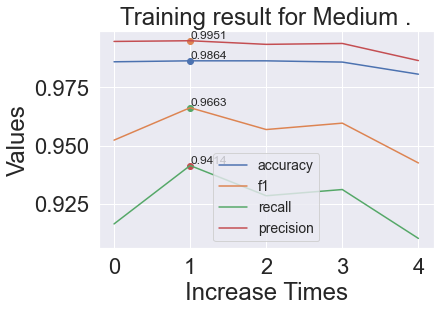

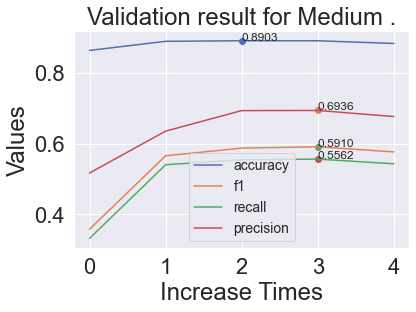

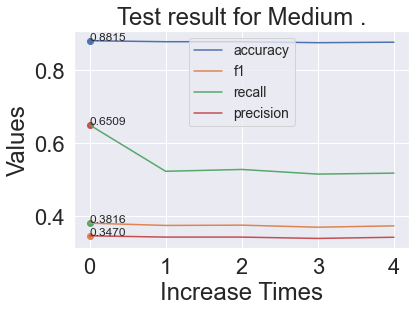

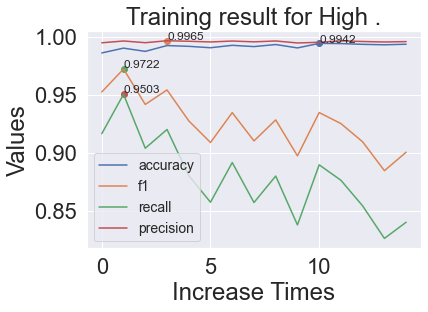

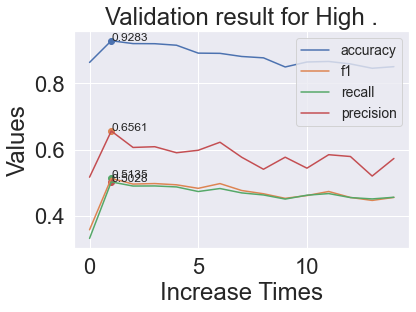

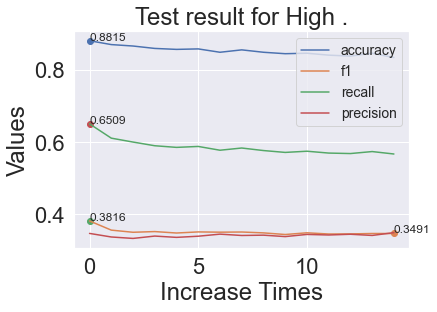

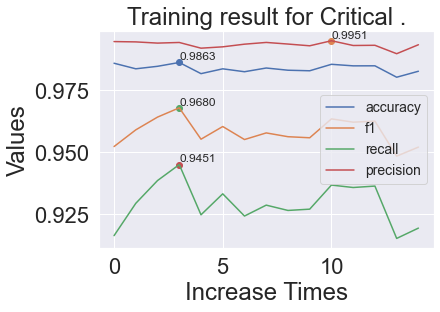

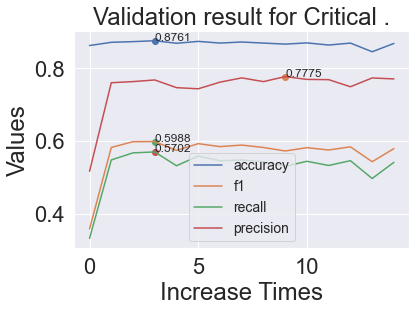

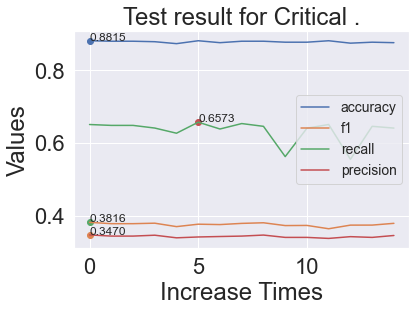

In [ ]:
location = 'NY'
phases = ['Training','Validation','Test']
for category in categories:
  if category == 'Low':
    continue
  for phase in phases:
    if phase == 'Training':
      plot_metrics_Upsample_priority(location,train_record,category,phase)
    elif phase == 'Validation':
      plot_metrics_Upsample_priority(location,val_record,category,phase)
    else:
      plot_metrics_Upsample_priority(location,test_record,category,phase)

#### Search the best LR

In [ ]:
from sklearn.model_selection import cross_validate, RandomizedSearchCV, KFold
import copy
def search_best_lR_priority(increaseTimes,location):
  
  
  # iterate over a range of increaseTime and all category

  # store the best parameter for each increaseTime
  metrics_all = {'f1_best_all': defaultdict(),'best_paras': defaultdict()}
  best_parameters_all = defaultdict()
  cv_score_all = defaultdict()
  test_scores_all = defaultdict()
  for increaseTime in range(0,increaseTimes):
    metrics_one_run = {'f1_best_each_cate': defaultdict()}
    best_parameters_one_run = defaultdict()
    cv_score_one_run = defaultdict()
    print("Performing grid search on IncreaseTime %d" %(increaseTime))
    for category in categories:
      if category == 'Low':
        continue

      if category == 'Medium' and increaseTime != 5:
        continue

      if category == 'High' and increaseTime != 6:
        continue

      if category == 'Critical' and increaseTime != 4:
        continue

      print("Performing grid search on category %s" %(category))
      # df_tmp = pd.read_csv('cache/'+location+'/upsampleData_'+str(category)+'_'+str(increaseTime)+'.csv')
      # trainF = {'full_text':df_tmp['full_text'], 'hashtags': df_tmp['hashtags'], 'favorite_count': df_tmp['favorite_count']}
      # trainL = list(df_tmp['target'])

      # step 1: build up-sample training set
      global trainF, trainL, testF, testL
      trainSet_temp = copy.deepcopy(trainF)
      label_temp = copy.deepcopy(trainL)
      
      # print('Before length %d'%(len(label_temp)))
      idxs = np.where(np.array(label_temp) == category)[0]
      # print('There are %d postitive sample in this category.'%(len(idxs)))
      
      for idx in list(idxs):
        # Duplicate (increaseTime) times
        for j in range(increaseTime):
          trainSet_temp['hashtags'].append(trainSet_temp['hashtags'][idx])
          trainSet_temp['full_text'].append(trainSet_temp['full_text'][idx])
          trainSet_temp['favorite_count'].append(trainSet_temp['favorite_count'][idx])
          label_temp.append(category)
      trainF = trainSet_temp
      trainL = label_temp
      # build the training set for feature union and gridSerachCV
      trainF_tmp = []
      testF_tmp = []
      for i in range(len(trainF['full_text'])):
        trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                          'favorite_count':trainF['favorite_count'][i]})
      for i in range(len(testF['full_text'])):
        testF_tmp.append({'full_text':testF['full_text'][i],'hashtags':testF['hashtags'][i],
                          'favorite_count':testF['favorite_count'][i]})
      
      fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector_gridSearch(key='full_text')),('cv',count_vect),
                ])),
                ('hashtags',Pipeline([('selector', ItemSelector_gridSearch(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',Pipeline([('selector', numericalTransformer_gridSearch(key='favorite_count')),
                ])),
                ],n_jobs=-1)
      
      fullpipe = Pipeline([

                  ('fu', fu),
                  ('lr', LogisticRegression())
                 ])
            
      params = {
          # Fill in the parameter
          
          'fu__full_text__cv__ngram_range':[(1,2),(1,3),(1,4)],
          'fu__full_text__cv__binary': (True, False),
          'fu__full_text__cv__max_features': np.linspace(100,50000,100,dtype=int),
          'lr__penalty': ['l2'],
          'lr__C': np.linspace(0.000001,1000,100,dtype=float),
          'lr__class_weight': ['balanced'],
          'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
          'lr__max_iter': np.linspace(50,1000,100,dtype=int),
      }

      # Pass in your pipeline, params (to tune), scoring, and split parameters here!
      grid_search = RandomizedSearchCV(fullpipe,params,verbose=3,cv=3,n_iter=450, scoring='f1_macro', n_jobs=-1,pre_dispatch='2*n_jobs',)
      
      # print("pipeline:", [name for name, _ in pipe.steps])
      # print("parameters:")
      # print(params)
      #n_jobs=-1,pre_dispatch='2*n_jobs'
      # FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
      grid_search.fit(trainF_tmp, trainL)

      # evaluate the test result
      # testF_union_tmp = grid_search.transform(testF)

      predictions = grid_search.predict(testF_tmp)
      precision = precision_score(predictions, testL, average='macro' )
      recall = recall_score(predictions, testL, average='macro')
      accuracy = accuracy_score(predictions, testL)
      f1 = fbeta_score(predictions, testL, 1, average='macro')

      test_scores = {'accuracy': accuracy,'precision': precision,'f1':f1,'recall': recall}
      print("Test result:", test_scores)

      print('type')
      print(type(trainL[0]))
      print("Best score: %0.3f" % grid_search.best_score_)
      # print("Best parameters set:")
      best_parameters = grid_search.best_estimator_.get_params()
      parameters_dict = {}
      for param_name in sorted(params.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))
        parameters_dict[param_name] = best_parameters[param_name]


      metrics_one_run['f1_best_each_cate'][category] = grid_search.best_score_
      cv_score_one_run[category] = grid_search.cv_results_
      best_parameters_one_run[category] = parameters_dict
      print(best_parameters_one_run[category])
      test_scores_all[increaseTime] = {category: test_scores}

    best_parameters_all[increaseTime] = best_parameters_one_run
    metrics_all['f1_best_all'][increaseTime] = metrics_one_run
    cv_score_all[increaseTime] = best_parameters_one_run
  return metrics_all, best_parameters_all, cv_score_all

In [ ]:
location = 'NY'
metrics_all, best_parameters_all, cv_score_all = search_best_lR_priority(45,location)

Performing grid search on IncreaseTime 0
Performing grid search on IncreaseTime 1
Performing grid search on IncreaseTime 2
Performing grid search on IncreaseTime 3
Performing grid search on IncreaseTime 4
Performing grid search on category Critical
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 24.8min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 34.8min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 40.9min finished
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From

Test result: {'accuracy': 0.810918774966711, 'precision': 0.3761213462535391, 'f1': 0.36565506668756215, 'recall': 0.35780773865549415}
type
<class 'str'>
Best score: 0.596
	fu__full_text__cv__binary: False
	fu__full_text__cv__max_features: 16733
	fu__full_text__cv__ngram_range: (1, 2)
	lr__C: 555.555556
	lr__class_weight: 'balanced'
	lr__max_iter: 4170
	lr__penalty: 'l2'
	lr__solver: 'newton-cg'
{'fu__full_text__cv__binary': False, 'fu__full_text__cv__max_features': 16733, 'fu__full_text__cv__ngram_range': (1, 2), 'lr__C': 555.555556, 'lr__class_weight': 'balanced', 'lr__max_iter': 4170, 'lr__penalty': 'l2', 'lr__solver': 'newton-cg'}
Performing grid search on IncreaseTime 5
Performing grid search on category Medium
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 34.1min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 41.3min finished
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 conc

Test result: {'accuracy': 0.8255659121171771, 'precision': 0.35885133787933166, 'f1': 0.3588175833890554, 'recall': 0.5592190205111652}
type
<class 'str'>
Best score: 0.778
	fu__full_text__cv__binary: False
	fu__full_text__cv__max_features: 16733
	fu__full_text__cv__ngram_range: (1, 2)
	lr__C: 595.9595963636364
	lr__class_weight: 'balanced'
	lr__max_iter: 6884
	lr__penalty: 'l2'
	lr__solver: 'newton-cg'
{'fu__full_text__cv__binary': False, 'fu__full_text__cv__max_features': 16733, 'fu__full_text__cv__ngram_range': (1, 2), 'lr__C': 595.9595963636364, 'lr__class_weight': 'balanced', 'lr__max_iter': 6884, 'lr__penalty': 'l2', 'lr__solver': 'newton-cg'}
Performing grid search on IncreaseTime 6
Performing grid search on category High
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 36.9min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 52.7min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 63.5min finished


Test result: {'accuracy': 0.8801597869507324, 'precision': 0.33420145950472546, 'f1': 0.35959335345796434, 'recall': 0.6438061938061939}
type
<class 'str'>
Best score: 0.895
	fu__full_text__cv__binary: True
	fu__full_text__cv__max_features: 47983
	fu__full_text__cv__ngram_range: (1, 3)
	lr__C: 424.2424248181818
	lr__class_weight: 'balanced'
	lr__max_iter: 6884
	lr__penalty: 'l2'
	lr__solver: 'liblinear'
{'fu__full_text__cv__binary': True, 'fu__full_text__cv__max_features': 47983, 'fu__full_text__cv__ngram_range': (1, 3), 'lr__C': 424.2424248181818, 'lr__class_weight': 'balanced', 'lr__max_iter': 6884, 'lr__penalty': 'l2', 'lr__solver': 'liblinear'}
Performing grid search on IncreaseTime 7
Performing grid search on IncreaseTime 8
Performing grid search on IncreaseTime 9
Performing grid search on IncreaseTime 10
Performing grid search on IncreaseTime 11
Performing grid search on IncreaseTime 12
Performing grid search on IncreaseTime 13
Performing grid search on IncreaseTime 14
Performing

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


### Build state of the art classifier

In [ ]:

                  
location = 'NY'
from sklearn.linear_model import LogisticRegression
count_vect_priority = CountVectorizer(tokenizer=tokenize_normalize,binary=True,max_features=47983,ngram_range=(1,3))
best_lr_priority = LogisticRegression(C=424.24242,class_weight='balanced',max_iter=6884,penalty='l2',solver='liblinear')

increaseTime_priority = 6
category_priority = 'High'
best_lr_priority, pipe_priority, fu_priority, testF_union_priority, errors_idxs_priority, all_errors_priority = build_best_lr_priority(best_lr_priority, count_vect_priority, category_priority, increaseTime_priority, trainF, trainL, testF, testL)



shape
Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Cross validation: Average training set result: test_accuracy=0.868083 test_precision_macro=0.660986 test_f1_macro=0.387355 test_recall_macro=0.346396 .

Cross validation: Average validation set result: train_accuracy=0.996002 train_precision_macro=0.998820 train_f1_macro=0.987914 train_recall_macro=0.977790 .



c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Test result: {'accuracy': 0.8748335552596538, 'precision': 0.3157482952506281, 'f1': 0.33979654451039226, 'recall': 0.65}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.2308    0.7200    0.3495        25
         Low     0.9922    0.8800    0.9327       725
      Medium     0.0400    1.0000    0.0769         1

    accuracy                         0.8748       751
   macro avg     0.3157    0.6500    0.3398       751
weighted avg     0.9656    0.8748    0.9122       751

Display result with up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedM

Cross validation: Average training set result: test_accuracy=0.940623 test_precision_macro=0.723233 test_f1_macro=0.543735 test_recall_macro=0.520910 .

Cross validation: Average validation set result: train_accuracy=0.998397 train_precision_macro=0.999198 train_f1_macro=0.989892 train_recall_macro=0.981342 .

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34022291342664596, 'f1': 0.3656170779214423, 'recall': 0.6440161147250147}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3333    0.6842    0.4483        38
         Low     0.9876    0.8919    0.9373       712
      Medium     0.0400    1.0000    0.0769         1

    accuracy                         0.8815       751
   macro avg     0.3402    0.6440    0.3656       751
weighted avg     0.9532    0.8815    0.9114       751

              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        H

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
build_default_lr_priority(best_lr_priority,category_priority, increaseTime_priority, trainF, trainL, testF, testL, more=[cv_train,trainL, cv_test, testL])

Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3205    0.7143    0.4425        35
         Low     0.9876    0.8894    0.9359       714
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8815       751
   macro avg     0.3470    0.6509    0.3816       751
weighted avg     0.9541    0.8815    0.9108       751

Display result with up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3205    0.7143    0.4425        35
         Low     0.9876    0.8894    0.9359       714
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8815       751
   macro avg     0.3470    0.6509    0.3816       751
weighted avg     0.9541    0.8815    0.9108       751



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

#### Plot confusion matrix

20


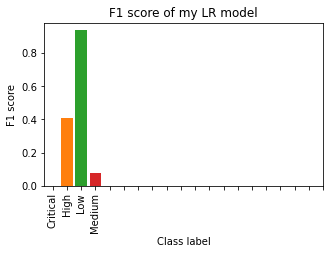

In [ ]:
#  Plot a bar chart graph with the F1 score for each class - (subreddit on x-axis, F1 score on Y axis)
import matplotlib.pyplot as plt
import numpy as np
result_logis = classification_report(best_lr_priority.predict(testF_union_priority), testL, digits=3)
result_logis = result_logis.split()
f1_classlabel = result_logis[4:-15:5]
print(len(result_logis[4:-15]))
f1_each = result_logis[7:-15:5]
plt.figure(figsize=(5, 3))
for i in range(4):
    plt.bar(i,float(f1_each[i]))

plt.title('F1 score of my LR model')
plt.xticks(np.arange(20),f1_classlabel,rotation=90)
plt.ylabel('F1 score')
plt.xlabel('Class label')
plt.savefig('barGraph.png',dpi=200,bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.metrics import plot_confusion_matrix
def plotCM(title,classifier,X_test, y_test):
    fig,ax = plt.subplots(figsize=(5,5))
    disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     xticks_rotation='vertical',
                                     cmap=plt.cm.Blues,ax=ax,
                                     normalize='true')
    
    disp.ax_.set_title(title)
    plt.savefig(title+'_'+'CM'+'_'+'priority'+'.png',dpi=200,bbox_inches='tight')

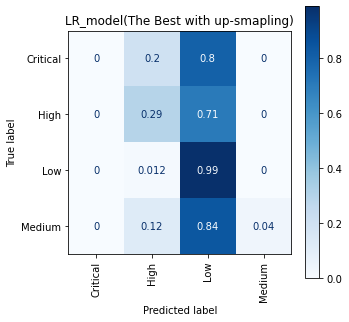

In [ ]:
#plot the confusion matrix for the best model
plotCM('LR_model(The Best with up-smapling)',best_lr_priority,testF_union_priority,testL)

### Error analysis

In [ ]:
import eli5
from eli5.lime import TextExplainer
eli5.show_weights(best_lr_priority, feature_names=fu_priority.get_feature_names(), top=(30,30))

CountVectorizer
CountVectorizer


In [ ]:
all_errors_priority

,index,true_label,prediction,full_text,hashtags,favorite_count
0,0,High,Low,New York reports 15 cases of rare illness in c...,,0
1,2,High,Low,Coronavirus deaths in New York state break 500...,,0
2,11,Medium,High,Samaritan's Purse NYC field hospital already t...,,0
3,15,Critical,High,"BREAKING NEWS: Trump to quarantine New York, C...",,0
4,31,Medium,Low,This is an ominous story. https://t.co/hLueyPXLLz,,1
...,...,...,...,...,...,...
87,686,High,Low,@ImMrMeeseeksLo4 @FulkKendall @AOC We don't kn...,,0
88,688,Medium,Low,"Trend and Turning Point of #Covid_19 (NYC, #n...",Covid_19 nyccoronavirus uscoronavirus,0
89,691,Low,High,New York congresswoman 'felt so helpless' afte...,,0
90,693,High,Low,@LevineJonathan NY is experiencing what it is ...,coronavirus,0


In [ ]:
all_errors_priority[all_errors_priority.true_label=='Critical']


,index,true_label,prediction,full_text,hashtags,favorite_count
3,15,Critical,High,"BREAKING NEWS: Trump to quarantine New York, C...",,0
29,177,Critical,Low,"""In the coming days, you're going to see peopl...",NotABigDeal UnderControl Trump,2
52,328,Critical,Low,NY is being overwhelmed.\n“A supervisor urged ...,,0
59,396,Critical,Low,New York mayor pleads for help as U.S. coronav...,,2
91,739,Critical,Low,"Scenes of ""catastrophe"" as New York hospitals ...",,0


In [ ]:
all_errors_priority.true_label.value_counts()

High        55
Medium      24
Low          8
Critical     5
Name: true_label, dtype: int64

In [ ]:
def print_all_featrues_of_one_sample(sample,idx):
    for key in sample.keys():
        print(key,sample[key][idx])


In [ ]:
all_errors_priority.

In [ ]:
idx = 0
print(all_errors_priority.iloc[0])
print(all_errors_priority.full_text[0])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[0]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                             0
true_label                                                     High
prediction                                                      Low
full_text         New York reports 15 cases of rare illness in c...
hashtags                                                           
favorite_count                                                    0
Name: 0, dtype: object
New York reports 15 cases of rare illness in children possibly linked to Covid-19 https://t.co/SVIRdPFYuI
CountVectorizer
CountVectorizer


In [ ]:
idx = 1
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                             2
true_label                                                     High
prediction                                                      Low
full_text         Coronavirus deaths in New York state break 500...
hashtags                                                           
favorite_count                                                    0
Name: 1, dtype: object
Coronavirus deaths in New York state break 500, Gov. Andrew Cuomo extends school closures - https://t.co/zm4OKVoapc
CountVectorizer
CountVectorizer


In [ ]:
idx = 3
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                            15
true_label                                                 Critical
prediction                                                     High
full_text         BREAKING NEWS: Trump to quarantine New York, C...
hashtags                                                           
favorite_count                                                    0
Name: 3, dtype: object
BREAKING NEWS: Trump to quarantine New York, Connecticut, New Jersey https://t.co/1frpoouIPF @MailOnline
CountVectorizer
CountVectorizer


In [ ]:
idx = 29
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                           177
true_label                                                 Critical
prediction                                                      Low
full_text         "In the coming days, you're going to see peopl...
hashtags                            NotABigDeal UnderControl Trump 
favorite_count                                                    2
Name: 29, dtype: object
"In the coming days, you're going to see people die who did not need to die." Bill deBlasio on NYC ventilator shortage. For Breitbart peeps, this means all ventilators in the state stockpile already have been deployed.
#NotABigDeal #UnderControl #Trump 
https://t.co/zCk6IH7IzW
CountVectorizer
CountVectorizer


## WS

In [ ]:
#preprossesing
import re
import spacy
from spacy.tokenizer import Tokenizer
# from nltk.corpus import stopwords
# nltk.download('stopwords')
# from nltk.tokenize import word_tokenize

nlp = spacy.load('en_core_web_sm', disable=[])
all_stopwords = nlp.Defaults.stop_words
if 'not' in all_stopwords:
    all_stopwords.remove('not')

disable=['ner']
nlp.remove_pipe('tagger')
nlp.remove_pipe('parser')
#@Tokenize
def spacy_tokenize(string):
  tokens = list()
  doc = nlp(string)
  for token in doc:
    tokens.append(token)
  return tokens

    
#@Normalize
def normalize(tokens):
  normalized_tokens = list()
  for token in tokens:
    normalized = token.text.lower().strip()
    if (not token.is_stop):
        if ((token.is_alpha or token.is_digit or token.like_url)):
            normalized_tokens.append(normalized)
  return normalized_tokens

#@Tokenize and normalize
def tokenize_normalize(string):
  return normalize(spacy_tokenize(string))




In [ ]:
# Choose one dataset to use in this section
Tweets = cv19_ws_labeled
trainSet,testSet = generateTrainingSetCV(Tweets)

In [ ]:

# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['priority']
trainL = EF(trainSet,labelList)['priority']
testL = EF(testSet,labelList)['priority']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)

#### Vectorize data

In [ ]:
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)

fu_Tfidf = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ],n_jobs=-1)

fu_count = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('cv',count_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ],n_jobs=-1)

cv_train = fu_count.fit_transform(trainF)
cv_test = fu_count.transform(testF)

tfv_train = fu_Tfidf.fit_transform(trainF)
tfv_test = fu_Tfidf.transform(testF)

#### Dummmy Classifier

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
DummyResult(runningSet)

Evaluate dummy classifier with strategy of most_frequent
Cross validation: Average training set result: test_accuracy=0.972824 test_precision_macro=0.324275 test_f1_macro=0.328741 test_recall_macro=0.333333 .

Cross validation: Average validation set result: train_accuracy=0.972823 train_precision_macro=0.324274 train_f1_macro=0.328741 train_recall_macro=0.333333 .

Evaluate dummy classifier with strategy of stratified
Cross validation: Average training set result: test_accuracy=0.948418 test_precision_macro=0.335336 test_f1_macro=0.334025 test_recall_macro=0.333114 .

Cross validation: Average validation set result: train_accuracy=0.948418 train_precision_macro=0.332813 train_f1_macro=0.332772 train_recall_macro=0.333115 .



#### LR with One-hot encoding

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
lr_priority(runningSet=runningSet)

Cross validation: Average training set result: test_accuracy=0.971714 test_precision_macro=0.324264 test_f1_macro=0.328551 test_recall_macro=0.332953 .

Cross validation: Average validation set result: train_accuracy=0.997227 train_precision_macro=0.999053 train_f1_macro=0.952477 train_recall_macro=0.916071 .

Test result: {'accuracy': 0.9780361757105943, 'precision': 0.3333333333333333, 'f1': 0.3296320487698672, 'recall': 0.3260120585701981}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.9780    0.9889       774
      Medium     0.0000    0.0000    0.0000         0

    accuracy                         0.9780       774
   macro avg     0.3333    0.3260    0.3296       774
weighted avg     1.0000    0.9780    0.9889       774



({'fit_time': 0.38354949951171874,
  'score_time': 0.003402519226074219,
  'test_accuracy': 0.9717143736534318,
  'train_accuracy': 0.9972270360619875,
  'test_precision_macro': 0.3242643604646012,
  'train_precision_macro': 0.9990528944044568,
  'test_f1_macro': 0.32855106050337163,
  'train_f1_macro': 0.952476761052948,
  'test_recall_macro': 0.3329529236195903,
  'train_recall_macro': 0.9160714285714284},
 {'accuracy': 0.9780361757105943,
  'precision': 0.3333333333333333,
  'f1': 0.3296320487698672,
  'recall': 0.3260120585701981})

#### LR with TF-IDF

In [ ]:
runningSet = [tfv_train,trainL, tfv_test, testL]
lr_priority(runningSet)

Cross validation: Average training set result: test_accuracy=0.972824 test_precision_macro=0.324275 test_f1_macro=0.328741 test_recall_macro=0.333333 .

Cross validation: Average validation set result: train_accuracy=0.973239 train_precision_macro=0.457743 train_f1_macro=0.340694 train_recall_macro=0.339583 .

Test result: {'accuracy': 0.9780361757105943, 'precision': 0.3333333333333333, 'f1': 0.3296320487698672, 'recall': 0.3260120585701981}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.9780    0.9889       774
      Medium     0.0000    0.0000    0.0000         0

    accuracy                         0.9780       774
   macro avg     0.3333    0.3260    0.3296       774
weighted avg     1.0000    0.9780    0.9889       774



({'fit_time': 0.37374024391174315,
  'score_time': 0.0034029483795166016,
  'test_accuracy': 0.9728239458294861,
  'train_accuracy': 0.9732391198410616,
  'test_precision_macro': 0.32427464860982863,
  'train_precision_macro': 0.4577427479490586,
  'test_f1_macro': 0.3287414955765981,
  'train_f1_macro': 0.3406943525060266,
  'test_recall_macro': 0.3333333333333333,
  'train_recall_macro': 0.3395833333333333},
 {'accuracy': 0.9780361757105943,
  'precision': 0.3333333333333333,
  'f1': 0.3296320487698672,
  'recall': 0.3260120585701981})

#### SVM with One-hot Encoding

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
svm_priority(runningSet)

Cross validation: Average training set result: test_accuracy=0.972824 test_precision_macro=0.324275 test_f1_macro=0.328741 test_recall_macro=0.333333 .

Cross validation: Average validation set result: train_accuracy=0.972823 train_precision_macro=0.324274 train_f1_macro=0.328741 train_recall_macro=0.333333 .

Test result: {'accuracy': 0.9780361757105943, 'precision': 0.3333333333333333, 'f1': 0.3296320487698672, 'recall': 0.3260120585701981}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.9780    0.9889       774
      Medium     0.0000    0.0000    0.0000         0

    accuracy                         0.9780       774
   macro avg     0.3333    0.3260    0.3296       774
weighted avg     1.0000    0.9780    0.9889       774



#### Tuning LR


In [ ]:
train_record = {}
val_record = {}
test_record = {}
categories = ['Low','Medium','High','Critical']

for category in categories:
    train_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    val_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    test_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}




In [ ]:
import copy
for increaseTime in range(0, 50):  
  print('Current increase %d times' %(increaseTime))
  # up-sample the label

  # Run logistic regression on up-sample
  for category in categories:
    print('Currrent is classifying categorie %s'%(category))
    print()

    if category == 'Low':
      continue

    if category == 'Medium' and increaseTime >= 5:
      continue

    # if category == 'High' and increaseTime >= 6:
    #   continue

    # if category == 7 and increaseTime >= 4:
    #   continue
  

    # step 1: build up-sample training set
    trainSet_temp = copy.deepcopy(trainF)
    label_temp = copy.deepcopy(trainL)
    
    # print('Before length %d'%(len(label_temp)))
    idxs = np.where(np.array(label_temp) == category)[0]
    # print('There are %d postitive sample in this category.'%(len(idxs)))
    
    for idx in list(idxs):
      # Duplicate (increaseTime) times
      for j in range(increaseTime):
        trainSet_temp['hashtags'].append(trainSet_temp['hashtags'][idx])
        trainSet_temp['full_text'].append(trainSet_temp['full_text'][idx])
        trainSet_temp['favorite_count'].append(trainSet_temp['favorite_count'][idx])
        label_temp.append(category)

    # step 2: feature union
    trainSet_temp = fu_count.fit_transform(trainSet_temp)
    tfv_test_temp = fu_count.transform(testF)


    # step 3: train the LR
    runningSet = [trainSet_temp,np.array(label_temp), tfv_test_temp, testL]
    cv_scores, test_scores = lr_priority(runningSet)
    record_nine_result(train_record, val_record, test_record, cv_scores, test_scores, category)

Current increase 0 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Current increase 1 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.888643 test_precision_macro=0.635187 test_f1_macro=0.565603 test_recall_macro=0.540361 .

Cross validation: Average validation set result: train_accuracy=0.986427 train_precision_macro=0.995051 train_f1_macro=0.966278 train_recall_macro=0.941448 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.908 R=0.993 F1=0.947
              precision    recall  f1-score   support

    Critical      0.812     1.000     0.897        13
        High      0.915     0.993     0.953       152
         Low      1.000     0.979     0.989      1192
      Medium      0.906     1.000     0.951        87

    accuracy                          0.982      1444
   macro avg      0.908     0.993     0.947      1444
weighted avg      0.984     0.982     0.982      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.892 P=0.534 R=0.617 F1=0.559
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.243     0.562     0.340        16
         Low      0.977     0.904     0.939       334
      Medium      0.917     1.000     0.957 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.946 R=0.994 F1=0.969
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.915     0.993     0.952       141
         Low      0.999     0.984     0.992      1203
      Medium      0.946     1.000     0.972        88

    accuracy                          0.986      1444
   macro avg      0.946     0.994     0.969      1444
weighted avg      0.987     0.986     0.986      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.593 R=0.678 F1=0.617
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.449     0.880     0.595        25
         Low      0.990     0.897     0.941       321
      Medium      0.933     0.933     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.967 R=0.996 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        15
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1185
      Medium      0.948     1.000     0.974        92

    accuracy                          0.988      1444
   macro avg      0.967     0.996     0.981      1444
weighted avg      0.988     0.988     0.988      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.540 R=0.655 F1=0.571
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.270     0.714     0.392        14
         Low      0.981     0.904     0.941       335
      Medium      0.909     1.000     0.952 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.959 R=0.997 F1=0.977
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.935     1.000     0.966       157
         Low      1.000     0.986     0.993      1179
      Medium      0.958     1.000     0.979        92

    accuracy                          0.989      1444
   macro avg      0.959     0.997     0.977      1444
weighted avg      0.990     0.989     0.989      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.486 R=0.536 F1=0.501
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.147     0.333     0.204        15
         Low      0.965     0.901     0.932       335
      Medium      0.833     0.909     0.870 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.928 R=0.994 F1=0.959
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.917     0.993     0.954       145
         Low      1.000     0.984     0.992      1242
      Medium      0.860     1.000     0.925        43

    accuracy                          0.985      1444
   macro avg      0.928     0.994     0.959      1444
weighted avg      0.987     0.985     0.986      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.842 P=0.483 R=0.630 F1=0.516
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.200     0.692     0.310        13
         Low      0.992     0.826     0.902       305
      Medium      0.741     1.000     0.851 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.34342385452805363, 'f1': 0.3754014269729864, 'recall': 0.5237707284877485}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.928322 test_precision_macro=0.656112 test_f1_macro=0.513516 test_recall_macro=0.502777 .

Cross validation: Average validation set result: train_accuracy=0.990143 train_precision_macro=0.996310 train_f1_macro=0.972151 train_recall_macro=0.950347 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.934 R=0.997 F1=0.963
              precision    recall  f1-score   support

    Critical      0.875     1.000     0.933        14
        High      0.984     0.997     0.990       359
         Low      1.000     0.990     0.995      1153
      Medium      0.878     1.000     0.935        36

    accuracy                          0.992      1562
   macro avg      0.934     0.997     0.963      1562
weighted avg      0.992     0.992     0.992      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.918 P=0.477 R=0.419 F1=0.445
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.950     0.731     0.826        52
         Low      0.958     0.947     0.953       339
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.855 R=0.985 F1=0.910
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800         8
        High      0.940     0.997     0.968       332
         Low      0.999     0.974     0.986      1190
      Medium      0.816     0.969     0.886        32

    accuracy                          0.979      1562
   macro avg      0.855     0.985     0.910      1562
weighted avg      0.981     0.979     0.979      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.495 R=0.610 F1=0.510
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.827     0.768     0.796        56
         Low      0.965     0.921     0.943       331
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.961 R=0.998 F1=0.979
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.981     1.000     0.990       358
         Low      1.000     0.990     0.995      1152
      Medium      0.925     1.000     0.961        37

    accuracy                          0.993      1562
   macro avg      0.961     0.998     0.979      1562
weighted avg      0.993     0.993     0.993      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.926 P=0.491 R=0.683 F1=0.485
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.923     0.783     0.847        46
         Low      0.970     0.948     0.959       343
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.967 R=0.997 F1=0.982
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        17
        High      0.981     1.000     0.990       354
         Low      1.000     0.990     0.995      1152
      Medium      0.889     1.000     0.941        40

    accuracy                          0.992      1563
   macro avg      0.967     0.997     0.982      1563
weighted avg      0.993     0.992     0.992      1563

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.954 P=0.668 R=0.946 F1=0.722
              precision    recall  f1-score   support

    Critical      0.500     1.000     0.667         1
        High      0.977     0.808     0.884        52
         Low      0.973     0.976     0.975       335
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.829 R=0.992 F1=0.896
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.891     0.994     0.939       156
         Low      1.000     0.976     0.988      1355
      Medium      0.827     1.000     0.905        43

    accuracy                          0.978      1563
   macro avg      0.829     0.992     0.896      1563
weighted avg      0.982     0.978     0.979      1563

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.808 P=0.425 R=0.417 F1=0.407
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.700     0.994     0.821       162
         Low      1.000     0.675     0.806       228
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8708388814913449, 'precision': 0.33711249351995853, 'f1': 0.3561431020688078, 'recall': 0.6112708453133985}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.871751 test_precision_macro=0.760634 test_f1_macro=0.582575 test_recall_macro=0.548279 .

Cross validation: Average validation set result: train_accuracy=0.983757 train_precision_macro=0.994626 train_f1_macro=0.959094 train_recall_macro=0.929419 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        35
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1192
      Medium      0.881     1.000     0.937        37

    accuracy                          0.987      1416
   macro avg      0.951     0.996     0.972      1416
weighted avg      0.988     0.987     0.988      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.555 R=0.611 F1=0.566
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.243     0.562     0.340        16
         Low      0.977     0.881     0.926       335
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.927 R=0.993 F1=0.958
              precision    recall  f1-score   support

    Critical      0.969     1.000     0.984        31
        High      0.884     0.993     0.935       138
         Low      1.000     0.980     0.990      1212
      Medium      0.854     1.000     0.921        35

    accuracy                          0.982      1416
   macro avg      0.927     0.993     0.958      1416
weighted avg      0.984     0.982     0.983      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.884 P=0.606 R=0.841 F1=0.668
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909         5
        High      0.447     0.808     0.575        26
         Low      0.990     0.891     0.937       320
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.932 R=0.996 F1=0.961
              precision    recall  f1-score   support

    Critical      0.971     1.000     0.986        34
        High      0.927     1.000     0.962       153
         Low      1.000     0.983     0.992      1195
      Medium      0.829     1.000     0.907        34

    accuracy                          0.986      1416
   macro avg      0.932     0.996     0.961      1416
weighted avg      0.987     0.986     0.986      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.519 R=0.789 F1=0.543
              precision    recall  f1-score   support

    Critical      0.667     0.500     0.571         4
        High      0.270     0.769     0.400        13
         Low      0.987     0.887     0.934       335
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.943 R=0.994 F1=0.967
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        35
        High      0.862     1.000     0.926       144
         Low      1.000     0.977     0.989      1197
      Medium      0.909     1.000     0.952        40

    accuracy                          0.981      1416
   macro avg      0.943     0.994     0.967      1416
weighted avg      0.983     0.981     0.981      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.593 R=0.712 F1=0.597
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.200     0.538     0.292        13
         Low      0.974     0.892     0.931       334
      Medium      0.200     0.667     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.939 R=0.995 F1=0.966
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.929     0.993     0.960       146
         Low      0.999     0.986     0.993      1213
      Medium      0.896     1.000     0.945        43

    accuracy                          0.987      1416
   macro avg      0.939     0.995     0.966      1416
weighted avg      0.988     0.987     0.987      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.448 R=0.612 F1=0.491
              precision    recall  f1-score   support

    Critical      0.609     1.000     0.757        14
        High      0.196     0.600     0.295        15
         Low      0.989     0.849     0.914       325
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.3779795996290842, 'recall': 0.6484985602632661}
Current increase 2 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890259 test_precision_macro=0.693108 test_f1_macro=0.587278 test_recall_macro=0.554262 .

Cross validation: Average validation set result: train_accuracy=0.986417 train_precision_macro=0.993500 train_f1_macro=0.956908 train_recall_macro=0.928467 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.938 R=0.994 F1=0.964
              precision    recall  f1-score   support

    Critical      0.875     1.000     0.933        14
        High      0.897     1.000     0.946       148
         Low      1.000     0.982     0.991      1178
      Medium      0.980     0.993     0.986       147

    accuracy                          0.985      1487
   macro avg      0.938     0.994     0.964      1487
weighted avg      0.987     0.985     0.986      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.892 P=0.554 R=0.592 F1=0.559
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.243     0.529     0.333        17
         Low      0.972     0.909     0.939       341
      Medium      1.000     0.929     0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.972 P=0.828 R=0.988 F1=0.889
              precision    recall  f1-score   support

    Critical      0.538     1.000     0.700         7
        High      0.830     0.984     0.901       129
         Low      0.998     0.967     0.982      1212
      Medium      0.946     1.000     0.972       139

    accuracy                          0.972      1487
   macro avg      0.828     0.988     0.889      1487
weighted avg      0.977     0.972     0.973      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.591 R=0.655 F1=0.612
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.449     0.786     0.571        28
         Low      0.983     0.903     0.941       329
      Medium      0.933     0.933     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.976 R=0.995 F1=0.985
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        15
        High      0.919     1.000     0.958       148
         Low      1.000     0.988     0.994      1176
      Medium      0.987     0.993     0.990       148

    accuracy                          0.990      1487
   macro avg      0.976     0.995     0.985      1487
weighted avg      0.991     0.990     0.990      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.890 P=0.543 R=0.658 F1=0.573
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.268     0.733     0.393        15
         Low      0.981     0.898     0.938       343
      Medium      0.923     1.000     0.960 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.956 R=0.994 F1=0.974
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.903     1.000     0.949       149
         Low      1.000     0.984     0.992      1172
      Medium      0.980     0.993     0.987       150

    accuracy                          0.987      1487
   macro avg      0.956     0.994     0.974      1487
weighted avg      0.988     0.987     0.987      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.666 R=0.816 F1=0.691
              precision    recall  f1-score   support

    Critical      0.500     1.000     0.667         1
        High      0.189     0.583     0.286        12
         Low      0.975     0.910     0.942       346
      Medium      1.000     0.769     0.870 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.976 P=0.826 R=0.992 F1=0.895
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.890     0.993     0.939       147
         Low      1.000     0.973     0.986      1293
      Medium      0.745     1.000     0.854        38

    accuracy                          0.976      1488
   macro avg      0.826     0.992     0.895      1488
weighted avg      0.980     0.976     0.977      1488

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.803 P=0.458 R=0.605 F1=0.481
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.158     0.667     0.255         9
         Low      0.991     0.755     0.857       286
      Medium      0.685     1.000     0.813 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.34342385452805363, 'f1': 0.3761944039432414, 'recall': 0.528806977336389}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.919722 test_precision_macro=0.606663 test_f1_macro=0.496237 test_recall_macro=0.490305 .

Cross validation: Average validation set result: train_accuracy=0.987355 train_precision_macro=0.994840 train_f1_macro=0.941572 train_recall_macro=0.903791 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.921 R=0.997 F1=0.955
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.996     0.995     0.996       564
         Low      0.999     0.992     0.995      1115
      Medium      0.821     1.000     0.901        32

    accuracy                          0.993      1724
   macro avg      0.921     0.997     0.955      1724
weighted avg      0.994     0.993     0.993      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.903 P=0.479 R=0.397 F1=0.429
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.977     0.636     0.771        66
         Low      0.940     0.951     0.946       365
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.979 R=0.999 F1=0.988
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        11
        High      1.000     0.998     0.999       551
         Low      0.999     0.997     0.998      1129
      Medium      0.917     1.000     0.957        33

    accuracy                          0.998      1724
   macro avg      0.979     0.999     0.988      1724
weighted avg      0.998     0.998     0.998      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.526 R=0.664 F1=0.515
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.718     0.836        78
         Low      0.937     0.940     0.938       348
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.915 R=0.997 F1=0.951
              precision    recall  f1-score   support

    Critical      0.889     1.000     0.941        16
        High      0.996     0.996     0.996       561
         Low      1.000     0.990     0.995      1116
      Medium      0.775     1.000     0.873        31

    accuracy                          0.992      1724
   macro avg      0.915     0.997     0.951      1724
weighted avg      0.994     0.992     0.993      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.933 P=0.503 R=0.670 F1=0.480
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.978     0.710     0.822        62
         Low      0.962     0.970     0.966       368
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.979 R=0.999 F1=0.989
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     1.000     1.000       550
         Low      1.000     0.996     0.998      1117
      Medium      0.917     1.000     0.957        44

    accuracy                          0.998      1724
   macro avg      0.979     0.999     0.989      1724
weighted avg      0.998     0.998     0.998      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.956 P=0.495 R=0.456 F1=0.474
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.848     0.918        66
         Low      0.981     0.975     0.978       365
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.918 R=0.995 F1=0.954
              precision    recall  f1-score   support

    Critical      0.947     1.000     0.973        18
        High      0.895     1.000     0.945       179
         Low      1.000     0.979     0.989      1483
      Medium      0.830     1.000     0.907        44

    accuracy                          0.982      1724
   macro avg      0.918     0.995     0.954      1724
weighted avg      0.984     0.982     0.983      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.627 R=0.443 F1=0.477
              precision    recall  f1-score   support

        High      0.882     1.000     0.937       358
         Low      1.000     0.329     0.495        73
      Medium      0.000     0.000     0.000         0

    accuracy                          0.886

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8668442077230359, 'precision': 0.3331297603381585, 'f1': 0.35017084703354384, 'recall': 0.600446883460945}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.873671 test_precision_macro=0.763727 test_f1_macro=0.598482 test_recall_macro=0.567732 .

Cross validation: Average validation set result: train_accuracy=0.984768 train_precision_macro=0.994138 train_f1_macro=0.964248 train_recall_macro=0.938617 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.952 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.927     1.000     0.962       153
         Low      1.000     0.986     0.993      1187
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1431
   macro avg      0.952     0.996     0.973      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.562 R=0.618 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.270     0.588     0.370        17
         Low      0.977     0.885     0.929       338
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.949 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        51
        High      0.923     1.000     0.960       143
         Low      1.000     0.986     0.993      1203
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1431
   macro avg      0.949     0.996     0.971      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.883 P=0.642 R=0.848 F1=0.685
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.447     0.840     0.583        25
         Low      0.990     0.886     0.935       324
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.953 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.926     1.000     0.962       151
         Low      1.000     0.986     0.993      1188
      Medium      0.884     1.000     0.938        38

    accuracy                          0.988      1431
   macro avg      0.953     0.996     0.973      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.880 P=0.611 R=0.795 F1=0.598
              precision    recall  f1-score   support

    Critical      1.000     0.600     0.750         5
        High      0.282     0.688     0.400        16
         Low      0.980     0.893     0.934       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.929 R=0.994 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.882     1.000     0.937       149
         Low      1.000     0.977     0.989      1193
      Medium      0.833     1.000     0.909        35

    accuracy                          0.981      1431
   macro avg      0.929     0.994     0.959      1431
weighted avg      0.984     0.981     0.982      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.523 R=0.548 F1=0.525
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.121     0.308     0.174        13
         Low      0.971     0.883     0.925       341
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.973 P=0.833 R=0.983 F1=0.897
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.846     0.985     0.910       134
         Low      0.999     0.971     0.985      1246
      Medium      0.820     0.976     0.891        42

    accuracy                          0.973      1432
   macro avg      0.833     0.983     0.897      1432
weighted avg      0.977     0.973     0.974      1432

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.818 P=0.416 R=0.595 F1=0.458
              precision    recall  f1-score   support

    Critical      0.476     1.000     0.645        20
        High      0.196     0.562     0.290        16
         Low      0.992     0.819     0.898       321
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.3779795996290842, 'recall': 0.6484985602632661}
Current increase 3 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890207 test_precision_macro=0.693552 test_f1_macro=0.591038 test_recall_macro=0.556235 .

Cross validation: Average validation set result: train_accuracy=0.985886 train_precision_macro=0.993888 train_f1_macro=0.959652 train_recall_macro=0.931141 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.901 R=0.993 F1=0.941
              precision    recall  f1-score   support

    Critical      0.750     1.000     0.857        12
        High      0.872     1.000     0.932       143
         Low      1.000     0.976     0.988      1175
      Medium      0.980     0.995     0.988       200

    accuracy                          0.981      1530
   macro avg      0.901     0.993     0.941      1530
weighted avg      0.983     0.981     0.982      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.888 P=0.551 R=0.563 F1=0.540
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.237     0.529     0.327        17
         Low      0.967     0.909     0.937       350
      Medium      1.000     0.812     0.897 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.848 R=0.994 F1=0.903
              precision    recall  f1-score   support

    Critical      0.538     1.000     0.700         7
        High      0.873     1.000     0.932       131
         Low      1.000     0.976     0.988      1195
      Medium      0.980     1.000     0.990       197

    accuracy                          0.981      1530
   macro avg      0.848     0.994     0.903      1530
weighted avg      0.984     0.981     0.982      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.603 R=0.670 F1=0.618
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.423     0.846     0.564        26
         Low      0.987     0.897     0.940       341
      Medium      1.000     0.938     0.968 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.950 R=0.994 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.883     1.000     0.938       143
         Low      1.000     0.981     0.991      1173
      Medium      0.985     0.995     0.990       200

    accuracy                          0.985      1530
   macro avg      0.950     0.994     0.971      1530
weighted avg      0.986     0.985     0.985      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.541 R=0.654 F1=0.569
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.250     0.714     0.370        14
         Low      0.985     0.901     0.941       355
      Medium      0.929     1.000     0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.980 R=0.996 F1=0.988
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        17
        High      0.920     1.000     0.958       149
         Low      1.000     0.990     0.995      1157
      Medium      1.000     0.995     0.998       208

    accuracy                          0.992      1531
   macro avg      0.980     0.996     0.988      1531
weighted avg      0.992     0.992     0.992      1531

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.885 P=0.542 R=0.556 F1=0.530
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.200     0.500     0.286        16
         Low      0.970     0.904     0.936       355
      Medium      1.000     0.818     0.900 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.935 R=0.996 F1=0.964
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.906     1.000     0.951       154
         Low      1.000     0.983     0.992      1317
      Medium      0.902     1.000     0.948        46

    accuracy                          0.986      1531
   macro avg      0.935     0.996     0.964      1531
weighted avg      0.987     0.986     0.986      1531

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.851 P=0.506 R=0.655 F1=0.521
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.188     0.857     0.308         7
         Low      1.000     0.764     0.866       237
      Medium      0.836     1.000     0.911 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8761651131824234, 'precision': 0.3398299238345895, 'f1': 0.37056840969527877, 'recall': 0.516067156175233}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.919388 test_precision_macro=0.608857 test_f1_macro=0.497773 test_recall_macro=0.490578 .

Cross validation: Average validation set result: train_accuracy=0.992363 train_precision_macro=0.996522 train_f1_macro=0.954085 train_recall_macro=0.919984 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.930 R=0.998 F1=0.961
              precision    recall  f1-score   support

    Critical      0.857     1.000     0.923        12
        High      1.000     0.996     0.998       765
         Low      0.999     0.995     0.997      1076
      Medium      0.865     1.000     0.928        32

    accuracy                          0.996      1885
   macro avg      0.930     0.998     0.961      1885
weighted avg      0.996     0.996     0.996      1885

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.497 R=0.637 F1=0.449
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.590     0.742        78
         Low      0.931     0.957     0.944       393
      Medium      0.059     1.000     0.111 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.972 R=0.999 F1=0.985
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        12
        High      1.000     1.000     1.000       746
         Low      1.000     0.996     0.998      1095
      Medium      0.889     1.000     0.941        32

    accuracy                          0.998      1885
   macro avg      0.972     0.999     0.985      1885
weighted avg      0.998     0.998     0.998      1885

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.881 P=0.493 R=0.648 F1=0.455
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.646     0.785        96
         Low      0.917     0.946     0.931       373
      Medium      0.056     1.000     0.105 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.954 R=0.998 F1=0.975
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      1.000     0.997     0.999       762
         Low      0.999     0.995     0.997      1073
      Medium      0.878     1.000     0.935        36

    accuracy                          0.996      1886
   macro avg      0.954     0.998     0.975      1886
weighted avg      0.997     0.996     0.996      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.926 P=0.526 R=0.661 F1=0.508
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.676     0.807        71
         Low      0.948     0.970     0.959       398
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.911 R=0.996 F1=0.950
              precision    recall  f1-score   support

    Critical      0.800     1.000     0.889        12
        High      0.992     0.997     0.994       624
         Low      0.999     0.988     0.994      1209
      Medium      0.854     1.000     0.921        41

    accuracy                          0.992      1886
   macro avg      0.911     0.996     0.950      1886
weighted avg      0.992     0.992     0.992      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.930 P=0.472 R=0.466 F1=0.469
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.917     0.943     0.930       176
         Low      0.971     0.922     0.946       295
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.831 R=0.991 F1=0.897
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.938     0.991     0.963       319
         Low      0.999     0.973     0.986      1516
      Medium      0.704     1.000     0.826        38

    accuracy                          0.977      1886
   macro avg      0.831     0.991     0.897      1886
weighted avg      0.981     0.977     0.978      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       408
         Low      0.000     0.000     0.000        63

    accuracy                          0.866       471
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8601864181091877, 'precision': 0.3396347250468557, 'f1': 0.3521129028076417, 'recall': 0.5902173913043478}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.876092 test_precision_macro=0.768238 test_f1_macro=0.598818 test_recall_macro=0.570246 .

Cross validation: Average validation set result: train_accuracy=0.986311 train_precision_macro=0.994393 train_f1_macro=0.967992 train_recall_macro=0.945069 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        73
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1184
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1446
   macro avg      0.951     0.996     0.972      1446
weighted avg      0.989     0.988     0.988      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.554 R=0.603 F1=0.565
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.243     0.529     0.333        17
         Low      0.974     0.883     0.926       342
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.927 R=0.995 F1=0.958
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        70
        High      0.889     1.000     0.941       136
         Low      1.000     0.980     0.990      1208
      Medium      0.821     1.000     0.901        32

    accuracy                          0.983      1446
   macro avg      0.927     0.995     0.958      1446
weighted avg      0.986     0.983     0.984      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.881 P=0.643 R=0.849 F1=0.686
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.846     0.587        26
         Low      0.990     0.884     0.934       327
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.940 R=0.996 F1=0.965
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        72
        High      0.921     1.000     0.959       152
         Low      1.000     0.983     0.991      1186
      Medium      0.837     1.000     0.911        36

    accuracy                          0.986      1446
   macro avg      0.940     0.996     0.965      1446
weighted avg      0.988     0.986     0.987      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.887 P=0.609 R=0.820 F1=0.610
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.270     0.714     0.392        14
         Low      0.984     0.897     0.938       340
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.933 R=0.991 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     0.987     0.993        75
        High      0.875     1.000     0.933       147
         Low      0.999     0.977     0.988      1189
      Medium      0.857     1.000     0.923        36

    accuracy                          0.981      1447
   macro avg      0.933     0.991     0.959      1447
weighted avg      0.983     0.981     0.981      1447

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.859 P=0.529 R=0.477 F1=0.483
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.147     0.357     0.208        14
         Low      0.968     0.883     0.924       343
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.929 R=0.995 F1=0.960
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.930     0.993     0.961       147
         Low      1.000     0.987     0.994      1241
      Medium      0.920     1.000     0.958        46

    accuracy                          0.988      1447
   macro avg      0.929     0.995     0.960      1447
weighted avg      0.989     0.988     0.988      1447

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.452 R=0.572 F1=0.483
              precision    recall  f1-score   support

    Critical      0.639     1.000     0.780        39
        High      0.178     0.471     0.258        17
         Low      0.992     0.816     0.896       305
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.3462401802448459, 'f1': 0.379312025004308, 'recall': 0.6411801548739751}
Current increase 4 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.882553 test_precision_macro=0.676257 test_f1_macro=0.576538 test_recall_macro=0.542972 .

Cross validation: Average validation set result: train_accuracy=0.980680 train_precision_macro=0.986530 train_f1_macro=0.942553 train_recall_macro=0.910136 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.933 R=0.995 F1=0.961
              precision    recall  f1-score   support

    Critical      0.812     1.000     0.897        13
        High      0.919     0.993     0.955       149
         Low      1.000     0.987     0.993      1155
      Medium      1.000     1.000     1.000       256

    accuracy                          0.990      1573
   macro avg      0.933     0.995     0.961      1573
weighted avg      0.991     0.990     0.990      1573

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.558 R=0.559 F1=0.543
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.268     0.550     0.361        20
         Low      0.964     0.910     0.936       356
      Medium      1.000     0.778     0.875 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.870 R=0.988 F1=0.919
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800         8
        High      0.833     0.984     0.903       127
         Low      0.998     0.972     0.985      1187
      Medium      0.980     0.996     0.988       251

    accuracy                          0.977      1573
   macro avg      0.870     0.988     0.919      1573
weighted avg      0.980     0.977     0.978      1573

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.603 R=0.685 F1=0.626
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.423     0.846     0.564        26
         Low      0.988     0.895     0.939       353
      Medium      1.000     1.000     1.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.964 R=0.996 F1=0.980
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.920     1.000     0.958       149
         Low      1.000     0.989     0.994      1153
      Medium      1.000     0.996     0.998       257

    accuracy                          0.991      1574
   macro avg      0.964     0.996     0.980      1574
weighted avg      0.992     0.991     0.991      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.568 R=0.614 F1=0.572
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.300     0.667     0.414        18
         Low      0.973     0.913     0.942       358
      Medium      1.000     0.875     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.965 R=0.996 F1=0.980
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.919     1.000     0.958       147
         Low      1.000     0.989     0.994      1149
      Medium      1.000     0.996     0.998       262

    accuracy                          0.991      1574
   macro avg      0.965     0.996     0.980      1574
weighted avg      0.992     0.991     0.991      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.888 P=0.542 R=0.601 F1=0.553
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.190     0.500     0.276        16
         Low      0.976     0.902     0.938       368
      Medium      1.000     1.000     1.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.941 R=0.996 F1=0.967
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.926     1.000     0.961       162
         Low      1.000     0.986     0.993      1351
      Medium      0.904     1.000     0.949        47

    accuracy                          0.988      1574
   macro avg      0.941     0.996     0.967      1574
weighted avg      0.989     0.988     0.988      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.852 P=0.493 R=0.617 F1=0.489
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.111     0.750     0.194         4
         Low      1.000     0.716     0.835       201
      Medium      0.862     1.000     0.926 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.3430350520397177, 'f1': 0.3742567846795343, 'recall': 0.5186898073836276}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.914809 test_precision_macro=0.590686 test_f1_macro=0.494032 test_recall_macro=0.487632 .

Cross validation: Average validation set result: train_accuracy=0.991696 train_precision_macro=0.996082 train_f1_macro=0.927434 train_recall_macro=0.880208 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.893 R=0.997 F1=0.939
              precision    recall  f1-score   support

    Critical      0.769     1.000     0.870        10
        High      1.000     0.995     0.997       957
         Low      0.998     0.993     0.996      1051
      Medium      0.806     1.000     0.892        29

    accuracy                          0.994      2047
   macro avg      0.893     0.997     0.939      2047
weighted avg      0.995     0.994     0.994      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.496 R=0.643 F1=0.453
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.617     0.763        94
         Low      0.928     0.957     0.942       417
      Medium      0.056     1.000     0.105 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.938 R=0.998 F1=0.966
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      1.000     0.999     0.999       952
         Low      1.000     0.994     0.997      1054
      Medium      0.829     1.000     0.906        29

    accuracy                          0.997      2047
   macro avg      0.938     0.998     0.966      2047
weighted avg      0.997     0.997     0.997      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.494 R=0.518 F1=0.450
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.621     0.766        95
         Low      0.923     0.952     0.937       415
      Medium      0.053     0.500     0.095 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.981 R=0.999 F1=0.990
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      1.000     1.000     1.000       956
         Low      1.000     0.997     0.999      1038
      Medium      0.925     1.000     0.961        37

    accuracy                          0.999      2047
   macro avg      0.981     0.999     0.990      2047
weighted avg      0.999     0.999     0.999      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.914 P=0.485 R=0.400 F1=0.432
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.628     0.771        86
         Low      0.939     0.972     0.955       426
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.847 R=0.994 F1=0.906
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.987     0.996     0.991       676
         Low      0.998     0.982     0.990      1321
      Medium      0.804     1.000     0.891        41

    accuracy                          0.987      2047
   macro avg      0.847     0.994     0.906      2047
weighted avg      0.989     0.987     0.987      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.908 P=0.467 R=0.447 F1=0.454
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.890     0.983     0.934       297
         Low      0.977     0.805     0.883       215
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.877 R=0.994 F1=0.928
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.976     0.994     0.985       490
         Low      0.999     0.983     0.991      1501
      Medium      0.796     1.000     0.887        43

    accuracy                          0.986      2048
   macro avg      0.877     0.994     0.928      2048
weighted avg      0.988     0.986     0.986      2048

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.906 P=0.453 R=0.500 F1=0.475
              precision    recall  f1-score   support

        High      0.906     1.000     0.951       463
         Low      0.000     0.000     0.000        48

    accuracy                          0.906       511
   macro avg      0.453     0.500     0.475

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8575233022636485, 'precision': 0.33604079435339157, 'f1': 0.3481146206284012, 'recall': 0.5856884057971015}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869179 test_precision_macro=0.747044 test_f1_macro=0.574376 test_recall_macro=0.532275 .

Cross validation: Average validation set result: train_accuracy=0.981801 train_precision_macro=0.992088 train_f1_macro=0.955323 train_recall_macro=0.924785 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        92
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1180
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1461
   macro avg      0.951     0.996     0.972      1461
weighted avg      0.989     0.988     0.988      1461

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.569 R=0.625 F1=0.583
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.297     0.611     0.400        18
         Low      0.978     0.890     0.932       345
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.926 R=0.995 F1=0.957
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        89
        High      0.882     1.000     0.938       135
         Low      1.000     0.979     0.990      1205
      Medium      0.821     1.000     0.901        32

    accuracy                          0.983      1461
   macro avg      0.926     0.995     0.957      1461
weighted avg      0.985     0.983     0.983      1461

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.623 R=0.840 F1=0.664
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.367     0.818     0.507        22
         Low      0.990     0.875     0.929       335
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.924 R=0.995 F1=0.956
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        91
        High      0.915     1.000     0.955       150
         Low      1.000     0.981     0.990      1189
      Medium      0.780     1.000     0.877        32

    accuracy                          0.984      1462
   macro avg      0.924     0.995     0.956      1462
weighted avg      0.986     0.984     0.985      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.599 R=0.806 F1=0.594
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.263     0.667     0.377        15
         Low      0.981     0.889     0.933       342
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.917 R=0.994 F1=0.952
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        93
        High      0.874     1.000     0.933       146
         Low      1.000     0.975     0.987      1188
      Medium      0.795     1.000     0.886        35

    accuracy                          0.979      1462
   macro avg      0.917     0.994     0.952      1462
weighted avg      0.983     0.979     0.980      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.545 R=0.598 F1=0.555
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.200     0.500     0.286        14
         Low      0.981     0.894     0.936       349
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.934 R=0.996 F1=0.964
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.925     1.000     0.961       147
         Low      1.000     0.985     0.992      1257
      Medium      0.880     1.000     0.936        44

    accuracy                          0.987      1462
   macro avg      0.934     0.996     0.964      1462
weighted avg      0.988     0.987     0.987      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.822 P=0.469 R=0.584 F1=0.497
              precision    recall  f1-score   support

    Critical      0.700     1.000     0.824        56
        High      0.186     0.533     0.276        15
         Low      0.992     0.803     0.887       294
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8735019973368842, 'precision': 0.33905231885791765, 'f1': 0.3698783654503212, 'recall': 0.6269643941694504}
Current increase 5 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890988 test_precision_macro=0.598152 test_f1_macro=0.483405 test_recall_macro=0.473771 .

Cross validation: Average validation set result: train_accuracy=0.990493 train_precision_macro=0.995458 train_f1_macro=0.908738 train_recall_macro=0.857195 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.915 R=0.998 F1=0.953
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.997     0.998      1153
         Low      0.999     0.995     0.997      1016
      Medium      0.829     1.000     0.906        29

    accuracy                          0.996      2208
   macro avg      0.915     0.998     0.953      2208
weighted avg      0.997     0.996     0.996      2208

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.882 P=0.492 R=0.634 F1=0.442
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.578     0.733       109
         Low      0.914     0.957     0.935       443
      Medium      0.053     1.000     0.100 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.856 R=0.997 F1=0.914
              precision    recall  f1-score   support

    Critical      0.769     1.000     0.870        10
        High      1.000     0.997     0.999      1152
         Low      1.000     0.989     0.995      1026
      Medium      0.656     1.000     0.792        21

    accuracy                          0.994      2209
   macro avg      0.856     0.997     0.914      2209
weighted avg      0.996     0.994     0.994      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.477 R=0.382 F1=0.416
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.583     0.737       108
         Low      0.909     0.946     0.927       443
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.982 R=0.999 F1=0.990
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     0.999     1.000      1155
         Low      0.999     0.997     0.998      1002
      Medium      0.929     1.000     0.963        39

    accuracy                          0.998      2209
   macro avg      0.982     0.999     0.990      2209
weighted avg      0.998     0.998     0.998      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.920 P=0.486 R=0.405 F1=0.436
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.644     0.784        90
         Low      0.945     0.974     0.959       462
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.862 R=0.995 F1=0.917
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.989     0.995     0.992       732
         Low      0.999     0.984     0.992      1423
      Medium      0.774     1.000     0.872        41

    accuracy                          0.988      2209
   macro avg      0.862     0.995     0.917      2209
weighted avg      0.990     0.988     0.988      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.922 P=0.630 R=0.545 F1=0.576
              precision    recall  f1-score   support

        High      0.916     0.995     0.954       438
         Low      0.973     0.640     0.772       114
      Medium      0.000     0.000     0.000         0

    accuracy                          0.922

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.790 R=0.990 F1=0.863
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.968     0.991     0.979       645
         Low      0.999     0.971     0.985      1518
      Medium      0.667     1.000     0.800        36

    accuracy                          0.977      2209
   macro avg      0.790     0.990     0.863      2209
weighted avg      0.982     0.977     0.979      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.810 P=0.405 R=0.500 F1=0.447
              precision    recall  f1-score   support

        High      0.810     1.000     0.895       447
         Low      0.000     0.000     0.000       105

    accuracy                          0.810       552
   macro avg      0.405     0.500     0.447

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8588548601864181, 'precision': 0.33924592255851976, 'f1': 0.3511814249224321, 'recall': 0.5882664350805396}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.874324 test_precision_macro=0.743931 test_f1_macro=0.592997 test_recall_macro=0.558924 .

Cross validation: Average validation set result: train_accuracy=0.983749 train_precision_macro=0.992633 train_f1_macro=0.960443 train_recall_macro=0.933258 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.954 R=0.997 F1=0.974
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       111
        High      0.939     1.000     0.969       155
         Low      1.000     0.987     0.994      1174
      Medium      0.878     1.000     0.935        36

    accuracy                          0.990      1476
   macro avg      0.954     0.997     0.974      1476
weighted avg      0.991     0.990     0.990      1476

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.569 R=0.625 F1=0.583
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.297     0.611     0.400        18
         Low      0.978     0.888     0.931       349
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.948 R=0.995 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       108
        High      0.922     0.993     0.956       142
         Low      0.999     0.986     0.992      1193
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1477
   macro avg      0.948     0.995     0.970      1477
weighted avg      0.989     0.988     0.988      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.641 R=0.828 F1=0.679
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.759     0.564        29
         Low      0.980     0.885     0.930       331
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.956 R=0.990 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       110
        High      0.920     1.000     0.958       149
         Low      1.000     0.986     0.993      1180
      Medium      0.902     0.974     0.937        38

    accuracy                          0.988      1477
   macro avg      0.956     0.990     0.972      1477
weighted avg      0.989     0.988     0.989      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.596 R=0.804 F1=0.590
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.250     0.667     0.364        15
         Low      0.981     0.884     0.930       346
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.980 P=0.923 R=0.994 F1=0.955
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       112
        High      0.874     1.000     0.933       146
         Low      1.000     0.975     0.988      1183
      Medium      0.818     1.000     0.900        36

    accuracy                          0.980      1477
   macro avg      0.923     0.994     0.955      1477
weighted avg      0.983     0.980     0.981      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.523 R=0.488 F1=0.477
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.114     0.400     0.178        10
         Low      0.978     0.887     0.931       355
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.942 R=0.995 F1=0.967
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.932     0.993     0.962       151
         Low      0.999     0.987     0.993      1266
      Medium      0.902     1.000     0.948        46

    accuracy                          0.988      1477
   macro avg      0.942     0.995     0.967      1477
weighted avg      0.989     0.988     0.988      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.818 P=0.473 R=0.573 F1=0.497
              precision    recall  f1-score   support

    Critical      0.707     1.000     0.828        70
        High      0.195     0.500     0.281        16
         Low      0.991     0.792     0.880       283
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34138513378793317, 'f1': 0.37656072779329425, 'recall': 0.6572805283493576}
Current increase 6 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890324 test_precision_macro=0.622351 test_f1_macro=0.497717 test_recall_macro=0.482800 .

Cross validation: Average validation set result: train_accuracy=0.992575 train_precision_macro=0.996278 train_f1_macro=0.934514 train_recall_macro=0.891440 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.901 R=0.998 F1=0.944
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.996     0.998      1348
         Low      0.998     0.994     0.996       988
      Medium      0.774     1.000     0.873        24

    accuracy                          0.995      2370
   macro avg      0.901     0.998     0.944      2370
weighted avg      0.996     0.995     0.996      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.496 R=0.626 F1=0.449
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.550     0.710       129
         Low      0.896     0.955     0.925       462
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.910 R=0.998 F1=0.949
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      1.000     0.999     0.999      1354
         Low      1.000     0.993     0.996       978
      Medium      0.794     1.000     0.885        27

    accuracy                          0.996      2370
   macro avg      0.910     0.998     0.949      2370
weighted avg      0.997     0.996     0.996      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.862 P=0.496 R=0.616 F1=0.444
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.508     0.674       122
         Low      0.885     0.955     0.919       468
      Medium      0.100     1.000     0.182 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.938 R=0.998 F1=0.966
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      1.000     0.998     0.999      1319
         Low      0.999     0.995     0.997      1001
      Medium      0.907     1.000     0.951        39

    accuracy                          0.997      2370
   macro avg      0.938     0.998     0.966      2370
weighted avg      0.997     0.997     0.997      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.929 P=0.487 R=0.433 F1=0.455
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.752     0.858       129
         Low      0.948     0.978     0.963       464
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.938 R=0.997 F1=0.965
              precision    recall  f1-score   support

    Critical      0.947     1.000     0.973        18
        High      0.990     0.999     0.995       815
         Low      0.999     0.987     0.993      1494
      Medium      0.815     1.000     0.898        44

    accuracy                          0.992      2371
   macro avg      0.938     0.997     0.965      2371
weighted avg      0.992     0.992     0.992      2371

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.919 P=0.459 R=0.500 F1=0.479
              precision    recall  f1-score   support

        High      0.919     1.000     0.958       544
         Low      0.000     0.000     0.000        48

    accuracy                          0.919       592
   macro avg      0.459     0.500     0.479

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.974 P=0.775 R=0.989 F1=0.850
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.964     0.992     0.978       798
         Low      0.998     0.964     0.981      1528
      Medium      0.667     1.000     0.800        36

    accuracy                          0.974      2371
   macro avg      0.775     0.989     0.850      2371
weighted avg      0.979     0.974     0.976      2371

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.720 P=0.360 R=0.500 F1=0.418
              precision    recall  f1-score   support

        High      0.720     1.000     0.837       426
         Low      0.000     0.000     0.000       166

    accuracy                          0.720       592
   macro avg      0.360     0.500     0.418

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8495339547270306, 'precision': 0.34497328229054514, 'f1': 0.3504317372254532, 'recall': 0.5777777777777777}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869705 test_precision_macro=0.762233 test_f1_macro=0.584911 test_recall_macro=0.545788 .

Cross validation: Average validation set result: train_accuracy=0.982574 train_precision_macro=0.993702 train_f1_macro=0.955184 train_recall_macro=0.924284 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.951 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       130
        High      0.927     1.000     0.962       153
         Low      1.000     0.986     0.993      1173
      Medium      0.878     1.000     0.935        36

    accuracy                          0.989      1492
   macro avg      0.951     0.996     0.973      1492
weighted avg      0.990     0.989     0.989      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.562 R=0.619 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.270     0.588     0.370        17
         Low      0.978     0.887     0.930       353
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.945 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       127
        High      0.908     1.000     0.952       139
         Low      1.000     0.984     0.992      1192
      Medium      0.872     1.000     0.932        34

    accuracy                          0.987      1492
   macro avg      0.945     0.996     0.969      1492
weighted avg      0.989     0.987     0.988      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.633 R=0.846 F1=0.676
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.408     0.833     0.548        24
         Low      0.990     0.882     0.933       340
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.957 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       129
        High      0.925     1.000     0.961       148
         Low      1.000     0.986     0.993      1178
      Medium      0.902     1.000     0.949        37

    accuracy                          0.989      1492
   macro avg      0.957     0.997     0.976      1492
weighted avg      0.990     0.989     0.989      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.593 R=0.803 F1=0.586
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.238     0.667     0.351        15
         Low      0.981     0.880     0.928       350
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.899 R=0.990 F1=0.937
              precision    recall  f1-score   support

    Critical      1.000     0.992     0.996       132
        High      0.892     0.993     0.940       149
         Low      0.999     0.975     0.987      1180
      Medium      0.705     1.000     0.827        31

    accuracy                          0.979      1492
   macro avg      0.899     0.990     0.937      1492
weighted avg      0.982     0.979     0.980      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.555 R=0.509 F1=0.515
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.250     0.474     0.327        19
         Low      0.969     0.897     0.932       351
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.833 R=0.991 F1=0.899
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.902     0.987     0.943       150
         Low      1.000     0.976     0.988      1293
      Medium      0.765     1.000     0.867        39

    accuracy                          0.978      1492
   macro avg      0.833     0.991     0.899      1492
weighted avg      0.982     0.978     0.979      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.748 P=0.415 R=0.507 F1=0.430
              precision    recall  f1-score   support

    Critical      0.508     1.000     0.674        60
        High      0.158     0.300     0.207        20
         Low      0.995     0.727     0.840       293
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.8761651131824234, 'precision': 0.3426462495513818, 'f1': 0.37551052703509485, 'recall': 0.6385767790262172}
Current increase 7 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.880885 test_precision_macro=0.577084 test_f1_macro=0.476797 test_recall_macro=0.469599 .

Cross validation: Average validation set result: train_accuracy=0.991469 train_precision_macro=0.995571 train_f1_macro=0.910118 train_recall_macro=0.856953 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.821 R=0.997 F1=0.888
              precision    recall  f1-score   support

    Critical      0.545     1.000     0.706         6
        High      1.000     0.995     0.998      1550
         Low      0.998     0.992     0.995       953
      Medium      0.742     1.000     0.852        23

    accuracy                          0.994      2532
   macro avg      0.821     0.997     0.888      2532
weighted avg      0.996     0.994     0.995      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.855 P=0.492 R=0.616 F1=0.438
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.507     0.673       144
         Low      0.881     0.957     0.917       487
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.856 R=0.997 F1=0.914
              precision    recall  f1-score   support

    Critical      0.714     1.000     0.833        10
        High      1.000     0.997     0.999      1552
         Low      0.999     0.989     0.994       948
      Medium      0.710     1.000     0.830        22

    accuracy                          0.994      2532
   macro avg      0.856     0.997     0.914      2532
weighted avg      0.996     0.994     0.995      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.495 R=0.621 F1=0.443
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.523     0.687       130
         Low      0.894     0.960     0.926       500
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.939 R=0.998 F1=0.967
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      0.999     0.999     0.999      1408
         Low      0.999     0.994     0.997      1071
      Medium      0.913     1.000     0.955        42

    accuracy                          0.997      2532
   macro avg      0.939     0.998     0.967      2532
weighted avg      0.997     0.997     0.997      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.938 P=0.481 R=0.465 F1=0.473
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.967     0.906     0.935       223
         Low      0.956     0.956     0.956       410
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.876 R=0.995 F1=0.927
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.990     0.997     0.993       976
         Low      0.999     0.983     0.991      1500
      Medium      0.778     1.000     0.875        42

    accuracy                          0.989      2532
   macro avg      0.876     0.995     0.927      2532
weighted avg      0.991     0.989     0.989      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.445 R=0.500 F1=0.471
              precision    recall  f1-score   support

        High      0.889     1.000     0.941       563
         Low      0.000     0.000     0.000        70

    accuracy                          0.889       633
   macro avg      0.445     0.500     0.471

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.812 R=0.993 F1=0.881
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.986     0.997     0.991       972
         Low      0.999     0.976     0.987      1512
      Medium      0.685     1.000     0.813        37

    accuracy                          0.984      2532
   macro avg      0.812     0.993     0.881      2532
weighted avg      0.988     0.984     0.985      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.423 R=0.500 F1=0.458
              precision    recall  f1-score   support

        High      0.845     1.000     0.916       535
         Low      0.000     0.000     0.000        98

    accuracy                          0.845       633
   macro avg      0.423     0.500     0.458

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8561917443408789, 'precision': 0.34128464329864017, 'f1': 0.35089733123361605, 'recall': 0.583898192450824}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.872616 test_precision_macro=0.773917 test_f1_macro=0.589142 test_recall_macro=0.548082 .

Cross validation: Average validation set result: train_accuracy=0.984076 train_precision_macro=0.994408 train_f1_macro=0.957860 train_recall_macro=0.928689 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.939 R=0.995 F1=0.965
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       149
        High      0.902     1.000     0.949       148
         Low      1.000     0.981     0.991      1175
      Medium      0.854     1.000     0.921        35

    accuracy                          0.985      1507
   macro avg      0.939     0.995     0.965      1507
weighted avg      0.987     0.985     0.986      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.567 R=0.625 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.611     0.393        18
         Low      0.978     0.888     0.931       356
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.943 R=0.993 F1=0.966
              precision    recall  f1-score   support

    Critical      1.000     0.986     0.993       148
        High      0.902     1.000     0.948       138
         Low      0.999     0.984     0.992      1187
      Medium      0.872     1.000     0.932        34

    accuracy                          0.986      1507
   macro avg      0.943     0.993     0.966      1507
weighted avg      0.987     0.986     0.986      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.883 P=0.642 R=0.843 F1=0.684
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.815     0.579        27
         Low      0.987     0.889     0.935       341
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.977
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       148
        High      0.931     1.000     0.964       149
         Low      1.000     0.987     0.994      1173
      Medium      0.902     1.000     0.949        37

    accuracy                          0.990      1507
   macro avg      0.958     0.997     0.977      1507
weighted avg      0.991     0.990     0.990      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.593 R=0.804 F1=0.587
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.238     0.667     0.351        15
         Low      0.981     0.881     0.929       354
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.975 P=0.886 R=0.988 F1=0.928
              precision    recall  f1-score   support

    Critical      1.000     0.987     0.993       152
        High      0.861     0.993     0.923       144
         Low      0.999     0.970     0.985      1181
      Medium      0.682     1.000     0.811        30

    accuracy                          0.975      1507
   macro avg      0.886     0.988     0.928      1507
weighted avg      0.980     0.975     0.976      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.543 R=0.483 F1=0.472
              precision    recall  f1-score   support

    Critical      1.000     0.500     0.667         4
        High      0.194     0.538     0.286        13
         Low      0.979     0.894     0.935       360
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.937 R=0.994 F1=0.965
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.915     0.993     0.953       152
         Low      0.999     0.985     0.992      1296
      Medium      0.902     1.000     0.948        46

    accuracy                          0.986      1508
   macro avg      0.937     0.994     0.965      1508
weighted avg      0.987     0.986     0.986      1508

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.803 P=0.474 R=0.542 F1=0.487
              precision    recall  f1-score   support

    Critical      0.715     1.000     0.834        98
        High      0.189     0.412     0.259        17
         Low      0.990     0.755     0.857       261
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.378772812547647, 'recall': 0.6535360589131539}
Current increase 8 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.876777 test_precision_macro=0.540904 test_f1_macro=0.467061 test_recall_macro=0.463402 .

Cross validation: Average validation set result: train_accuracy=0.993243 train_precision_macro=0.996332 train_f1_macro=0.928234 train_recall_macro=0.879817 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.790 R=0.996 F1=0.865
              precision    recall  f1-score   support

    Critical      0.545     1.000     0.706         6
        High      1.000     0.995     0.997      1747
         Low      0.996     0.988     0.992       922
      Medium      0.621     1.000     0.766        18

    accuracy                          0.993      2693
   macro avg      0.790     0.996     0.865      2693
weighted avg      0.995     0.993     0.993      2693

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.470 R=0.601 F1=0.398
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.449     0.620       178
         Low      0.841     0.954     0.894       495
      Medium      0.040     1.000     0.077 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.969 R=0.999 F1=0.983
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     0.999     1.000      1746
         Low      1.000     0.997     0.998       906
      Medium      0.875     1.000     0.933        28

    accuracy                          0.999      2693
   macro avg      0.969     0.999     0.983      2693
weighted avg      0.999     0.999     0.999      2693

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.495 R=0.536 F1=0.441
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.514     0.679       142
         Low      0.888     0.962     0.924       529
      Medium      0.091     0.667     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.760 R=0.993 F1=0.836
              precision    recall  f1-score   support

    Critical      0.429     1.000     0.600         6
        High      0.998     0.993     0.996      1506
         Low      0.995     0.978     0.986      1153
      Medium      0.617     1.000     0.763        29

    accuracy                          0.987      2694
   macro avg      0.760     0.993     0.836      2694
weighted avg      0.991     0.987     0.988      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.915 P=0.466 R=0.459 F1=0.462
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.925     0.925     0.925       319
         Low      0.939     0.909     0.924       353
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.826 R=0.993 F1=0.891
              precision    recall  f1-score   support

    Critical      0.632     1.000     0.774        12
        High      0.988     0.995     0.991      1137
         Low      0.998     0.977     0.987      1508
      Medium      0.685     1.000     0.813        37

    accuracy                          0.985      2694
   macro avg      0.826     0.993     0.891      2694
weighted avg      0.988     0.985     0.986      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.834 P=0.417 R=0.500 F1=0.455
              precision    recall  f1-score   support

        High      0.834     1.000     0.909       561
         Low      0.000     0.000     0.000       112

    accuracy                          0.834       673
   macro avg      0.417     0.500     0.455

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.822 R=0.994 F1=0.888
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.990     0.996     0.993      1139
         Low      0.998     0.979     0.988      1505
      Medium      0.722     1.000     0.839        39

    accuracy                          0.986      2694
   macro avg      0.822     0.994     0.888      2694
weighted avg      0.989     0.986     0.987      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.435 R=0.500 F1=0.465
              precision    recall  f1-score   support

        High      0.869     1.000     0.930       585
         Low      0.000     0.000     0.000        88

    accuracy                          0.869       673
   macro avg      0.435     0.500     0.465

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8495339547270306, 'precision': 0.34215695657375284, 'f1': 0.3484927599993825, 'recall': 0.5768903907245908}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869681 test_precision_macro=0.763676 test_f1_macro=0.582484 test_recall_macro=0.543479 .

Cross validation: Average validation set result: train_accuracy=0.983185 train_precision_macro=0.993755 train_f1_macro=0.956329 train_recall_macro=0.926546 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.945 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       168
        High      0.902     1.000     0.949       148
         Low      1.000     0.982     0.991      1170
      Medium      0.878     1.000     0.935        36

    accuracy                          0.986      1522
   macro avg      0.945     0.996     0.969      1522
weighted avg      0.988     0.986     0.987      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.567 R=0.625 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.611     0.393        18
         Low      0.979     0.889     0.932       360
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.929 R=0.995 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       165
        High      0.894     1.000     0.944       135
         Low      1.000     0.981     0.990      1190
      Medium      0.821     1.000     0.901        32

    accuracy                          0.985      1522
   macro avg      0.929     0.995     0.959      1522
weighted avg      0.987     0.985     0.985      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.632 R=0.831 F1=0.673
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.412     0.778     0.538        27
         Low      0.984     0.881     0.930       345
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       167
        High      0.932     1.000     0.965       150
         Low      1.000     0.987     0.994      1169
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1522
   macro avg      0.958     0.997     0.976      1522
weighted avg      0.991     0.990     0.990      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.592 R=0.804 F1=0.584
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.244     0.667     0.357        15
         Low      0.981     0.883     0.929       358
      Medium      0.143     1.000     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.918 R=0.993 F1=0.951
              precision    recall  f1-score   support

    Critical      1.000     0.994     0.997       170
        High      0.896     1.000     0.945       146
         Low      0.999     0.977     0.988      1172
      Medium      0.778     1.000     0.875        35

    accuracy                          0.982      1523
   macro avg      0.918     0.993     0.951      1523
weighted avg      0.984     0.982     0.982      1523

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.605 R=0.641 F1=0.562
              precision    recall  f1-score   support

    Critical      1.000     0.500     0.667         4
        High      0.231     0.500     0.316        18
         Low      0.967     0.899     0.931       355
      Medium      0.222     0.667     0.333 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.944 R=0.997 F1=0.969
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.923     1.000     0.960       156
         Low      1.000     0.986     0.993      1306
      Medium      0.922     1.000     0.959        47

    accuracy                          0.988      1523
   macro avg      0.944     0.997     0.969      1523
weighted avg      0.989     0.988     0.988      1523

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.797 P=0.458 R=0.505 F1=0.463
              precision    recall  f1-score   support

    Critical      0.718     1.000     0.836       112
        High      0.121     0.286     0.170        14
         Low      0.995     0.736     0.846       254
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3466289827331818, 'f1': 0.38046197105349416, 'recall': 0.6459112513635655}
Current increase 9 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.849259 test_precision_macro=0.577260 test_f1_macro=0.453229 test_recall_macro=0.451022 .

Cross validation: Average validation set result: train_accuracy=0.990334 train_precision_macro=0.994610 train_f1_macro=0.897183 train_recall_macro=0.837597 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.850 R=0.997 F1=0.910
              precision    recall  f1-score   support

    Critical      0.700     1.000     0.824         7
        High      1.000     0.997     0.998      1942
         Low      0.997     0.991     0.994       887
      Medium      0.704     1.000     0.826        19

    accuracy                          0.995      2855
   macro avg      0.850     0.997     0.910      2855
weighted avg      0.996     0.995     0.995      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.486 R=0.612 F1=0.427
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.494     0.661       170
         Low      0.870     0.954     0.910       542
      Medium      0.074     1.000     0.138 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.957 R=0.999 F1=0.977
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      1.000     0.999     1.000      1949
         Low      1.000     0.997     0.998       866
      Medium      0.903     1.000     0.949        28

    accuracy                          0.999      2855
   macro avg      0.957     0.999     0.977      2855
weighted avg      0.999     0.999     0.999      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.850 P=0.489 R=0.604 F1=0.424
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.453     0.623       159
         Low      0.869     0.964     0.914       553
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.786 R=0.994 F1=0.858
              precision    recall  f1-score   support

    Critical      0.467     1.000     0.636         7
        High      0.997     0.996     0.997      1585
         Low      0.998     0.980     0.989      1229
      Medium      0.680     1.000     0.810        34

    accuracy                          0.989      2855
   macro avg      0.786     0.994     0.858      2855
weighted avg      0.993     0.989     0.990      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.923 P=0.469 R=0.457 F1=0.462
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.918     0.969     0.942       414
         Low      0.959     0.860     0.907       300
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.841 R=0.994 F1=0.900
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.990     0.996     0.993      1298
         Low      0.998     0.980     0.989      1503
      Medium      0.796     1.000     0.887        43

    accuracy                          0.988      2855
   macro avg      0.841     0.994     0.900      2855
weighted avg      0.990     0.988     0.988      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.836 P=0.418 R=0.500 F1=0.455
              precision    recall  f1-score   support

        High      0.836     1.000     0.911       597
         Low      0.000     0.000     0.000       117

    accuracy                          0.836       714
   macro avg      0.418     0.500     0.455

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.889 R=0.995 F1=0.935
              precision    recall  f1-score   support

    Critical      0.842     1.000     0.914        16
        High      0.992     0.996     0.994      1302
         Low      0.999     0.983     0.991      1499
      Medium      0.722     1.000     0.839        39

    accuracy                          0.989      2856
   macro avg      0.889     0.995     0.935      2856
weighted avg      0.991     0.989     0.990      2856

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.437 R=0.500 F1=0.466
              precision    recall  f1-score   support

        High      0.874     1.000     0.933       623
         Low      0.000     0.000     0.000        90

    accuracy                          0.874       713
   macro avg      0.437     0.500     0.466

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8455392809587217, 'precision': 0.3381742233919528, 'f1': 0.3439659154739359, 'recall': 0.5717155765232689}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.866805 test_precision_macro=0.777453 test_f1_macro=0.572898 test_recall_macro=0.530755 .

Cross validation: Average validation set result: train_accuracy=0.982961 train_precision_macro=0.993051 train_f1_macro=0.955898 train_recall_macro=0.927065 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.950 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       187
        High      0.921     1.000     0.959       151
         Low      1.000     0.985     0.992      1163
      Medium      0.878     1.000     0.935        36

    accuracy                          0.988      1537
   macro avg      0.950     0.996     0.971      1537
weighted avg      0.989     0.988     0.989      1537

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.566 R=0.610 F1=0.577
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.550     0.379        20
         Low      0.973     0.890     0.929       362
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.942 R=0.996 F1=0.967
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       183
        High      0.900     1.000     0.947       135
         Low      1.000     0.983     0.991      1186
      Medium      0.868     1.000     0.930        33

    accuracy                          0.987      1537
   macro avg      0.942     0.996     0.967      1537
weighted avg      0.988     0.987     0.987      1537

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.644 R=0.852 F1=0.690
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      0.404     0.778     0.532        27
         Low      0.984     0.879     0.928       347
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       187
        High      0.932     1.000     0.965       151
         Low      1.000     0.987     0.994      1164
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1538
   macro avg      0.958     0.997     0.976      1538
weighted avg      0.991     0.990     0.990      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.576 R=0.788 F1=0.544
              precision    recall  f1-score   support

    Critical      1.000     0.600     0.750         5
        High      0.250     0.667     0.364        15
         Low      0.982     0.884     0.930       363
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.926 R=0.995 F1=0.957
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       188
        High      0.900     1.000     0.947       144
         Low      1.000     0.979     0.989      1169
      Medium      0.804     1.000     0.892        37

    accuracy                          0.984      1538
   macro avg      0.926     0.995     0.957      1538
weighted avg      0.986     0.984     0.984      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.603 R=0.674 F1=0.591
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.190     0.471     0.271        17
         Low      0.970     0.892     0.929       361
      Medium      0.250     0.667     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.896 R=0.988 F1=0.938
              precision    recall  f1-score   support

    Critical      0.800     1.000     0.889        12
        High      0.901     0.994     0.945       156
         Low      1.000     0.982     0.991      1324
      Medium      0.882     0.978     0.928        46

    accuracy                          0.983      1538
   macro avg      0.896     0.988     0.938      1538
weighted avg      0.985     0.983     0.984      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.747 P=0.429 R=0.457 F1=0.424
              precision    recall  f1-score   support

    Critical      0.617     1.000     0.763       108
        High      0.100     0.136     0.115        22
         Low      1.000     0.693     0.819       254
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.3727494062545609, 'recall': 0.5625874125874126}
Current increase 10 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.864266 test_precision_macro=0.544177 test_f1_macro=0.461623 test_recall_macro=0.462694 .

Cross validation: Average validation set result: train_accuracy=0.994232 train_precision_macro=0.995190 train_f1_macro=0.934563 train_recall_macro=0.889467 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.917 R=0.998 F1=0.953
              precision    recall  f1-score   support

    Critical      0.900     1.000     0.947         9
        High      1.000     0.998     0.999      2139
         Low      0.998     0.994     0.996       848
      Medium      0.769     1.000     0.870        20

    accuracy                          0.997      3016
   macro avg      0.917     0.998     0.953      3016
weighted avg      0.998     0.997     0.997      3016

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.838 P=0.483 R=0.608 F1=0.421
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.478     0.647       182
         Low      0.862     0.953     0.905       571
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.976 R=0.999 F1=0.987
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     1.000     1.000      2144
         Low      1.000     0.996     0.998       832
      Medium      0.903     1.000     0.949        28

    accuracy                          0.999      3017
   macro avg      0.976     0.999     0.987      3017
weighted avg      0.999     0.999     0.999      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.851 P=0.489 R=0.606 F1=0.426
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.459     0.629       170
         Low      0.869     0.966     0.915       582
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.818 R=0.995 F1=0.884
              precision    recall  f1-score   support

    Critical      0.533     1.000     0.696         8
        High      0.995     0.998     0.996      1669
         Low      0.999     0.981     0.990      1302
      Medium      0.745     1.000     0.854        38

    accuracy                          0.990      3017
   macro avg      0.818     0.995     0.884      3017
weighted avg      0.993     0.990     0.991      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.456 R=0.419 F1=0.430
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.854     0.985     0.915       476
         Low      0.970     0.691     0.807       278
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.855 R=0.995 F1=0.913
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.995     0.996     0.996      1467
         Low      0.999     0.985     0.992      1497
      Medium      0.741     1.000     0.851        40

    accuracy                          0.990      3017
   macro avg      0.855     0.995     0.913      3017
weighted avg      0.992     0.990     0.991      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.907 P=0.454 R=0.500 F1=0.476
              precision    recall  f1-score   support

        High      0.907     1.000     0.951       684
         Low      0.000     0.000     0.000        70

    accuracy                          0.907       754
   macro avg      0.454     0.500     0.476

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.790 R=0.992 F1=0.863
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.991     0.992     0.992      1466
         Low      0.995     0.975     0.985      1506
      Medium      0.648     1.000     0.787        35

    accuracy                          0.984      3017
   macro avg      0.790     0.992     0.863      3017
weighted avg      0.988     0.984     0.985      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.828 P=0.414 R=0.500 F1=0.453
              precision    recall  f1-score   support

        High      0.828     1.000     0.906       624
         Low      0.000     0.000     0.000       130

    accuracy                          0.828       754
   macro avg      0.414     0.500     0.453

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8468708388814914, 'precision': 0.3441956773138733, 'f1': 0.3487140519055412, 'recall': 0.5750178499064086}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.870193 test_precision_macro=0.769758 test_f1_macro=0.581979 test_recall_macro=0.544482 .

Cross validation: Average validation set result: train_accuracy=0.985575 train_precision_macro=0.995091 train_f1_macro=0.963523 train_recall_macro=0.936790 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.947 R=0.996 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       206
        High      0.908     1.000     0.952       148
         Low      1.000     0.983     0.991      1162
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1552
   macro avg      0.947     0.996     0.970      1552
weighted avg      0.988     0.987     0.987      1552

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.558 R=0.610 F1=0.570
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.256     0.556     0.351        18
         Low      0.976     0.886     0.929       368
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.927 R=0.995 F1=0.958
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       202
        High      0.893     1.000     0.944       134
         Low      1.000     0.981     0.990      1186
      Medium      0.816     1.000     0.899        31

    accuracy                          0.985      1553
   macro avg      0.927     0.995     0.958      1553
weighted avg      0.987     0.985     0.986      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.643 R=0.821 F1=0.673
              precision    recall  f1-score   support

    Critical      1.000     0.875     0.933         8
        High      0.404     0.778     0.532        27
         Low      0.981     0.880     0.927       349
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       206
        High      0.938     1.000     0.968       152
         Low      1.000     0.989     0.994      1158
      Medium      0.925     1.000     0.961        37

    accuracy                          0.992      1553
   macro avg      0.966     0.997     0.981      1553
weighted avg      0.992     0.992     0.992      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.576 R=0.815 F1=0.570
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.250     0.625     0.357        16
         Low      0.982     0.886     0.931       367
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.952 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       207
        High      0.919     1.000     0.958       147
         Low      1.000     0.984     0.992      1159
      Medium      0.889     1.000     0.941        40

    accuracy                          0.988      1553
   macro avg      0.952     0.996     0.973      1553
weighted avg      0.989     0.988     0.989      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.541 R=0.506 F1=0.500
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.190     0.471     0.271        17
         Low      0.973     0.886     0.927       368
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.965 P=0.764 R=0.984 F1=0.848
              precision    recall  f1-score   support

    Critical      0.533     1.000     0.696         8
        High      0.809     1.000     0.895       140
         Low      1.000     0.960     0.980      1367
      Medium      0.712     0.974     0.822        38

    accuracy                          0.965      1553
   macro avg      0.764     0.984     0.848      1553
weighted avg      0.973     0.965     0.967      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.634 P=0.379 R=0.442 F1=0.359
              precision    recall  f1-score   support

    Critical      0.412     1.000     0.584        80
        High      0.103     0.214     0.140        14
         Low      1.000     0.554     0.713       294
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.37314712540228007, 'recall': 0.6407959687371452}
Current increase 11 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.865864 test_precision_macro=0.584783 test_f1_macro=0.473905 test_recall_macro=0.467590 .

Cross validation: Average validation set result: train_accuracy=0.994085 train_precision_macro=0.996439 train_f1_macro=0.925056 train_recall_macro=0.876142 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.846 R=0.997 F1=0.907
              precision    recall  f1-score   support

    Critical      0.750     1.000     0.857         6
        High      1.000     0.997     0.998      2339
         Low      0.995     0.991     0.993       817
      Medium      0.640     1.000     0.780        16

    accuracy                          0.995      3178
   macro avg      0.846     0.997     0.907      3178
weighted avg      0.996     0.995     0.996      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.808 P=0.466 R=0.594 F1=0.387
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.423     0.594       220
         Low      0.828     0.955     0.887       574
      Medium      0.034     1.000     0.067 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.967 R=0.999 F1=0.983
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      1.000     1.000     1.000      2341
         Low      1.000     0.997     0.999       794
      Medium      0.935     1.000     0.967        29

    accuracy                          0.999      3178
   macro avg      0.967     0.999     0.983      3178
weighted avg      0.999     0.999     0.999      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.859 P=0.479 R=0.611 F1=0.412
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.475     0.644       177
         Low      0.874     0.969     0.919       617
      Medium      0.043     1.000     0.083 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.843 R=0.995 F1=0.904
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.995     0.997     0.996      1762
         Low      0.999     0.982     0.990      1369
      Medium      0.712     1.000     0.831        37

    accuracy                          0.991      3178
   macro avg      0.843     0.995     0.904      3178
weighted avg      0.992     0.991     0.991      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.461 R=0.393 F1=0.413
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.866     0.993     0.925       575
         Low      0.977     0.577     0.726       220
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.764 R=0.992 F1=0.841
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.992     0.994     0.993      1627
         Low      0.996     0.973     0.984      1511
      Medium      0.593     1.000     0.744        32

    accuracy                          0.984      3179
   macro avg      0.764     0.992     0.841      3179
weighted avg      0.988     0.984     0.985      3179

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.410 R=0.500 F1=0.451
              precision    recall  f1-score   support

        High      0.820     1.000     0.901       651
         Low      0.000     0.000     0.000       143

    accuracy                          0.820       794
   macro avg      0.410     0.500     0.451

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.793 R=0.972 F1=0.860
              precision    recall  f1-score   support

    Critical      0.632     0.923     0.750        13
        High      0.988     0.996     0.992      1616
         Low      0.997     0.968     0.983      1520
      Medium      0.556     1.000     0.714        30

    accuracy                          0.983      3179
   macro avg      0.793     0.972     0.860      3179
weighted avg      0.987     0.983     0.984      3179

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.723 P=0.361 R=0.500 F1=0.420
              precision    recall  f1-score   support

        High      0.723     1.000     0.839       574
         Low      0.000     0.000     0.000       220

    accuracy                          0.723       794
   macro avg      0.361     0.500     0.420

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8415446071904128, 'precision': 0.34264046736052955, 'f1': 0.34537358254569483, 'recall': 0.5698942589824503}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.864286 test_precision_macro=0.769093 test_f1_macro=0.575629 test_recall_macro=0.533078 .

Cross validation: Average validation set result: train_accuracy=0.984949 train_precision_macro=0.993170 train_f1_macro=0.962202 train_recall_macro=0.935810 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.949 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       225
        High      0.920     1.000     0.958       149
         Low      1.000     0.984     0.992      1158
      Medium      0.878     1.000     0.935        36

    accuracy                          0.989      1568
   macro avg      0.949     0.996     0.971      1568
weighted avg      0.990     0.989     0.989      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.562 R=0.609 F1=0.574
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.275     0.550     0.367        20
         Low      0.973     0.886     0.928       369
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.921 R=0.994 F1=0.954
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       221
        High      0.867     1.000     0.929       130
         Low      1.000     0.977     0.988      1186
      Medium      0.816     1.000     0.899        31

    accuracy                          0.983      1568
   macro avg      0.921     0.994     0.954      1568
weighted avg      0.985     0.983     0.983      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.638 R=0.818 F1=0.668
              precision    recall  f1-score   support

    Critical      1.000     0.875     0.933         8
        High      0.385     0.769     0.513        26
         Low      0.981     0.879     0.927       354
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.956 R=0.995 F1=0.975
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       225
        High      0.926     0.993     0.958       151
         Low      1.000     0.987     0.993      1156
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1568
   macro avg      0.956     0.995     0.975      1568
weighted avg      0.991     0.990     0.990      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.581 R=0.812 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.275     0.611     0.379        18
         Low      0.979     0.889     0.932       369
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.964 P=0.834 R=0.987 F1=0.891
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       227
        High      0.781     1.000     0.877       125
         Low      0.999     0.954     0.976      1191
      Medium      0.556     1.000     0.714        25

    accuracy                          0.964      1568
   macro avg      0.834     0.987     0.891      1568
weighted avg      0.975     0.964     0.967      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.537 R=0.523 F1=0.497
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.167     0.538     0.255        13
         Low      0.982     0.886     0.931       376
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.863 R=0.991 F1=0.917
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.920     0.982     0.950       163
         Low      0.999     0.982     0.991      1350
      Medium      0.865     1.000     0.928        45

    accuracy                          0.983      1568
   macro avg      0.863     0.991     0.917      1568
weighted avg      0.985     0.983     0.983      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.668 P=0.406 R=0.424 F1=0.382
              precision    recall  f1-score   support

    Critical      0.516     1.000     0.681       110
        High      0.107     0.115     0.111        26
         Low      1.000     0.582     0.736       256
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.33740658770985366, 'f1': 0.3640181322190263, 'recall': 0.650949050949051}
Current increase 12 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.858443 test_precision_macro=0.579340 test_f1_macro=0.455893 test_recall_macro=0.455517 .

Cross validation: Average validation set result: train_accuracy=0.993413 train_precision_macro=0.995875 train_f1_macro=0.909287 train_recall_macro=0.853993 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.945 R=0.999 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         8
        High      1.000     0.998     0.999      2531
         Low      0.997     0.996     0.997       783
      Medium      0.783     1.000     0.878        18

    accuracy                          0.998      3340
   macro avg      0.945     0.999     0.969      3340
weighted avg      0.998     0.998     0.998      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.805 P=0.472 R=0.595 F1=0.401
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.429     0.600       231
         Low      0.823     0.952     0.883       600
      Medium      0.065     1.000     0.121 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.939 R=0.999 F1=0.966
              precision    recall  f1-score   support

    Critical      0.818     1.000     0.900         9
        High      1.000     0.999     1.000      2542
         Low      0.999     0.996     0.997       759
      Medium      0.938     1.000     0.968        30

    accuracy                          0.999      3340
   macro avg      0.939     0.999     0.966      3340
weighted avg      0.999     0.999     0.999      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.857 P=0.480 R=0.608 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.462     0.632       186
         Low      0.875     0.971     0.920       648
      Medium      0.045     1.000     0.087 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.863 R=0.995 F1=0.918
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.995     0.996     0.996      1853
         Low      0.997     0.983     0.990      1433
      Medium      0.774     1.000     0.872        41

    accuracy                          0.991      3340
   macro avg      0.863     0.995     0.918      3340
weighted avg      0.992     0.991     0.991      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.609 R=0.452 F1=0.482
              precision    recall  f1-score   support

        High      0.860     0.997     0.923       665
         Low      0.968     0.359     0.524       170
      Medium      0.000     0.000     0.000         0

    accuracy                          0.867

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.782 R=0.992 F1=0.857
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.990     0.998     0.994      1777
         Low      0.999     0.970     0.984      1520
      Medium      0.611     1.000     0.759        33

    accuracy                          0.985      3340
   macro avg      0.782     0.992     0.857      3340
weighted avg      0.989     0.985     0.986      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.741 P=0.371 R=0.500 F1=0.426
              precision    recall  f1-score   support

        High      0.741     1.000     0.851       619
         Low      0.000     0.000     0.000       216

    accuracy                          0.741       835
   macro avg      0.371     0.500     0.426

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.753 R=0.991 F1=0.833
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.991     0.996     0.993      1782
         Low      0.997     0.967     0.982      1521
      Medium      0.500     1.000     0.667        27

    accuracy                          0.983      3340
   macro avg      0.753     0.991     0.833      3340
weighted avg      0.988     0.983     0.984      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.756 P=0.378 R=0.500 F1=0.430
              precision    recall  f1-score   support

        High      0.756     1.000     0.861       631
         Low      0.000     0.000     0.000       204

    accuracy                          0.756       835
   macro avg      0.378     0.500     0.430

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8388814913448736, 'precision': 0.34467918810065, 'f1': 0.3456012876075351, 'recall': 0.5685537372843874}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869641 test_precision_macro=0.749549 test_f1_macro=0.584279 test_recall_macro=0.546207 .

Cross validation: Average validation set result: train_accuracy=0.984967 train_precision_macro=0.993254 train_f1_macro=0.962612 train_recall_macro=0.936386 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.944 R=0.995 F1=0.968
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       244
        High      0.901     1.000     0.948       145
         Low      1.000     0.982     0.991      1159
      Medium      0.875     1.000     0.933        35

    accuracy                          0.987      1583
   macro avg      0.944     0.995     0.968      1583
weighted avg      0.988     0.987     0.987      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.567 R=0.622 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.293     0.600     0.393        20
         Low      0.976     0.887     0.930       372
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.975 P=0.880 R=0.980 F1=0.922
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       240
        High      0.827     0.992     0.902       125
         Low      0.999     0.970     0.984      1190
      Medium      0.692     0.964     0.806        28

    accuracy                          0.975      1583
   macro avg      0.880     0.980     0.922      1583
weighted avg      0.980     0.975     0.977      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.629 R=0.880 F1=0.657
              precision    recall  f1-score   support

    Critical      1.000     0.889     0.941         9
        High      0.404     0.750     0.525        28
         Low      0.978     0.880     0.926       357
      Medium      0.133     1.000     0.235 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.958 R=0.995 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       245
        High      0.932     0.993     0.962       152
         Low      1.000     0.988     0.994      1150
      Medium      0.900     1.000     0.947        36

    accuracy                          0.991      1583
   macro avg      0.958     0.995     0.976      1583
weighted avg      0.991     0.991     0.991      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.581 R=0.792 F1=0.561
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.275     0.611     0.379        18
         Low      0.979     0.890     0.933       374
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.924 R=0.993 F1=0.955
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       246
        High      0.873     1.000     0.932       138
         Low      0.999     0.976     0.987      1162
      Medium      0.822     1.000     0.902        37

    accuracy                          0.982      1583
   macro avg      0.924     0.993     0.955      1583
weighted avg      0.984     0.982     0.982      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.589 R=0.706 F1=0.527
              precision    recall  f1-score   support

    Critical      1.000     0.400     0.571         5
        High      0.159     0.538     0.246        13
         Low      0.977     0.886     0.929       376
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.905 R=0.989 F1=0.944
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.887     1.000     0.940       157
         Low      1.000     0.980     0.990      1368
      Medium      0.865     0.978     0.918        46

    accuracy                          0.982      1584
   macro avg      0.905     0.989     0.944      1584
weighted avg      0.984     0.982     0.982      1584

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.747 P=0.448 R=0.449 F1=0.427
              precision    recall  f1-score   support

    Critical      0.672     1.000     0.804       156
        High      0.120     0.188     0.146        16
         Low      1.000     0.610     0.758       223
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.8748335552596538, 'precision': 0.34225744706304584, 'f1': 0.3739907375528925, 'recall': 0.5552039381153305}
Current increase 13 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.845363 test_precision_macro=0.520387 test_f1_macro=0.446945 test_recall_macro=0.451506 .

Cross validation: Average validation set result: train_accuracy=0.993032 train_precision_macro=0.995446 train_f1_macro=0.884418 train_recall_macro=0.825989 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.952 R=0.999 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      1.000     0.999     1.000      2730
         Low      0.999     0.996     0.997       747
      Medium      0.810     1.000     0.895        17

    accuracy                          0.999      3501
   macro avg      0.952     0.999     0.973      3501
weighted avg      0.999     0.999     0.999      3501

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.793 P=0.468 R=0.588 F1=0.390
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.397     0.568       252
         Low      0.811     0.956     0.878       620
      Medium      0.061     1.000     0.114 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.971 R=0.999 F1=0.985
              precision    recall  f1-score   support

    Critical      0.917     1.000     0.957        11
        High      1.000     0.999     1.000      2727
         Low      0.999     0.999     0.999       731
      Medium      0.970     1.000     0.985        32

    accuracy                          0.999      3501
   macro avg      0.971     0.999     0.985      3501
weighted avg      0.999     0.999     0.999      3501

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.862 P=0.480 R=0.618 F1=0.420
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.500     0.667       206
         Low      0.874     0.973     0.921       669
      Medium      0.048     1.000     0.091 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.886 R=0.996 F1=0.934
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.995     0.998     0.997      1947
         Low      0.999     0.985     0.992      1497
      Medium      0.815     1.000     0.898        44

    accuracy                          0.993      3502
   macro avg      0.886     0.996     0.934      3502
weighted avg      0.993     0.993     0.993      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       758
         Low      0.000     0.000     0.000       117

    accuracy                          0.866       875
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.846 R=0.995 F1=0.906
              precision    recall  f1-score   support

    Critical      0.632     1.000     0.774        12
        High      0.995     0.996     0.996      1951
         Low      0.997     0.983     0.990      1498
      Medium      0.759     1.000     0.863        41

    accuracy                          0.991      3502
   macro avg      0.846     0.995     0.906      3502
weighted avg      0.992     0.991     0.991      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       758
         Low      0.000     0.000     0.000       117

    accuracy                          0.866       875
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.733 R=0.988 F1=0.813
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.988     0.992     0.990      1945
         Low      0.991     0.960     0.975      1524
      Medium      0.426     1.000     0.597        23

    accuracy                          0.978      3502
   macro avg      0.733     0.988     0.813      3502
weighted avg      0.984     0.978     0.980      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.643 P=0.322 R=0.500 F1=0.392
              precision    recall  f1-score   support

        High      0.643     1.000     0.783       563
         Low      0.000     0.000     0.000       312

    accuracy                          0.643       875
   macro avg      0.322     0.500     0.392

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8468708388814914, 'precision': 0.341379351597081, 'f1': 0.3467844006985308, 'recall': 0.5740740740740741}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.845837 test_precision_macro=0.773751 test_f1_macro=0.543406 test_recall_macro=0.497223 .

Cross validation: Average validation set result: train_accuracy=0.980356 train_precision_macro=0.989856 train_f1_macro=0.948476 train_recall_macro=0.915245 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.945 R=0.996 F1=0.968
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       263
        High      0.907     1.000     0.951       146
         Low      1.000     0.983     0.991      1155
      Medium      0.872     1.000     0.932        34

    accuracy                          0.987      1598
   macro avg      0.945     0.996     0.968      1598
weighted avg      0.989     0.987     0.988      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.865 P=0.560 R=0.602 F1=0.571
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.268     0.524     0.355        21
         Low      0.974     0.885     0.927       375
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.950 R=0.997 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       258
        High      0.927     1.000     0.962       139
         Low      1.000     0.986     0.993      1166
      Medium      0.875     1.000     0.933        35

    accuracy                          0.990      1598
   macro avg      0.950     0.997     0.972      1598
weighted avg      0.991     0.990     0.990      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.649 R=0.863 F1=0.667
              precision    recall  f1-score   support

    Critical      1.000     0.727     0.842        11
        High      0.404     0.840     0.545        25
         Low      0.979     0.884     0.929       361
      Medium      0.214     1.000     0.353 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.953 R=0.995 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       264
        High      0.887     1.000     0.940       142
         Low      1.000     0.982     0.991      1155
      Medium      0.925     1.000     0.961        37

    accuracy                          0.987      1598
   macro avg      0.953     0.995     0.973      1598
weighted avg      0.988     0.987     0.987      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.579 R=0.883 F1=0.609
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.262     0.647     0.373        17
         Low      0.982     0.884     0.931       380
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.901 R=0.993 F1=0.940
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       265
        High      0.893     1.000     0.944       142
         Low      0.999     0.974     0.986      1160
      Medium      0.711     1.000     0.831        32

    accuracy                          0.981      1599
   macro avg      0.901     0.993     0.940      1599
weighted avg      0.984     0.981     0.981      1599

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.591 R=0.764 F1=0.585
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.163     0.500     0.246        14
         Low      0.980     0.889     0.932       380
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.840 R=0.987 F1=0.900
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.876     0.994     0.931       157
         Low      1.000     0.977     0.988      1386
      Medium      0.885     0.979     0.929        47

    accuracy                          0.979      1599
   macro avg      0.840     0.987     0.900      1599
weighted avg      0.982     0.979     0.980      1599

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.607 P=0.398 R=0.396 F1=0.350
              precision    recall  f1-score   support

    Critical      0.466     1.000     0.636       117
        High      0.125     0.100     0.111        30
         Low      1.000     0.484     0.652       252
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.3740721575773122, 'recall': 0.6459207459207459}
Current increase 14 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.850181 test_precision_macro=0.573462 test_f1_macro=0.456013 test_recall_macro=0.456502 .

Cross validation: Average validation set result: train_accuracy=0.993503 train_precision_macro=0.995789 train_f1_macro=0.900383 train_recall_macro=0.839972 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.937 R=0.999 F1=0.963
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      1.000     0.999     0.999      2930
         Low      0.997     0.996     0.996       711
      Medium      0.750     1.000     0.857        15

    accuracy                          0.998      3663
   macro avg      0.937     0.999     0.963      3663
weighted avg      0.998     0.998     0.998      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.788 P=0.466 R=0.586 F1=0.386
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.387     0.558       269
         Low      0.804     0.958     0.874       643
      Medium      0.059     1.000     0.111 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.943 R=0.999 F1=0.969
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.999     1.000      2853
         Low      0.999     0.996     0.997       768
      Medium      0.941     1.000     0.970        32

    accuracy                          0.999      3663
   macro avg      0.943     0.999     0.969      3663
weighted avg      0.999     0.999     0.999      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.481 R=0.655 F1=0.450
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.649     0.787       276
         Low      0.873     0.970     0.919       639
      Medium      0.050     1.000     0.095 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.818 R=0.987 F1=0.883
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.994     0.994     0.994      2113
         Low      0.995     0.979     0.987      1500
      Medium      0.704     0.974     0.817        39

    accuracy                          0.988      3663
   macro avg      0.818     0.987     0.883      3663
weighted avg      0.990     0.988     0.988      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.801 P=0.267 R=0.333 F1=0.297
              precision    recall  f1-score   support

        High      0.801     1.000     0.890       734
         Low      0.000     0.000     0.000       168
      Medium      0.000     0.000     0.000        14

    accuracy                          0.801

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.804 R=0.993 F1=0.875
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.992     0.997     0.995      2104
         Low      0.997     0.973     0.985      1513
      Medium      0.648     1.000     0.787        35

    accuracy                          0.987      3663
   macro avg      0.804     0.993     0.875      3663
weighted avg      0.990     0.987     0.988      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.755 P=0.378 R=0.500 F1=0.430
              precision    recall  f1-score   support

        High      0.755     1.000     0.861       692
         Low      0.000     0.000     0.000       224

    accuracy                          0.755       916
   macro avg      0.378     0.500     0.430

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.750 R=0.991 F1=0.829
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.991     0.995     0.993      2108
         Low      0.996     0.968     0.982      1518
      Medium      0.537     1.000     0.699        29

    accuracy                          0.984      3664
   macro avg      0.750     0.991     0.829      3664
weighted avg      0.988     0.984     0.985      3664

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.725 P=0.362 R=0.500 F1=0.420
              precision    recall  f1-score   support

        High      0.725     1.000     0.840       663
         Low      0.000     0.000     0.000       252

    accuracy                          0.725       915
   macro avg      0.362     0.500     0.420

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8348868175765646, 'precision': 0.34914543206922677, 'f1': 0.34674806361970084, 'recall': 0.5673153165058809}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.868625 test_precision_macro=0.771100 test_f1_macro=0.579415 test_recall_macro=0.541711 .

Cross validation: Average validation set result: train_accuracy=0.982771 train_precision_macro=0.993476 train_f1_macro=0.952126 train_recall_macro=0.919411 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       282
        High      0.912     1.000     0.954       146
         Low      1.000     0.983     0.992      1151
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1613
   macro avg      0.946     0.996     0.969      1613
weighted avg      0.989     0.988     0.988      1613

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.572 R=0.620 F1=0.584
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.310     0.591     0.406        22
         Low      0.977     0.889     0.931       378
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.949 R=0.995 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       277
        High      0.921     0.993     0.955       140
         Low      0.999     0.985     0.992      1161
      Medium      0.875     1.000     0.933        35

    accuracy                          0.989      1613
   macro avg      0.949     0.995     0.970      1613
weighted avg      0.990     0.989     0.989      1613

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.646 R=0.861 F1=0.665
              precision    recall  f1-score   support

    Critical      1.000     0.727     0.842        11
        High      0.392     0.833     0.533        24
         Low      0.979     0.885     0.930       366
      Medium      0.214     1.000     0.353 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.961 R=0.990 F1=0.975
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       283
        High      0.918     1.000     0.957       145
         Low      1.000     0.987     0.993      1148
      Medium      0.925     0.974     0.949        38

    accuracy                          0.990      1614
   macro avg      0.961     0.990     0.975      1614
weighted avg      0.991     0.990     0.990      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.582 R=0.887 F1=0.613
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.273     0.667     0.387        18
         Low      0.983     0.882     0.930       382
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.915 R=0.994 F1=0.950
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       283
        High      0.882     1.000     0.937       142
         Low      1.000     0.975     0.987      1154
      Medium      0.778     1.000     0.875        35

    accuracy                          0.982      1614
   macro avg      0.915     0.994     0.950      1614
weighted avg      0.985     0.982     0.983      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.595 R=0.787 F1=0.592
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.171     0.583     0.264        12
         Low      0.986     0.896     0.939       386
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.911 R=0.994 F1=0.950
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.893     0.994     0.941       160
         Low      1.000     0.981     0.991      1395
      Medium      0.885     1.000     0.939        46

    accuracy                          0.983      1614
   macro avg      0.911     0.994     0.950      1614
weighted avg      0.985     0.983     0.984      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.725 P=0.450 R=0.415 F1=0.409
              precision    recall  f1-score   support

    Critical      0.674     1.000     0.805       182
        High      0.125     0.094     0.107        32
         Low      1.000     0.566     0.723       189
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
def plot_metrics_Upsample_priority(location,records,category,phase):
  plt.figure()
  plt.title('%s result for %s .'%(phase, category))
  length = len(records[category]['accuracy'])
  plt.plot(range(length),records[category]['accuracy'],label='accuracy')
  plt.plot(range(length),records[category]['f1'],label='f1')
  plt.plot(range(length),records[category]['recall'],label='recall')
  plt.plot(range(length),records[category]['precision'],label='precision')
  plt.xlabel('Increase Times')
  plt.ylabel('Values')
  # xticks = np.arange(16)
  # plt.xticks(xticks)
  plt.legend(prop={'size': 14})
  
  # plt.grid(b=None)
  for key in records[category].keys():
    best_value = 0
    best_x = 0
    count = -1
    for value in records[category][key]:
      count += 1
      if value > best_value:
        best_value = value
        best_x = count
    
    plt.text(best_x,best_value+0.001,str('{:.4f}'.format(best_value)),fontsize=12)
    plt.scatter(best_x,best_value,marker='o')  
  if not os.path.exists('priority/'+location):
    os.makedirs('priority/'+location)  
  plt.savefig('priority/'+location+'/'+str(category)+'_'+phase+'.png',dpi=300,bbox_inches='tight')
  plt.show()

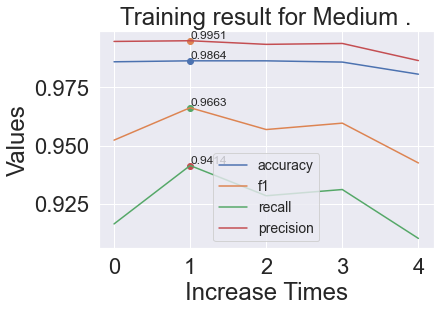

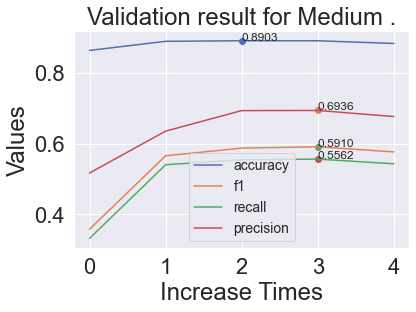

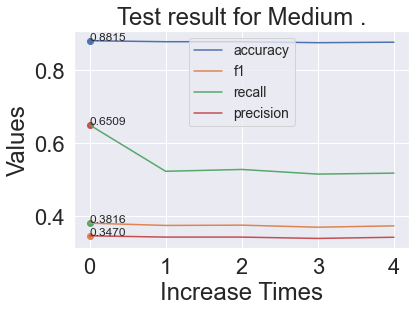

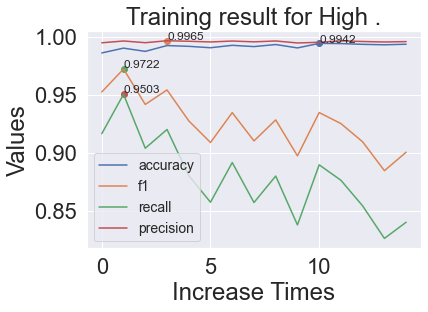

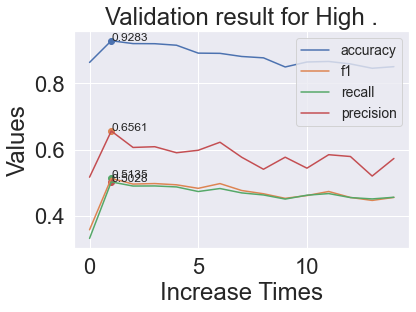

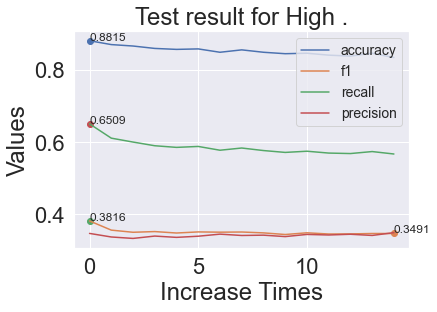

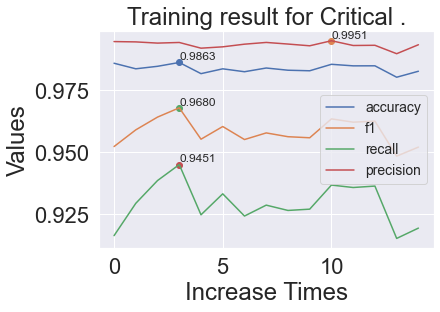

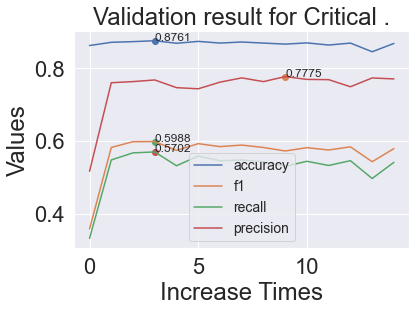

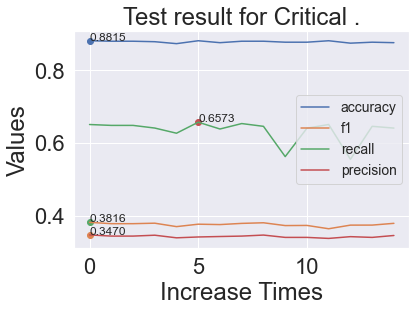

In [ ]:
location = 'NY'
phases = ['Training','Validation','Test']
for category in categories:
  if category == 'Low':
    continue
  for phase in phases:
    if phase == 'Training':
      plot_metrics_Upsample_priority(location,train_record,category,phase)
    elif phase == 'Validation':
      plot_metrics_Upsample_priority(location,val_record,category,phase)
    else:
      plot_metrics_Upsample_priority(location,test_record,category,phase)

#### Search the best LR

In [ ]:
from sklearn.model_selection import cross_validate, RandomizedSearchCV, KFold
import copy
def search_best_lR_priority(increaseTimes,location):
  
  
  # iterate over a range of increaseTime and all category

  # store the best parameter for each increaseTime
  metrics_all = {'f1_best_all': defaultdict(),'best_paras': defaultdict()}
  best_parameters_all = defaultdict()
  cv_score_all = defaultdict()
  test_scores_all = defaultdict()
  for increaseTime in range(0,increaseTimes):
    metrics_one_run = {'f1_best_each_cate': defaultdict()}
    best_parameters_one_run = defaultdict()
    cv_score_one_run = defaultdict()
    print("Performing grid search on IncreaseTime %d" %(increaseTime))
    for category in categories:
      if category == 'Low':
        continue

      if category == 'Medium' and increaseTime != 5:
        continue

      if category == 'High' and increaseTime != 6:
        continue

      if category == 'Critical' and increaseTime != 4:
        continue

      print("Performing grid search on category %s" %(category))
      # df_tmp = pd.read_csv('cache/'+location+'/upsampleData_'+str(category)+'_'+str(increaseTime)+'.csv')
      # trainF = {'full_text':df_tmp['full_text'], 'hashtags': df_tmp['hashtags'], 'favorite_count': df_tmp['favorite_count']}
      # trainL = list(df_tmp['target'])

      # step 1: build up-sample training set
      global trainF, trainL, testF, testL
      trainSet_temp = copy.deepcopy(trainF)
      label_temp = copy.deepcopy(trainL)
      
      # print('Before length %d'%(len(label_temp)))
      idxs = np.where(np.array(label_temp) == category)[0]
      # print('There are %d postitive sample in this category.'%(len(idxs)))
      
      for idx in list(idxs):
        # Duplicate (increaseTime) times
        for j in range(increaseTime):
          trainSet_temp['hashtags'].append(trainSet_temp['hashtags'][idx])
          trainSet_temp['full_text'].append(trainSet_temp['full_text'][idx])
          trainSet_temp['favorite_count'].append(trainSet_temp['favorite_count'][idx])
          label_temp.append(category)
      trainF = trainSet_temp
      trainL = label_temp
      # build the training set for feature union and gridSerachCV
      trainF_tmp = []
      testF_tmp = []
      for i in range(len(trainF['full_text'])):
        trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                          'favorite_count':trainF['favorite_count'][i]})
      for i in range(len(testF['full_text'])):
        testF_tmp.append({'full_text':testF['full_text'][i],'hashtags':testF['hashtags'][i],
                          'favorite_count':testF['favorite_count'][i]})
      
      fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector_gridSearch(key='full_text')),('cv',count_vect),
                ])),
                ('hashtags',Pipeline([('selector', ItemSelector_gridSearch(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',Pipeline([('selector', numericalTransformer_gridSearch(key='favorite_count')),
                ])),
                ],n_jobs=-1)
      
      fullpipe = Pipeline([

                  ('fu', fu),
                  ('lr', LogisticRegression())
                 ])
            
      params = {
          # Fill in the parameter
          
          'fu__full_text__cv__ngram_range':[(1,2),(1,3),(1,4)],
          'fu__full_text__cv__binary': (True, False),
          'fu__full_text__cv__max_features': np.linspace(100,50000,100,dtype=int),
          'lr__penalty': ['l2'],
          'lr__C': np.linspace(0.000001,1000,100,dtype=float),
          'lr__class_weight': ['balanced'],
          'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
          'lr__max_iter': np.linspace(50,1000,100,dtype=int),
      }

      # Pass in your pipeline, params (to tune), scoring, and split parameters here!
      grid_search = RandomizedSearchCV(fullpipe,params,verbose=3,cv=3,n_iter=450, scoring='f1_macro', n_jobs=-1,pre_dispatch='2*n_jobs',)
      
      # print("pipeline:", [name for name, _ in pipe.steps])
      # print("parameters:")
      # print(params)
      #n_jobs=-1,pre_dispatch='2*n_jobs'
      # FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
      grid_search.fit(trainF_tmp, trainL)

      # evaluate the test result
      # testF_union_tmp = grid_search.transform(testF)

      predictions = grid_search.predict(testF_tmp)
      precision = precision_score(predictions, testL, average='macro' )
      recall = recall_score(predictions, testL, average='macro')
      accuracy = accuracy_score(predictions, testL)
      f1 = fbeta_score(predictions, testL, 1, average='macro')

      test_scores = {'accuracy': accuracy,'precision': precision,'f1':f1,'recall': recall}
      print("Test result:", test_scores)

      print('type')
      print(type(trainL[0]))
      print("Best score: %0.3f" % grid_search.best_score_)
      # print("Best parameters set:")
      best_parameters = grid_search.best_estimator_.get_params()
      parameters_dict = {}
      for param_name in sorted(params.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))
        parameters_dict[param_name] = best_parameters[param_name]


      metrics_one_run['f1_best_each_cate'][category] = grid_search.best_score_
      cv_score_one_run[category] = grid_search.cv_results_
      best_parameters_one_run[category] = parameters_dict
      print(best_parameters_one_run[category])
      test_scores_all[increaseTime] = {category: test_scores}

    best_parameters_all[increaseTime] = best_parameters_one_run
    metrics_all['f1_best_all'][increaseTime] = metrics_one_run
    cv_score_all[increaseTime] = best_parameters_one_run
  return metrics_all, best_parameters_all, cv_score_all

In [ ]:
location = 'NY'
metrics_all, best_parameters_all, cv_score_all = search_best_lR_priority(45,location)

Performing grid search on IncreaseTime 0
Performing grid search on IncreaseTime 1
Performing grid search on IncreaseTime 2
Performing grid search on IncreaseTime 3
Performing grid search on IncreaseTime 4
Performing grid search on category Critical
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 24.8min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 34.8min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 40.9min finished
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From

Test result: {'accuracy': 0.810918774966711, 'precision': 0.3761213462535391, 'f1': 0.36565506668756215, 'recall': 0.35780773865549415}
type
<class 'str'>
Best score: 0.596
	fu__full_text__cv__binary: False
	fu__full_text__cv__max_features: 16733
	fu__full_text__cv__ngram_range: (1, 2)
	lr__C: 555.555556
	lr__class_weight: 'balanced'
	lr__max_iter: 4170
	lr__penalty: 'l2'
	lr__solver: 'newton-cg'
{'fu__full_text__cv__binary': False, 'fu__full_text__cv__max_features': 16733, 'fu__full_text__cv__ngram_range': (1, 2), 'lr__C': 555.555556, 'lr__class_weight': 'balanced', 'lr__max_iter': 4170, 'lr__penalty': 'l2', 'lr__solver': 'newton-cg'}
Performing grid search on IncreaseTime 5
Performing grid search on category Medium
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 34.1min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 41.3min finished
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 conc

Test result: {'accuracy': 0.8255659121171771, 'precision': 0.35885133787933166, 'f1': 0.3588175833890554, 'recall': 0.5592190205111652}
type
<class 'str'>
Best score: 0.778
	fu__full_text__cv__binary: False
	fu__full_text__cv__max_features: 16733
	fu__full_text__cv__ngram_range: (1, 2)
	lr__C: 595.9595963636364
	lr__class_weight: 'balanced'
	lr__max_iter: 6884
	lr__penalty: 'l2'
	lr__solver: 'newton-cg'
{'fu__full_text__cv__binary': False, 'fu__full_text__cv__max_features': 16733, 'fu__full_text__cv__ngram_range': (1, 2), 'lr__C': 595.9595963636364, 'lr__class_weight': 'balanced', 'lr__max_iter': 6884, 'lr__penalty': 'l2', 'lr__solver': 'newton-cg'}
Performing grid search on IncreaseTime 6
Performing grid search on category High
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 36.9min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 52.7min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 63.5min finished


Test result: {'accuracy': 0.8801597869507324, 'precision': 0.33420145950472546, 'f1': 0.35959335345796434, 'recall': 0.6438061938061939}
type
<class 'str'>
Best score: 0.895
	fu__full_text__cv__binary: True
	fu__full_text__cv__max_features: 47983
	fu__full_text__cv__ngram_range: (1, 3)
	lr__C: 424.2424248181818
	lr__class_weight: 'balanced'
	lr__max_iter: 6884
	lr__penalty: 'l2'
	lr__solver: 'liblinear'
{'fu__full_text__cv__binary': True, 'fu__full_text__cv__max_features': 47983, 'fu__full_text__cv__ngram_range': (1, 3), 'lr__C': 424.2424248181818, 'lr__class_weight': 'balanced', 'lr__max_iter': 6884, 'lr__penalty': 'l2', 'lr__solver': 'liblinear'}
Performing grid search on IncreaseTime 7
Performing grid search on IncreaseTime 8
Performing grid search on IncreaseTime 9
Performing grid search on IncreaseTime 10
Performing grid search on IncreaseTime 11
Performing grid search on IncreaseTime 12
Performing grid search on IncreaseTime 13
Performing grid search on IncreaseTime 14
Performing

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


### Build state of the art classifier

In [ ]:

                  
location = 'WS'
from sklearn.linear_model import LogisticRegression
count_vect_priority = CountVectorizer(tokenizer=tokenize_normalize,binary=True,max_features=47983,ngram_range=(1,3))
best_lr_priority = LogisticRegression(C=424.24242,class_weight='balanced',max_iter=6884,penalty='l2',solver='liblinear')

increaseTime_priority = 6
category_priority = 'High'
best_lr_priority, pipe_priority, fu_priority, testF_union_priority, errors_idxs_priority, all_errors_priority = build_best_lr_priority(best_lr_priority, count_vect_priority, category_priority, increaseTime_priority, trainF, trainL, testF, testL)



Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.973932 test_precision_macro=0.457968 test_f1_macro=0.358556 test_recall_macro=0.350000 .

Cross validation: Average validation set result: train_accuracy=0.999445 train_precision_macro=0.999810 train_f1_macro=0.995672 train_recall_macro=0.991667 .

Test result: {'accuracy': 0.9780361757105943, 'precision': 0.35670252248851986, 'f1': 0.37407165176949353, 'recall': 0.6597582037996546}
              precision    recall  f1-score   support

        High     0.0714    1.0000    0.1333         1
         Low     0.9987    0.9793    0.9889       772
      Medium     0.0000    0.0000    0.0000         1

    accuracy                         0.9780       774
   macro avg     0.3567    0.6598    0.3741       774
weighted avg     0.9962    0.9780    0.9865       774

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.988749 test_precision_macro=0.6624

In [ ]:
build_default_lr_priority(best_lr_priority,category_priority, increaseTime_priority, trainF, trainL, testF, testL, more=[cv_train,trainL, cv_test, testL])

Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3205    0.7143    0.4425        35
         Low     0.9876    0.8894    0.9359       714
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8815       751
   macro avg     0.3470    0.6509    0.3816       751
weighted avg     0.9541    0.8815    0.9108       751

Display result with up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3205    0.7143    0.4425        35
         Low     0.9876    0.8894    0.9359       714
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8815       751
   macro avg     0.3470    0.6509    0.3816       751
weighted avg     0.9541    0.8815    0.9108       751



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

#### Plot confusion matrix

20


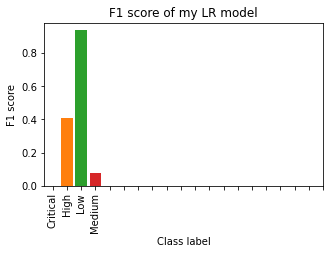

In [ ]:
#  Plot a bar chart graph with the F1 score for each class - (subreddit on x-axis, F1 score on Y axis)
import matplotlib.pyplot as plt
import numpy as np
result_logis = classification_report(best_lr_priority.predict(testF_union_priority), testL, digits=3)
result_logis = result_logis.split()
f1_classlabel = result_logis[4:-15:5]
print(len(result_logis[4:-15]))
f1_each = result_logis[7:-15:5]
plt.figure(figsize=(5, 3))
for i in range(4):
    plt.bar(i,float(f1_each[i]))

plt.title('F1 score of my LR model')
plt.xticks(np.arange(20),f1_classlabel,rotation=90)
plt.ylabel('F1 score')
plt.xlabel('Class label')
plt.savefig('barGraph.png',dpi=200,bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.metrics import plot_confusion_matrix
def plotCM(title,classifier,X_test, y_test):
    fig,ax = plt.subplots(figsize=(5,5))
    disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     xticks_rotation='vertical',
                                     cmap=plt.cm.Blues,ax=ax,
                                     normalize='true')
    
    disp.ax_.set_title(title)
    plt.savefig(title+'_'+'CM'+'_'+'priority'+'.png',dpi=200,bbox_inches='tight')

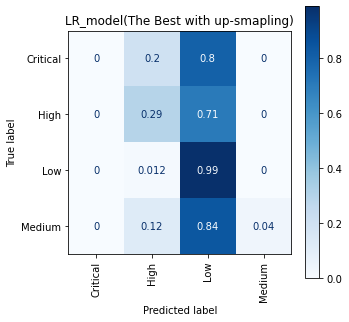

In [ ]:
#plot the confusion matrix for the best model
plotCM('LR_model(The Best with up-smapling)',best_lr_priority,testF_union_priority,testL)

### Error analysis

In [ ]:
import eli5
from eli5.lime import TextExplainer
eli5.show_weights(best_lr_priority, feature_names=fu_priority.get_feature_names(), top=(30,30))

CountVectorizer
CountVectorizer


In [ ]:
all_errors_priority

,index,true_label,prediction,full_text,hashtags,favorite_count
0,0,High,Low,New York reports 15 cases of rare illness in c...,,0
1,2,High,Low,Coronavirus deaths in New York state break 500...,,0
2,11,Medium,High,Samaritan's Purse NYC field hospital already t...,,0
3,15,Critical,High,"BREAKING NEWS: Trump to quarantine New York, C...",,0
4,31,Medium,Low,This is an ominous story. https://t.co/hLueyPXLLz,,1
...,...,...,...,...,...,...
87,686,High,Low,@ImMrMeeseeksLo4 @FulkKendall @AOC We don't kn...,,0
88,688,Medium,Low,"Trend and Turning Point of #Covid_19 (NYC, #n...",Covid_19 nyccoronavirus uscoronavirus,0
89,691,Low,High,New York congresswoman 'felt so helpless' afte...,,0
90,693,High,Low,@LevineJonathan NY is experiencing what it is ...,coronavirus,0


In [ ]:
all_errors_priority[all_errors_priority.true_label=='Critical']


,index,true_label,prediction,full_text,hashtags,favorite_count
3,15,Critical,High,"BREAKING NEWS: Trump to quarantine New York, C...",,0
29,177,Critical,Low,"""In the coming days, you're going to see peopl...",NotABigDeal UnderControl Trump,2
52,328,Critical,Low,NY is being overwhelmed.\n“A supervisor urged ...,,0
59,396,Critical,Low,New York mayor pleads for help as U.S. coronav...,,2
91,739,Critical,Low,"Scenes of ""catastrophe"" as New York hospitals ...",,0


In [ ]:
all_errors_priority.true_label.value_counts()

High        55
Medium      24
Low          8
Critical     5
Name: true_label, dtype: int64

In [ ]:
def print_all_featrues_of_one_sample(sample,idx):
    for key in sample.keys():
        print(key,sample[key][idx])


In [ ]:
all_errors_priority.

In [ ]:
idx = 0
print(all_errors_priority.iloc[0])
print(all_errors_priority.full_text[0])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[0]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                             0
true_label                                                     High
prediction                                                      Low
full_text         New York reports 15 cases of rare illness in c...
hashtags                                                           
favorite_count                                                    0
Name: 0, dtype: object
New York reports 15 cases of rare illness in children possibly linked to Covid-19 https://t.co/SVIRdPFYuI
CountVectorizer
CountVectorizer


In [ ]:
idx = 1
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                             2
true_label                                                     High
prediction                                                      Low
full_text         Coronavirus deaths in New York state break 500...
hashtags                                                           
favorite_count                                                    0
Name: 1, dtype: object
Coronavirus deaths in New York state break 500, Gov. Andrew Cuomo extends school closures - https://t.co/zm4OKVoapc
CountVectorizer
CountVectorizer


In [ ]:
idx = 3
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                            15
true_label                                                 Critical
prediction                                                     High
full_text         BREAKING NEWS: Trump to quarantine New York, C...
hashtags                                                           
favorite_count                                                    0
Name: 3, dtype: object
BREAKING NEWS: Trump to quarantine New York, Connecticut, New Jersey https://t.co/1frpoouIPF @MailOnline
CountVectorizer
CountVectorizer


In [ ]:
idx = 29
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                           177
true_label                                                 Critical
prediction                                                      Low
full_text         "In the coming days, you're going to see peopl...
hashtags                            NotABigDeal UnderControl Trump 
favorite_count                                                    2
Name: 29, dtype: object
"In the coming days, you're going to see people die who did not need to die." Bill deBlasio on NYC ventilator shortage. For Breitbart peeps, this means all ventilators in the state stockpile already have been deployed.
#NotABigDeal #UnderControl #Trump 
https://t.co/zCk6IH7IzW
CountVectorizer
CountVectorizer


## DC

In [ ]:
#preprossesing
import re
import spacy
from spacy.tokenizer import Tokenizer
# from nltk.corpus import stopwords
# nltk.download('stopwords')
# from nltk.tokenize import word_tokenize

nlp = spacy.load('en_core_web_sm', disable=[])
all_stopwords = nlp.Defaults.stop_words
if 'not' in all_stopwords:
    all_stopwords.remove('not')

disable=['ner']
nlp.remove_pipe('tagger')
nlp.remove_pipe('parser')
#@Tokenize
def spacy_tokenize(string):
  tokens = list()
  doc = nlp(string)
  for token in doc:
    tokens.append(token)
  return tokens

    
#@Normalize
def normalize(tokens):
  normalized_tokens = list()
  for token in tokens:
    normalized = token.text.lower().strip()
    if (not token.is_stop):
        if ((token.is_alpha or token.is_digit or token.like_url)):
            normalized_tokens.append(normalized)
  return normalized_tokens

#@Tokenize and normalize
def tokenize_normalize(string):
  return normalize(spacy_tokenize(string))




In [ ]:
# Choose one dataset to use in this section
Tweets = cv19_dc_labeled
trainSet,testSet = generateTrainingSetCV(Tweets)

In [ ]:

# Extract training set
featureList = ['full_text','entities','favorite_count'] #,'favorited'
trainF = EF(trainSet,featureList)
testF = EF(testSet,featureList)

labelList = ['priority']
trainL = EF(trainSet,labelList)['priority']
testL = EF(testSet,labelList)['priority']

trainF = Ehashtags(trainF)
testF = Ehashtags(testF)

#### Vectorize data

In [ ]:
count_vect = CountVectorizer(tokenizer=tokenize_normalize)
Tfidf_vect = TfidfVectorizer(tokenizer=tokenize_normalize)

fu_Tfidf = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('tf_idf',Tfidf_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ],n_jobs=-1)

fu_count = FeatureUnion([('full_text',myPipeline([('selector', ItemSelector(key='full_text')),('cv',count_vect),
                ])),
                ('hashtags',myPipeline([('selector', ItemSelector(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',myPipeline([('selector', numericalTransformer(key='favorite_count')),
                ])),
                ],n_jobs=-1)

cv_train = fu_count.fit_transform(trainF)
cv_test = fu_count.transform(testF)

tfv_train = fu_Tfidf.fit_transform(trainF)
tfv_test = fu_Tfidf.transform(testF)

#### Dummmy Classifier

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
DummyResult(runningSet)

Evaluate dummy classifier with strategy of most_frequent
Cross validation: Average training set result: test_accuracy=0.954338 test_precision_macro=0.318113 test_f1_macro=0.325545 test_recall_macro=0.333333 .

Cross validation: Average validation set result: train_accuracy=0.954338 train_precision_macro=0.318113 train_f1_macro=0.325545 train_recall_macro=0.333333 .

Evaluate dummy classifier with strategy of stratified
Cross validation: Average training set result: test_accuracy=0.915528 test_precision_macro=0.340446 test_f1_macro=0.341489 test_recall_macro=0.347463 .

Cross validation: Average validation set result: train_accuracy=0.911245 train_precision_macro=0.335668 train_f1_macro=0.335027 train_recall_macro=0.334693 .



#### LR with One-hot encoding

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
lr_priority(runningSet=runningSet)

Cross validation: Average training set result: test_accuracy=0.956622 test_precision_macro=0.608615 test_f1_macro=0.415177 test_recall_macro=0.387284 .

Cross validation: Average validation set result: train_accuracy=0.997003 train_precision_macro=0.998957 train_f1_macro=0.979151 train_recall_macro=0.960787 .

Test result: {'accuracy': 0.9667553191489362, 'precision': 0.4250051156128504, 'f1': 0.4560888702578076, 'recall': 0.5318100358422939}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     0.9972    0.9704    0.9837       744
      Medium     0.2778    0.6250    0.3846         8

    accuracy                         0.9668       752
   macro avg     0.4250    0.5318    0.4561       752
weighted avg     0.9896    0.9668    0.9773       752



({'fit_time': 0.33310346603393554,
  'score_time': 0.0030024051666259766,
  'test_accuracy': 0.9566218966218967,
  'train_accuracy': 0.9970032613753576,
  'test_precision_macro': 0.6086154569346707,
  'train_precision_macro': 0.9989567435481741,
  'test_f1_macro': 0.4151772861711075,
  'train_f1_macro': 0.9791512361023293,
  'test_recall_macro': 0.3872841923570317,
  'train_recall_macro': 0.9607868155236575},
 {'accuracy': 0.9667553191489362,
  'precision': 0.4250051156128504,
  'f1': 0.4560888702578076,
  'recall': 0.5318100358422939})

#### LR with TF-IDF

In [ ]:
runningSet = [tfv_train,trainL, tfv_test, testL]
lr_priority(runningSet)

Cross validation: Average training set result: test_accuracy=0.954908 test_precision_macro=0.451801 test_f1_macro=0.347858 test_recall_macro=0.345255 .

Cross validation: Average validation set result: train_accuracy=0.959618 train_precision_macro=0.986468 train_f1_macro=0.469424 train_recall_macro=0.414145 .

Test result: {'accuracy': 0.964095744680851, 'precision': 0.35185185185185186, 'f1': 0.3623193577163247, 'recall': 0.6546826453617399}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.9640    0.9817       751
      Medium     0.0556    1.0000    0.1053         1

    accuracy                         0.9641       752
   macro avg     0.3519    0.6547    0.3623       752
weighted avg     0.9987    0.9641    0.9805       752



({'fit_time': 0.36212968826293945,
  'score_time': 0.0030024051666259766,
  'test_accuracy': 0.9549076109076109,
  'train_accuracy': 0.9596175953389723,
  'test_precision_macro': 0.4518012873963208,
  'train_precision_macro': 0.9864680543250417,
  'test_f1_macro': 0.347857864806779,
  'train_f1_macro': 0.4694242860491943,
  'test_recall_macro': 0.34525494465614226,
  'train_recall_macro': 0.4141449583554846},
 {'accuracy': 0.964095744680851,
  'precision': 0.35185185185185186,
  'f1': 0.3623193577163247,
  'recall': 0.6546826453617399})

#### SVM with One-hot Encoding

In [ ]:
runningSet = [cv_train,trainL, cv_test, testL]
svm_priority(runningSet)

Cross validation: Average training set result: test_accuracy=0.954338 test_precision_macro=0.318113 test_f1_macro=0.325545 test_recall_macro=0.333333 .

Cross validation: Average validation set result: train_accuracy=0.954338 train_precision_macro=0.318113 train_f1_macro=0.325545 train_recall_macro=0.333333 .

Test result: {'accuracy': 0.9627659574468085, 'precision': 0.3333333333333333, 'f1': 0.3270099367660343, 'recall': 0.32092198581560283}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.9628    0.9810       752
      Medium     0.0000    0.0000    0.0000         0

    accuracy                         0.9628       752
   macro avg     0.3333    0.3209    0.3270       752
weighted avg     1.0000    0.9628    0.9810       752



#### Tuning LR


In [ ]:
train_record = {}
val_record = {}
test_record = {}
categories = ['Low','Medium','High','Critical']

for category in categories:
    train_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    val_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}
    test_record[category] = {'accuracy':[],'precision':[],'f1':[],'recall':[]}




In [ ]:
import copy
for increaseTime in range(0, 50):  
  print('Current increase %d times' %(increaseTime))
  # up-sample the label

  # Run logistic regression on up-sample
  for category in categories:
    print('Currrent is classifying categorie %s'%(category))
    print()

    if category == 'Low':
      continue

    if category == 'Medium' and increaseTime >= 5:
      continue

    # if category == 'High' and increaseTime >= 6:
    #   continue

    # if category == 7 and increaseTime >= 4:
    #   continue
  

    # step 1: build up-sample training set
    trainSet_temp = copy.deepcopy(trainF)
    label_temp = copy.deepcopy(trainL)
    
    # print('Before length %d'%(len(label_temp)))
    idxs = np.where(np.array(label_temp) == category)[0]
    # print('There are %d postitive sample in this category.'%(len(idxs)))
    
    for idx in list(idxs):
      # Duplicate (increaseTime) times
      for j in range(increaseTime):
        trainSet_temp['hashtags'].append(trainSet_temp['hashtags'][idx])
        trainSet_temp['full_text'].append(trainSet_temp['full_text'][idx])
        trainSet_temp['favorite_count'].append(trainSet_temp['favorite_count'][idx])
        label_temp.append(category)

    # step 2: feature union
    trainSet_temp = fu_count.fit_transform(trainSet_temp)
    tfv_test_temp = fu_count.transform(testF)


    # step 3: train the LR
    runningSet = [trainSet_temp,np.array(label_temp), tfv_test_temp, testL]
    cv_scores, test_scores = lr_priority(runningSet)
    record_nine_result(train_record, val_record, test_record, cv_scores, test_scores, category)

Current increase 0 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.938 R=0.996 F1=0.966
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.934     1.000     0.966       155
         Low      1.000     0.986     0.993      1193
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1400
   macro avg      0.938     0.996     0.966      1400
weighted avg      0.989     0.988     0.988      1400

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.321 R=0.373 F1=0.333
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.306     0.611     0.407        18
         Low      0.977     0.880     0.926       333
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.931 R=0.996 F1=0.962
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.923     1.000     0.960       143
         Low      1.000     0.985     0.993      1210
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1401
   macro avg      0.931     0.996     0.962      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.392 R=0.592 F1=0.435
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.426     0.833     0.563        24
         Low      0.989     0.870     0.926       323
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.927     1.000     0.962       153
         Low      1.000     0.985     0.992      1196
      Medium      0.857     1.000     0.923        36

    accuracy                          0.987      1401
   macro avg      0.946     0.996     0.969      1401
weighted avg      0.988     0.987     0.987      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.362 R=0.655 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.297     0.733     0.423        15
         Low      0.983     0.885     0.932       331
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      0.934     1.000     0.966       155
         Low      1.000     0.988     0.994      1190
      Medium      0.930     1.000     0.964        40

    accuracy                          0.990      1401
   macro avg      0.966     0.997     0.981      1401
weighted avg      0.991     0.990     0.990      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.331 R=0.584 F1=0.369
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.167     0.462     0.245        13
         Low      0.977     0.875     0.923       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.946 R=0.997 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.936     1.000     0.967       146
         Low      1.000     0.987     0.994      1197
      Medium      0.917     1.000     0.957        44

    accuracy                          0.989      1401
   macro avg      0.946     0.997     0.971      1401
weighted avg      0.990     0.989     0.989      1401

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.854 P=0.291 R=0.370 F1=0.298
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.174     0.615     0.271        13
         Low      0.990     0.864     0.922       337
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
Current increase 1 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.888643 test_precision_macro=0.635187 test_f1_macro=0.565603 test_recall_macro=0.540361 .

Cross validation: Average validation set result: train_accuracy=0.986427 train_precision_macro=0.995051 train_f1_macro=0.966278 train_recall_macro=0.941448 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.908 R=0.993 F1=0.947
              precision    recall  f1-score   support

    Critical      0.812     1.000     0.897        13
        High      0.915     0.993     0.953       152
         Low      1.000     0.979     0.989      1192
      Medium      0.906     1.000     0.951        87

    accuracy                          0.982      1444
   macro avg      0.908     0.993     0.947      1444
weighted avg      0.984     0.982     0.982      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.892 P=0.534 R=0.617 F1=0.559
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.243     0.562     0.340        16
         Low      0.977     0.904     0.939       334
      Medium      0.917     1.000     0.957 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.946 R=0.994 F1=0.969
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      0.915     0.993     0.952       141
         Low      0.999     0.984     0.992      1203
      Medium      0.946     1.000     0.972        88

    accuracy                          0.986      1444
   macro avg      0.946     0.994     0.969      1444
weighted avg      0.987     0.986     0.986      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.593 R=0.678 F1=0.617
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.449     0.880     0.595        25
         Low      0.990     0.897     0.941       321
      Medium      0.933     0.933     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.967 R=0.996 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        15
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1185
      Medium      0.948     1.000     0.974        92

    accuracy                          0.988      1444
   macro avg      0.967     0.996     0.981      1444
weighted avg      0.988     0.988     0.988      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.540 R=0.655 F1=0.571
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.270     0.714     0.392        14
         Low      0.981     0.904     0.941       335
      Medium      0.909     1.000     0.952 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.959 R=0.997 F1=0.977
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.935     1.000     0.966       157
         Low      1.000     0.986     0.993      1179
      Medium      0.958     1.000     0.979        92

    accuracy                          0.989      1444
   macro avg      0.959     0.997     0.977      1444
weighted avg      0.990     0.989     0.989      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.486 R=0.536 F1=0.501
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.147     0.333     0.204        15
         Low      0.965     0.901     0.932       335
      Medium      0.833     0.909     0.870 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.928 R=0.994 F1=0.959
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.917     0.993     0.954       145
         Low      1.000     0.984     0.992      1242
      Medium      0.860     1.000     0.925        43

    accuracy                          0.985      1444
   macro avg      0.928     0.994     0.959      1444
weighted avg      0.987     0.985     0.986      1444

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.842 P=0.483 R=0.630 F1=0.516
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.200     0.692     0.310        13
         Low      0.992     0.826     0.902       305
      Medium      0.741     1.000     0.851 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.34342385452805363, 'f1': 0.3754014269729864, 'recall': 0.5237707284877485}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.928322 test_precision_macro=0.656112 test_f1_macro=0.513516 test_recall_macro=0.502777 .

Cross validation: Average validation set result: train_accuracy=0.990143 train_precision_macro=0.996310 train_f1_macro=0.972151 train_recall_macro=0.950347 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.934 R=0.997 F1=0.963
              precision    recall  f1-score   support

    Critical      0.875     1.000     0.933        14
        High      0.984     0.997     0.990       359
         Low      1.000     0.990     0.995      1153
      Medium      0.878     1.000     0.935        36

    accuracy                          0.992      1562
   macro avg      0.934     0.997     0.963      1562
weighted avg      0.992     0.992     0.992      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.918 P=0.477 R=0.419 F1=0.445
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.950     0.731     0.826        52
         Low      0.958     0.947     0.953       339
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.855 R=0.985 F1=0.910
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800         8
        High      0.940     0.997     0.968       332
         Low      0.999     0.974     0.986      1190
      Medium      0.816     0.969     0.886        32

    accuracy                          0.979      1562
   macro avg      0.855     0.985     0.910      1562
weighted avg      0.981     0.979     0.979      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.495 R=0.610 F1=0.510
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.827     0.768     0.796        56
         Low      0.965     0.921     0.943       331
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.961 R=0.998 F1=0.979
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.981     1.000     0.990       358
         Low      1.000     0.990     0.995      1152
      Medium      0.925     1.000     0.961        37

    accuracy                          0.993      1562
   macro avg      0.961     0.998     0.979      1562
weighted avg      0.993     0.993     0.993      1562

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.926 P=0.491 R=0.683 F1=0.485
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.923     0.783     0.847        46
         Low      0.970     0.948     0.959       343
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.967 R=0.997 F1=0.982
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        17
        High      0.981     1.000     0.990       354
         Low      1.000     0.990     0.995      1152
      Medium      0.889     1.000     0.941        40

    accuracy                          0.992      1563
   macro avg      0.967     0.997     0.982      1563
weighted avg      0.993     0.992     0.992      1563

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.954 P=0.668 R=0.946 F1=0.722
              precision    recall  f1-score   support

    Critical      0.500     1.000     0.667         1
        High      0.977     0.808     0.884        52
         Low      0.973     0.976     0.975       335
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.829 R=0.992 F1=0.896
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.891     0.994     0.939       156
         Low      1.000     0.976     0.988      1355
      Medium      0.827     1.000     0.905        43

    accuracy                          0.978      1563
   macro avg      0.829     0.992     0.896      1563
weighted avg      0.982     0.978     0.979      1563

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.808 P=0.425 R=0.417 F1=0.407
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.700     0.994     0.821       162
         Low      1.000     0.675     0.806       228
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8708388814913449, 'precision': 0.33711249351995853, 'f1': 0.3561431020688078, 'recall': 0.6112708453133985}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.871751 test_precision_macro=0.760634 test_f1_macro=0.582575 test_recall_macro=0.548279 .

Cross validation: Average validation set result: train_accuracy=0.983757 train_precision_macro=0.994626 train_f1_macro=0.959094 train_recall_macro=0.929419 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        35
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1192
      Medium      0.881     1.000     0.937        37

    accuracy                          0.987      1416
   macro avg      0.951     0.996     0.972      1416
weighted avg      0.988     0.987     0.988      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.555 R=0.611 F1=0.566
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.243     0.562     0.340        16
         Low      0.977     0.881     0.926       335
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.927 R=0.993 F1=0.958
              precision    recall  f1-score   support

    Critical      0.969     1.000     0.984        31
        High      0.884     0.993     0.935       138
         Low      1.000     0.980     0.990      1212
      Medium      0.854     1.000     0.921        35

    accuracy                          0.982      1416
   macro avg      0.927     0.993     0.958      1416
weighted avg      0.984     0.982     0.983      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.884 P=0.606 R=0.841 F1=0.668
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909         5
        High      0.447     0.808     0.575        26
         Low      0.990     0.891     0.937       320
      Medium      0.154     0.667     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.932 R=0.996 F1=0.961
              precision    recall  f1-score   support

    Critical      0.971     1.000     0.986        34
        High      0.927     1.000     0.962       153
         Low      1.000     0.983     0.992      1195
      Medium      0.829     1.000     0.907        34

    accuracy                          0.986      1416
   macro avg      0.932     0.996     0.961      1416
weighted avg      0.987     0.986     0.986      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.519 R=0.789 F1=0.543
              precision    recall  f1-score   support

    Critical      0.667     0.500     0.571         4
        High      0.270     0.769     0.400        13
         Low      0.987     0.887     0.934       335
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.943 R=0.994 F1=0.967
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        35
        High      0.862     1.000     0.926       144
         Low      1.000     0.977     0.989      1197
      Medium      0.909     1.000     0.952        40

    accuracy                          0.981      1416
   macro avg      0.943     0.994     0.967      1416
weighted avg      0.983     0.981     0.981      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.593 R=0.712 F1=0.597
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.200     0.538     0.292        13
         Low      0.974     0.892     0.931       334
      Medium      0.200     0.667     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.939 R=0.995 F1=0.966
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.929     0.993     0.960       146
         Low      0.999     0.986     0.993      1213
      Medium      0.896     1.000     0.945        43

    accuracy                          0.987      1416
   macro avg      0.939     0.995     0.966      1416
weighted avg      0.988     0.987     0.987      1416

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.448 R=0.612 F1=0.491
              precision    recall  f1-score   support

    Critical      0.609     1.000     0.757        14
        High      0.196     0.600     0.295        15
         Low      0.989     0.849     0.914       325
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.3779795996290842, 'recall': 0.6484985602632661}
Current increase 2 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890259 test_precision_macro=0.693108 test_f1_macro=0.587278 test_recall_macro=0.554262 .

Cross validation: Average validation set result: train_accuracy=0.986417 train_precision_macro=0.993500 train_f1_macro=0.956908 train_recall_macro=0.928467 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.938 R=0.994 F1=0.964
              precision    recall  f1-score   support

    Critical      0.875     1.000     0.933        14
        High      0.897     1.000     0.946       148
         Low      1.000     0.982     0.991      1178
      Medium      0.980     0.993     0.986       147

    accuracy                          0.985      1487
   macro avg      0.938     0.994     0.964      1487
weighted avg      0.987     0.985     0.986      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.892 P=0.554 R=0.592 F1=0.559
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.243     0.529     0.333        17
         Low      0.972     0.909     0.939       341
      Medium      1.000     0.929     0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.972 P=0.828 R=0.988 F1=0.889
              precision    recall  f1-score   support

    Critical      0.538     1.000     0.700         7
        High      0.830     0.984     0.901       129
         Low      0.998     0.967     0.982      1212
      Medium      0.946     1.000     0.972       139

    accuracy                          0.972      1487
   macro avg      0.828     0.988     0.889      1487
weighted avg      0.977     0.972     0.973      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.591 R=0.655 F1=0.612
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.449     0.786     0.571        28
         Low      0.983     0.903     0.941       329
      Medium      0.933     0.933     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.976 R=0.995 F1=0.985
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        15
        High      0.919     1.000     0.958       148
         Low      1.000     0.988     0.994      1176
      Medium      0.987     0.993     0.990       148

    accuracy                          0.990      1487
   macro avg      0.976     0.995     0.985      1487
weighted avg      0.991     0.990     0.990      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.890 P=0.543 R=0.658 F1=0.573
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      0.268     0.733     0.393        15
         Low      0.981     0.898     0.938       343
      Medium      0.923     1.000     0.960 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.956 R=0.994 F1=0.974
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.903     1.000     0.949       149
         Low      1.000     0.984     0.992      1172
      Medium      0.980     0.993     0.987       150

    accuracy                          0.987      1487
   macro avg      0.956     0.994     0.974      1487
weighted avg      0.988     0.987     0.987      1487

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.666 R=0.816 F1=0.691
              precision    recall  f1-score   support

    Critical      0.500     1.000     0.667         1
        High      0.189     0.583     0.286        12
         Low      0.975     0.910     0.942       346
      Medium      1.000     0.769     0.870 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.976 P=0.826 R=0.992 F1=0.895
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.890     0.993     0.939       147
         Low      1.000     0.973     0.986      1293
      Medium      0.745     1.000     0.854        38

    accuracy                          0.976      1488
   macro avg      0.826     0.992     0.895      1488
weighted avg      0.980     0.976     0.977      1488

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.803 P=0.458 R=0.605 F1=0.481
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.158     0.667     0.255         9
         Low      0.991     0.755     0.857       286
      Medium      0.685     1.000     0.813 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.34342385452805363, 'f1': 0.3761944039432414, 'recall': 0.528806977336389}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.919722 test_precision_macro=0.606663 test_f1_macro=0.496237 test_recall_macro=0.490305 .

Cross validation: Average validation set result: train_accuracy=0.987355 train_precision_macro=0.994840 train_f1_macro=0.941572 train_recall_macro=0.903791 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.921 R=0.997 F1=0.955
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.996     0.995     0.996       564
         Low      0.999     0.992     0.995      1115
      Medium      0.821     1.000     0.901        32

    accuracy                          0.993      1724
   macro avg      0.921     0.997     0.955      1724
weighted avg      0.994     0.993     0.993      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.903 P=0.479 R=0.397 F1=0.429
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.977     0.636     0.771        66
         Low      0.940     0.951     0.946       365
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.979 R=0.999 F1=0.988
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        11
        High      1.000     0.998     0.999       551
         Low      0.999     0.997     0.998      1129
      Medium      0.917     1.000     0.957        33

    accuracy                          0.998      1724
   macro avg      0.979     0.999     0.988      1724
weighted avg      0.998     0.998     0.998      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.526 R=0.664 F1=0.515
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.718     0.836        78
         Low      0.937     0.940     0.938       348
      Medium      0.167     1.000     0.286 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.915 R=0.997 F1=0.951
              precision    recall  f1-score   support

    Critical      0.889     1.000     0.941        16
        High      0.996     0.996     0.996       561
         Low      1.000     0.990     0.995      1116
      Medium      0.775     1.000     0.873        31

    accuracy                          0.992      1724
   macro avg      0.915     0.997     0.951      1724
weighted avg      0.994     0.992     0.993      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.933 P=0.503 R=0.670 F1=0.480
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.978     0.710     0.822        62
         Low      0.962     0.970     0.966       368
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.979 R=0.999 F1=0.989
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     1.000     1.000       550
         Low      1.000     0.996     0.998      1117
      Medium      0.917     1.000     0.957        44

    accuracy                          0.998      1724
   macro avg      0.979     0.999     0.989      1724
weighted avg      0.998     0.998     0.998      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.956 P=0.495 R=0.456 F1=0.474
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.848     0.918        66
         Low      0.981     0.975     0.978       365
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.918 R=0.995 F1=0.954
              precision    recall  f1-score   support

    Critical      0.947     1.000     0.973        18
        High      0.895     1.000     0.945       179
         Low      1.000     0.979     0.989      1483
      Medium      0.830     1.000     0.907        44

    accuracy                          0.982      1724
   macro avg      0.918     0.995     0.954      1724
weighted avg      0.984     0.982     0.983      1724

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.627 R=0.443 F1=0.477
              precision    recall  f1-score   support

        High      0.882     1.000     0.937       358
         Low      1.000     0.329     0.495        73
      Medium      0.000     0.000     0.000         0

    accuracy                          0.886

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8668442077230359, 'precision': 0.3331297603381585, 'f1': 0.35017084703354384, 'recall': 0.600446883460945}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.873671 test_precision_macro=0.763727 test_f1_macro=0.598482 test_recall_macro=0.567732 .

Cross validation: Average validation set result: train_accuracy=0.984768 train_precision_macro=0.994138 train_f1_macro=0.964248 train_recall_macro=0.938617 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.952 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.927     1.000     0.962       153
         Low      1.000     0.986     0.993      1187
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1431
   macro avg      0.952     0.996     0.973      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.562 R=0.618 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.270     0.588     0.370        17
         Low      0.977     0.885     0.929       338
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.949 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        51
        High      0.923     1.000     0.960       143
         Low      1.000     0.986     0.993      1203
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1431
   macro avg      0.949     0.996     0.971      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.883 P=0.642 R=0.848 F1=0.685
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.447     0.840     0.583        25
         Low      0.990     0.886     0.935       324
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.953 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.926     1.000     0.962       151
         Low      1.000     0.986     0.993      1188
      Medium      0.884     1.000     0.938        38

    accuracy                          0.988      1431
   macro avg      0.953     0.996     0.973      1431
weighted avg      0.989     0.988     0.988      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.880 P=0.611 R=0.795 F1=0.598
              precision    recall  f1-score   support

    Critical      1.000     0.600     0.750         5
        High      0.282     0.688     0.400        16
         Low      0.980     0.893     0.934       335
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.929 R=0.994 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        54
        High      0.882     1.000     0.937       149
         Low      1.000     0.977     0.989      1193
      Medium      0.833     1.000     0.909        35

    accuracy                          0.981      1431
   macro avg      0.929     0.994     0.959      1431
weighted avg      0.984     0.981     0.982      1431

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.860 P=0.523 R=0.548 F1=0.525
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.121     0.308     0.174        13
         Low      0.971     0.883     0.925       341
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.973 P=0.833 R=0.983 F1=0.897
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.846     0.985     0.910       134
         Low      0.999     0.971     0.985      1246
      Medium      0.820     0.976     0.891        42

    accuracy                          0.973      1432
   macro avg      0.833     0.983     0.897      1432
weighted avg      0.977     0.973     0.974      1432

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.818 P=0.416 R=0.595 F1=0.458
              precision    recall  f1-score   support

    Critical      0.476     1.000     0.645        20
        High      0.196     0.562     0.290        16
         Low      0.992     0.819     0.898       321
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.3779795996290842, 'recall': 0.6484985602632661}
Current increase 3 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890207 test_precision_macro=0.693552 test_f1_macro=0.591038 test_recall_macro=0.556235 .

Cross validation: Average validation set result: train_accuracy=0.985886 train_precision_macro=0.993888 train_f1_macro=0.959652 train_recall_macro=0.931141 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.901 R=0.993 F1=0.941
              precision    recall  f1-score   support

    Critical      0.750     1.000     0.857        12
        High      0.872     1.000     0.932       143
         Low      1.000     0.976     0.988      1175
      Medium      0.980     0.995     0.988       200

    accuracy                          0.981      1530
   macro avg      0.901     0.993     0.941      1530
weighted avg      0.983     0.981     0.982      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.888 P=0.551 R=0.563 F1=0.540
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.237     0.529     0.327        17
         Low      0.967     0.909     0.937       350
      Medium      1.000     0.812     0.897 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.848 R=0.994 F1=0.903
              precision    recall  f1-score   support

    Critical      0.538     1.000     0.700         7
        High      0.873     1.000     0.932       131
         Low      1.000     0.976     0.988      1195
      Medium      0.980     1.000     0.990       197

    accuracy                          0.981      1530
   macro avg      0.848     0.994     0.903      1530
weighted avg      0.984     0.981     0.982      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.603 R=0.670 F1=0.618
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.423     0.846     0.564        26
         Low      0.987     0.897     0.940       341
      Medium      1.000     0.938     0.968 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.950 R=0.994 F1=0.971
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.883     1.000     0.938       143
         Low      1.000     0.981     0.991      1173
      Medium      0.985     0.995     0.990       200

    accuracy                          0.985      1530
   macro avg      0.950     0.994     0.971      1530
weighted avg      0.986     0.985     0.985      1530

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.541 R=0.654 F1=0.569
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.250     0.714     0.370        14
         Low      0.985     0.901     0.941       355
      Medium      0.929     1.000     0.963 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.980 R=0.996 F1=0.988
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        17
        High      0.920     1.000     0.958       149
         Low      1.000     0.990     0.995      1157
      Medium      1.000     0.995     0.998       208

    accuracy                          0.992      1531
   macro avg      0.980     0.996     0.988      1531
weighted avg      0.992     0.992     0.992      1531

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.885 P=0.542 R=0.556 F1=0.530
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.200     0.500     0.286        16
         Low      0.970     0.904     0.936       355
      Medium      1.000     0.818     0.900 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.935 R=0.996 F1=0.964
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.906     1.000     0.951       154
         Low      1.000     0.983     0.992      1317
      Medium      0.902     1.000     0.948        46

    accuracy                          0.986      1531
   macro avg      0.935     0.996     0.964      1531
weighted avg      0.987     0.986     0.986      1531

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.851 P=0.506 R=0.655 F1=0.521
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.188     0.857     0.308         7
         Low      1.000     0.764     0.866       237
      Medium      0.836     1.000     0.911 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8761651131824234, 'precision': 0.3398299238345895, 'f1': 0.37056840969527877, 'recall': 0.516067156175233}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.919388 test_precision_macro=0.608857 test_f1_macro=0.497773 test_recall_macro=0.490578 .

Cross validation: Average validation set result: train_accuracy=0.992363 train_precision_macro=0.996522 train_f1_macro=0.954085 train_recall_macro=0.919984 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.930 R=0.998 F1=0.961
              precision    recall  f1-score   support

    Critical      0.857     1.000     0.923        12
        High      1.000     0.996     0.998       765
         Low      0.999     0.995     0.997      1076
      Medium      0.865     1.000     0.928        32

    accuracy                          0.996      1885
   macro avg      0.930     0.998     0.961      1885
weighted avg      0.996     0.996     0.996      1885

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.497 R=0.637 F1=0.449
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.590     0.742        78
         Low      0.931     0.957     0.944       393
      Medium      0.059     1.000     0.111 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.972 R=0.999 F1=0.985
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        12
        High      1.000     1.000     1.000       746
         Low      1.000     0.996     0.998      1095
      Medium      0.889     1.000     0.941        32

    accuracy                          0.998      1885
   macro avg      0.972     0.999     0.985      1885
weighted avg      0.998     0.998     0.998      1885

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.881 P=0.493 R=0.648 F1=0.455
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.646     0.785        96
         Low      0.917     0.946     0.931       373
      Medium      0.056     1.000     0.105 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.954 R=0.998 F1=0.975
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      1.000     0.997     0.999       762
         Low      0.999     0.995     0.997      1073
      Medium      0.878     1.000     0.935        36

    accuracy                          0.996      1886
   macro avg      0.954     0.998     0.975      1886
weighted avg      0.997     0.996     0.996      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.926 P=0.526 R=0.661 F1=0.508
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.676     0.807        71
         Low      0.948     0.970     0.959       398
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.911 R=0.996 F1=0.950
              precision    recall  f1-score   support

    Critical      0.800     1.000     0.889        12
        High      0.992     0.997     0.994       624
         Low      0.999     0.988     0.994      1209
      Medium      0.854     1.000     0.921        41

    accuracy                          0.992      1886
   macro avg      0.911     0.996     0.950      1886
weighted avg      0.992     0.992     0.992      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.930 P=0.472 R=0.466 F1=0.469
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.917     0.943     0.930       176
         Low      0.971     0.922     0.946       295
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.831 R=0.991 F1=0.897
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.938     0.991     0.963       319
         Low      0.999     0.973     0.986      1516
      Medium      0.704     1.000     0.826        38

    accuracy                          0.977      1886
   macro avg      0.831     0.991     0.897      1886
weighted avg      0.981     0.977     0.978      1886

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       408
         Low      0.000     0.000     0.000        63

    accuracy                          0.866       471
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8601864181091877, 'precision': 0.3396347250468557, 'f1': 0.3521129028076417, 'recall': 0.5902173913043478}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.876092 test_precision_macro=0.768238 test_f1_macro=0.598818 test_recall_macro=0.570246 .

Cross validation: Average validation set result: train_accuracy=0.986311 train_precision_macro=0.994393 train_f1_macro=0.967992 train_recall_macro=0.945069 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        73
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1184
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1446
   macro avg      0.951     0.996     0.972      1446
weighted avg      0.989     0.988     0.988      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.554 R=0.603 F1=0.565
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.243     0.529     0.333        17
         Low      0.974     0.883     0.926       342
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.927 R=0.995 F1=0.958
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        70
        High      0.889     1.000     0.941       136
         Low      1.000     0.980     0.990      1208
      Medium      0.821     1.000     0.901        32

    accuracy                          0.983      1446
   macro avg      0.927     0.995     0.958      1446
weighted avg      0.986     0.983     0.984      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.881 P=0.643 R=0.849 F1=0.686
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.846     0.587        26
         Low      0.990     0.884     0.934       327
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.940 R=0.996 F1=0.965
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        72
        High      0.921     1.000     0.959       152
         Low      1.000     0.983     0.991      1186
      Medium      0.837     1.000     0.911        36

    accuracy                          0.986      1446
   macro avg      0.940     0.996     0.965      1446
weighted avg      0.988     0.986     0.987      1446

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.887 P=0.609 R=0.820 F1=0.610
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.270     0.714     0.392        14
         Low      0.984     0.897     0.938       340
      Medium      0.182     1.000     0.308 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.933 R=0.991 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     0.987     0.993        75
        High      0.875     1.000     0.933       147
         Low      0.999     0.977     0.988      1189
      Medium      0.857     1.000     0.923        36

    accuracy                          0.981      1447
   macro avg      0.933     0.991     0.959      1447
weighted avg      0.983     0.981     0.981      1447

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.859 P=0.529 R=0.477 F1=0.483
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.147     0.357     0.208        14
         Low      0.968     0.883     0.924       343
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.929 R=0.995 F1=0.960
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.930     0.993     0.961       147
         Low      1.000     0.987     0.994      1241
      Medium      0.920     1.000     0.958        46

    accuracy                          0.988      1447
   macro avg      0.929     0.995     0.960      1447
weighted avg      0.989     0.988     0.988      1447

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.452 R=0.572 F1=0.483
              precision    recall  f1-score   support

    Critical      0.639     1.000     0.780        39
        High      0.178     0.471     0.258        17
         Low      0.992     0.816     0.896       305
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8788282290279628, 'precision': 0.3462401802448459, 'f1': 0.379312025004308, 'recall': 0.6411801548739751}
Current increase 4 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.882553 test_precision_macro=0.676257 test_f1_macro=0.576538 test_recall_macro=0.542972 .

Cross validation: Average validation set result: train_accuracy=0.980680 train_precision_macro=0.986530 train_f1_macro=0.942553 train_recall_macro=0.910136 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.933 R=0.995 F1=0.961
              precision    recall  f1-score   support

    Critical      0.812     1.000     0.897        13
        High      0.919     0.993     0.955       149
         Low      1.000     0.987     0.993      1155
      Medium      1.000     1.000     1.000       256

    accuracy                          0.990      1573
   macro avg      0.933     0.995     0.961      1573
weighted avg      0.991     0.990     0.990      1573

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.558 R=0.559 F1=0.543
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.268     0.550     0.361        20
         Low      0.964     0.910     0.936       356
      Medium      1.000     0.778     0.875 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.870 R=0.988 F1=0.919
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800         8
        High      0.833     0.984     0.903       127
         Low      0.998     0.972     0.985      1187
      Medium      0.980     0.996     0.988       251

    accuracy                          0.977      1573
   macro avg      0.870     0.988     0.919      1573
weighted avg      0.980     0.977     0.978      1573

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.896 P=0.603 R=0.685 F1=0.626
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.423     0.846     0.564        26
         Low      0.988     0.895     0.939       353
      Medium      1.000     1.000     1.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.964 R=0.996 F1=0.980
              precision    recall  f1-score   support

    Critical      0.938     1.000     0.968        15
        High      0.920     1.000     0.958       149
         Low      1.000     0.989     0.994      1153
      Medium      1.000     0.996     0.998       257

    accuracy                          0.991      1574
   macro avg      0.964     0.996     0.980      1574
weighted avg      0.992     0.991     0.991      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.898 P=0.568 R=0.614 F1=0.572
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      0.300     0.667     0.414        18
         Low      0.973     0.913     0.942       358
      Medium      1.000     0.875     0.933 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.965 R=0.996 F1=0.980
              precision    recall  f1-score   support

    Critical      0.941     1.000     0.970        16
        High      0.919     1.000     0.958       147
         Low      1.000     0.989     0.994      1149
      Medium      1.000     0.996     0.998       262

    accuracy                          0.991      1574
   macro avg      0.965     0.996     0.980      1574
weighted avg      0.992     0.991     0.991      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.888 P=0.542 R=0.601 F1=0.553
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.190     0.500     0.276        16
         Low      0.976     0.902     0.938       368
      Medium      1.000     1.000     1.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.941 R=0.996 F1=0.967
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.926     1.000     0.961       162
         Low      1.000     0.986     0.993      1351
      Medium      0.904     1.000     0.949        47

    accuracy                          0.988      1574
   macro avg      0.941     0.996     0.967      1574
weighted avg      0.989     0.988     0.988      1574

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.852 P=0.493 R=0.617 F1=0.489
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.111     0.750     0.194         4
         Low      1.000     0.716     0.835       201
      Medium      0.862     1.000     0.926 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.3430350520397177, 'f1': 0.3742567846795343, 'recall': 0.5186898073836276}
Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.914809 test_precision_macro=0.590686 test_f1_macro=0.494032 test_recall_macro=0.487632 .

Cross validation: Average validation set result: train_accuracy=0.991696 train_precision_macro=0.996082 train_f1_macro=0.927434 train_recall_macro=0.880208 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.893 R=0.997 F1=0.939
              precision    recall  f1-score   support

    Critical      0.769     1.000     0.870        10
        High      1.000     0.995     0.997       957
         Low      0.998     0.993     0.996      1051
      Medium      0.806     1.000     0.892        29

    accuracy                          0.994      2047
   macro avg      0.893     0.997     0.939      2047
weighted avg      0.995     0.994     0.994      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.895 P=0.496 R=0.643 F1=0.453
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.617     0.763        94
         Low      0.928     0.957     0.942       417
      Medium      0.056     1.000     0.105 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.938 R=0.998 F1=0.966
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      1.000     0.999     0.999       952
         Low      1.000     0.994     0.997      1054
      Medium      0.829     1.000     0.906        29

    accuracy                          0.997      2047
   macro avg      0.938     0.998     0.966      2047
weighted avg      0.997     0.997     0.997      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.494 R=0.518 F1=0.450
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.621     0.766        95
         Low      0.923     0.952     0.937       415
      Medium      0.053     0.500     0.095 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.981 R=0.999 F1=0.990
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        16
        High      1.000     1.000     1.000       956
         Low      1.000     0.997     0.999      1038
      Medium      0.925     1.000     0.961        37

    accuracy                          0.999      2047
   macro avg      0.981     0.999     0.990      2047
weighted avg      0.999     0.999     0.999      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.914 P=0.485 R=0.400 F1=0.432
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.628     0.771        86
         Low      0.939     0.972     0.955       426
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.847 R=0.994 F1=0.906
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.987     0.996     0.991       676
         Low      0.998     0.982     0.990      1321
      Medium      0.804     1.000     0.891        41

    accuracy                          0.987      2047
   macro avg      0.847     0.994     0.906      2047
weighted avg      0.989     0.987     0.987      2047

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.908 P=0.467 R=0.447 F1=0.454
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.890     0.983     0.934       297
         Low      0.977     0.805     0.883       215
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.877 R=0.994 F1=0.928
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.976     0.994     0.985       490
         Low      0.999     0.983     0.991      1501
      Medium      0.796     1.000     0.887        43

    accuracy                          0.986      2048
   macro avg      0.877     0.994     0.928      2048
weighted avg      0.988     0.986     0.986      2048

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.906 P=0.453 R=0.500 F1=0.475
              precision    recall  f1-score   support

        High      0.906     1.000     0.951       463
         Low      0.000     0.000     0.000        48

    accuracy                          0.906       511
   macro avg      0.453     0.500     0.475

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8575233022636485, 'precision': 0.33604079435339157, 'f1': 0.3481146206284012, 'recall': 0.5856884057971015}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869179 test_precision_macro=0.747044 test_f1_macro=0.574376 test_recall_macro=0.532275 .

Cross validation: Average validation set result: train_accuracy=0.981801 train_precision_macro=0.992088 train_f1_macro=0.955323 train_recall_macro=0.924785 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.951 R=0.996 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        92
        High      0.921     1.000     0.959       152
         Low      1.000     0.985     0.992      1180
      Medium      0.881     1.000     0.937        37

    accuracy                          0.988      1461
   macro avg      0.951     0.996     0.972      1461
weighted avg      0.989     0.988     0.988      1461

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.569 R=0.625 F1=0.583
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.297     0.611     0.400        18
         Low      0.978     0.890     0.932       345
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.926 R=0.995 F1=0.957
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        89
        High      0.882     1.000     0.938       135
         Low      1.000     0.979     0.990      1205
      Medium      0.821     1.000     0.901        32

    accuracy                          0.983      1461
   macro avg      0.926     0.995     0.957      1461
weighted avg      0.985     0.983     0.983      1461

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.623 R=0.840 F1=0.664
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.367     0.818     0.507        22
         Low      0.990     0.875     0.929       335
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.924 R=0.995 F1=0.956
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        91
        High      0.915     1.000     0.955       150
         Low      1.000     0.981     0.990      1189
      Medium      0.780     1.000     0.877        32

    accuracy                          0.984      1462
   macro avg      0.924     0.995     0.956      1462
weighted avg      0.986     0.984     0.985      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.599 R=0.806 F1=0.594
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.263     0.667     0.377        15
         Low      0.981     0.889     0.933       342
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.917 R=0.994 F1=0.952
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        93
        High      0.874     1.000     0.933       146
         Low      1.000     0.975     0.987      1188
      Medium      0.795     1.000     0.886        35

    accuracy                          0.979      1462
   macro avg      0.917     0.994     0.952      1462
weighted avg      0.983     0.979     0.980      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.545 R=0.598 F1=0.555
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.200     0.500     0.286        14
         Low      0.981     0.894     0.936       349
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.934 R=0.996 F1=0.964
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.925     1.000     0.961       147
         Low      1.000     0.985     0.992      1257
      Medium      0.880     1.000     0.936        44

    accuracy                          0.987      1462
   macro avg      0.934     0.996     0.964      1462
weighted avg      0.988     0.987     0.987      1462

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.822 P=0.469 R=0.584 F1=0.497
              precision    recall  f1-score   support

    Critical      0.700     1.000     0.824        56
        High      0.186     0.533     0.276        15
         Low      0.992     0.803     0.887       294
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8735019973368842, 'precision': 0.33905231885791765, 'f1': 0.3698783654503212, 'recall': 0.6269643941694504}
Current increase 5 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890988 test_precision_macro=0.598152 test_f1_macro=0.483405 test_recall_macro=0.473771 .

Cross validation: Average validation set result: train_accuracy=0.990493 train_precision_macro=0.995458 train_f1_macro=0.908738 train_recall_macro=0.857195 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.915 R=0.998 F1=0.953
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.997     0.998      1153
         Low      0.999     0.995     0.997      1016
      Medium      0.829     1.000     0.906        29

    accuracy                          0.996      2208
   macro avg      0.915     0.998     0.953      2208
weighted avg      0.997     0.996     0.996      2208

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.882 P=0.492 R=0.634 F1=0.442
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.578     0.733       109
         Low      0.914     0.957     0.935       443
      Medium      0.053     1.000     0.100 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.856 R=0.997 F1=0.914
              precision    recall  f1-score   support

    Critical      0.769     1.000     0.870        10
        High      1.000     0.997     0.999      1152
         Low      1.000     0.989     0.995      1026
      Medium      0.656     1.000     0.792        21

    accuracy                          0.994      2209
   macro avg      0.856     0.997     0.914      2209
weighted avg      0.996     0.994     0.994      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.477 R=0.382 F1=0.416
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.583     0.737       108
         Low      0.909     0.946     0.927       443
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.982 R=0.999 F1=0.990
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     0.999     1.000      1155
         Low      0.999     0.997     0.998      1002
      Medium      0.929     1.000     0.963        39

    accuracy                          0.998      2209
   macro avg      0.982     0.999     0.990      2209
weighted avg      0.998     0.998     0.998      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.920 P=0.486 R=0.405 F1=0.436
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.644     0.784        90
         Low      0.945     0.974     0.959       462
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.862 R=0.995 F1=0.917
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.989     0.995     0.992       732
         Low      0.999     0.984     0.992      1423
      Medium      0.774     1.000     0.872        41

    accuracy                          0.988      2209
   macro avg      0.862     0.995     0.917      2209
weighted avg      0.990     0.988     0.988      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.922 P=0.630 R=0.545 F1=0.576
              precision    recall  f1-score   support

        High      0.916     0.995     0.954       438
         Low      0.973     0.640     0.772       114
      Medium      0.000     0.000     0.000         0

    accuracy                          0.922

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.977 P=0.790 R=0.990 F1=0.863
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.968     0.991     0.979       645
         Low      0.999     0.971     0.985      1518
      Medium      0.667     1.000     0.800        36

    accuracy                          0.977      2209
   macro avg      0.790     0.990     0.863      2209
weighted avg      0.982     0.977     0.979      2209

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.810 P=0.405 R=0.500 F1=0.447
              precision    recall  f1-score   support

        High      0.810     1.000     0.895       447
         Low      0.000     0.000     0.000       105

    accuracy                          0.810       552
   macro avg      0.405     0.500     0.447

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8588548601864181, 'precision': 0.33924592255851976, 'f1': 0.3511814249224321, 'recall': 0.5882664350805396}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.874324 test_precision_macro=0.743931 test_f1_macro=0.592997 test_recall_macro=0.558924 .

Cross validation: Average validation set result: train_accuracy=0.983749 train_precision_macro=0.992633 train_f1_macro=0.960443 train_recall_macro=0.933258 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.954 R=0.997 F1=0.974
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       111
        High      0.939     1.000     0.969       155
         Low      1.000     0.987     0.994      1174
      Medium      0.878     1.000     0.935        36

    accuracy                          0.990      1476
   macro avg      0.954     0.997     0.974      1476
weighted avg      0.991     0.990     0.990      1476

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.569 R=0.625 F1=0.583
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.297     0.611     0.400        18
         Low      0.978     0.888     0.931       349
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.948 R=0.995 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       108
        High      0.922     0.993     0.956       142
         Low      0.999     0.986     0.992      1193
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1477
   macro avg      0.948     0.995     0.970      1477
weighted avg      0.989     0.988     0.988      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.641 R=0.828 F1=0.679
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.759     0.564        29
         Low      0.980     0.885     0.930       331
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.956 R=0.990 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       110
        High      0.920     1.000     0.958       149
         Low      1.000     0.986     0.993      1180
      Medium      0.902     0.974     0.937        38

    accuracy                          0.988      1477
   macro avg      0.956     0.990     0.972      1477
weighted avg      0.989     0.988     0.989      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.596 R=0.804 F1=0.590
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.250     0.667     0.364        15
         Low      0.981     0.884     0.930       346
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.980 P=0.923 R=0.994 F1=0.955
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       112
        High      0.874     1.000     0.933       146
         Low      1.000     0.975     0.988      1183
      Medium      0.818     1.000     0.900        36

    accuracy                          0.980      1477
   macro avg      0.923     0.994     0.955      1477
weighted avg      0.983     0.980     0.981      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.523 R=0.488 F1=0.477
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.114     0.400     0.178        10
         Low      0.978     0.887     0.931       355
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.942 R=0.995 F1=0.967
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.932     0.993     0.962       151
         Low      0.999     0.987     0.993      1266
      Medium      0.902     1.000     0.948        46

    accuracy                          0.988      1477
   macro avg      0.942     0.995     0.967      1477
weighted avg      0.989     0.988     0.988      1477

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.818 P=0.473 R=0.573 F1=0.497
              precision    recall  f1-score   support

    Critical      0.707     1.000     0.828        70
        High      0.195     0.500     0.281        16
         Low      0.991     0.792     0.880       283
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34138513378793317, 'f1': 0.37656072779329425, 'recall': 0.6572805283493576}
Current increase 6 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.890324 test_precision_macro=0.622351 test_f1_macro=0.497717 test_recall_macro=0.482800 .

Cross validation: Average validation set result: train_accuracy=0.992575 train_precision_macro=0.996278 train_f1_macro=0.934514 train_recall_macro=0.891440 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.901 R=0.998 F1=0.944
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.996     0.998      1348
         Low      0.998     0.994     0.996       988
      Medium      0.774     1.000     0.873        24

    accuracy                          0.995      2370
   macro avg      0.901     0.998     0.944      2370
weighted avg      0.996     0.995     0.996      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.496 R=0.626 F1=0.449
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.550     0.710       129
         Low      0.896     0.955     0.925       462
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.996 P=0.910 R=0.998 F1=0.949
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      1.000     0.999     0.999      1354
         Low      1.000     0.993     0.996       978
      Medium      0.794     1.000     0.885        27

    accuracy                          0.996      2370
   macro avg      0.910     0.998     0.949      2370
weighted avg      0.997     0.996     0.996      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.862 P=0.496 R=0.616 F1=0.444
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.508     0.674       122
         Low      0.885     0.955     0.919       468
      Medium      0.100     1.000     0.182 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.938 R=0.998 F1=0.966
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      1.000     0.998     0.999      1319
         Low      0.999     0.995     0.997      1001
      Medium      0.907     1.000     0.951        39

    accuracy                          0.997      2370
   macro avg      0.938     0.998     0.966      2370
weighted avg      0.997     0.997     0.997      2370

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.929 P=0.487 R=0.433 F1=0.455
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.752     0.858       129
         Low      0.948     0.978     0.963       464
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.938 R=0.997 F1=0.965
              precision    recall  f1-score   support

    Critical      0.947     1.000     0.973        18
        High      0.990     0.999     0.995       815
         Low      0.999     0.987     0.993      1494
      Medium      0.815     1.000     0.898        44

    accuracy                          0.992      2371
   macro avg      0.938     0.997     0.965      2371
weighted avg      0.992     0.992     0.992      2371

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.919 P=0.459 R=0.500 F1=0.479
              precision    recall  f1-score   support

        High      0.919     1.000     0.958       544
         Low      0.000     0.000     0.000        48

    accuracy                          0.919       592
   macro avg      0.459     0.500     0.479

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.974 P=0.775 R=0.989 F1=0.850
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.964     0.992     0.978       798
         Low      0.998     0.964     0.981      1528
      Medium      0.667     1.000     0.800        36

    accuracy                          0.974      2371
   macro avg      0.775     0.989     0.850      2371
weighted avg      0.979     0.974     0.976      2371

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.720 P=0.360 R=0.500 F1=0.418
              precision    recall  f1-score   support

        High      0.720     1.000     0.837       426
         Low      0.000     0.000     0.000       166

    accuracy                          0.720       592
   macro avg      0.360     0.500     0.418

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8495339547270306, 'precision': 0.34497328229054514, 'f1': 0.3504317372254532, 'recall': 0.5777777777777777}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869705 test_precision_macro=0.762233 test_f1_macro=0.584911 test_recall_macro=0.545788 .

Cross validation: Average validation set result: train_accuracy=0.982574 train_precision_macro=0.993702 train_f1_macro=0.955184 train_recall_macro=0.924284 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.951 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       130
        High      0.927     1.000     0.962       153
         Low      1.000     0.986     0.993      1173
      Medium      0.878     1.000     0.935        36

    accuracy                          0.989      1492
   macro avg      0.951     0.996     0.973      1492
weighted avg      0.990     0.989     0.989      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.562 R=0.619 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.270     0.588     0.370        17
         Low      0.978     0.887     0.930       353
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.945 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       127
        High      0.908     1.000     0.952       139
         Low      1.000     0.984     0.992      1192
      Medium      0.872     1.000     0.932        34

    accuracy                          0.987      1492
   macro avg      0.945     0.996     0.969      1492
weighted avg      0.989     0.987     0.988      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.633 R=0.846 F1=0.676
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.408     0.833     0.548        24
         Low      0.990     0.882     0.933       340
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.957 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       129
        High      0.925     1.000     0.961       148
         Low      1.000     0.986     0.993      1178
      Medium      0.902     1.000     0.949        37

    accuracy                          0.989      1492
   macro avg      0.957     0.997     0.976      1492
weighted avg      0.990     0.989     0.989      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.593 R=0.803 F1=0.586
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.238     0.667     0.351        15
         Low      0.981     0.880     0.928       350
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.899 R=0.990 F1=0.937
              precision    recall  f1-score   support

    Critical      1.000     0.992     0.996       132
        High      0.892     0.993     0.940       149
         Low      0.999     0.975     0.987      1180
      Medium      0.705     1.000     0.827        31

    accuracy                          0.979      1492
   macro avg      0.899     0.990     0.937      1492
weighted avg      0.982     0.979     0.980      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.555 R=0.509 F1=0.515
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.250     0.474     0.327        19
         Low      0.969     0.897     0.932       351
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.833 R=0.991 F1=0.899
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.902     0.987     0.943       150
         Low      1.000     0.976     0.988      1293
      Medium      0.765     1.000     0.867        39

    accuracy                          0.978      1492
   macro avg      0.833     0.991     0.899      1492
weighted avg      0.982     0.978     0.979      1492

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.748 P=0.415 R=0.507 F1=0.430
              precision    recall  f1-score   support

    Critical      0.508     1.000     0.674        60
        High      0.158     0.300     0.207        20
         Low      0.995     0.727     0.840       293
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.8761651131824234, 'precision': 0.3426462495513818, 'f1': 0.37551052703509485, 'recall': 0.6385767790262172}
Current increase 7 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.880885 test_precision_macro=0.577084 test_f1_macro=0.476797 test_recall_macro=0.469599 .

Cross validation: Average validation set result: train_accuracy=0.991469 train_precision_macro=0.995571 train_f1_macro=0.910118 train_recall_macro=0.856953 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.821 R=0.997 F1=0.888
              precision    recall  f1-score   support

    Critical      0.545     1.000     0.706         6
        High      1.000     0.995     0.998      1550
         Low      0.998     0.992     0.995       953
      Medium      0.742     1.000     0.852        23

    accuracy                          0.994      2532
   macro avg      0.821     0.997     0.888      2532
weighted avg      0.996     0.994     0.995      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.855 P=0.492 R=0.616 F1=0.438
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.507     0.673       144
         Low      0.881     0.957     0.917       487
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.994 P=0.856 R=0.997 F1=0.914
              precision    recall  f1-score   support

    Critical      0.714     1.000     0.833        10
        High      1.000     0.997     0.999      1552
         Low      0.999     0.989     0.994       948
      Medium      0.710     1.000     0.830        22

    accuracy                          0.994      2532
   macro avg      0.856     0.997     0.914      2532
weighted avg      0.996     0.994     0.995      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.495 R=0.621 F1=0.443
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         1
        High      1.000     0.523     0.687       130
         Low      0.894     0.960     0.926       500
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.939 R=0.998 F1=0.967
              precision    recall  f1-score   support

    Critical      0.846     1.000     0.917        11
        High      0.999     0.999     0.999      1408
         Low      0.999     0.994     0.997      1071
      Medium      0.913     1.000     0.955        42

    accuracy                          0.997      2532
   macro avg      0.939     0.998     0.967      2532
weighted avg      0.997     0.997     0.997      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.938 P=0.481 R=0.465 F1=0.473
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.967     0.906     0.935       223
         Low      0.956     0.956     0.956       410
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.876 R=0.995 F1=0.927
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.990     0.997     0.993       976
         Low      0.999     0.983     0.991      1500
      Medium      0.778     1.000     0.875        42

    accuracy                          0.989      2532
   macro avg      0.876     0.995     0.927      2532
weighted avg      0.991     0.989     0.989      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.889 P=0.445 R=0.500 F1=0.471
              precision    recall  f1-score   support

        High      0.889     1.000     0.941       563
         Low      0.000     0.000     0.000        70

    accuracy                          0.889       633
   macro avg      0.445     0.500     0.471

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.812 R=0.993 F1=0.881
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.986     0.997     0.991       972
         Low      0.999     0.976     0.987      1512
      Medium      0.685     1.000     0.813        37

    accuracy                          0.984      2532
   macro avg      0.812     0.993     0.881      2532
weighted avg      0.988     0.984     0.985      2532

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.423 R=0.500 F1=0.458
              precision    recall  f1-score   support

        High      0.845     1.000     0.916       535
         Low      0.000     0.000     0.000        98

    accuracy                          0.845       633
   macro avg      0.423     0.500     0.458

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8561917443408789, 'precision': 0.34128464329864017, 'f1': 0.35089733123361605, 'recall': 0.583898192450824}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.872616 test_precision_macro=0.773917 test_f1_macro=0.589142 test_recall_macro=0.548082 .

Cross validation: Average validation set result: train_accuracy=0.984076 train_precision_macro=0.994408 train_f1_macro=0.957860 train_recall_macro=0.928689 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.939 R=0.995 F1=0.965
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       149
        High      0.902     1.000     0.949       148
         Low      1.000     0.981     0.991      1175
      Medium      0.854     1.000     0.921        35

    accuracy                          0.985      1507
   macro avg      0.939     0.995     0.965      1507
weighted avg      0.987     0.985     0.986      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.567 R=0.625 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.611     0.393        18
         Low      0.978     0.888     0.931       356
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.943 R=0.993 F1=0.966
              precision    recall  f1-score   support

    Critical      1.000     0.986     0.993       148
        High      0.902     1.000     0.948       138
         Low      0.999     0.984     0.992      1187
      Medium      0.872     1.000     0.932        34

    accuracy                          0.986      1507
   macro avg      0.943     0.993     0.966      1507
weighted avg      0.987     0.986     0.986      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.883 P=0.642 R=0.843 F1=0.684
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.449     0.815     0.579        27
         Low      0.987     0.889     0.935       341
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.977
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       148
        High      0.931     1.000     0.964       149
         Low      1.000     0.987     0.994      1173
      Medium      0.902     1.000     0.949        37

    accuracy                          0.990      1507
   macro avg      0.958     0.997     0.977      1507
weighted avg      0.991     0.990     0.990      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.593 R=0.804 F1=0.587
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.238     0.667     0.351        15
         Low      0.981     0.881     0.929       354
      Medium      0.154     1.000     0.267 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.975 P=0.886 R=0.988 F1=0.928
              precision    recall  f1-score   support

    Critical      1.000     0.987     0.993       152
        High      0.861     0.993     0.923       144
         Low      0.999     0.970     0.985      1181
      Medium      0.682     1.000     0.811        30

    accuracy                          0.975      1507
   macro avg      0.886     0.988     0.928      1507
weighted avg      0.980     0.975     0.976      1507

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.543 R=0.483 F1=0.472
              precision    recall  f1-score   support

    Critical      1.000     0.500     0.667         4
        High      0.194     0.538     0.286        13
         Low      0.979     0.894     0.935       360
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.937 R=0.994 F1=0.965
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.915     0.993     0.953       152
         Low      0.999     0.985     0.992      1296
      Medium      0.902     1.000     0.948        46

    accuracy                          0.986      1508
   macro avg      0.937     0.994     0.965      1508
weighted avg      0.987     0.986     0.986      1508

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.803 P=0.474 R=0.542 F1=0.487
              precision    recall  f1-score   support

    Critical      0.715     1.000     0.834        98
        High      0.189     0.412     0.259        17
         Low      0.990     0.755     0.857       261
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3438126570163895, 'f1': 0.378772812547647, 'recall': 0.6535360589131539}
Current increase 8 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.876777 test_precision_macro=0.540904 test_f1_macro=0.467061 test_recall_macro=0.463402 .

Cross validation: Average validation set result: train_accuracy=0.993243 train_precision_macro=0.996332 train_f1_macro=0.928234 train_recall_macro=0.879817 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.790 R=0.996 F1=0.865
              precision    recall  f1-score   support

    Critical      0.545     1.000     0.706         6
        High      1.000     0.995     0.997      1747
         Low      0.996     0.988     0.992       922
      Medium      0.621     1.000     0.766        18

    accuracy                          0.993      2693
   macro avg      0.790     0.996     0.865      2693
weighted avg      0.995     0.993     0.993      2693

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.470 R=0.601 F1=0.398
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.449     0.620       178
         Low      0.841     0.954     0.894       495
      Medium      0.040     1.000     0.077 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.969 R=0.999 F1=0.983
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     0.999     1.000      1746
         Low      1.000     0.997     0.998       906
      Medium      0.875     1.000     0.933        28

    accuracy                          0.999      2693
   macro avg      0.969     0.999     0.983      2693
weighted avg      0.999     0.999     0.999      2693

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.495 R=0.536 F1=0.441
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.514     0.679       142
         Low      0.888     0.962     0.924       529
      Medium      0.091     0.667     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.760 R=0.993 F1=0.836
              precision    recall  f1-score   support

    Critical      0.429     1.000     0.600         6
        High      0.998     0.993     0.996      1506
         Low      0.995     0.978     0.986      1153
      Medium      0.617     1.000     0.763        29

    accuracy                          0.987      2694
   macro avg      0.760     0.993     0.836      2694
weighted avg      0.991     0.987     0.988      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.915 P=0.466 R=0.459 F1=0.462
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.925     0.925     0.925       319
         Low      0.939     0.909     0.924       353
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.826 R=0.993 F1=0.891
              precision    recall  f1-score   support

    Critical      0.632     1.000     0.774        12
        High      0.988     0.995     0.991      1137
         Low      0.998     0.977     0.987      1508
      Medium      0.685     1.000     0.813        37

    accuracy                          0.985      2694
   macro avg      0.826     0.993     0.891      2694
weighted avg      0.988     0.985     0.986      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.834 P=0.417 R=0.500 F1=0.455
              precision    recall  f1-score   support

        High      0.834     1.000     0.909       561
         Low      0.000     0.000     0.000       112

    accuracy                          0.834       673
   macro avg      0.417     0.500     0.455

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.822 R=0.994 F1=0.888
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.990     0.996     0.993      1139
         Low      0.998     0.979     0.988      1505
      Medium      0.722     1.000     0.839        39

    accuracy                          0.986      2694
   macro avg      0.822     0.994     0.888      2694
weighted avg      0.989     0.986     0.987      2694

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.435 R=0.500 F1=0.465
              precision    recall  f1-score   support

        High      0.869     1.000     0.930       585
         Low      0.000     0.000     0.000        88

    accuracy                          0.869       673
   macro avg      0.435     0.500     0.465

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8495339547270306, 'precision': 0.34215695657375284, 'f1': 0.3484927599993825, 'recall': 0.5768903907245908}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869681 test_precision_macro=0.763676 test_f1_macro=0.582484 test_recall_macro=0.543479 .

Cross validation: Average validation set result: train_accuracy=0.983185 train_precision_macro=0.993755 train_f1_macro=0.956329 train_recall_macro=0.926546 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.986 P=0.945 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       168
        High      0.902     1.000     0.949       148
         Low      1.000     0.982     0.991      1170
      Medium      0.878     1.000     0.935        36

    accuracy                          0.986      1522
   macro avg      0.945     0.996     0.969      1522
weighted avg      0.988     0.986     0.987      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.567 R=0.625 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.611     0.393        18
         Low      0.979     0.889     0.932       360
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.929 R=0.995 F1=0.959
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       165
        High      0.894     1.000     0.944       135
         Low      1.000     0.981     0.990      1190
      Medium      0.821     1.000     0.901        32

    accuracy                          0.985      1522
   macro avg      0.929     0.995     0.959      1522
weighted avg      0.987     0.985     0.985      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.632 R=0.831 F1=0.673
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         6
        High      0.412     0.778     0.538        27
         Low      0.984     0.881     0.930       345
      Medium      0.133     0.667     0.222 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       167
        High      0.932     1.000     0.965       150
         Low      1.000     0.987     0.994      1169
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1522
   macro avg      0.958     0.997     0.976      1522
weighted avg      0.991     0.990     0.990      1522

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.592 R=0.804 F1=0.584
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         6
        High      0.244     0.667     0.357        15
         Low      0.981     0.883     0.929       358
      Medium      0.143     1.000     0.250 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.918 R=0.993 F1=0.951
              precision    recall  f1-score   support

    Critical      1.000     0.994     0.997       170
        High      0.896     1.000     0.945       146
         Low      0.999     0.977     0.988      1172
      Medium      0.778     1.000     0.875        35

    accuracy                          0.982      1523
   macro avg      0.918     0.993     0.951      1523
weighted avg      0.984     0.982     0.982      1523

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.605 R=0.641 F1=0.562
              precision    recall  f1-score   support

    Critical      1.000     0.500     0.667         4
        High      0.231     0.500     0.316        18
         Low      0.967     0.899     0.931       355
      Medium      0.222     0.667     0.333 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.944 R=0.997 F1=0.969
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      0.923     1.000     0.960       156
         Low      1.000     0.986     0.993      1306
      Medium      0.922     1.000     0.959        47

    accuracy                          0.988      1523
   macro avg      0.944     0.997     0.969      1523
weighted avg      0.989     0.988     0.988      1523

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.797 P=0.458 R=0.505 F1=0.463
              precision    recall  f1-score   support

    Critical      0.718     1.000     0.836       112
        High      0.121     0.286     0.170        14
         Low      0.995     0.736     0.846       254
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8801597869507324, 'precision': 0.3466289827331818, 'f1': 0.38046197105349416, 'recall': 0.6459112513635655}
Current increase 9 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.849259 test_precision_macro=0.577260 test_f1_macro=0.453229 test_recall_macro=0.451022 .

Cross validation: Average validation set result: train_accuracy=0.990334 train_precision_macro=0.994610 train_f1_macro=0.897183 train_recall_macro=0.837597 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.850 R=0.997 F1=0.910
              precision    recall  f1-score   support

    Critical      0.700     1.000     0.824         7
        High      1.000     0.997     0.998      1942
         Low      0.997     0.991     0.994       887
      Medium      0.704     1.000     0.826        19

    accuracy                          0.995      2855
   macro avg      0.850     0.997     0.910      2855
weighted avg      0.996     0.995     0.995      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.845 P=0.486 R=0.612 F1=0.427
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.494     0.661       170
         Low      0.870     0.954     0.910       542
      Medium      0.074     1.000     0.138 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.957 R=0.999 F1=0.977
              precision    recall  f1-score   support

    Critical      0.923     1.000     0.960        12
        High      1.000     0.999     1.000      1949
         Low      1.000     0.997     0.998       866
      Medium      0.903     1.000     0.949        28

    accuracy                          0.999      2855
   macro avg      0.957     0.999     0.977      2855
weighted avg      0.999     0.999     0.999      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.850 P=0.489 R=0.604 F1=0.424
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.453     0.623       159
         Low      0.869     0.964     0.914       553
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.786 R=0.994 F1=0.858
              precision    recall  f1-score   support

    Critical      0.467     1.000     0.636         7
        High      0.997     0.996     0.997      1585
         Low      0.998     0.980     0.989      1229
      Medium      0.680     1.000     0.810        34

    accuracy                          0.989      2855
   macro avg      0.786     0.994     0.858      2855
weighted avg      0.993     0.989     0.990      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.923 P=0.469 R=0.457 F1=0.462
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.918     0.969     0.942       414
         Low      0.959     0.860     0.907       300
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.841 R=0.994 F1=0.900
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.990     0.996     0.993      1298
         Low      0.998     0.980     0.989      1503
      Medium      0.796     1.000     0.887        43

    accuracy                          0.988      2855
   macro avg      0.841     0.994     0.900      2855
weighted avg      0.990     0.988     0.988      2855

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.836 P=0.418 R=0.500 F1=0.455
              precision    recall  f1-score   support

        High      0.836     1.000     0.911       597
         Low      0.000     0.000     0.000       117

    accuracy                          0.836       714
   macro avg      0.418     0.500     0.455

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.889 R=0.995 F1=0.935
              precision    recall  f1-score   support

    Critical      0.842     1.000     0.914        16
        High      0.992     0.996     0.994      1302
         Low      0.999     0.983     0.991      1499
      Medium      0.722     1.000     0.839        39

    accuracy                          0.989      2856
   macro avg      0.889     0.995     0.935      2856
weighted avg      0.991     0.989     0.990      2856

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.437 R=0.500 F1=0.466
              precision    recall  f1-score   support

        High      0.874     1.000     0.933       623
         Low      0.000     0.000     0.000        90

    accuracy                          0.874       713
   macro avg      0.437     0.500     0.466

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8455392809587217, 'precision': 0.3381742233919528, 'f1': 0.3439659154739359, 'recall': 0.5717155765232689}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.866805 test_precision_macro=0.777453 test_f1_macro=0.572898 test_recall_macro=0.530755 .

Cross validation: Average validation set result: train_accuracy=0.982961 train_precision_macro=0.993051 train_f1_macro=0.955898 train_recall_macro=0.927065 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.950 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       187
        High      0.921     1.000     0.959       151
         Low      1.000     0.985     0.992      1163
      Medium      0.878     1.000     0.935        36

    accuracy                          0.988      1537
   macro avg      0.950     0.996     0.971      1537
weighted avg      0.989     0.988     0.989      1537

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.566 R=0.610 F1=0.577
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.289     0.550     0.379        20
         Low      0.973     0.890     0.929       362
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.942 R=0.996 F1=0.967
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       183
        High      0.900     1.000     0.947       135
         Low      1.000     0.983     0.991      1186
      Medium      0.868     1.000     0.930        33

    accuracy                          0.987      1537
   macro avg      0.942     0.996     0.967      1537
weighted avg      0.988     0.987     0.987      1537

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.644 R=0.852 F1=0.690
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      0.404     0.778     0.532        27
         Low      0.984     0.879     0.928       347
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.958 R=0.997 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       187
        High      0.932     1.000     0.965       151
         Low      1.000     0.987     0.994      1164
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1538
   macro avg      0.958     0.997     0.976      1538
weighted avg      0.991     0.990     0.990      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.576 R=0.788 F1=0.544
              precision    recall  f1-score   support

    Critical      1.000     0.600     0.750         5
        High      0.250     0.667     0.364        15
         Low      0.982     0.884     0.930       363
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.926 R=0.995 F1=0.957
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       188
        High      0.900     1.000     0.947       144
         Low      1.000     0.979     0.989      1169
      Medium      0.804     1.000     0.892        37

    accuracy                          0.984      1538
   macro avg      0.926     0.995     0.957      1538
weighted avg      0.986     0.984     0.984      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.603 R=0.674 F1=0.591
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.190     0.471     0.271        17
         Low      0.970     0.892     0.929       361
      Medium      0.250     0.667     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.896 R=0.988 F1=0.938
              precision    recall  f1-score   support

    Critical      0.800     1.000     0.889        12
        High      0.901     0.994     0.945       156
         Low      1.000     0.982     0.991      1324
      Medium      0.882     0.978     0.928        46

    accuracy                          0.983      1538
   macro avg      0.896     0.988     0.938      1538
weighted avg      0.985     0.983     0.984      1538

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.747 P=0.429 R=0.457 F1=0.424
              precision    recall  f1-score   support

    Critical      0.617     1.000     0.763       108
        High      0.100     0.136     0.115        22
         Low      1.000     0.693     0.819       254
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.3727494062545609, 'recall': 0.5625874125874126}
Current increase 10 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.864266 test_precision_macro=0.544177 test_f1_macro=0.461623 test_recall_macro=0.462694 .

Cross validation: Average validation set result: train_accuracy=0.994232 train_precision_macro=0.995190 train_f1_macro=0.934563 train_recall_macro=0.889467 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.997 P=0.917 R=0.998 F1=0.953
              precision    recall  f1-score   support

    Critical      0.900     1.000     0.947         9
        High      1.000     0.998     0.999      2139
         Low      0.998     0.994     0.996       848
      Medium      0.769     1.000     0.870        20

    accuracy                          0.997      3016
   macro avg      0.917     0.998     0.953      3016
weighted avg      0.998     0.997     0.997      3016

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.838 P=0.483 R=0.608 F1=0.421
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.478     0.647       182
         Low      0.862     0.953     0.905       571
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.976 R=0.999 F1=0.987
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000        13
        High      1.000     1.000     1.000      2144
         Low      1.000     0.996     0.998       832
      Medium      0.903     1.000     0.949        28

    accuracy                          0.999      3017
   macro avg      0.976     0.999     0.987      3017
weighted avg      0.999     0.999     0.999      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.851 P=0.489 R=0.606 F1=0.426
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.459     0.629       170
         Low      0.869     0.966     0.915       582
      Medium      0.087     1.000     0.160 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.818 R=0.995 F1=0.884
              precision    recall  f1-score   support

    Critical      0.533     1.000     0.696         8
        High      0.995     0.998     0.996      1669
         Low      0.999     0.981     0.990      1302
      Medium      0.745     1.000     0.854        38

    accuracy                          0.990      3017
   macro avg      0.818     0.995     0.884      3017
weighted avg      0.993     0.990     0.991      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.456 R=0.419 F1=0.430
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.854     0.985     0.915       476
         Low      0.970     0.691     0.807       278
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.855 R=0.995 F1=0.913
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.995     0.996     0.996      1467
         Low      0.999     0.985     0.992      1497
      Medium      0.741     1.000     0.851        40

    accuracy                          0.990      3017
   macro avg      0.855     0.995     0.913      3017
weighted avg      0.992     0.990     0.991      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.907 P=0.454 R=0.500 F1=0.476
              precision    recall  f1-score   support

        High      0.907     1.000     0.951       684
         Low      0.000     0.000     0.000        70

    accuracy                          0.907       754
   macro avg      0.454     0.500     0.476

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.790 R=0.992 F1=0.863
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.991     0.992     0.992      1466
         Low      0.995     0.975     0.985      1506
      Medium      0.648     1.000     0.787        35

    accuracy                          0.984      3017
   macro avg      0.790     0.992     0.863      3017
weighted avg      0.988     0.984     0.985      3017

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.828 P=0.414 R=0.500 F1=0.453
              precision    recall  f1-score   support

        High      0.828     1.000     0.906       624
         Low      0.000     0.000     0.000       130

    accuracy                          0.828       754
   macro avg      0.414     0.500     0.453

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8468708388814914, 'precision': 0.3441956773138733, 'f1': 0.3487140519055412, 'recall': 0.5750178499064086}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.870193 test_precision_macro=0.769758 test_f1_macro=0.581979 test_recall_macro=0.544482 .

Cross validation: Average validation set result: train_accuracy=0.985575 train_precision_macro=0.995091 train_f1_macro=0.963523 train_recall_macro=0.936790 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.947 R=0.996 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       206
        High      0.908     1.000     0.952       148
         Low      1.000     0.983     0.991      1162
      Medium      0.878     1.000     0.935        36

    accuracy                          0.987      1552
   macro avg      0.947     0.996     0.970      1552
weighted avg      0.988     0.987     0.987      1552

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.558 R=0.610 F1=0.570
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.256     0.556     0.351        18
         Low      0.976     0.886     0.929       368
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.927 R=0.995 F1=0.958
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       202
        High      0.893     1.000     0.944       134
         Low      1.000     0.981     0.990      1186
      Medium      0.816     1.000     0.899        31

    accuracy                          0.985      1553
   macro avg      0.927     0.995     0.958      1553
weighted avg      0.987     0.985     0.986      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.643 R=0.821 F1=0.673
              precision    recall  f1-score   support

    Critical      1.000     0.875     0.933         8
        High      0.404     0.778     0.532        27
         Low      0.981     0.880     0.927       349
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.992 P=0.966 R=0.997 F1=0.981
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       206
        High      0.938     1.000     0.968       152
         Low      1.000     0.989     0.994      1158
      Medium      0.925     1.000     0.961        37

    accuracy                          0.992      1553
   macro avg      0.966     0.997     0.981      1553
weighted avg      0.992     0.992     0.992      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.874 P=0.576 R=0.815 F1=0.570
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.250     0.625     0.357        16
         Low      0.982     0.886     0.931       367
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.952 R=0.996 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       207
        High      0.919     1.000     0.958       147
         Low      1.000     0.984     0.992      1159
      Medium      0.889     1.000     0.941        40

    accuracy                          0.988      1553
   macro avg      0.952     0.996     0.973      1553
weighted avg      0.989     0.988     0.989      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.541 R=0.506 F1=0.500
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.190     0.471     0.271        17
         Low      0.973     0.886     0.927       368
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.965 P=0.764 R=0.984 F1=0.848
              precision    recall  f1-score   support

    Critical      0.533     1.000     0.696         8
        High      0.809     1.000     0.895       140
         Low      1.000     0.960     0.980      1367
      Medium      0.712     0.974     0.822        38

    accuracy                          0.965      1553
   macro avg      0.764     0.984     0.848      1553
weighted avg      0.973     0.965     0.967      1553

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.634 P=0.379 R=0.442 F1=0.359
              precision    recall  f1-score   support

    Critical      0.412     1.000     0.584        80
        High      0.103     0.214     0.140        14
         Low      1.000     0.554     0.713       294
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.37314712540228007, 'recall': 0.6407959687371452}
Current increase 11 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.865864 test_precision_macro=0.584783 test_f1_macro=0.473905 test_recall_macro=0.467590 .

Cross validation: Average validation set result: train_accuracy=0.994085 train_precision_macro=0.996439 train_f1_macro=0.925056 train_recall_macro=0.876142 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.995 P=0.846 R=0.997 F1=0.907
              precision    recall  f1-score   support

    Critical      0.750     1.000     0.857         6
        High      1.000     0.997     0.998      2339
         Low      0.995     0.991     0.993       817
      Medium      0.640     1.000     0.780        16

    accuracy                          0.995      3178
   macro avg      0.846     0.997     0.907      3178
weighted avg      0.996     0.995     0.996      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.808 P=0.466 R=0.594 F1=0.387
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.423     0.594       220
         Low      0.828     0.955     0.887       574
      Medium      0.034     1.000     0.067 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.967 R=0.999 F1=0.983
              precision    recall  f1-score   support

    Critical      0.933     1.000     0.966        14
        High      1.000     1.000     1.000      2341
         Low      1.000     0.997     0.999       794
      Medium      0.935     1.000     0.967        29

    accuracy                          0.999      3178
   macro avg      0.967     0.999     0.983      3178
weighted avg      0.999     0.999     0.999      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.859 P=0.479 R=0.611 F1=0.412
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.475     0.644       177
         Low      0.874     0.969     0.919       617
      Medium      0.043     1.000     0.083 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.843 R=0.995 F1=0.904
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.995     0.997     0.996      1762
         Low      0.999     0.982     0.990      1369
      Medium      0.712     1.000     0.831        37

    accuracy                          0.991      3178
   macro avg      0.843     0.995     0.904      3178
weighted avg      0.992     0.991     0.991      3178

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.878 P=0.461 R=0.393 F1=0.413
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      0.866     0.993     0.925       575
         Low      0.977     0.577     0.726       220
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.764 R=0.992 F1=0.841
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.992     0.994     0.993      1627
         Low      0.996     0.973     0.984      1511
      Medium      0.593     1.000     0.744        32

    accuracy                          0.984      3179
   macro avg      0.764     0.992     0.841      3179
weighted avg      0.988     0.984     0.985      3179

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.820 P=0.410 R=0.500 F1=0.451
              precision    recall  f1-score   support

        High      0.820     1.000     0.901       651
         Low      0.000     0.000     0.000       143

    accuracy                          0.820       794
   macro avg      0.410     0.500     0.451

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.793 R=0.972 F1=0.860
              precision    recall  f1-score   support

    Critical      0.632     0.923     0.750        13
        High      0.988     0.996     0.992      1616
         Low      0.997     0.968     0.983      1520
      Medium      0.556     1.000     0.714        30

    accuracy                          0.983      3179
   macro avg      0.793     0.972     0.860      3179
weighted avg      0.987     0.983     0.984      3179

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.723 P=0.361 R=0.500 F1=0.420
              precision    recall  f1-score   support

        High      0.723     1.000     0.839       574
         Low      0.000     0.000     0.000       220

    accuracy                          0.723       794
   macro avg      0.361     0.500     0.420

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8415446071904128, 'precision': 0.34264046736052955, 'f1': 0.34537358254569483, 'recall': 0.5698942589824503}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.864286 test_precision_macro=0.769093 test_f1_macro=0.575629 test_recall_macro=0.533078 .

Cross validation: Average validation set result: train_accuracy=0.984949 train_precision_macro=0.993170 train_f1_macro=0.962202 train_recall_macro=0.935810 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.949 R=0.996 F1=0.971
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       225
        High      0.920     1.000     0.958       149
         Low      1.000     0.984     0.992      1158
      Medium      0.878     1.000     0.935        36

    accuracy                          0.989      1568
   macro avg      0.949     0.996     0.971      1568
weighted avg      0.990     0.989     0.989      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.562 R=0.609 F1=0.574
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.275     0.550     0.367        20
         Low      0.973     0.886     0.928       369
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.921 R=0.994 F1=0.954
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       221
        High      0.867     1.000     0.929       130
         Low      1.000     0.977     0.988      1186
      Medium      0.816     1.000     0.899        31

    accuracy                          0.983      1568
   macro avg      0.921     0.994     0.954      1568
weighted avg      0.985     0.983     0.983      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.870 P=0.638 R=0.818 F1=0.668
              precision    recall  f1-score   support

    Critical      1.000     0.875     0.933         8
        High      0.385     0.769     0.513        26
         Low      0.981     0.879     0.927       354
      Medium      0.188     0.750     0.300 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.956 R=0.995 F1=0.975
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       225
        High      0.926     0.993     0.958       151
         Low      1.000     0.987     0.993      1156
      Medium      0.900     1.000     0.947        36

    accuracy                          0.990      1568
   macro avg      0.956     0.995     0.975      1568
weighted avg      0.991     0.990     0.990      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.581 R=0.812 F1=0.575
              precision    recall  f1-score   support

    Critical      1.000     0.750     0.857         4
        High      0.275     0.611     0.379        18
         Low      0.979     0.889     0.932       369
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.964 P=0.834 R=0.987 F1=0.891
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       227
        High      0.781     1.000     0.877       125
         Low      0.999     0.954     0.976      1191
      Medium      0.556     1.000     0.714        25

    accuracy                          0.964      1568
   macro avg      0.834     0.987     0.891      1568
weighted avg      0.975     0.964     0.967      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.872 P=0.537 R=0.523 F1=0.497
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.167     0.538     0.255        13
         Low      0.982     0.886     0.931       376
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.863 R=0.991 F1=0.917
              precision    recall  f1-score   support

    Critical      0.667     1.000     0.800        10
        High      0.920     0.982     0.950       163
         Low      0.999     0.982     0.991      1350
      Medium      0.865     1.000     0.928        45

    accuracy                          0.983      1568
   macro avg      0.863     0.991     0.917      1568
weighted avg      0.985     0.983     0.983      1568

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.668 P=0.406 R=0.424 F1=0.382
              precision    recall  f1-score   support

    Critical      0.516     1.000     0.681       110
        High      0.107     0.115     0.111        26
         Low      1.000     0.582     0.736       256
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.33740658770985366, 'f1': 0.3640181322190263, 'recall': 0.650949050949051}
Current increase 12 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.858443 test_precision_macro=0.579340 test_f1_macro=0.455893 test_recall_macro=0.455517 .

Cross validation: Average validation set result: train_accuracy=0.993413 train_precision_macro=0.995875 train_f1_macro=0.909287 train_recall_macro=0.853993 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.945 R=0.999 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         8
        High      1.000     0.998     0.999      2531
         Low      0.997     0.996     0.997       783
      Medium      0.783     1.000     0.878        18

    accuracy                          0.998      3340
   macro avg      0.945     0.999     0.969      3340
weighted avg      0.998     0.998     0.998      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.805 P=0.472 R=0.595 F1=0.401
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.429     0.600       231
         Low      0.823     0.952     0.883       600
      Medium      0.065     1.000     0.121 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.939 R=0.999 F1=0.966
              precision    recall  f1-score   support

    Critical      0.818     1.000     0.900         9
        High      1.000     0.999     1.000      2542
         Low      0.999     0.996     0.997       759
      Medium      0.938     1.000     0.968        30

    accuracy                          0.999      3340
   macro avg      0.939     0.999     0.966      3340
weighted avg      0.999     0.999     0.999      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.857 P=0.480 R=0.608 F1=0.410
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.462     0.632       186
         Low      0.875     0.971     0.920       648
      Medium      0.045     1.000     0.087 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.863 R=0.995 F1=0.918
              precision    recall  f1-score   support

    Critical      0.684     1.000     0.813        13
        High      0.995     0.996     0.996      1853
         Low      0.997     0.983     0.990      1433
      Medium      0.774     1.000     0.872        41

    accuracy                          0.991      3340
   macro avg      0.863     0.995     0.918      3340
weighted avg      0.992     0.991     0.991      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.867 P=0.609 R=0.452 F1=0.482
              precision    recall  f1-score   support

        High      0.860     0.997     0.923       665
         Low      0.968     0.359     0.524       170
      Medium      0.000     0.000     0.000         0

    accuracy                          0.867

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.985 P=0.782 R=0.992 F1=0.857
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.990     0.998     0.994      1777
         Low      0.999     0.970     0.984      1520
      Medium      0.611     1.000     0.759        33

    accuracy                          0.985      3340
   macro avg      0.782     0.992     0.857      3340
weighted avg      0.989     0.985     0.986      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.741 P=0.371 R=0.500 F1=0.426
              precision    recall  f1-score   support

        High      0.741     1.000     0.851       619
         Low      0.000     0.000     0.000       216

    accuracy                          0.741       835
   macro avg      0.371     0.500     0.426

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.753 R=0.991 F1=0.833
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.991     0.996     0.993      1782
         Low      0.997     0.967     0.982      1521
      Medium      0.500     1.000     0.667        27

    accuracy                          0.983      3340
   macro avg      0.753     0.991     0.833      3340
weighted avg      0.988     0.983     0.984      3340

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.756 P=0.378 R=0.500 F1=0.430
              precision    recall  f1-score   support

        High      0.756     1.000     0.861       631
         Low      0.000     0.000     0.000       204

    accuracy                          0.756       835
   macro avg      0.378     0.500     0.430

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8388814913448736, 'precision': 0.34467918810065, 'f1': 0.3456012876075351, 'recall': 0.5685537372843874}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.869641 test_precision_macro=0.749549 test_f1_macro=0.584279 test_recall_macro=0.546207 .

Cross validation: Average validation set result: train_accuracy=0.984967 train_precision_macro=0.993254 train_f1_macro=0.962612 train_recall_macro=0.936386 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.944 R=0.995 F1=0.968
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       244
        High      0.901     1.000     0.948       145
         Low      1.000     0.982     0.991      1159
      Medium      0.875     1.000     0.933        35

    accuracy                          0.987      1583
   macro avg      0.944     0.995     0.968      1583
weighted avg      0.988     0.987     0.987      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.567 R=0.622 F1=0.581
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.293     0.600     0.393        20
         Low      0.976     0.887     0.930       372
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.975 P=0.880 R=0.980 F1=0.922
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       240
        High      0.827     0.992     0.902       125
         Low      0.999     0.970     0.984      1190
      Medium      0.692     0.964     0.806        28

    accuracy                          0.975      1583
   macro avg      0.880     0.980     0.922      1583
weighted avg      0.980     0.975     0.977      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.629 R=0.880 F1=0.657
              precision    recall  f1-score   support

    Critical      1.000     0.889     0.941         9
        High      0.404     0.750     0.525        28
         Low      0.978     0.880     0.926       357
      Medium      0.133     1.000     0.235 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.958 R=0.995 F1=0.976
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       245
        High      0.932     0.993     0.962       152
         Low      1.000     0.988     0.994      1150
      Medium      0.900     1.000     0.947        36

    accuracy                          0.991      1583
   macro avg      0.958     0.995     0.976      1583
weighted avg      0.991     0.991     0.991      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.876 P=0.581 R=0.792 F1=0.561
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.275     0.611     0.379        18
         Low      0.979     0.890     0.933       374
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.924 R=0.993 F1=0.955
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       246
        High      0.873     1.000     0.932       138
         Low      0.999     0.976     0.987      1162
      Medium      0.822     1.000     0.902        37

    accuracy                          0.982      1583
   macro avg      0.924     0.993     0.955      1583
weighted avg      0.984     0.982     0.982      1583

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.869 P=0.589 R=0.706 F1=0.527
              precision    recall  f1-score   support

    Critical      1.000     0.400     0.571         5
        High      0.159     0.538     0.246        13
         Low      0.977     0.886     0.929       376
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.905 R=0.989 F1=0.944
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.887     1.000     0.940       157
         Low      1.000     0.980     0.990      1368
      Medium      0.865     0.978     0.918        46

    accuracy                          0.982      1584
   macro avg      0.905     0.989     0.944      1584
weighted avg      0.984     0.982     0.982      1584

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.747 P=0.448 R=0.449 F1=0.427
              precision    recall  f1-score   support

    Critical      0.672     1.000     0.804       156
        High      0.120     0.188     0.146        16
         Low      1.000     0.610     0.758       223
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.8748335552596538, 'precision': 0.34225744706304584, 'f1': 0.3739907375528925, 'recall': 0.5552039381153305}
Current increase 13 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.845363 test_precision_macro=0.520387 test_f1_macro=0.446945 test_recall_macro=0.451506 .

Cross validation: Average validation set result: train_accuracy=0.993032 train_precision_macro=0.995446 train_f1_macro=0.884418 train_recall_macro=0.825989 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.952 R=0.999 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      1.000     0.999     1.000      2730
         Low      0.999     0.996     0.997       747
      Medium      0.810     1.000     0.895        17

    accuracy                          0.999      3501
   macro avg      0.952     0.999     0.973      3501
weighted avg      0.999     0.999     0.999      3501

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.793 P=0.468 R=0.588 F1=0.390
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.397     0.568       252
         Low      0.811     0.956     0.878       620
      Medium      0.061     1.000     0.114 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.971 R=0.999 F1=0.985
              precision    recall  f1-score   support

    Critical      0.917     1.000     0.957        11
        High      1.000     0.999     1.000      2727
         Low      0.999     0.999     0.999       731
      Medium      0.970     1.000     0.985        32

    accuracy                          0.999      3501
   macro avg      0.971     0.999     0.985      3501
weighted avg      0.999     0.999     0.999      3501

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.862 P=0.480 R=0.618 F1=0.420
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.500     0.667       206
         Low      0.874     0.973     0.921       669
      Medium      0.048     1.000     0.091 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.993 P=0.886 R=0.996 F1=0.934
              precision    recall  f1-score   support

    Critical      0.737     1.000     0.848        14
        High      0.995     0.998     0.997      1947
         Low      0.999     0.985     0.992      1497
      Medium      0.815     1.000     0.898        44

    accuracy                          0.993      3502
   macro avg      0.886     0.996     0.934      3502
weighted avg      0.993     0.993     0.993      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       758
         Low      0.000     0.000     0.000       117

    accuracy                          0.866       875
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.991 P=0.846 R=0.995 F1=0.906
              precision    recall  f1-score   support

    Critical      0.632     1.000     0.774        12
        High      0.995     0.996     0.996      1951
         Low      0.997     0.983     0.990      1498
      Medium      0.759     1.000     0.863        41

    accuracy                          0.991      3502
   macro avg      0.846     0.995     0.906      3502
weighted avg      0.992     0.991     0.991      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.866 P=0.433 R=0.500 F1=0.464
              precision    recall  f1-score   support

        High      0.866     1.000     0.928       758
         Low      0.000     0.000     0.000       117

    accuracy                          0.866       875
   macro avg      0.433     0.500     0.464

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.978 P=0.733 R=0.988 F1=0.813
              precision    recall  f1-score   support

    Critical      0.526     1.000     0.690        10
        High      0.988     0.992     0.990      1945
         Low      0.991     0.960     0.975      1524
      Medium      0.426     1.000     0.597        23

    accuracy                          0.978      3502
   macro avg      0.733     0.988     0.813      3502
weighted avg      0.984     0.978     0.980      3502

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.643 P=0.322 R=0.500 F1=0.392
              precision    recall  f1-score   support

        High      0.643     1.000     0.783       563
         Low      0.000     0.000     0.000       312

    accuracy                          0.643       875
   macro avg      0.322     0.500     0.392

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8468708388814914, 'precision': 0.341379351597081, 'f1': 0.3467844006985308, 'recall': 0.5740740740740741}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.845837 test_precision_macro=0.773751 test_f1_macro=0.543406 test_recall_macro=0.497223 .

Cross validation: Average validation set result: train_accuracy=0.980356 train_precision_macro=0.989856 train_f1_macro=0.948476 train_recall_macro=0.915245 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.945 R=0.996 F1=0.968
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       263
        High      0.907     1.000     0.951       146
         Low      1.000     0.983     0.991      1155
      Medium      0.872     1.000     0.932        34

    accuracy                          0.987      1598
   macro avg      0.945     0.996     0.968      1598
weighted avg      0.989     0.987     0.988      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.865 P=0.560 R=0.602 F1=0.571
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.268     0.524     0.355        21
         Low      0.974     0.885     0.927       375
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.950 R=0.997 F1=0.972
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       258
        High      0.927     1.000     0.962       139
         Low      1.000     0.986     0.993      1166
      Medium      0.875     1.000     0.933        35

    accuracy                          0.990      1598
   macro avg      0.950     0.997     0.972      1598
weighted avg      0.991     0.990     0.990      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.877 P=0.649 R=0.863 F1=0.667
              precision    recall  f1-score   support

    Critical      1.000     0.727     0.842        11
        High      0.404     0.840     0.545        25
         Low      0.979     0.884     0.929       361
      Medium      0.214     1.000     0.353 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.953 R=0.995 F1=0.973
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       264
        High      0.887     1.000     0.940       142
         Low      1.000     0.982     0.991      1155
      Medium      0.925     1.000     0.961        37

    accuracy                          0.987      1598
   macro avg      0.953     0.995     0.973      1598
weighted avg      0.988     0.987     0.987      1598

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.579 R=0.883 F1=0.609
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.262     0.647     0.373        17
         Low      0.982     0.884     0.931       380
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.981 P=0.901 R=0.993 F1=0.940
              precision    recall  f1-score   support

    Critical      1.000     0.996     0.998       265
        High      0.893     1.000     0.944       142
         Low      0.999     0.974     0.986      1160
      Medium      0.711     1.000     0.831        32

    accuracy                          0.981      1599
   macro avg      0.901     0.993     0.940      1599
weighted avg      0.984     0.981     0.981      1599

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.875 P=0.591 R=0.764 F1=0.585
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.163     0.500     0.246        14
         Low      0.980     0.889     0.932       380
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.979 P=0.840 R=0.987 F1=0.900
              precision    recall  f1-score   support

    Critical      0.600     1.000     0.750         9
        High      0.876     0.994     0.931       157
         Low      1.000     0.977     0.988      1386
      Medium      0.885     0.979     0.929        47

    accuracy                          0.979      1599
   macro avg      0.840     0.987     0.900      1599
weighted avg      0.982     0.979     0.980      1599

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.607 P=0.398 R=0.396 F1=0.350
              precision    recall  f1-score   support

    Critical      0.466     1.000     0.636       117
        High      0.125     0.100     0.111        30
         Low      1.000     0.484     0.652       252
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Test result: {'accuracy': 0.877496671105193, 'precision': 0.34021872632292544, 'f1': 0.3740721575773122, 'recall': 0.6459207459207459}
Current increase 14 times
Currrent is classifying categorie Low

Currrent is classifying categorie Medium

Currrent is classifying categorie High



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.850181 test_precision_macro=0.573462 test_f1_macro=0.456013 test_recall_macro=0.456502 .

Cross validation: Average validation set result: train_accuracy=0.993503 train_precision_macro=0.995789 train_f1_macro=0.900383 train_recall_macro=0.839972 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.998 P=0.937 R=0.999 F1=0.963
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         7
        High      1.000     0.999     0.999      2930
         Low      0.997     0.996     0.996       711
      Medium      0.750     1.000     0.857        15

    accuracy                          0.998      3663
   macro avg      0.937     0.999     0.963      3663
weighted avg      0.998     0.998     0.998      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.788 P=0.466 R=0.586 F1=0.386
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         2
        High      1.000     0.387     0.558       269
         Low      0.804     0.958     0.874       643
      Medium      0.059     1.000     0.111 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.999 P=0.943 R=0.999 F1=0.969
              precision    recall  f1-score   support

    Critical      0.833     1.000     0.909        10
        High      1.000     0.999     1.000      2853
         Low      0.999     0.996     0.997       768
      Medium      0.941     1.000     0.970        32

    accuracy                          0.999      3663
   macro avg      0.943     0.999     0.969      3663
weighted avg      0.999     0.999     0.999      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.481 R=0.655 F1=0.450
              precision    recall  f1-score   support

    Critical      0.000     0.000     0.000         0
        High      1.000     0.649     0.787       276
         Low      0.873     0.970     0.919       639
      Medium      0.050     1.000     0.095 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.818 R=0.987 F1=0.883
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.994     0.994     0.994      2113
         Low      0.995     0.979     0.987      1500
      Medium      0.704     0.974     0.817        39

    accuracy                          0.988      3663
   macro avg      0.818     0.987     0.883      3663
weighted avg      0.990     0.988     0.988      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.801 P=0.267 R=0.333 F1=0.297
              precision    recall  f1-score   support

        High      0.801     1.000     0.890       734
         Low      0.000     0.000     0.000       168
      Medium      0.000     0.000     0.000        14

    accuracy                          0.801

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.987 P=0.804 R=0.993 F1=0.875
              precision    recall  f1-score   support

    Critical      0.579     1.000     0.733        11
        High      0.992     0.997     0.995      2104
         Low      0.997     0.973     0.985      1513
      Medium      0.648     1.000     0.787        35

    accuracy                          0.987      3663
   macro avg      0.804     0.993     0.875      3663
weighted avg      0.990     0.987     0.988      3663

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.755 P=0.378 R=0.500 F1=0.430
              precision    recall  f1-score   support

        High      0.755     1.000     0.861       692
         Low      0.000     0.000     0.000       224

    accuracy                          0.755       916
   macro avg      0.378     0.500     0.430

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to c

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.984 P=0.750 R=0.991 F1=0.829
              precision    recall  f1-score   support

    Critical      0.474     1.000     0.643         9
        High      0.991     0.995     0.993      2108
         Low      0.996     0.968     0.982      1518
      Medium      0.537     1.000     0.699        29

    accuracy                          0.984      3664
   macro avg      0.750     0.991     0.829      3664
weighted avg      0.988     0.984     0.985      3664

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.725 P=0.362 R=0.500 F1=0.420
              precision    recall  f1-score   support

        High      0.725     1.000     0.840       663
         Low      0.000     0.000     0.000       252

    accuracy                          0.725       915
   macro avg      0.362     0.500     0.420

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.8348868175765646, 'precision': 0.34914543206922677, 'f1': 0.34674806361970084, 'recall': 0.5673153165058809}
Currrent is classifying categorie Critical



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.868625 test_precision_macro=0.771100 test_f1_macro=0.579415 test_recall_macro=0.541711 .

Cross validation: Average validation set result: train_accuracy=0.982771 train_precision_macro=0.993476 train_f1_macro=0.952126 train_recall_macro=0.919411 .

Detail cross-validation result:


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.988 P=0.946 R=0.996 F1=0.969
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       282
        High      0.912     1.000     0.954       146
         Low      1.000     0.983     0.992      1151
      Medium      0.872     1.000     0.932        34

    accuracy                          0.988      1613
   macro avg      0.946     0.996     0.969      1613
weighted avg      0.989     0.988     0.988      1613

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.871 P=0.572 R=0.620 F1=0.584
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         3
        High      0.310     0.591     0.406        22
         Low      0.977     0.889     0.931       378
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.989 P=0.949 R=0.995 F1=0.970
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       277
        High      0.921     0.993     0.955       140
         Low      0.999     0.985     0.992      1161
      Medium      0.875     1.000     0.933        35

    accuracy                          0.989      1613
   macro avg      0.949     0.995     0.970      1613
weighted avg      0.990     0.989     0.989      1613

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.879 P=0.646 R=0.861 F1=0.665
              precision    recall  f1-score   support

    Critical      1.000     0.727     0.842        11
        High      0.392     0.833     0.533        24
         Low      0.979     0.885     0.930       366
      Medium      0.214     1.000     0.353 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.990 P=0.961 R=0.990 F1=0.975
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       283
        High      0.918     1.000     0.957       145
         Low      1.000     0.987     0.993      1148
      Medium      0.925     0.974     0.949        38

    accuracy                          0.990      1614
   macro avg      0.961     0.990     0.975      1614
weighted avg      0.991     0.990     0.990      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.873 P=0.582 R=0.887 F1=0.613
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000         2
        High      0.273     0.667     0.387        18
         Low      0.983     0.882     0.930       382
      Medium      0.071     1.000     0.133 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.982 P=0.915 R=0.994 F1=0.950
              precision    recall  f1-score   support

    Critical      1.000     1.000     1.000       283
        High      0.882     1.000     0.937       142
         Low      1.000     0.975     0.987      1154
      Medium      0.778     1.000     0.875        35

    accuracy                          0.982      1614
   macro avg      0.915     0.994     0.950      1614
weighted avg      0.985     0.982     0.983      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.886 P=0.595 R=0.787 F1=0.592
              precision    recall  f1-score   support

    Critical      1.000     0.667     0.800         3
        High      0.171     0.583     0.264        12
         Low      0.986     0.896     0.939       386
      Medium      0.222     1.000     0.364 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control t

Evaluation for: LogisticRegressionresult on training set
Classifier 'LogisticRegressionresult on training set' has Acc=0.983 P=0.911 R=0.994 F1=0.950
              precision    recall  f1-score   support

    Critical      0.867     1.000     0.929        13
        High      0.893     0.994     0.941       160
         Low      1.000     0.981     0.991      1395
      Medium      0.885     1.000     0.939        46

    accuracy                          0.983      1614
   macro avg      0.911     0.994     0.950      1614
weighted avg      0.985     0.983     0.984      1614

Evaluation for: LogisticRegressionresult on validation set
Classifier 'LogisticRegressionresult on validation set' has Acc=0.725 P=0.450 R=0.415 F1=0.409
              precision    recall  f1-score   support

    Critical      0.674     1.000     0.805       182
        High      0.125     0.094     0.107        32
         Low      1.000     0.566     0.723       189
      Medium      0.000     0.000     0.000 

c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


In [ ]:
def plot_metrics_Upsample_priority(location,records,category,phase):
  plt.figure()
  plt.title('%s result for %s .'%(phase, category))
  length = len(records[category]['accuracy'])
  plt.plot(range(length),records[category]['accuracy'],label='accuracy')
  plt.plot(range(length),records[category]['f1'],label='f1')
  plt.plot(range(length),records[category]['recall'],label='recall')
  plt.plot(range(length),records[category]['precision'],label='precision')
  plt.xlabel('Increase Times')
  plt.ylabel('Values')
  # xticks = np.arange(16)
  # plt.xticks(xticks)
  plt.legend(prop={'size': 14})
  
  # plt.grid(b=None)
  for key in records[category].keys():
    best_value = 0
    best_x = 0
    count = -1
    for value in records[category][key]:
      count += 1
      if value > best_value:
        best_value = value
        best_x = count
    
    plt.text(best_x,best_value+0.001,str('{:.4f}'.format(best_value)),fontsize=12)
    plt.scatter(best_x,best_value,marker='o')  
  if not os.path.exists('priority/'+location):
    os.makedirs('priority/'+location)  
  plt.savefig('priority/'+location+'/'+str(category)+'_'+phase+'.png',dpi=300,bbox_inches='tight')
  plt.show()

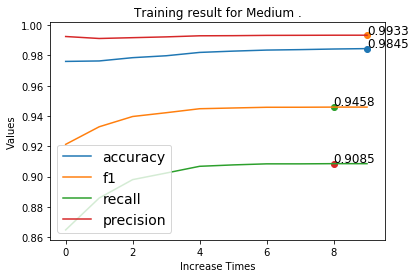

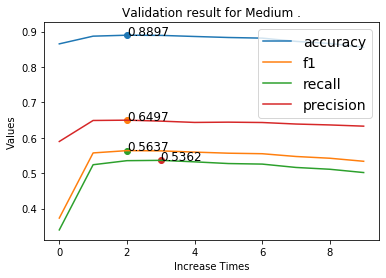

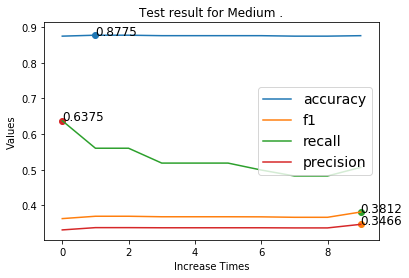

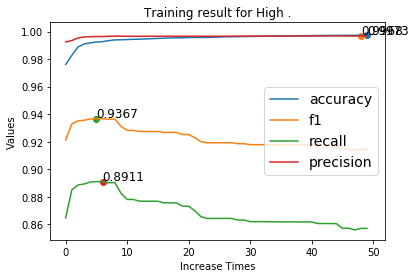

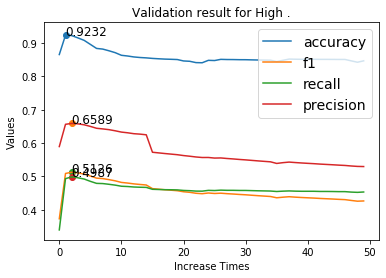

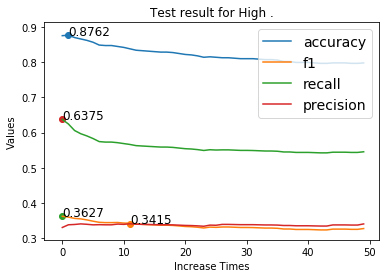

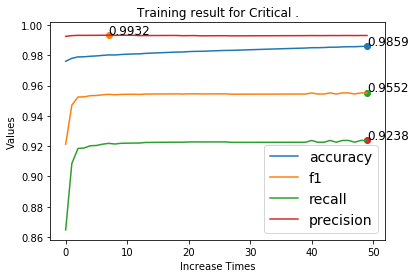

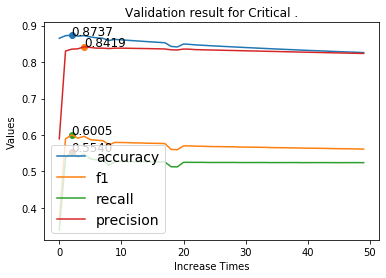

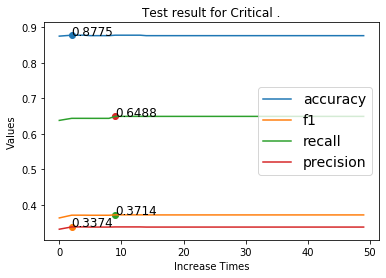

In [ ]:
location = 'NY'
phases = ['Training','Validation','Test']
for category in categories:
  if category == 'Low':
    continue
  for phase in phases:
    if phase == 'Training':
      plot_metrics_Upsample_priority(location,train_record,category,phase)
    elif phase == 'Validation':
      plot_metrics_Upsample_priority(location,val_record,category,phase)
    else:
      plot_metrics_Upsample_priority(location,test_record,category,phase)

#### Search the best LR

In [ ]:
from sklearn.model_selection import cross_validate, RandomizedSearchCV, KFold
import copy
def search_best_lR_priority(increaseTimes,location):
  
  
  # iterate over a range of increaseTime and all category

  # store the best parameter for each increaseTime
  metrics_all = {'f1_best_all': defaultdict(),'best_paras': defaultdict()}
  best_parameters_all = defaultdict()
  cv_score_all = defaultdict()
  test_scores_all = defaultdict()
  for increaseTime in range(0,increaseTimes):
    metrics_one_run = {'f1_best_each_cate': defaultdict()}
    best_parameters_one_run = defaultdict()
    cv_score_one_run = defaultdict()
    print("Performing grid search on IncreaseTime %d" %(increaseTime))
    for category in categories:
      if category == 'Low':
        continue

      if category == 'Medium' and increaseTime != 5:
        continue

      if category == 'High' and increaseTime != 6:
        continue

      if category == 'Critical' and increaseTime != 4:
        continue

      print("Performing grid search on category %s" %(category))
      # df_tmp = pd.read_csv('cache/'+location+'/upsampleData_'+str(category)+'_'+str(increaseTime)+'.csv')
      # trainF = {'full_text':df_tmp['full_text'], 'hashtags': df_tmp['hashtags'], 'favorite_count': df_tmp['favorite_count']}
      # trainL = list(df_tmp['target'])

      # step 1: build up-sample training set
      global trainF, trainL, testF, testL
      trainSet_temp = copy.deepcopy(trainF)
      label_temp = copy.deepcopy(trainL)
      
      # print('Before length %d'%(len(label_temp)))
      idxs = np.where(np.array(label_temp) == category)[0]
      # print('There are %d postitive sample in this category.'%(len(idxs)))
      
      for idx in list(idxs):
        # Duplicate (increaseTime) times
        for j in range(increaseTime):
          trainSet_temp['hashtags'].append(trainSet_temp['hashtags'][idx])
          trainSet_temp['full_text'].append(trainSet_temp['full_text'][idx])
          trainSet_temp['favorite_count'].append(trainSet_temp['favorite_count'][idx])
          label_temp.append(category)
      trainF = trainSet_temp
      trainL = label_temp
      # build the training set for feature union and gridSerachCV
      trainF_tmp = []
      testF_tmp = []
      for i in range(len(trainF['full_text'])):
        trainF_tmp.append({'full_text':trainF['full_text'][i],'hashtags':trainF['hashtags'][i],
                          'favorite_count':trainF['favorite_count'][i]})
      for i in range(len(testF['full_text'])):
        testF_tmp.append({'full_text':testF['full_text'][i],'hashtags':testF['hashtags'][i],
                          'favorite_count':testF['favorite_count'][i]})
      
      fu = FeatureUnion([('full_text',Pipeline([('selector', ItemSelector_gridSearch(key='full_text')),('cv',count_vect),
                ])),
                ('hashtags',Pipeline([('selector', ItemSelector_gridSearch(key='hashtags')),
                    ('cv',count_vect),
                ])),
                ('favorite_count',Pipeline([('selector', numericalTransformer_gridSearch(key='favorite_count')),
                ])),
                ],n_jobs=-1)
      
      fullpipe = Pipeline([

                  ('fu', fu),
                  ('lr', LogisticRegression())
                 ])
            
      params = {
          # Fill in the parameter
          
          'fu__full_text__cv__ngram_range':[(1,2),(1,3),(1,4)],
          'fu__full_text__cv__binary': (True, False),
          'fu__full_text__cv__max_features': np.linspace(100,50000,100,dtype=int),
          'lr__penalty': ['l2'],
          'lr__C': np.linspace(0.000001,1000,100,dtype=float),
          'lr__class_weight': ['balanced'],
          'lr__solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
          'lr__max_iter': np.linspace(50,1000,100,dtype=int),
      }

      # Pass in your pipeline, params (to tune), scoring, and split parameters here!
      grid_search = RandomizedSearchCV(fullpipe,params,verbose=3,cv=3,n_iter=450, scoring='f1_macro', n_jobs=-1,pre_dispatch='2*n_jobs',)
      
      # print("pipeline:", [name for name, _ in pipe.steps])
      # print("parameters:")
      # print(params)
      #n_jobs=-1,pre_dispatch='2*n_jobs'
      # FILL IN HERE -- Fit grid_search on the combined train/validation data and labels.
      grid_search.fit(trainF_tmp, trainL)

      # evaluate the test result
      # testF_union_tmp = grid_search.transform(testF)

      predictions = grid_search.predict(testF_tmp)
      precision = precision_score(predictions, testL, average='macro' )
      recall = recall_score(predictions, testL, average='macro')
      accuracy = accuracy_score(predictions, testL)
      f1 = fbeta_score(predictions, testL, 1, average='macro')

      test_scores = {'accuracy': accuracy,'precision': precision,'f1':f1,'recall': recall}
      print("Test result:", test_scores)

      print('type')
      print(type(trainL[0]))
      print("Best score: %0.3f" % grid_search.best_score_)
      # print("Best parameters set:")
      best_parameters = grid_search.best_estimator_.get_params()
      parameters_dict = {}
      for param_name in sorted(params.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))
        parameters_dict[param_name] = best_parameters[param_name]


      metrics_one_run['f1_best_each_cate'][category] = grid_search.best_score_
      cv_score_one_run[category] = grid_search.cv_results_
      best_parameters_one_run[category] = parameters_dict
      print(best_parameters_one_run[category])
      test_scores_all[increaseTime] = {category: test_scores}

    best_parameters_all[increaseTime] = best_parameters_one_run
    metrics_all['f1_best_all'][increaseTime] = metrics_one_run
    cv_score_all[increaseTime] = best_parameters_one_run
  return metrics_all, best_parameters_all, cv_score_all

In [ ]:
location = 'NY'
metrics_all, best_parameters_all, cv_score_all = search_best_lR_priority(45,location)

Performing grid search on IncreaseTime 0
Performing grid search on IncreaseTime 1
Performing grid search on IncreaseTime 2
Performing grid search on IncreaseTime 3
Performing grid search on IncreaseTime 4
Performing grid search on category Critical
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 24.8min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 34.8min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 40.9min finished
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From

Test result: {'accuracy': 0.810918774966711, 'precision': 0.3761213462535391, 'f1': 0.36565506668756215, 'recall': 0.35780773865549415}
type
<class 'str'>
Best score: 0.596
	fu__full_text__cv__binary: False
	fu__full_text__cv__max_features: 16733
	fu__full_text__cv__ngram_range: (1, 2)
	lr__C: 555.555556
	lr__class_weight: 'balanced'
	lr__max_iter: 4170
	lr__penalty: 'l2'
	lr__solver: 'newton-cg'
{'fu__full_text__cv__binary': False, 'fu__full_text__cv__max_features': 16733, 'fu__full_text__cv__ngram_range': (1, 2), 'lr__C': 555.555556, 'lr__class_weight': 'balanced', 'lr__max_iter': 4170, 'lr__penalty': 'l2', 'lr__solver': 'newton-cg'}
Performing grid search on IncreaseTime 5
Performing grid search on category Medium
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 14.1min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 22.1min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 34.1min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 41.3min finished
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 conc

Test result: {'accuracy': 0.8255659121171771, 'precision': 0.35885133787933166, 'f1': 0.3588175833890554, 'recall': 0.5592190205111652}
type
<class 'str'>
Best score: 0.778
	fu__full_text__cv__binary: False
	fu__full_text__cv__max_features: 16733
	fu__full_text__cv__ngram_range: (1, 2)
	lr__C: 595.9595963636364
	lr__class_weight: 'balanced'
	lr__max_iter: 6884
	lr__penalty: 'l2'
	lr__solver: 'newton-cg'
{'fu__full_text__cv__binary': False, 'fu__full_text__cv__max_features': 16733, 'fu__full_text__cv__ngram_range': (1, 2), 'lr__C': 595.9595963636364, 'lr__class_weight': 'balanced', 'lr__max_iter': 6884, 'lr__penalty': 'l2', 'lr__solver': 'newton-cg'}
Performing grid search on IncreaseTime 6
Performing grid search on category High
Fitting 3 folds for each of 450 candidates, totalling 1350 fits


[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 256 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 36.9min
[Parallel(n_jobs=-1)]: Done 1120 tasks      | elapsed: 52.7min
[Parallel(n_jobs=-1)]: Done 1350 out of 1350 | elapsed: 63.5min finished


Test result: {'accuracy': 0.8801597869507324, 'precision': 0.33420145950472546, 'f1': 0.35959335345796434, 'recall': 0.6438061938061939}
type
<class 'str'>
Best score: 0.895
	fu__full_text__cv__binary: True
	fu__full_text__cv__max_features: 47983
	fu__full_text__cv__ngram_range: (1, 3)
	lr__C: 424.2424248181818
	lr__class_weight: 'balanced'
	lr__max_iter: 6884
	lr__penalty: 'l2'
	lr__solver: 'liblinear'
{'fu__full_text__cv__binary': True, 'fu__full_text__cv__max_features': 47983, 'fu__full_text__cv__ngram_range': (1, 3), 'lr__C': 424.2424248181818, 'lr__class_weight': 'balanced', 'lr__max_iter': 6884, 'lr__penalty': 'l2', 'lr__solver': 'liblinear'}
Performing grid search on IncreaseTime 7
Performing grid search on IncreaseTime 8
Performing grid search on IncreaseTime 9
Performing grid search on IncreaseTime 10
Performing grid search on IncreaseTime 11
Performing grid search on IncreaseTime 12
Performing grid search on IncreaseTime 13
Performing grid search on IncreaseTime 14
Performing

c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  warnings.warn("Pass {} as keyword args. From version 0.25 "


### Build state of the art classifier

In [ ]:

                  
location = 'DC'
from sklearn.linear_model import LogisticRegression
count_vect_priority = CountVectorizer(tokenizer=tokenize_normalize,binary=True,max_features=47983,ngram_range=(1,3))
best_lr_priority = LogisticRegression(C=424.24242,class_weight='balanced',max_iter=6884,penalty='l2',solver='liblinear')

increaseTime_priority = 6
category_priority = 'High'
best_lr_priority, pipe_priority, fu_priority, testF_union_priority, errors_idxs_priority, all_errors_priority = build_best_lr_priority(best_lr_priority, count_vect_priority, category_priority, increaseTime_priority, trainF, trainL, testF, testL)



Display result without up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.956049 test_precision_macro=0.451993 test_f1_macro=0.357455 test_recall_macro=0.351515 .

Cross validation: Average validation set result: train_accuracy=0.999429 train_precision_macro=0.999801 train_f1_macro=0.996887 train_recall_macro=0.994040 .

Test result: {'accuracy': 0.964095744680851, 'precision': 0.35185185185185186, 'f1': 0.3623193577163247, 'recall': 0.6546826453617399}
              precision    recall  f1-score   support

        High     0.0000    0.0000    0.0000         0
         Low     1.0000    0.9640    0.9817       751
      Medium     0.0556    1.0000    0.1053         1

    accuracy                         0.9641       752
   macro avg     0.3519    0.6547    0.3623       752
weighted avg     0.9987    0.9641    0.9805       752

Display result with up-sampleing: 
Cross validation: Average training set result: test_accuracy=0.968361 test_precision_macro=0.788472

In [ ]:
build_default_lr_priority(best_lr_priority,category_priority, increaseTime_priority, trainF, trainL, testF, testL, more=[cv_train,trainL, cv_test, testL])

Display result without up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3205    0.7143    0.4425        35
         Low     0.9876    0.8894    0.9359       714
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8815       751
   macro avg     0.3470    0.6509    0.3816       751
weighted avg     0.9541    0.8815    0.9108       751

Display result with up-sampleing: 


c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.


Cross validation: Average training set result: test_accuracy=0.862939 test_precision_macro=0.516982 test_f1_macro=0.358438 test_recall_macro=0.332407 .

Cross validation: Average validation set result: train_accuracy=0.986008 train_precision_macro=0.994754 train_f1_macro=0.952350 train_recall_macro=0.916363 .

Test result: {'accuracy': 0.881491344873502, 'precision': 0.34701778522151777, 'f1': 0.38162850311590696, 'recall': 0.6509103641456583}
              precision    recall  f1-score   support

    Critical     0.0000    0.0000    0.0000         0
        High     0.3205    0.7143    0.4425        35
         Low     0.9876    0.8894    0.9359       714
      Medium     0.0800    1.0000    0.1481         2

    accuracy                         0.8815       751
   macro avg     0.3470    0.6509    0.3816       751
weighted avg     0.9541    0.8815    0.9108       751



c:\users\longkuku\sp\env\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\users\longkuku\sp\env\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\users\longkuku\sp\env\lib\site-packages\sklearn\utils\validation.py:68: FutureWarning: Pass beta=1 as keyword args. From version 0.25 passing these as positional arguments will result in an

#### Plot confusion matrix

20


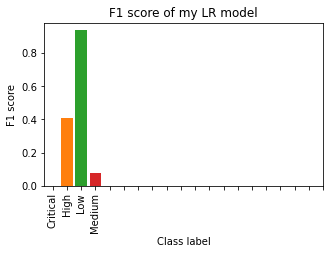

In [ ]:
#  Plot a bar chart graph with the F1 score for each class - (subreddit on x-axis, F1 score on Y axis)
import matplotlib.pyplot as plt
import numpy as np
result_logis = classification_report(best_lr_priority.predict(testF_union_priority), testL, digits=3)
result_logis = result_logis.split()
f1_classlabel = result_logis[4:-15:5]
print(len(result_logis[4:-15]))
f1_each = result_logis[7:-15:5]
plt.figure(figsize=(5, 3))
for i in range(4):
    plt.bar(i,float(f1_each[i]))

plt.title('F1 score of my LR model')
plt.xticks(np.arange(20),f1_classlabel,rotation=90)
plt.ylabel('F1 score')
plt.xlabel('Class label')
plt.savefig('barGraph.png',dpi=200,bbox_inches='tight')
plt.show()

In [ ]:
from sklearn.metrics import plot_confusion_matrix
def plotCM(title,classifier,X_test, y_test):
    fig,ax = plt.subplots(figsize=(5,5))
    disp = plot_confusion_matrix(classifier, X_test, y_test,
                                     xticks_rotation='vertical',
                                     cmap=plt.cm.Blues,ax=ax,
                                     normalize='true')
    
    disp.ax_.set_title(title)
    plt.savefig(title+'_'+'CM'+'_'+'priority'+'.png',dpi=200,bbox_inches='tight')

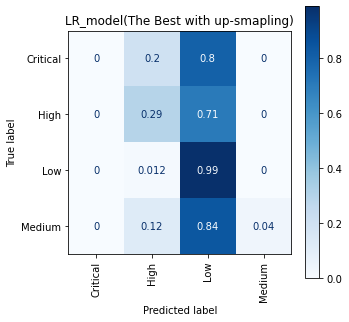

In [ ]:
#plot the confusion matrix for the best model
plotCM('LR_model(The Best with up-smapling)',best_lr_priority,testF_union_priority,testL)

### Error analysis

In [ ]:
import eli5
from eli5.lime import TextExplainer
eli5.show_weights(best_lr_priority, feature_names=fu_priority.get_feature_names(), top=(30,30))

CountVectorizer
CountVectorizer


In [ ]:
all_errors_priority

,index,true_label,prediction,full_text,hashtags,favorite_count
0,0,High,Low,New York reports 15 cases of rare illness in c...,,0
1,2,High,Low,Coronavirus deaths in New York state break 500...,,0
2,11,Medium,High,Samaritan's Purse NYC field hospital already t...,,0
3,15,Critical,High,"BREAKING NEWS: Trump to quarantine New York, C...",,0
4,31,Medium,Low,This is an ominous story. https://t.co/hLueyPXLLz,,1
...,...,...,...,...,...,...
87,686,High,Low,@ImMrMeeseeksLo4 @FulkKendall @AOC We don't kn...,,0
88,688,Medium,Low,"Trend and Turning Point of #Covid_19 (NYC, #n...",Covid_19 nyccoronavirus uscoronavirus,0
89,691,Low,High,New York congresswoman 'felt so helpless' afte...,,0
90,693,High,Low,@LevineJonathan NY is experiencing what it is ...,coronavirus,0


In [ ]:
all_errors_priority[all_errors_priority.true_label=='Critical']


,index,true_label,prediction,full_text,hashtags,favorite_count
3,15,Critical,High,"BREAKING NEWS: Trump to quarantine New York, C...",,0
29,177,Critical,Low,"""In the coming days, you're going to see peopl...",NotABigDeal UnderControl Trump,2
52,328,Critical,Low,NY is being overwhelmed.\n“A supervisor urged ...,,0
59,396,Critical,Low,New York mayor pleads for help as U.S. coronav...,,2
91,739,Critical,Low,"Scenes of ""catastrophe"" as New York hospitals ...",,0


In [ ]:
all_errors_priority.true_label.value_counts()

High        55
Medium      24
Low          8
Critical     5
Name: true_label, dtype: int64

In [ ]:
def print_all_featrues_of_one_sample(sample,idx):
    for key in sample.keys():
        print(key,sample[key][idx])


In [ ]:
all_errors_priority.

In [ ]:
idx = 0
print(all_errors_priority.iloc[0])
print(all_errors_priority.full_text[0])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[0]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                             0
true_label                                                     High
prediction                                                      Low
full_text         New York reports 15 cases of rare illness in c...
hashtags                                                           
favorite_count                                                    0
Name: 0, dtype: object
New York reports 15 cases of rare illness in children possibly linked to Covid-19 https://t.co/SVIRdPFYuI
CountVectorizer
CountVectorizer


In [ ]:
idx = 1
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                             2
true_label                                                     High
prediction                                                      Low
full_text         Coronavirus deaths in New York state break 500...
hashtags                                                           
favorite_count                                                    0
Name: 1, dtype: object
Coronavirus deaths in New York state break 500, Gov. Andrew Cuomo extends school closures - https://t.co/zm4OKVoapc
CountVectorizer
CountVectorizer


In [ ]:
idx = 3
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                            15
true_label                                                 Critical
prediction                                                     High
full_text         BREAKING NEWS: Trump to quarantine New York, C...
hashtags                                                           
favorite_count                                                    0
Name: 3, dtype: object
BREAKING NEWS: Trump to quarantine New York, Connecticut, New Jersey https://t.co/1frpoouIPF @MailOnline
CountVectorizer
CountVectorizer


In [ ]:
idx = 29
print(all_errors_priority.iloc[idx])
print(all_errors_priority.full_text[idx])
eli5.show_prediction(best_lr_priority, testF_union_priority[errors_idxs_priority[idx]], feature_names=fu_priority.get_feature_names(), top=(50,20))


index                                                           177
true_label                                                 Critical
prediction                                                      Low
full_text         "In the coming days, you're going to see peopl...
hashtags                            NotABigDeal UnderControl Trump 
favorite_count                                                    2
Name: 29, dtype: object
"In the coming days, you're going to see people die who did not need to die." Bill deBlasio on NYC ventilator shortage. For Breitbart peeps, this means all ventilators in the state stockpile already have been deployed.
#NotABigDeal #UnderControl #Trump 
https://t.co/zCk6IH7IzW
CountVectorizer
CountVectorizer
